Hello Edwin!

I’m happy to review your project today.
I will mark your mistakes and give you some hints how it is possible to fix them. We are getting ready for real job, where your team leader/senior colleague will do exactly the same. Don't worry and study with pleasure! 

Below you will find my comments - **please do not move, modify or delete them**.

You can find my comments in green, yellow or red boxes like this:

<div class="alert alert-block alert-success">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Success. Everything is done succesfully.
</div>

<div class="alert alert-block alert-warning">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Remarks. Some recommendations.
</div>

<div class="alert alert-block alert-danger">

<b>Reviewer's comment</b> <a class="tocSkip"></a>

Needs fixing. The block requires some corrections. Work can't be accepted with the red comments.
</div>

You can answer me by using this:

<div class="alert alert-block alert-info">
<b>Student answer.</b> <a class="tocSkip"></a>

Thank you so much for the feedback, I appreacaite it! I should have double checked before submitting. Thanks! 
</div>


<div class="alert alert-block alert-success">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

You did a great job! Almost everything is correct. But there are several places you need to fix. You can find my comments for the mistakes below.

</div>

# Final Project: Solution Code

The goal of this project is to create a model for telecom operator Interconnect. This models purpose will be to predict when customers are going to churn so that the company can offer them promotional codes and special plan options to persuade them to stay. To achieve this goal 4 datasets have been provided with customer information and habits with the company that will be used to train the model. 

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import OrdinalEncoder
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score, accuracy_score
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline

import catboost as cb
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier

## Download the data and preprocessing

In [2]:
contract = pd.read_csv('/datasets/final_provider/contract.csv')
display(contract.head())
contract.info()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


In [3]:
contract[contract['TotalCharges']== ' ']

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
488,4472-LVYGI,2020-02-01,No,Two year,Yes,Bank transfer (automatic),52.55,
753,3115-CZMZD,2020-02-01,No,Two year,No,Mailed check,20.25,
936,5709-LVOEQ,2020-02-01,No,Two year,No,Mailed check,80.85,
1082,4367-NUYAO,2020-02-01,No,Two year,No,Mailed check,25.75,
1340,1371-DWPAZ,2020-02-01,No,Two year,No,Credit card (automatic),56.05,
3331,7644-OMVMY,2020-02-01,No,Two year,No,Mailed check,19.85,
3826,3213-VVOLG,2020-02-01,No,Two year,No,Mailed check,25.35,
4380,2520-SGTTA,2020-02-01,No,Two year,No,Mailed check,20.00,
5218,2923-ARZLG,2020-02-01,No,One year,Yes,Mailed check,19.70,
6670,4075-WKNIU,2020-02-01,No,Two year,No,Mailed check,73.35,


In [4]:
display((contract['EndDate'] == 'No').sum())
display(len(contract['EndDate']) - (contract['EndDate'] == 'No').sum())
len(contract[contract['EndDate'] == 'No']) / len(contract['EndDate'])

5174

1869

0.7346301292063041

### Contract data
- Change column names to lowercase and underscore format
- Change BeginDate to datetime type 
- Change TotalCharges to float type
- Balance EndDate

In [5]:
#preprocessing for contract data
#converting column names
contract = contract.rename(columns={'customerID' : 'customer_id', 'BeginDate' : 'begin_date', 'EndDate' : 'end_date', 'Type' : 'contract_type', 'PaperlessBilling' : 'paperless_billing', 'PaymentMethod' : 'payment_method', 'MonthlyCharges' : 'monthly_charges', 'TotalCharges' : 'total_charges'})
#changing begin_date to datetime
contract['begin_date'] = pd.to_datetime(contract['begin_date'], format='%Y-%m-%d')
#changing totalcharges to float
contract['total_charges'] = pd.to_numeric(contract['total_charges'], errors='coerce')
contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   object        
 3   contract_type      7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
dtypes: datetime64[ns](1), float64(2), object(5)
memory usage: 440.3+ KB


In [6]:
contract['total_charges'] = contract['total_charges'].fillna(0)
contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   object        
 3   contract_type      7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
dtypes: datetime64[ns](1), float64(2), object(5)
memory usage: 440.3+ KB


the missing values in total_charges were from customers who hadn't been with the company long enough to be charged yet thus not having data for a total charge

<div class="alert alert-block alert-warning">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Could you explain why did you fill NaNs in this column with zero? Usually, NaNs in numerical columns are filled with the most probable values, for example, means of medians. If you want to fill them with something else, you should have an explanation for your choice. So, please, explain why zero is better than mean/median. But if you don't have an explanation it's better to change 0 with mean/median.

</div>

In [7]:
personal = pd.read_csv('/datasets/final_provider/personal.csv')
display(personal.head())
personal.info()

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


### Personal data
- Change column names to lowercase and underscore format

In [8]:
### Convert column names
personal = personal.rename(columns={'customerID' : 'customer_id','gender' : 'gender_male' , 'SeniorCitizen' : 'senior_citizen', 'Partner' : 'partner', 'Dependents' : 'dependents'})
personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender_male     7043 non-null   object
 2   senior_citizen  7043 non-null   int64 
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [9]:
internet = pd.read_csv('/datasets/final_provider/internet.csv')
display(internet.head())
internet.info()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


### Internet data
- Change column names to lowercase and underscore format

In [10]:
### Convert column names
internet = internet.rename(columns={'customerID' : 'customer_id','InternetService' : 'internet_service' , 'OnlineSecurity' : 'online_security', 'OnlineBackup' : 'online_backup', 'DeviceProtection' : 'device_protection', 'TechSupport' : 'tech_support', 'StreamingTV' : 'streaming_tv', 'StreamingMovies' : 'streaming_movies'})
internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   object
 3   online_backup      5517 non-null   object
 4   device_protection  5517 non-null   object
 5   tech_support       5517 non-null   object
 6   streaming_tv       5517 non-null   object
 7   streaming_movies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [11]:
phone = pd.read_csv('/datasets/final_provider/phone.csv')
display(phone.head())
phone.info()

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


### Phone data
- Change column names to lowercase and underscore format

In [12]:
### Convert column names to snake_script
phone = phone.rename(columns={'customerID' : 'customer_id','MultipleLines' : 'multiple_lines'})
phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [13]:
#Merging the data into one dataframe
df = contract.merge(personal, on='customer_id', how='outer')
df = df.merge(internet, on='customer_id', how='outer')
df = df.merge(phone, on='customer_id', how='outer')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   object        
 3   contract_type      7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   gender_male        7043 non-null   object        
 9   senior_citizen     7043 non-null   int64         
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   5517 non-null   object        
 13  online_security    5517 non-null   object        
 14  online_b

In [14]:
#dropping customer_id
df = df.drop('customer_id', axis=1)
#filling missing values
df = df.fillna('No')
df.info()
display(df.sample(10))


<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   begin_date         7043 non-null   datetime64[ns]
 1   end_date           7043 non-null   object        
 2   contract_type      7043 non-null   object        
 3   paperless_billing  7043 non-null   object        
 4   payment_method     7043 non-null   object        
 5   monthly_charges    7043 non-null   float64       
 6   total_charges      7043 non-null   float64       
 7   gender_male        7043 non-null   object        
 8   senior_citizen     7043 non-null   int64         
 9   partner            7043 non-null   object        
 10  dependents         7043 non-null   object        
 11  internet_service   7043 non-null   object        
 12  online_security    7043 non-null   object        
 13  online_backup      7043 non-null   object        
 14  device_p

,begin_date,end_date,contract_type,paperless_billing,payment_method,monthly_charges,total_charges,gender_male,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
5432,2019-11-01,2020-01-01 00:00:00,Month-to-month,No,Electronic check,76.40,160.80,Female,0,No,No,DSL,No,No,Yes,Yes,Yes,Yes,No
2521,2016-12-01,2019-12-01 00:00:00,Month-to-month,Yes,Credit card (automatic),85.25,3132.75,Male,1,Yes,No,Fiber optic,No,No,No,No,No,Yes,Yes
720,2019-12-01,No,One year,No,Mailed check,20.20,34.75,Male,0,Yes,Yes,No,No,No,No,No,No,No,No
2789,2018-02-01,No,Month-to-month,Yes,Credit card (automatic),88.95,2072.75,Female,0,No,No,Fiber optic,No,No,Yes,No,Yes,No,Yes
6207,2016-01-01,2019-11-01 00:00:00,Month-to-month,No,Electronic check,85.00,3969.40,Male,1,No,No,Fiber optic,Yes,No,No,No,No,Yes,No
2904,2017-12-01,2020-01-01 00:00:00,Month-to-month,No,Mailed check,70.95,1767.35,Male,0,No,No,Fiber optic,No,No,No,No,No,No,No
4063,2019-03-01,2020-01-01 00:00:00,Month-to-month,Yes,Electronic check,94.85,953.45,Female,0,No,No,Fiber optic,No,Yes,Yes,No,No,Yes,Yes
6905,2017-08-01,No,Month-to-month,Yes,Electronic check,44.50,1307.80,Male,0,No,Yes,DSL,No,No,No,No,Yes,Yes,No
2201,2017-02-01,No,One year,No,Bank transfer (automatic),85.85,3003.55,Female,0,No,No,DSL,Yes,Yes,Yes,Yes,Yes,Yes,No
3302,2017-05-01,2019-12-01 00:00:00,One year,Yes,Electronic check,103.45,3066.45,Male,0,No,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Yes


In [15]:
#converting the individual dates into binary categories yes and no
df['end_date'] = df['end_date'].where(df['end_date'] == 'No', 'Yes')
df['end_date'].value_counts()

No     5174
Yes    1869
Name: end_date, dtype: int64

First, I converted all column names to snake_script for every dataset as well as filled in missing value in contract total_charges column. Then I merged all the datasets together into one dataframe df and filled in the missing values that occured from the merge with 'No' simply stating that customers with missing values hadn't signed up for that specific service. Finally, I turned the dates in end_date into 'Yes' to better fit with the No's as the dates themselves aren't needed and this will make label encoding easier.

## EDA

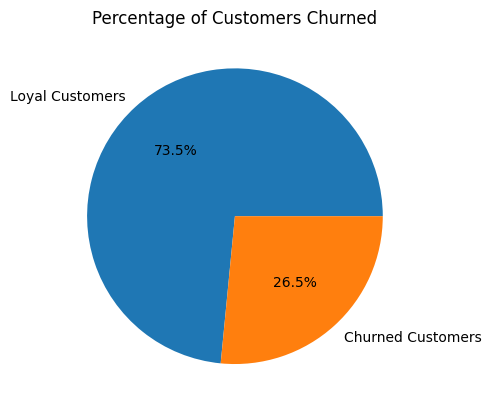

In [16]:
labels = ['Loyal Customers', 'Churned Customers']
fig, ax = plt.subplots()
ax.pie(df['end_date'].value_counts(), labels=labels, autopct='%1.1f%%')
plt.title('Percentage of Customers Churned')
plt.show()

We can see here that there is a clear class imbalance that will need to be handled before model training.

In [17]:
seasonality_check = pd.read_csv(
    '/datasets/final_provider/contract.csv', index_col=[1], parse_dates=[1]
)
seasonality_check['EndDate'] = seasonality_check['EndDate'].where(seasonality_check['EndDate'] == 'No', 'Yes')
seasonality_check= seasonality_check.drop(['customerID','Type','PaperlessBilling','PaymentMethod','MonthlyCharges','TotalCharges'], axis=1)
seasonality_check['EndDate'] = np.where(seasonality_check['EndDate'] == 'No', 0, 1) #0 = No 1= yes
seasonality_check.sort_index(inplace=True)
display(seasonality_check.info())
seasonality_check.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7043 entries, 2013-10-01 to 2020-02-01
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   EndDate  7043 non-null   int64
dtypes: int64(1)
memory usage: 110.0 KB


None

,EndDate
BeginDate,
2013-10-01,1
2013-10-01,1
2013-10-01,1
2013-11-01,1
2013-11-01,1


In [18]:
seasonality_check.index.is_monotonic

True

In [19]:
seasonality_check = seasonality_check.resample('1M').sum()
seasonality_check.head()

,EndDate
BeginDate,
2013-10-31,3
2013-11-30,2
2013-12-31,3
2014-01-31,7
2014-02-28,10


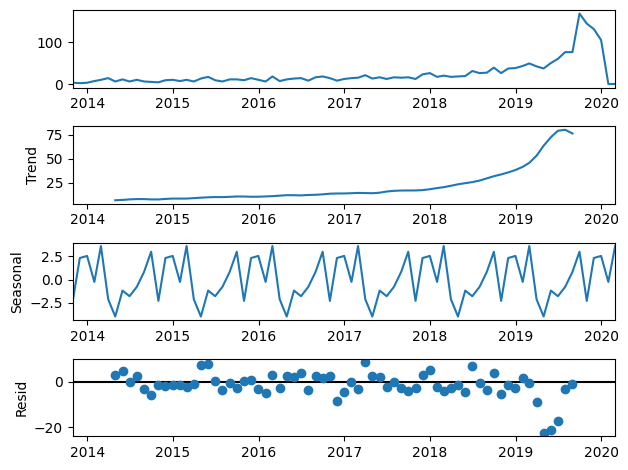

In [20]:
decomposition = seasonal_decompose(seasonality_check)
decomposition.plot()
plt.show()

/tmp/ipykernel_148/4021123536.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['rolling_mean'] = df_year.rolling(2).mean()


<AxesSubplot:xlabel='BeginDate'>

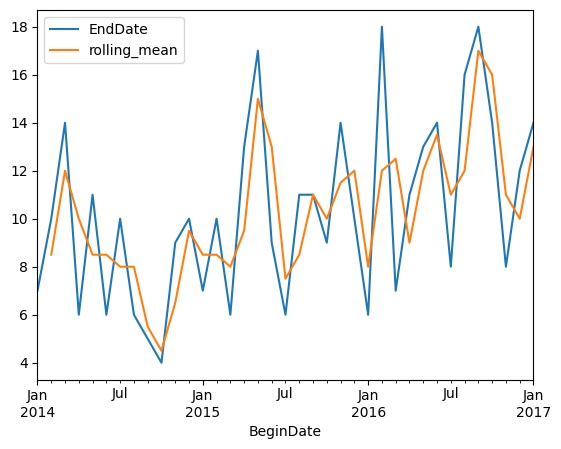

In [21]:
df_year = seasonality_check['2014-01-31':'2017-01-31']
df_year['rolling_mean'] = df_year.rolling(2).mean()
df_year.plot()

data shows some seasonality with people that joined toward the beginning and end of every year more likely to leave

## Feature Engineering

In [22]:
df['begin_month'] = df['begin_date'].dt.month
df.head()

,begin_date,end_date,contract_type,paperless_billing,payment_method,monthly_charges,total_charges,gender_male,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,begin_month
0,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,No,1
1,2017-04-01,No,One year,No,Mailed check,56.95,1889.50,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No,4
2,2019-10-01,Yes,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No,10
3,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,No,5
4,2019-09-01,Yes,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No,9


In [23]:
#label encoding
encoder = OrdinalEncoder()
data = pd.DataFrame(encoder.fit_transform(df), columns=df.columns)
data['monthly_charges'] = df['monthly_charges']
data['total_charges'] = df['total_charges']
data['begin_month'] = df['begin_month']
data['senior_citizen'] = df['senior_citizen']
display(data.info())
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   begin_date         7043 non-null   float64
 1   end_date           7043 non-null   float64
 2   contract_type      7043 non-null   float64
 3   paperless_billing  7043 non-null   float64
 4   payment_method     7043 non-null   float64
 5   monthly_charges    7043 non-null   float64
 6   total_charges      7043 non-null   float64
 7   gender_male        7043 non-null   float64
 8   senior_citizen     7043 non-null   int64  
 9   partner            7043 non-null   float64
 10  dependents         7043 non-null   float64
 11  internet_service   7043 non-null   float64
 12  online_security    7043 non-null   float64
 13  online_backup      7043 non-null   float64
 14  device_protection  7043 non-null   float64
 15  tech_support       7043 non-null   float64
 16  streaming_tv       7043 

None

,begin_date,end_date,contract_type,paperless_billing,payment_method,monthly_charges,total_charges,gender_male,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,begin_month
0,75.0,0.0,0.0,1.0,2.0,29.85,29.85,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1
1,42.0,0.0,1.0,0.0,3.0,56.95,1889.50,1.0,0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4
2,72.0,1.0,0.0,1.0,3.0,53.85,108.15,1.0,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,10
3,31.0,0.0,1.0,0.0,0.0,42.30,1840.75,1.0,0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,5
4,71.0,1.0,0.0,1.0,2.0,70.70,151.65,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9


<div class="alert alert-block alert-danger">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

We never encode numerical features. Only categorical features should be encoded. If you encode numerical features, you lose a lot of useful information from these features. So, please, fix it. 

</div>

<div class="alert alert-block alert-info">
<b>Student answer.</b> <a class="tocSkip"></a>

My bad I didn't catch that! I couldn't figure out how to directly ignore the numerical so I just set them back to their old values using the not encoded dataframe.
</div>


<div class="alert alert-block alert-success">
<b>Reviewer's comment V2</b> <a class="tocSkip"></a>

Okay, it is possible to solve this problem in such way. But it's better to apply encoder only to categorical features and then save the result back to the dataframe.

</div>

Label Encoding is best for Tree type models

In [24]:
#splitting the data
target = data['end_date']
features = data.drop(['end_date', 'begin_date'], axis=1) 
features_train_valid, features_test, target_train_valid, target_test = train_test_split(
    features, target,test_size=0.25, random_state=12345)
features_train, features_valid, target_train, target_valid = train_test_split(features_train_valid,target_train_valid, test_size=0.25, random_state=12345)

In [25]:
#feature scaling
numeric = ['monthly_charges','total_charges']
pd.options.mode.chained_assignment = None
scaler = StandardScaler()
scaler.fit(features_train[numeric])
features_train[numeric] = scaler.transform(features_train[numeric])
features_valid[numeric] = scaler.transform(features_valid[numeric])
features_test[numeric] = scaler.transform(features_test[numeric])

In [26]:
#upsampling function
def upsample(features, target, repeat):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_upsampled = pd.concat([features_zeros] + [features_ones] * repeat)
    target_upsampled = pd.concat([target_zeros] + [target_ones] * repeat)

    features_upsampled, target_upsampled = shuffle(
        features_upsampled, target_upsampled, random_state=12345
    )

    return features_upsampled, target_upsampled


In [27]:
#upsampling
features_upsampled, target_upsampled = upsample(
    features_train, target_train, 3
)
target_upsampled.value_counts()

1.0    3087
0.0    2932
Name: end_date, dtype: int64

I label encoded the categorical features as it is the better one-hot encoding method for Tree models than get_dummies then i split the data to prepare for scaling and finally upsampling.

## Training Models

In [28]:
model = RandomForestClassifier(random_state=12345)
model.fit(features_upsampled, target_upsampled)
predicted_valid = model.predict(features_valid)

print('roc:', roc_auc_score(target_valid, predicted_valid))

roc: 0.7708909106514463


In [29]:
#tuning for LightGBM
lgb_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.01],
    'num_leaves': [31, 64, 127],
    'max_depth': [1, 3, 10],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}
#grid search
lgbm = lgb.LGBMClassifier(objective='binary', metric='auc', random_state=12345)
grid = GridSearchCV(lgbm, lgb_params, cv=5, scoring='roc_auc')

grid.fit(features_upsampled, target_upsampled)
print(f'Best parameters:{grid.best_params_}')
print(f'Best score:{grid.best_score_}')

Best parameters:{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 300, 'num_leaves': 127, 'subsample': 0.8}
Best score:0.9876994864828019


In [30]:
#lgb grid testing on valid set
grid_predict = grid.predict_proba(features_valid)
grid_predict_one = grid_predict[:, 1]
roc_auc_score(target_valid, grid_predict_one)

0.8828312305095414

In [31]:
cb_params = {
    'verbose':[10,50,100],
    'iterations':[300, 1000, 2500],
    'learning_rate': [0.1, 0.01],
    'num_leaves': [31, 64, 127],
    'max_depth': [1, 3, 7],
    'l2_leaf_reg': [2, 10],
    'subsample': [0.8, 1.0],
    'random_strength': [0,10]
}
cb = CatBoostClassifier(loss_function="Logloss", random_seed=12345, eval_metric='AUC')
cb_grid = GridSearchCV(cb, cb_params, cv=5, scoring='roc_auc')
cb_grid.fit(features_upsampled, target_upsampled)

0:	total: 46.6ms	remaining: 13.9s
10:	total: 51.9ms	remaining: 1.36s
20:	total: 57.2ms	remaining: 760ms
30:	total: 62.5ms	remaining: 542ms
40:	total: 67.8ms	remaining: 428ms
50:	total: 73.1ms	remaining: 357ms
60:	total: 78.4ms	remaining: 307ms
70:	total: 83.6ms	remaining: 270ms
80:	total: 88.9ms	remaining: 240ms
90:	total: 94.2ms	remaining: 216ms
100:	total: 99.7ms	remaining: 196ms
110:	total: 105ms	remaining: 179ms
120:	total: 112ms	remaining: 165ms
130:	total: 117ms	remaining: 151ms
140:	total: 123ms	remaining: 138ms
150:	total: 128ms	remaining: 126ms
160:	total: 133ms	remaining: 115ms
170:	total: 138ms	remaining: 104ms
180:	total: 144ms	remaining: 94.4ms
190:	total: 149ms	remaining: 85ms
200:	total: 154ms	remaining: 76ms
210:	total: 159ms	remaining: 67.2ms
220:	total: 165ms	remaining: 58.8ms
230:	total: 170ms	remaining: 50.8ms
240:	total: 175ms	remaining: 42.9ms
250:	total: 181ms	remaining: 35.2ms
260:	total: 186ms	remaining: 27.8ms
270:	total: 191ms	remaining: 20.4ms
280:	total: 19

0:	total: 1.03ms	remaining: 308ms
10:	total: 5.26ms	remaining: 138ms
20:	total: 9.25ms	remaining: 123ms
30:	total: 13.3ms	remaining: 115ms
40:	total: 17.1ms	remaining: 108ms
50:	total: 21ms	remaining: 103ms
60:	total: 25.1ms	remaining: 98.5ms
70:	total: 29.4ms	remaining: 94.8ms
80:	total: 33.3ms	remaining: 90ms
90:	total: 37.2ms	remaining: 85.5ms
100:	total: 41.2ms	remaining: 81.2ms
110:	total: 45.2ms	remaining: 77ms
120:	total: 49.2ms	remaining: 72.8ms
130:	total: 53.1ms	remaining: 68.6ms
140:	total: 57.1ms	remaining: 64.4ms
150:	total: 61.1ms	remaining: 60.3ms
160:	total: 65.1ms	remaining: 56.2ms
170:	total: 69.1ms	remaining: 52.1ms
180:	total: 73.1ms	remaining: 48ms
190:	total: 77ms	remaining: 44ms
200:	total: 81ms	remaining: 39.9ms
210:	total: 85ms	remaining: 35.8ms
220:	total: 88.8ms	remaining: 31.7ms
230:	total: 92.7ms	remaining: 27.7ms
240:	total: 96.7ms	remaining: 23.7ms
250:	total: 101ms	remaining: 19.6ms
260:	total: 105ms	remaining: 15.6ms
270:	total: 109ms	remaining: 11.6ms


0:	total: 864us	remaining: 258ms
10:	total: 6.03ms	remaining: 158ms
20:	total: 11ms	remaining: 147ms
30:	total: 16ms	remaining: 139ms
40:	total: 21.1ms	remaining: 133ms
50:	total: 26.3ms	remaining: 128ms
60:	total: 31.3ms	remaining: 123ms
70:	total: 36.4ms	remaining: 117ms
80:	total: 41.4ms	remaining: 112ms
90:	total: 46.5ms	remaining: 107ms
100:	total: 51.7ms	remaining: 102ms
110:	total: 57.1ms	remaining: 97.1ms
120:	total: 62.2ms	remaining: 92ms
130:	total: 67.5ms	remaining: 87ms
140:	total: 72.6ms	remaining: 81.9ms
150:	total: 77.8ms	remaining: 76.8ms
160:	total: 83ms	remaining: 71.7ms
170:	total: 88.2ms	remaining: 66.5ms
180:	total: 93.6ms	remaining: 61.6ms
190:	total: 98.9ms	remaining: 56.4ms
200:	total: 104ms	remaining: 51.3ms
210:	total: 110ms	remaining: 46.3ms
220:	total: 115ms	remaining: 41.2ms
230:	total: 120ms	remaining: 35.9ms
240:	total: 126ms	remaining: 30.7ms
250:	total: 131ms	remaining: 25.5ms
260:	total: 136ms	remaining: 20.3ms
270:	total: 141ms	remaining: 15.1ms
280:	

0:	total: 713us	remaining: 213ms
10:	total: 4.98ms	remaining: 131ms
20:	total: 8.9ms	remaining: 118ms
30:	total: 12.9ms	remaining: 112ms
40:	total: 16.8ms	remaining: 106ms
50:	total: 20.8ms	remaining: 101ms
60:	total: 24.8ms	remaining: 97.3ms
70:	total: 29.1ms	remaining: 94ms
80:	total: 33.4ms	remaining: 90.4ms
90:	total: 37.4ms	remaining: 86ms
100:	total: 41.5ms	remaining: 81.7ms
110:	total: 45.6ms	remaining: 77.7ms
120:	total: 49.6ms	remaining: 73.4ms
130:	total: 53.8ms	remaining: 69.4ms
140:	total: 57.9ms	remaining: 65.2ms
150:	total: 61.8ms	remaining: 61ms
160:	total: 65.9ms	remaining: 56.9ms
170:	total: 69.9ms	remaining: 52.7ms
180:	total: 73.9ms	remaining: 48.6ms
190:	total: 77.9ms	remaining: 44.4ms
200:	total: 81.9ms	remaining: 40.4ms
210:	total: 86ms	remaining: 36.3ms
220:	total: 90ms	remaining: 32.2ms
230:	total: 94ms	remaining: 28.1ms
240:	total: 97.8ms	remaining: 24ms
250:	total: 102ms	remaining: 19.9ms
260:	total: 106ms	remaining: 15.8ms
270:	total: 110ms	remaining: 11.7ms


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 961us	remaining: 287ms
10:	total: 8.56ms	remaining: 225ms
20:	total: 16ms	remaining: 213ms
30:	total: 23.7ms	remaining: 205ms
40:	total: 31.1ms	remaining: 197ms
50:	total: 38.6ms	remaining: 189ms
60:	total: 46ms	remaining: 180ms
70:	total: 53.7ms	remaining: 173ms
80:	total: 61ms	remaining: 165ms
90:	total: 68.5ms	remaining: 157ms
100:	total: 76.2ms	remaining: 150ms
110:	total: 83.7ms	remaining: 142ms
120:	total: 91.2ms	remaining: 135ms
130:	total: 99.7ms	remaining: 129ms
140:	total: 107ms	remaining: 121ms
150:	total: 114ms	remaining: 113ms
160:	total: 122ms	remaining: 105ms
170:	total: 130ms	remaining: 97.8ms
180:	total: 137ms	remaining: 90ms
190:	total: 144ms	remaining: 82.3ms
200:	total: 152ms	remaining: 74.7ms
210:	total: 159ms	remaining: 67ms
220:	total: 166ms	remaining: 59.5ms
230:	total: 174ms	remaining: 52ms
240:	total: 182ms	remaining: 44.5ms
250:	total: 189ms	remaining: 36.9ms
260:	total: 197ms	remaining: 29.4ms
270:	total: 205ms	remaining: 21.9ms
280:	total: 212ms	r

0:	total: 879us	remaining: 263ms
10:	total: 7.22ms	remaining: 190ms
20:	total: 13.4ms	remaining: 179ms
30:	total: 19.7ms	remaining: 171ms
40:	total: 25.8ms	remaining: 163ms
50:	total: 32.1ms	remaining: 157ms
60:	total: 38.4ms	remaining: 150ms
70:	total: 44.7ms	remaining: 144ms
80:	total: 51ms	remaining: 138ms
90:	total: 57.1ms	remaining: 131ms
100:	total: 63.4ms	remaining: 125ms
110:	total: 69.7ms	remaining: 119ms
120:	total: 75.9ms	remaining: 112ms
130:	total: 82.1ms	remaining: 106ms
140:	total: 88.4ms	remaining: 99.7ms
150:	total: 94.6ms	remaining: 93.4ms
160:	total: 101ms	remaining: 87.2ms
170:	total: 108ms	remaining: 81.1ms
180:	total: 114ms	remaining: 74.8ms
190:	total: 120ms	remaining: 68.4ms
200:	total: 126ms	remaining: 62.1ms
210:	total: 133ms	remaining: 56.1ms
220:	total: 139ms	remaining: 49.8ms
230:	total: 146ms	remaining: 43.6ms
240:	total: 152ms	remaining: 37.3ms
250:	total: 159ms	remaining: 31ms
260:	total: 165ms	remaining: 24.6ms
270:	total: 171ms	remaining: 18.3ms
280:	t

0:	total: 892us	remaining: 267ms
10:	total: 8.24ms	remaining: 216ms
20:	total: 15.3ms	remaining: 203ms
30:	total: 22.6ms	remaining: 196ms
40:	total: 29.6ms	remaining: 187ms
50:	total: 36.5ms	remaining: 178ms
60:	total: 43.7ms	remaining: 171ms
70:	total: 51ms	remaining: 165ms
80:	total: 58.2ms	remaining: 157ms
90:	total: 65.5ms	remaining: 150ms
100:	total: 72.8ms	remaining: 143ms
110:	total: 80.2ms	remaining: 137ms
120:	total: 87.8ms	remaining: 130ms
130:	total: 95.7ms	remaining: 123ms
140:	total: 103ms	remaining: 117ms
150:	total: 111ms	remaining: 109ms
160:	total: 118ms	remaining: 102ms
170:	total: 126ms	remaining: 94.9ms
180:	total: 134ms	remaining: 87.8ms
190:	total: 141ms	remaining: 80.6ms
200:	total: 150ms	remaining: 74.1ms
210:	total: 158ms	remaining: 66.6ms
220:	total: 165ms	remaining: 59.1ms
230:	total: 173ms	remaining: 51.6ms
240:	total: 180ms	remaining: 44.2ms
250:	total: 188ms	remaining: 36.7ms
260:	total: 197ms	remaining: 29.4ms
270:	total: 205ms	remaining: 21.9ms
280:	tota

0:	total: 672us	remaining: 201ms
10:	total: 7.1ms	remaining: 187ms
20:	total: 13ms	remaining: 172ms
30:	total: 19ms	remaining: 165ms
40:	total: 25.1ms	remaining: 158ms
50:	total: 31.1ms	remaining: 152ms
60:	total: 37ms	remaining: 145ms
70:	total: 43.2ms	remaining: 139ms
80:	total: 49.2ms	remaining: 133ms
90:	total: 55.1ms	remaining: 127ms
100:	total: 61.3ms	remaining: 121ms
110:	total: 67.6ms	remaining: 115ms
120:	total: 74ms	remaining: 109ms
130:	total: 80.4ms	remaining: 104ms
140:	total: 86.8ms	remaining: 97.8ms
150:	total: 93.2ms	remaining: 92ms
160:	total: 99.5ms	remaining: 85.9ms
170:	total: 106ms	remaining: 79.8ms
180:	total: 112ms	remaining: 73.9ms
190:	total: 119ms	remaining: 67.9ms
200:	total: 125ms	remaining: 61.6ms
210:	total: 131ms	remaining: 55.4ms
220:	total: 138ms	remaining: 49.3ms
230:	total: 144ms	remaining: 43.1ms
240:	total: 151ms	remaining: 36.9ms
250:	total: 157ms	remaining: 30.6ms
260:	total: 163ms	remaining: 24.4ms
270:	total: 170ms	remaining: 18.2ms
280:	total: 

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 3ms	remaining: 897ms
10:	total: 24.1ms	remaining: 633ms
20:	total: 45.4ms	remaining: 603ms
30:	total: 66.2ms	remaining: 574ms
40:	total: 86.5ms	remaining: 546ms
50:	total: 107ms	remaining: 524ms
60:	total: 128ms	remaining: 502ms
70:	total: 149ms	remaining: 480ms
80:	total: 170ms	remaining: 459ms
90:	total: 190ms	remaining: 437ms
100:	total: 212ms	remaining: 417ms
110:	total: 232ms	remaining: 395ms
120:	total: 253ms	remaining: 374ms
130:	total: 275ms	remaining: 354ms
140:	total: 299ms	remaining: 337ms
150:	total: 320ms	remaining: 316ms
160:	total: 341ms	remaining: 294ms
170:	total: 361ms	remaining: 273ms
180:	total: 382ms	remaining: 251ms
190:	total: 402ms	remaining: 230ms
200:	total: 423ms	remaining: 208ms
210:	total: 449ms	remaining: 189ms
220:	total: 469ms	remaining: 168ms
230:	total: 490ms	remaining: 146ms
240:	total: 511ms	remaining: 125ms
250:	total: 532ms	remaining: 104ms
260:	total: 553ms	remaining: 82.6ms
270:	total: 573ms	remaining: 61.3ms
280:	total: 594ms	remaining

0:	total: 2.79ms	remaining: 834ms
10:	total: 22.9ms	remaining: 601ms
20:	total: 42.8ms	remaining: 568ms
30:	total: 62.5ms	remaining: 543ms
40:	total: 82.6ms	remaining: 522ms
50:	total: 103ms	remaining: 501ms
60:	total: 122ms	remaining: 479ms
70:	total: 142ms	remaining: 458ms
80:	total: 161ms	remaining: 437ms
90:	total: 183ms	remaining: 420ms
100:	total: 203ms	remaining: 401ms
110:	total: 223ms	remaining: 380ms
120:	total: 243ms	remaining: 360ms
130:	total: 263ms	remaining: 339ms
140:	total: 287ms	remaining: 324ms
150:	total: 307ms	remaining: 303ms
160:	total: 327ms	remaining: 282ms
170:	total: 346ms	remaining: 261ms
180:	total: 366ms	remaining: 241ms
190:	total: 386ms	remaining: 221ms
200:	total: 407ms	remaining: 200ms
210:	total: 427ms	remaining: 180ms
220:	total: 447ms	remaining: 160ms
230:	total: 471ms	remaining: 141ms
240:	total: 491ms	remaining: 120ms
250:	total: 511ms	remaining: 99.7ms
260:	total: 530ms	remaining: 79.2ms
270:	total: 550ms	remaining: 58.8ms
280:	total: 570ms	remai

0:	total: 2.23ms	remaining: 667ms
10:	total: 18.8ms	remaining: 493ms
20:	total: 39.4ms	remaining: 524ms
30:	total: 57.8ms	remaining: 501ms
40:	total: 71.1ms	remaining: 449ms
50:	total: 89.6ms	remaining: 437ms
60:	total: 109ms	remaining: 426ms
70:	total: 128ms	remaining: 414ms
80:	total: 148ms	remaining: 401ms
90:	total: 166ms	remaining: 381ms
100:	total: 186ms	remaining: 366ms
110:	total: 207ms	remaining: 353ms
120:	total: 233ms	remaining: 344ms
130:	total: 253ms	remaining: 326ms
140:	total: 274ms	remaining: 309ms
150:	total: 295ms	remaining: 291ms
160:	total: 315ms	remaining: 272ms
170:	total: 336ms	remaining: 254ms
180:	total: 357ms	remaining: 235ms
190:	total: 378ms	remaining: 215ms
200:	total: 398ms	remaining: 196ms
210:	total: 420ms	remaining: 177ms
220:	total: 441ms	remaining: 157ms
230:	total: 461ms	remaining: 138ms
240:	total: 482ms	remaining: 118ms
250:	total: 506ms	remaining: 98.8ms
260:	total: 531ms	remaining: 79.3ms
270:	total: 552ms	remaining: 59.1ms
280:	total: 573ms	rema

0:	total: 2.58ms	remaining: 771ms
10:	total: 17.5ms	remaining: 461ms
20:	total: 34.5ms	remaining: 458ms
30:	total: 51.9ms	remaining: 451ms
40:	total: 67.5ms	remaining: 426ms
50:	total: 85.9ms	remaining: 419ms
60:	total: 104ms	remaining: 407ms
70:	total: 121ms	remaining: 389ms
80:	total: 136ms	remaining: 367ms
90:	total: 155ms	remaining: 357ms
100:	total: 173ms	remaining: 341ms
110:	total: 193ms	remaining: 328ms
120:	total: 213ms	remaining: 315ms
130:	total: 232ms	remaining: 300ms
140:	total: 252ms	remaining: 284ms
150:	total: 272ms	remaining: 269ms
160:	total: 292ms	remaining: 252ms
170:	total: 313ms	remaining: 236ms
180:	total: 333ms	remaining: 219ms
190:	total: 352ms	remaining: 201ms
200:	total: 372ms	remaining: 183ms
210:	total: 392ms	remaining: 166ms
220:	total: 413ms	remaining: 147ms
230:	total: 432ms	remaining: 129ms
240:	total: 452ms	remaining: 111ms
250:	total: 473ms	remaining: 92.2ms
260:	total: 492ms	remaining: 73.6ms
270:	total: 512ms	remaining: 54.8ms
280:	total: 532ms	rema

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.09ms	remaining: 326ms
10:	total: 5.86ms	remaining: 154ms
20:	total: 10.4ms	remaining: 138ms
30:	total: 14.9ms	remaining: 129ms
40:	total: 19.6ms	remaining: 124ms
50:	total: 24.5ms	remaining: 120ms
60:	total: 29.4ms	remaining: 115ms
70:	total: 34.5ms	remaining: 111ms
80:	total: 39.4ms	remaining: 107ms
90:	total: 44.4ms	remaining: 102ms
100:	total: 48.9ms	remaining: 96.3ms
110:	total: 53.8ms	remaining: 91.6ms
120:	total: 58.7ms	remaining: 86.8ms
130:	total: 63.3ms	remaining: 81.7ms
140:	total: 68.1ms	remaining: 76.8ms
150:	total: 73.3ms	remaining: 72.3ms
160:	total: 78.4ms	remaining: 67.7ms
170:	total: 83.6ms	remaining: 63.1ms
180:	total: 88.6ms	remaining: 58.3ms
190:	total: 93.8ms	remaining: 53.6ms
200:	total: 99.6ms	remaining: 49.1ms
210:	total: 105ms	remaining: 44.2ms
220:	total: 110ms	remaining: 39.3ms
230:	total: 115ms	remaining: 34.4ms
240:	total: 120ms	remaining: 29.4ms
250:	total: 126ms	remaining: 24.5ms
260:	total: 131ms	remaining: 19.5ms
270:	total: 136ms	remaining:

0:	total: 974us	remaining: 291ms
10:	total: 5.31ms	remaining: 140ms
20:	total: 9.29ms	remaining: 123ms
30:	total: 13.3ms	remaining: 116ms
40:	total: 17.2ms	remaining: 109ms
50:	total: 21.1ms	remaining: 103ms
60:	total: 25.1ms	remaining: 98.4ms
70:	total: 29.2ms	remaining: 94.1ms
80:	total: 33.2ms	remaining: 89.7ms
90:	total: 37.3ms	remaining: 85.7ms
100:	total: 41.3ms	remaining: 81.4ms
110:	total: 45.3ms	remaining: 77.1ms
120:	total: 49.3ms	remaining: 73ms
130:	total: 53.3ms	remaining: 68.7ms
140:	total: 57.3ms	remaining: 64.7ms
150:	total: 61.3ms	remaining: 60.5ms
160:	total: 65.2ms	remaining: 56.3ms
170:	total: 69.1ms	remaining: 52.1ms
180:	total: 72.9ms	remaining: 47.9ms
190:	total: 76.8ms	remaining: 43.8ms
200:	total: 80.6ms	remaining: 39.7ms
210:	total: 84.5ms	remaining: 35.6ms
220:	total: 88.4ms	remaining: 31.6ms
230:	total: 92.4ms	remaining: 27.6ms
240:	total: 96.4ms	remaining: 23.6ms
250:	total: 100ms	remaining: 19.6ms
260:	total: 104ms	remaining: 15.6ms
270:	total: 108ms	remai

0:	total: 1.07ms	remaining: 319ms
10:	total: 6.31ms	remaining: 166ms
20:	total: 11.4ms	remaining: 151ms
30:	total: 16.3ms	remaining: 141ms
40:	total: 21.1ms	remaining: 134ms
50:	total: 25.8ms	remaining: 126ms
60:	total: 30.5ms	remaining: 119ms
70:	total: 35.4ms	remaining: 114ms
80:	total: 40.3ms	remaining: 109ms
90:	total: 44.8ms	remaining: 103ms
100:	total: 49.6ms	remaining: 97.8ms
110:	total: 54.3ms	remaining: 92.4ms
120:	total: 59.4ms	remaining: 87.8ms
130:	total: 64.1ms	remaining: 82.7ms
140:	total: 68.7ms	remaining: 77.5ms
150:	total: 73.5ms	remaining: 72.5ms
160:	total: 78.2ms	remaining: 67.5ms
170:	total: 82.9ms	remaining: 62.5ms
180:	total: 87.6ms	remaining: 57.6ms
190:	total: 92.5ms	remaining: 52.8ms
200:	total: 97.5ms	remaining: 48ms
210:	total: 103ms	remaining: 43.3ms
220:	total: 108ms	remaining: 38.5ms
230:	total: 113ms	remaining: 33.8ms
240:	total: 118ms	remaining: 29ms
250:	total: 123ms	remaining: 24.1ms
260:	total: 129ms	remaining: 19.2ms
270:	total: 134ms	remaining: 14.

0:	total: 859us	remaining: 257ms
10:	total: 5.32ms	remaining: 140ms
20:	total: 9.51ms	remaining: 126ms
30:	total: 13.7ms	remaining: 119ms
40:	total: 17.9ms	remaining: 113ms
50:	total: 21.9ms	remaining: 107ms
60:	total: 26.3ms	remaining: 103ms
70:	total: 30.4ms	remaining: 98ms
80:	total: 34.3ms	remaining: 92.9ms
90:	total: 38.2ms	remaining: 87.6ms
100:	total: 42.2ms	remaining: 83.1ms
110:	total: 46.2ms	remaining: 78.6ms
120:	total: 50.2ms	remaining: 74.3ms
130:	total: 54.1ms	remaining: 69.8ms
140:	total: 58ms	remaining: 65.4ms
150:	total: 61.9ms	remaining: 61.1ms
160:	total: 65.8ms	remaining: 56.8ms
170:	total: 69.6ms	remaining: 52.5ms
180:	total: 73.6ms	remaining: 48.4ms
190:	total: 77.4ms	remaining: 44.2ms
200:	total: 81.5ms	remaining: 40.1ms
210:	total: 85.4ms	remaining: 36ms
220:	total: 89.3ms	remaining: 31.9ms
230:	total: 93.3ms	remaining: 27.9ms
240:	total: 97.3ms	remaining: 23.8ms
250:	total: 101ms	remaining: 19.8ms
260:	total: 105ms	remaining: 15.8ms
270:	total: 109ms	remaining:

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 815us	remaining: 244ms
10:	total: 7.74ms	remaining: 203ms
20:	total: 14.4ms	remaining: 192ms
30:	total: 21.4ms	remaining: 186ms
40:	total: 28.4ms	remaining: 180ms
50:	total: 35.6ms	remaining: 174ms
60:	total: 42.6ms	remaining: 167ms
70:	total: 50ms	remaining: 161ms
80:	total: 57.3ms	remaining: 155ms
90:	total: 64.7ms	remaining: 149ms
100:	total: 71.9ms	remaining: 142ms
110:	total: 79.2ms	remaining: 135ms
120:	total: 86.3ms	remaining: 128ms
130:	total: 94.1ms	remaining: 121ms
140:	total: 105ms	remaining: 119ms
150:	total: 112ms	remaining: 111ms
160:	total: 120ms	remaining: 103ms
170:	total: 127ms	remaining: 96ms
180:	total: 135ms	remaining: 88.4ms
190:	total: 142ms	remaining: 80.9ms
200:	total: 149ms	remaining: 73.4ms
210:	total: 157ms	remaining: 66ms
220:	total: 164ms	remaining: 58.6ms
230:	total: 171ms	remaining: 51.2ms
240:	total: 179ms	remaining: 43.8ms
250:	total: 186ms	remaining: 36.4ms
260:	total: 194ms	remaining: 29.1ms
270:	total: 202ms	remaining: 21.6ms
280:	total: 2

0:	total: 846us	remaining: 253ms
10:	total: 7.05ms	remaining: 185ms
20:	total: 13.3ms	remaining: 177ms
30:	total: 19.4ms	remaining: 168ms
40:	total: 25.6ms	remaining: 162ms
50:	total: 31.8ms	remaining: 155ms
60:	total: 37.9ms	remaining: 149ms
70:	total: 44.3ms	remaining: 143ms
80:	total: 50.5ms	remaining: 137ms
90:	total: 56.9ms	remaining: 131ms
100:	total: 63.1ms	remaining: 124ms
110:	total: 69.5ms	remaining: 118ms
120:	total: 75.7ms	remaining: 112ms
130:	total: 81.7ms	remaining: 105ms
140:	total: 87.9ms	remaining: 99.1ms
150:	total: 94.2ms	remaining: 92.9ms
160:	total: 100ms	remaining: 86.7ms
170:	total: 107ms	remaining: 80.5ms
180:	total: 113ms	remaining: 74.3ms
190:	total: 119ms	remaining: 68ms
200:	total: 126ms	remaining: 62.1ms
210:	total: 134ms	remaining: 56.7ms
220:	total: 142ms	remaining: 50.6ms
230:	total: 148ms	remaining: 44.3ms
240:	total: 155ms	remaining: 37.9ms
250:	total: 161ms	remaining: 31.4ms
260:	total: 167ms	remaining: 25ms
270:	total: 173ms	remaining: 18.6ms
280:	t

0:	total: 1.39ms	remaining: 416ms
10:	total: 8.57ms	remaining: 225ms
20:	total: 15.3ms	remaining: 203ms
30:	total: 21.8ms	remaining: 189ms
40:	total: 28.6ms	remaining: 180ms
50:	total: 35.3ms	remaining: 172ms
60:	total: 42.1ms	remaining: 165ms
70:	total: 48.8ms	remaining: 157ms
80:	total: 55.7ms	remaining: 151ms
90:	total: 64.5ms	remaining: 148ms
100:	total: 72.7ms	remaining: 143ms
110:	total: 81.3ms	remaining: 138ms
120:	total: 89.5ms	remaining: 132ms
130:	total: 96.6ms	remaining: 125ms
140:	total: 104ms	remaining: 117ms
150:	total: 111ms	remaining: 110ms
160:	total: 119ms	remaining: 102ms
170:	total: 126ms	remaining: 95ms
180:	total: 133ms	remaining: 87.5ms
190:	total: 140ms	remaining: 79.9ms
200:	total: 147ms	remaining: 72.5ms
210:	total: 154ms	remaining: 65.1ms
220:	total: 161ms	remaining: 57.7ms
230:	total: 169ms	remaining: 50.4ms
240:	total: 176ms	remaining: 43ms
250:	total: 183ms	remaining: 35.7ms
260:	total: 190ms	remaining: 28.4ms
270:	total: 198ms	remaining: 21.2ms
280:	total

0:	total: 906us	remaining: 271ms
10:	total: 7.38ms	remaining: 194ms
20:	total: 13.5ms	remaining: 180ms
30:	total: 19.8ms	remaining: 172ms
40:	total: 25.7ms	remaining: 162ms
50:	total: 31.9ms	remaining: 156ms
60:	total: 38.3ms	remaining: 150ms
70:	total: 44.6ms	remaining: 144ms
80:	total: 50.6ms	remaining: 137ms
90:	total: 56.6ms	remaining: 130ms
100:	total: 62.8ms	remaining: 124ms
110:	total: 68.9ms	remaining: 117ms
120:	total: 74.9ms	remaining: 111ms
130:	total: 81ms	remaining: 104ms
140:	total: 87ms	remaining: 98.2ms
150:	total: 93.1ms	remaining: 91.9ms
160:	total: 99.1ms	remaining: 85.6ms
170:	total: 105ms	remaining: 79.3ms
180:	total: 111ms	remaining: 73.1ms
190:	total: 117ms	remaining: 67ms
200:	total: 123ms	remaining: 60.8ms
210:	total: 129ms	remaining: 54.6ms
220:	total: 135ms	remaining: 48.4ms
230:	total: 141ms	remaining: 42.2ms
240:	total: 147ms	remaining: 36.1ms
250:	total: 153ms	remaining: 29.9ms
260:	total: 159ms	remaining: 23.8ms
270:	total: 165ms	remaining: 17.7ms
280:	to

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.54ms	remaining: 759ms
10:	total: 23.3ms	remaining: 611ms
20:	total: 43.9ms	remaining: 583ms
30:	total: 64.5ms	remaining: 560ms
40:	total: 85.2ms	remaining: 538ms
50:	total: 107ms	remaining: 520ms
60:	total: 127ms	remaining: 498ms
70:	total: 148ms	remaining: 477ms
80:	total: 169ms	remaining: 456ms
90:	total: 190ms	remaining: 436ms
100:	total: 215ms	remaining: 424ms
110:	total: 236ms	remaining: 401ms
120:	total: 256ms	remaining: 379ms
130:	total: 277ms	remaining: 358ms
140:	total: 298ms	remaining: 336ms
150:	total: 319ms	remaining: 315ms
160:	total: 340ms	remaining: 294ms
170:	total: 361ms	remaining: 272ms
180:	total: 382ms	remaining: 251ms
190:	total: 403ms	remaining: 230ms
200:	total: 424ms	remaining: 209ms
210:	total: 445ms	remaining: 188ms
220:	total: 466ms	remaining: 166ms
230:	total: 486ms	remaining: 145ms
240:	total: 511ms	remaining: 125ms
250:	total: 532ms	remaining: 104ms
260:	total: 555ms	remaining: 82.9ms
270:	total: 577ms	remaining: 61.7ms
280:	total: 598ms	remain

0:	total: 2.51ms	remaining: 752ms
10:	total: 23.5ms	remaining: 616ms
20:	total: 44.3ms	remaining: 589ms
30:	total: 64.6ms	remaining: 561ms
40:	total: 84.4ms	remaining: 533ms
50:	total: 105ms	remaining: 511ms
60:	total: 125ms	remaining: 489ms
70:	total: 145ms	remaining: 466ms
80:	total: 164ms	remaining: 444ms
90:	total: 184ms	remaining: 423ms
100:	total: 205ms	remaining: 404ms
110:	total: 225ms	remaining: 383ms
120:	total: 245ms	remaining: 362ms
130:	total: 269ms	remaining: 348ms
140:	total: 289ms	remaining: 326ms
150:	total: 309ms	remaining: 304ms
160:	total: 328ms	remaining: 283ms
170:	total: 348ms	remaining: 263ms
180:	total: 368ms	remaining: 242ms
190:	total: 388ms	remaining: 221ms
200:	total: 408ms	remaining: 201ms
210:	total: 428ms	remaining: 181ms
220:	total: 448ms	remaining: 160ms
230:	total: 468ms	remaining: 140ms
240:	total: 488ms	remaining: 120ms
250:	total: 508ms	remaining: 99.1ms
260:	total: 528ms	remaining: 78.9ms
270:	total: 547ms	remaining: 58.6ms
280:	total: 568ms	remai

270:	total: 494ms	remaining: 52.9ms
280:	total: 515ms	remaining: 34.8ms
290:	total: 535ms	remaining: 16.5ms
299:	total: 553ms	remaining: 0us
0:	total: 2.35ms	remaining: 702ms
10:	total: 20.6ms	remaining: 542ms
20:	total: 41.6ms	remaining: 553ms
30:	total: 57ms	remaining: 494ms
40:	total: 72.5ms	remaining: 458ms
50:	total: 90.7ms	remaining: 443ms
60:	total: 108ms	remaining: 422ms
70:	total: 126ms	remaining: 407ms
80:	total: 146ms	remaining: 395ms
90:	total: 165ms	remaining: 379ms
100:	total: 182ms	remaining: 359ms
110:	total: 201ms	remaining: 341ms
120:	total: 220ms	remaining: 326ms
130:	total: 239ms	remaining: 308ms
140:	total: 258ms	remaining: 291ms
150:	total: 280ms	remaining: 277ms
160:	total: 295ms	remaining: 255ms
170:	total: 314ms	remaining: 237ms
180:	total: 335ms	remaining: 220ms
190:	total: 354ms	remaining: 202ms
200:	total: 374ms	remaining: 184ms
210:	total: 393ms	remaining: 166ms
220:	total: 412ms	remaining: 147ms
230:	total: 427ms	remaining: 127ms
240:	total: 445ms	remainin

299:	total: 523ms	remaining: 0us
0:	total: 2.4ms	remaining: 718ms
10:	total: 19.6ms	remaining: 515ms
20:	total: 38.2ms	remaining: 508ms
30:	total: 54.4ms	remaining: 472ms
40:	total: 71.5ms	remaining: 452ms
50:	total: 85.3ms	remaining: 416ms
60:	total: 102ms	remaining: 399ms
70:	total: 120ms	remaining: 388ms
80:	total: 138ms	remaining: 374ms
90:	total: 157ms	remaining: 360ms
100:	total: 174ms	remaining: 343ms
110:	total: 192ms	remaining: 327ms
120:	total: 210ms	remaining: 310ms
130:	total: 227ms	remaining: 293ms
140:	total: 244ms	remaining: 275ms
150:	total: 259ms	remaining: 255ms
160:	total: 276ms	remaining: 238ms
170:	total: 293ms	remaining: 221ms
180:	total: 310ms	remaining: 204ms
190:	total: 330ms	remaining: 188ms
200:	total: 348ms	remaining: 171ms
210:	total: 364ms	remaining: 154ms
220:	total: 381ms	remaining: 136ms
230:	total: 394ms	remaining: 118ms
240:	total: 412ms	remaining: 101ms
250:	total: 429ms	remaining: 83.7ms
260:	total: 444ms	remaining: 66.3ms
270:	total: 462ms	remainin

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 872us	remaining: 261ms
10:	total: 6.16ms	remaining: 162ms
20:	total: 11.3ms	remaining: 150ms
30:	total: 16.8ms	remaining: 146ms
40:	total: 22.1ms	remaining: 139ms
50:	total: 27.5ms	remaining: 134ms
60:	total: 32.9ms	remaining: 129ms
70:	total: 38.3ms	remaining: 123ms
80:	total: 43.4ms	remaining: 117ms
90:	total: 48.7ms	remaining: 112ms
100:	total: 54ms	remaining: 106ms
110:	total: 59.3ms	remaining: 101ms
120:	total: 64.7ms	remaining: 95.8ms
130:	total: 70.2ms	remaining: 90.5ms
140:	total: 75.4ms	remaining: 85ms
150:	total: 80.7ms	remaining: 79.6ms
160:	total: 86ms	remaining: 74.3ms
170:	total: 91.5ms	remaining: 69ms
180:	total: 97.3ms	remaining: 64ms
190:	total: 103ms	remaining: 58.6ms
200:	total: 108ms	remaining: 53.2ms
210:	total: 113ms	remaining: 47.8ms
220:	total: 118ms	remaining: 42.3ms
230:	total: 124ms	remaining: 36.9ms
240:	total: 129ms	remaining: 31.6ms
250:	total: 134ms	remaining: 26.2ms
260:	total: 140ms	remaining: 20.9ms
270:	total: 145ms	remaining: 15.5ms
280:	to

0:	total: 644us	remaining: 193ms
10:	total: 5.06ms	remaining: 133ms
20:	total: 9.2ms	remaining: 122ms
30:	total: 13.3ms	remaining: 116ms
40:	total: 17.4ms	remaining: 110ms
50:	total: 21.5ms	remaining: 105ms
60:	total: 25.7ms	remaining: 101ms
70:	total: 29.8ms	remaining: 96ms
80:	total: 33.9ms	remaining: 91.6ms
90:	total: 37.9ms	remaining: 87.1ms
100:	total: 41.9ms	remaining: 82.5ms
110:	total: 46ms	remaining: 78.4ms
120:	total: 50.1ms	remaining: 74.1ms
130:	total: 54.2ms	remaining: 69.9ms
140:	total: 58.2ms	remaining: 65.6ms
150:	total: 62.3ms	remaining: 61.5ms
160:	total: 66.2ms	remaining: 57.2ms
170:	total: 70.4ms	remaining: 53.1ms
180:	total: 74.4ms	remaining: 48.9ms
190:	total: 78.5ms	remaining: 44.8ms
200:	total: 82.5ms	remaining: 40.6ms
210:	total: 86.5ms	remaining: 36.5ms
220:	total: 90.6ms	remaining: 32.4ms
230:	total: 94.5ms	remaining: 28.2ms
240:	total: 98.6ms	remaining: 24.1ms
250:	total: 103ms	remaining: 20.1ms
260:	total: 107ms	remaining: 16ms
270:	total: 111ms	remaining: 

0:	total: 744us	remaining: 223ms
10:	total: 6.26ms	remaining: 165ms
20:	total: 11.5ms	remaining: 153ms
30:	total: 16.8ms	remaining: 145ms
40:	total: 22.3ms	remaining: 141ms
50:	total: 27.9ms	remaining: 136ms
60:	total: 33.2ms	remaining: 130ms
70:	total: 38.6ms	remaining: 124ms
80:	total: 44ms	remaining: 119ms
90:	total: 49.5ms	remaining: 114ms
100:	total: 55.4ms	remaining: 109ms
110:	total: 60.8ms	remaining: 104ms
120:	total: 66.3ms	remaining: 98.1ms
130:	total: 71.9ms	remaining: 92.7ms
140:	total: 77.2ms	remaining: 87.1ms
150:	total: 82.8ms	remaining: 81.7ms
160:	total: 88.2ms	remaining: 76.2ms
170:	total: 93.6ms	remaining: 70.6ms
180:	total: 99.1ms	remaining: 65.2ms
190:	total: 105ms	remaining: 59.8ms
200:	total: 110ms	remaining: 54.3ms
210:	total: 116ms	remaining: 48.8ms
220:	total: 121ms	remaining: 43.3ms
230:	total: 127ms	remaining: 37.8ms
240:	total: 132ms	remaining: 32.3ms
250:	total: 138ms	remaining: 26.8ms
260:	total: 143ms	remaining: 21.4ms
270:	total: 149ms	remaining: 15.9ms

0:	total: 1.12ms	remaining: 334ms
10:	total: 5.38ms	remaining: 141ms
20:	total: 9.44ms	remaining: 125ms
30:	total: 13.5ms	remaining: 117ms
40:	total: 17.5ms	remaining: 110ms
50:	total: 21.6ms	remaining: 105ms
60:	total: 25.5ms	remaining: 100ms
70:	total: 29.7ms	remaining: 95.7ms
80:	total: 33.8ms	remaining: 91.4ms
90:	total: 37.9ms	remaining: 87ms
100:	total: 42.1ms	remaining: 82.9ms
110:	total: 46ms	remaining: 78.3ms
120:	total: 50ms	remaining: 74ms
130:	total: 54ms	remaining: 69.7ms
140:	total: 58ms	remaining: 65.5ms
150:	total: 62ms	remaining: 61.2ms
160:	total: 66.1ms	remaining: 57.1ms
170:	total: 70.1ms	remaining: 52.9ms
180:	total: 74.1ms	remaining: 48.7ms
190:	total: 78.2ms	remaining: 44.6ms
200:	total: 82.1ms	remaining: 40.4ms
210:	total: 86.1ms	remaining: 36.3ms
220:	total: 90.2ms	remaining: 32.2ms
230:	total: 94.3ms	remaining: 28.2ms
240:	total: 98.3ms	remaining: 24.1ms
250:	total: 102ms	remaining: 20ms
260:	total: 106ms	remaining: 15.9ms
270:	total: 111ms	remaining: 11.8ms
2

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.41ms	remaining: 423ms
10:	total: 9.04ms	remaining: 237ms
20:	total: 16.5ms	remaining: 219ms
30:	total: 24.5ms	remaining: 213ms
40:	total: 32.1ms	remaining: 203ms
50:	total: 39.8ms	remaining: 195ms
60:	total: 47.5ms	remaining: 186ms
70:	total: 55.3ms	remaining: 178ms
80:	total: 63.2ms	remaining: 171ms
90:	total: 71.4ms	remaining: 164ms
100:	total: 79.8ms	remaining: 157ms
110:	total: 87.5ms	remaining: 149ms
120:	total: 96.2ms	remaining: 142ms
130:	total: 104ms	remaining: 134ms
140:	total: 112ms	remaining: 126ms
150:	total: 119ms	remaining: 118ms
160:	total: 127ms	remaining: 110ms
170:	total: 135ms	remaining: 102ms
180:	total: 142ms	remaining: 93.6ms
190:	total: 150ms	remaining: 85.6ms
200:	total: 158ms	remaining: 77.7ms
210:	total: 170ms	remaining: 71.9ms
220:	total: 178ms	remaining: 63.8ms
230:	total: 186ms	remaining: 55.6ms
240:	total: 194ms	remaining: 47.4ms
250:	total: 202ms	remaining: 39.5ms
260:	total: 210ms	remaining: 31.4ms
270:	total: 218ms	remaining: 23.3ms
280:	tot

0:	total: 1.32ms	remaining: 394ms
10:	total: 7.95ms	remaining: 209ms
20:	total: 14.4ms	remaining: 191ms
30:	total: 20.7ms	remaining: 180ms
40:	total: 27.1ms	remaining: 171ms
50:	total: 33.5ms	remaining: 164ms
60:	total: 39.9ms	remaining: 156ms
70:	total: 46.4ms	remaining: 150ms
80:	total: 52.9ms	remaining: 143ms
90:	total: 59.4ms	remaining: 136ms
100:	total: 65.8ms	remaining: 130ms
110:	total: 72.3ms	remaining: 123ms
120:	total: 79.2ms	remaining: 117ms
130:	total: 85.7ms	remaining: 111ms
140:	total: 92.1ms	remaining: 104ms
150:	total: 98.6ms	remaining: 97.3ms
160:	total: 105ms	remaining: 90.7ms
170:	total: 111ms	remaining: 84.1ms
180:	total: 118ms	remaining: 77.5ms
190:	total: 125ms	remaining: 71.1ms
200:	total: 131ms	remaining: 64.5ms
210:	total: 138ms	remaining: 58ms
220:	total: 144ms	remaining: 51.5ms
230:	total: 151ms	remaining: 45ms
240:	total: 157ms	remaining: 38.5ms
250:	total: 164ms	remaining: 31.9ms
260:	total: 170ms	remaining: 25.4ms
270:	total: 177ms	remaining: 18.9ms
280:	t

260:	total: 201ms	remaining: 30ms
270:	total: 209ms	remaining: 22.4ms
280:	total: 217ms	remaining: 14.7ms
290:	total: 225ms	remaining: 6.96ms
299:	total: 232ms	remaining: 0us
0:	total: 1.18ms	remaining: 354ms
10:	total: 8.36ms	remaining: 220ms
20:	total: 15.6ms	remaining: 208ms
30:	total: 22.8ms	remaining: 198ms
40:	total: 30ms	remaining: 190ms
50:	total: 37.6ms	remaining: 184ms
60:	total: 45.1ms	remaining: 177ms
70:	total: 52.9ms	remaining: 170ms
80:	total: 60.3ms	remaining: 163ms
90:	total: 68ms	remaining: 156ms
100:	total: 75.5ms	remaining: 149ms
110:	total: 83ms	remaining: 141ms
120:	total: 90.5ms	remaining: 134ms
130:	total: 98.2ms	remaining: 127ms
140:	total: 106ms	remaining: 119ms
150:	total: 114ms	remaining: 112ms
160:	total: 121ms	remaining: 105ms
170:	total: 129ms	remaining: 97.3ms
180:	total: 137ms	remaining: 89.8ms
190:	total: 144ms	remaining: 82.3ms
200:	total: 152ms	remaining: 74.8ms
210:	total: 164ms	remaining: 69.3ms
220:	total: 172ms	remaining: 61.5ms
230:	total: 180ms

0:	total: 937us	remaining: 280ms
10:	total: 7.7ms	remaining: 202ms
20:	total: 14ms	remaining: 186ms
30:	total: 20.3ms	remaining: 176ms
40:	total: 26.4ms	remaining: 167ms
50:	total: 32.6ms	remaining: 159ms
60:	total: 39ms	remaining: 153ms
70:	total: 45.2ms	remaining: 146ms
80:	total: 51.3ms	remaining: 139ms
90:	total: 57.3ms	remaining: 132ms
100:	total: 63.4ms	remaining: 125ms
110:	total: 69.7ms	remaining: 119ms
120:	total: 76ms	remaining: 112ms
130:	total: 82.5ms	remaining: 106ms
140:	total: 88.9ms	remaining: 100ms
150:	total: 95.5ms	remaining: 94.2ms
160:	total: 102ms	remaining: 88.1ms
170:	total: 108ms	remaining: 81.8ms
180:	total: 115ms	remaining: 75.6ms
190:	total: 121ms	remaining: 69.3ms
200:	total: 128ms	remaining: 63.2ms
210:	total: 135ms	remaining: 56.8ms
220:	total: 141ms	remaining: 50.4ms
230:	total: 148ms	remaining: 44.1ms
240:	total: 154ms	remaining: 37.6ms
250:	total: 160ms	remaining: 31.3ms
260:	total: 167ms	remaining: 25ms
270:	total: 174ms	remaining: 18.6ms
280:	total: 

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.67ms	remaining: 800ms
10:	total: 29.3ms	remaining: 771ms
20:	total: 54.3ms	remaining: 721ms
30:	total: 75.1ms	remaining: 652ms
40:	total: 96.3ms	remaining: 608ms
50:	total: 117ms	remaining: 573ms
60:	total: 140ms	remaining: 547ms
70:	total: 160ms	remaining: 516ms
80:	total: 181ms	remaining: 488ms
90:	total: 202ms	remaining: 463ms
100:	total: 223ms	remaining: 440ms
110:	total: 244ms	remaining: 415ms
120:	total: 266ms	remaining: 393ms
130:	total: 286ms	remaining: 369ms
140:	total: 307ms	remaining: 346ms
150:	total: 327ms	remaining: 323ms
160:	total: 351ms	remaining: 303ms
170:	total: 371ms	remaining: 280ms
180:	total: 392ms	remaining: 258ms
190:	total: 413ms	remaining: 235ms
200:	total: 439ms	remaining: 216ms
210:	total: 461ms	remaining: 194ms
220:	total: 481ms	remaining: 172ms
230:	total: 502ms	remaining: 150ms
240:	total: 523ms	remaining: 128ms
250:	total: 545ms	remaining: 106ms
260:	total: 565ms	remaining: 84.4ms
270:	total: 586ms	remaining: 62.7ms
280:	total: 606ms	remain

0:	total: 2.35ms	remaining: 703ms
10:	total: 22.6ms	remaining: 593ms
20:	total: 42.1ms	remaining: 559ms
30:	total: 61.8ms	remaining: 536ms
40:	total: 81.4ms	remaining: 514ms
50:	total: 101ms	remaining: 494ms
60:	total: 121ms	remaining: 473ms
70:	total: 140ms	remaining: 451ms
80:	total: 159ms	remaining: 431ms
90:	total: 179ms	remaining: 411ms
100:	total: 198ms	remaining: 391ms
110:	total: 219ms	remaining: 372ms
120:	total: 238ms	remaining: 352ms
130:	total: 258ms	remaining: 332ms
140:	total: 277ms	remaining: 312ms
150:	total: 301ms	remaining: 297ms
160:	total: 321ms	remaining: 277ms
170:	total: 341ms	remaining: 257ms
180:	total: 360ms	remaining: 237ms
190:	total: 380ms	remaining: 217ms
200:	total: 400ms	remaining: 197ms
210:	total: 420ms	remaining: 177ms
220:	total: 440ms	remaining: 157ms
230:	total: 459ms	remaining: 137ms
240:	total: 479ms	remaining: 117ms
250:	total: 498ms	remaining: 97.3ms
260:	total: 523ms	remaining: 78.1ms
270:	total: 542ms	remaining: 58ms
280:	total: 562ms	remaini

0:	total: 2.25ms	remaining: 673ms
10:	total: 19.2ms	remaining: 504ms
20:	total: 39.2ms	remaining: 521ms
30:	total: 56.8ms	remaining: 492ms
40:	total: 73.2ms	remaining: 463ms
50:	total: 89.9ms	remaining: 439ms
60:	total: 110ms	remaining: 431ms
70:	total: 127ms	remaining: 411ms
80:	total: 147ms	remaining: 398ms
90:	total: 164ms	remaining: 376ms
100:	total: 182ms	remaining: 359ms
110:	total: 203ms	remaining: 346ms
120:	total: 224ms	remaining: 331ms
130:	total: 245ms	remaining: 315ms
140:	total: 267ms	remaining: 301ms
150:	total: 290ms	remaining: 286ms
160:	total: 311ms	remaining: 268ms
170:	total: 332ms	remaining: 250ms
180:	total: 352ms	remaining: 232ms
190:	total: 373ms	remaining: 213ms
200:	total: 394ms	remaining: 194ms
210:	total: 415ms	remaining: 175ms
220:	total: 436ms	remaining: 156ms
230:	total: 456ms	remaining: 136ms
240:	total: 477ms	remaining: 117ms
250:	total: 498ms	remaining: 97.2ms
260:	total: 519ms	remaining: 77.5ms
270:	total: 539ms	remaining: 57.7ms
280:	total: 560ms	rema

0:	total: 2.45ms	remaining: 734ms
10:	total: 20.4ms	remaining: 536ms
20:	total: 36.8ms	remaining: 488ms
30:	total: 54.4ms	remaining: 472ms
40:	total: 70.8ms	remaining: 447ms
50:	total: 84.4ms	remaining: 412ms
60:	total: 99.9ms	remaining: 392ms
70:	total: 116ms	remaining: 374ms
80:	total: 134ms	remaining: 363ms
90:	total: 153ms	remaining: 350ms
100:	total: 171ms	remaining: 337ms
110:	total: 191ms	remaining: 325ms
120:	total: 211ms	remaining: 312ms
130:	total: 230ms	remaining: 297ms
140:	total: 250ms	remaining: 282ms
150:	total: 269ms	remaining: 266ms
160:	total: 289ms	remaining: 249ms
170:	total: 308ms	remaining: 232ms
180:	total: 327ms	remaining: 215ms
190:	total: 347ms	remaining: 198ms
200:	total: 367ms	remaining: 181ms
210:	total: 386ms	remaining: 163ms
220:	total: 405ms	remaining: 145ms
230:	total: 425ms	remaining: 127ms
240:	total: 445ms	remaining: 109ms
250:	total: 465ms	remaining: 90.8ms
260:	total: 485ms	remaining: 72.4ms
270:	total: 504ms	remaining: 54ms
280:	total: 524ms	remai

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 687us	remaining: 206ms
10:	total: 5.46ms	remaining: 143ms
20:	total: 9.96ms	remaining: 132ms
30:	total: 14.6ms	remaining: 127ms
40:	total: 19.1ms	remaining: 121ms
50:	total: 23.7ms	remaining: 116ms
60:	total: 28.7ms	remaining: 112ms
70:	total: 33.7ms	remaining: 109ms
80:	total: 38.8ms	remaining: 105ms
90:	total: 43.7ms	remaining: 100ms
100:	total: 49ms	remaining: 96.5ms
110:	total: 53.9ms	remaining: 91.8ms
120:	total: 59ms	remaining: 87.2ms
130:	total: 64.2ms	remaining: 82.8ms
140:	total: 69.5ms	remaining: 78.4ms
150:	total: 74.4ms	remaining: 73.4ms
160:	total: 79.4ms	remaining: 68.6ms
170:	total: 84.7ms	remaining: 63.9ms
180:	total: 90ms	remaining: 59.2ms
190:	total: 95.2ms	remaining: 54.3ms
200:	total: 101ms	remaining: 49.7ms
210:	total: 106ms	remaining: 44.8ms
220:	total: 111ms	remaining: 39.8ms
230:	total: 117ms	remaining: 34.8ms
240:	total: 122ms	remaining: 29.8ms
250:	total: 127ms	remaining: 24.9ms
260:	total: 133ms	remaining: 19.8ms
270:	total: 138ms	remaining: 14.8ms


0:	total: 491us	remaining: 147ms
10:	total: 4.85ms	remaining: 127ms
20:	total: 9.02ms	remaining: 120ms
30:	total: 13ms	remaining: 113ms
40:	total: 17.1ms	remaining: 108ms
50:	total: 21.2ms	remaining: 103ms
60:	total: 25.1ms	remaining: 98.5ms
70:	total: 29.3ms	remaining: 94.5ms
80:	total: 33.5ms	remaining: 90.5ms
90:	total: 37.6ms	remaining: 86.3ms
100:	total: 41.7ms	remaining: 82.1ms
110:	total: 45.7ms	remaining: 77.9ms
120:	total: 49.8ms	remaining: 73.7ms
130:	total: 54ms	remaining: 69.7ms
140:	total: 58.1ms	remaining: 65.6ms
150:	total: 62.1ms	remaining: 61.3ms
160:	total: 66.2ms	remaining: 57.1ms
170:	total: 70.2ms	remaining: 53ms
180:	total: 74.2ms	remaining: 48.8ms
190:	total: 78.4ms	remaining: 44.7ms
200:	total: 82.3ms	remaining: 40.5ms
210:	total: 86.2ms	remaining: 36.4ms
220:	total: 90.2ms	remaining: 32.2ms
230:	total: 94.2ms	remaining: 28.1ms
240:	total: 98.2ms	remaining: 24ms
250:	total: 102ms	remaining: 20ms
260:	total: 106ms	remaining: 15.9ms
270:	total: 111ms	remaining: 11

0:	total: 643us	remaining: 192ms
10:	total: 5.47ms	remaining: 144ms
20:	total: 10.3ms	remaining: 137ms
30:	total: 15.2ms	remaining: 132ms
40:	total: 20ms	remaining: 126ms
50:	total: 25ms	remaining: 122ms
60:	total: 30.1ms	remaining: 118ms
70:	total: 35.1ms	remaining: 113ms
80:	total: 40ms	remaining: 108ms
90:	total: 45.1ms	remaining: 104ms
100:	total: 50ms	remaining: 98.5ms
110:	total: 55ms	remaining: 93.7ms
120:	total: 59.9ms	remaining: 88.6ms
130:	total: 64.9ms	remaining: 83.7ms
140:	total: 69.7ms	remaining: 78.6ms
150:	total: 74.4ms	remaining: 73.5ms
160:	total: 79.3ms	remaining: 68.4ms
170:	total: 84.1ms	remaining: 63.4ms
180:	total: 88.9ms	remaining: 58.5ms
190:	total: 94.1ms	remaining: 53.7ms
200:	total: 99.3ms	remaining: 48.9ms
210:	total: 104ms	remaining: 44ms
220:	total: 110ms	remaining: 39.1ms
230:	total: 115ms	remaining: 34.3ms
240:	total: 120ms	remaining: 29.4ms
250:	total: 125ms	remaining: 24.5ms
260:	total: 131ms	remaining: 19.5ms
270:	total: 136ms	remaining: 14.5ms
280:	

0:	total: 526us	remaining: 158ms
10:	total: 4.94ms	remaining: 130ms
20:	total: 9.21ms	remaining: 122ms
30:	total: 13.3ms	remaining: 116ms
40:	total: 17.5ms	remaining: 110ms
50:	total: 21.6ms	remaining: 105ms
60:	total: 25.9ms	remaining: 101ms
70:	total: 29.9ms	remaining: 96.4ms
80:	total: 34ms	remaining: 92ms
90:	total: 38.5ms	remaining: 88.5ms
100:	total: 42.8ms	remaining: 84.4ms
110:	total: 47.2ms	remaining: 80.3ms
120:	total: 52.2ms	remaining: 77.2ms
130:	total: 57.3ms	remaining: 74ms
140:	total: 61.6ms	remaining: 69.4ms
150:	total: 65.8ms	remaining: 64.9ms
160:	total: 70ms	remaining: 60.4ms
170:	total: 74ms	remaining: 55.9ms
180:	total: 78.1ms	remaining: 51.4ms
190:	total: 82.4ms	remaining: 47.1ms
200:	total: 86.8ms	remaining: 42.7ms
210:	total: 90.7ms	remaining: 38.3ms
220:	total: 94.8ms	remaining: 33.9ms
230:	total: 99.1ms	remaining: 29.6ms
240:	total: 103ms	remaining: 25.3ms
250:	total: 107ms	remaining: 21ms
260:	total: 111ms	remaining: 16.6ms
270:	total: 115ms	remaining: 12.3ms

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.31ms	remaining: 391ms
10:	total: 8.66ms	remaining: 228ms
20:	total: 15.7ms	remaining: 209ms
30:	total: 22.8ms	remaining: 198ms
40:	total: 29.9ms	remaining: 189ms
50:	total: 37.1ms	remaining: 181ms
60:	total: 44.3ms	remaining: 174ms
70:	total: 51.6ms	remaining: 166ms
80:	total: 59.2ms	remaining: 160ms
90:	total: 66.7ms	remaining: 153ms
100:	total: 74.1ms	remaining: 146ms
110:	total: 81.5ms	remaining: 139ms
120:	total: 88.8ms	remaining: 131ms
130:	total: 96.7ms	remaining: 125ms
140:	total: 104ms	remaining: 117ms
150:	total: 111ms	remaining: 110ms
160:	total: 119ms	remaining: 103ms
170:	total: 126ms	remaining: 95.2ms
180:	total: 133ms	remaining: 87.8ms
190:	total: 141ms	remaining: 80.4ms
200:	total: 148ms	remaining: 73ms
210:	total: 156ms	remaining: 65.7ms
220:	total: 164ms	remaining: 58.5ms
230:	total: 171ms	remaining: 51.1ms
240:	total: 179ms	remaining: 43.8ms
250:	total: 186ms	remaining: 36.4ms
260:	total: 194ms	remaining: 29ms
270:	total: 202ms	remaining: 21.6ms
280:	total

0:	total: 907us	remaining: 271ms
10:	total: 7.38ms	remaining: 194ms
20:	total: 13.7ms	remaining: 182ms
30:	total: 19.9ms	remaining: 173ms
40:	total: 26.1ms	remaining: 165ms
50:	total: 32.3ms	remaining: 158ms
60:	total: 39.2ms	remaining: 153ms
70:	total: 46.7ms	remaining: 151ms
80:	total: 54.6ms	remaining: 148ms
90:	total: 62.1ms	remaining: 143ms
100:	total: 68.5ms	remaining: 135ms
110:	total: 74.9ms	remaining: 128ms
120:	total: 81.7ms	remaining: 121ms
130:	total: 87.8ms	remaining: 113ms
140:	total: 94.1ms	remaining: 106ms
150:	total: 100ms	remaining: 99ms
160:	total: 107ms	remaining: 92ms
170:	total: 113ms	remaining: 85.1ms
180:	total: 119ms	remaining: 78.4ms
190:	total: 126ms	remaining: 71.6ms
200:	total: 132ms	remaining: 65ms
210:	total: 138ms	remaining: 58.4ms
220:	total: 145ms	remaining: 51.8ms
230:	total: 151ms	remaining: 45.2ms
240:	total: 158ms	remaining: 38.7ms
250:	total: 165ms	remaining: 32.1ms
260:	total: 171ms	remaining: 25.5ms
270:	total: 177ms	remaining: 19ms
280:	total: 

0:	total: 1.1ms	remaining: 329ms
10:	total: 8.2ms	remaining: 215ms
20:	total: 15.1ms	remaining: 201ms
30:	total: 21.9ms	remaining: 190ms
40:	total: 28.8ms	remaining: 182ms
50:	total: 35.6ms	remaining: 174ms
60:	total: 42.4ms	remaining: 166ms
70:	total: 49.3ms	remaining: 159ms
80:	total: 56.2ms	remaining: 152ms
90:	total: 63.6ms	remaining: 146ms
100:	total: 70.8ms	remaining: 140ms
110:	total: 77.9ms	remaining: 133ms
120:	total: 85.2ms	remaining: 126ms
130:	total: 92.4ms	remaining: 119ms
140:	total: 99.6ms	remaining: 112ms
150:	total: 107ms	remaining: 105ms
160:	total: 114ms	remaining: 98.4ms
170:	total: 121ms	remaining: 91.3ms
180:	total: 128ms	remaining: 84.4ms
190:	total: 136ms	remaining: 77.5ms
200:	total: 143ms	remaining: 70.4ms
210:	total: 150ms	remaining: 63.3ms
220:	total: 158ms	remaining: 56.3ms
230:	total: 165ms	remaining: 49.2ms
240:	total: 172ms	remaining: 42.1ms
250:	total: 179ms	remaining: 35ms
260:	total: 187ms	remaining: 27.9ms
270:	total: 194ms	remaining: 20.7ms
280:	tot

0:	total: 1ms	remaining: 301ms
10:	total: 7.42ms	remaining: 195ms
20:	total: 13.6ms	remaining: 181ms
30:	total: 20.6ms	remaining: 179ms
40:	total: 28.1ms	remaining: 178ms
50:	total: 35.5ms	remaining: 173ms
60:	total: 41.8ms	remaining: 164ms
70:	total: 48.1ms	remaining: 155ms
80:	total: 54.4ms	remaining: 147ms
90:	total: 60.7ms	remaining: 139ms
100:	total: 66.9ms	remaining: 132ms
110:	total: 73ms	remaining: 124ms
120:	total: 79ms	remaining: 117ms
130:	total: 85.2ms	remaining: 110ms
140:	total: 91.5ms	remaining: 103ms
150:	total: 97.7ms	remaining: 96.4ms
160:	total: 104ms	remaining: 89.9ms
170:	total: 110ms	remaining: 83.1ms
180:	total: 116ms	remaining: 76.4ms
190:	total: 123ms	remaining: 70ms
200:	total: 129ms	remaining: 63.4ms
210:	total: 135ms	remaining: 56.8ms
220:	total: 141ms	remaining: 50.4ms
230:	total: 147ms	remaining: 44ms
240:	total: 154ms	remaining: 37.6ms
250:	total: 160ms	remaining: 31.2ms
260:	total: 166ms	remaining: 24.8ms
270:	total: 172ms	remaining: 18.4ms
280:	total: 1

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.37ms	remaining: 708ms
10:	total: 23.5ms	remaining: 617ms
20:	total: 43.6ms	remaining: 580ms
30:	total: 64.1ms	remaining: 556ms
40:	total: 84.7ms	remaining: 535ms
50:	total: 106ms	remaining: 516ms
60:	total: 127ms	remaining: 497ms
70:	total: 147ms	remaining: 475ms
80:	total: 168ms	remaining: 454ms
90:	total: 189ms	remaining: 433ms
100:	total: 211ms	remaining: 415ms
110:	total: 232ms	remaining: 394ms
120:	total: 252ms	remaining: 373ms
130:	total: 273ms	remaining: 352ms
140:	total: 294ms	remaining: 332ms
150:	total: 315ms	remaining: 311ms
160:	total: 336ms	remaining: 290ms
170:	total: 356ms	remaining: 269ms
180:	total: 377ms	remaining: 248ms
190:	total: 397ms	remaining: 227ms
200:	total: 424ms	remaining: 209ms
210:	total: 445ms	remaining: 188ms
220:	total: 465ms	remaining: 166ms
230:	total: 486ms	remaining: 145ms
240:	total: 506ms	remaining: 124ms
250:	total: 526ms	remaining: 103ms
260:	total: 547ms	remaining: 81.7ms
270:	total: 567ms	remaining: 60.7ms
280:	total: 588ms	remain

10:	total: 23.3ms	remaining: 612ms
20:	total: 43.8ms	remaining: 582ms
30:	total: 64.2ms	remaining: 557ms
40:	total: 84ms	remaining: 531ms
50:	total: 104ms	remaining: 506ms
60:	total: 123ms	remaining: 484ms
70:	total: 143ms	remaining: 462ms
80:	total: 163ms	remaining: 440ms
90:	total: 183ms	remaining: 419ms
100:	total: 202ms	remaining: 399ms
110:	total: 222ms	remaining: 378ms
120:	total: 242ms	remaining: 358ms
130:	total: 262ms	remaining: 337ms
140:	total: 281ms	remaining: 317ms
150:	total: 301ms	remaining: 297ms
160:	total: 321ms	remaining: 277ms
170:	total: 341ms	remaining: 257ms
180:	total: 360ms	remaining: 237ms
190:	total: 380ms	remaining: 217ms
200:	total: 401ms	remaining: 197ms
210:	total: 421ms	remaining: 178ms
220:	total: 441ms	remaining: 158ms
230:	total: 462ms	remaining: 138ms
240:	total: 481ms	remaining: 118ms
250:	total: 501ms	remaining: 97.8ms
260:	total: 526ms	remaining: 78.5ms
270:	total: 546ms	remaining: 58.4ms
280:	total: 566ms	remaining: 38.2ms
290:	total: 585ms	remai

10:	total: 21ms	remaining: 552ms
20:	total: 37.1ms	remaining: 492ms
30:	total: 53.8ms	remaining: 467ms
40:	total: 73.5ms	remaining: 464ms
50:	total: 89.7ms	remaining: 438ms
60:	total: 106ms	remaining: 414ms
70:	total: 121ms	remaining: 389ms
80:	total: 138ms	remaining: 373ms
90:	total: 158ms	remaining: 362ms
100:	total: 176ms	remaining: 346ms
110:	total: 189ms	remaining: 322ms
120:	total: 207ms	remaining: 306ms
130:	total: 225ms	remaining: 291ms
140:	total: 244ms	remaining: 276ms
150:	total: 264ms	remaining: 260ms
160:	total: 283ms	remaining: 244ms
170:	total: 301ms	remaining: 227ms
180:	total: 317ms	remaining: 208ms
190:	total: 335ms	remaining: 191ms
200:	total: 352ms	remaining: 174ms
210:	total: 369ms	remaining: 156ms
220:	total: 384ms	remaining: 137ms
230:	total: 404ms	remaining: 121ms
240:	total: 420ms	remaining: 103ms
250:	total: 439ms	remaining: 85.7ms
260:	total: 456ms	remaining: 68.2ms
270:	total: 474ms	remaining: 50.8ms
280:	total: 493ms	remaining: 33.3ms
290:	total: 508ms	rema

10:	total: 21.9ms	remaining: 576ms
20:	total: 38.5ms	remaining: 512ms
30:	total: 52.8ms	remaining: 458ms
40:	total: 70.6ms	remaining: 446ms
50:	total: 88.5ms	remaining: 432ms
60:	total: 105ms	remaining: 410ms
70:	total: 120ms	remaining: 387ms
80:	total: 139ms	remaining: 375ms
90:	total: 156ms	remaining: 358ms
100:	total: 172ms	remaining: 339ms
110:	total: 190ms	remaining: 323ms
120:	total: 208ms	remaining: 307ms
130:	total: 226ms	remaining: 291ms
140:	total: 245ms	remaining: 276ms
150:	total: 262ms	remaining: 259ms
160:	total: 280ms	remaining: 242ms
170:	total: 298ms	remaining: 225ms
180:	total: 315ms	remaining: 207ms
190:	total: 336ms	remaining: 192ms
200:	total: 354ms	remaining: 174ms
210:	total: 372ms	remaining: 157ms
220:	total: 388ms	remaining: 139ms
230:	total: 405ms	remaining: 121ms
240:	total: 422ms	remaining: 103ms
250:	total: 439ms	remaining: 85.7ms
260:	total: 457ms	remaining: 68.2ms
270:	total: 471ms	remaining: 50.4ms
280:	total: 491ms	remaining: 33.2ms
290:	total: 515ms	re

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 652us	remaining: 652ms
10:	total: 5.89ms	remaining: 530ms
20:	total: 11.1ms	remaining: 520ms
30:	total: 16.5ms	remaining: 514ms
40:	total: 21.7ms	remaining: 509ms
50:	total: 26.9ms	remaining: 501ms
60:	total: 32.2ms	remaining: 495ms
70:	total: 37.4ms	remaining: 489ms
80:	total: 42.6ms	remaining: 483ms
90:	total: 47.9ms	remaining: 479ms
100:	total: 53.5ms	remaining: 477ms
110:	total: 58.9ms	remaining: 471ms
120:	total: 64.2ms	remaining: 466ms
130:	total: 69.6ms	remaining: 462ms
140:	total: 74.9ms	remaining: 456ms
150:	total: 80ms	remaining: 450ms
160:	total: 85.4ms	remaining: 445ms
170:	total: 90.6ms	remaining: 439ms
180:	total: 96.5ms	remaining: 437ms
190:	total: 102ms	remaining: 431ms
200:	total: 107ms	remaining: 426ms
210:	total: 112ms	remaining: 420ms
220:	total: 118ms	remaining: 414ms
230:	total: 123ms	remaining: 409ms
240:	total: 128ms	remaining: 403ms
250:	total: 133ms	remaining: 398ms
260:	total: 139ms	remaining: 392ms
270:	total: 144ms	remaining: 387ms
280:	total: 149

370:	total: 198ms	remaining: 335ms
380:	total: 203ms	remaining: 330ms
390:	total: 209ms	remaining: 325ms
400:	total: 214ms	remaining: 319ms
410:	total: 219ms	remaining: 314ms
420:	total: 225ms	remaining: 309ms
430:	total: 231ms	remaining: 305ms
440:	total: 236ms	remaining: 300ms
450:	total: 242ms	remaining: 294ms
460:	total: 247ms	remaining: 288ms
470:	total: 252ms	remaining: 283ms
480:	total: 257ms	remaining: 277ms
490:	total: 262ms	remaining: 272ms
500:	total: 268ms	remaining: 267ms
510:	total: 273ms	remaining: 262ms
520:	total: 279ms	remaining: 256ms
530:	total: 284ms	remaining: 251ms
540:	total: 293ms	remaining: 249ms
550:	total: 299ms	remaining: 243ms
560:	total: 304ms	remaining: 238ms
570:	total: 309ms	remaining: 232ms
580:	total: 314ms	remaining: 226ms
590:	total: 320ms	remaining: 221ms
600:	total: 326ms	remaining: 216ms
610:	total: 332ms	remaining: 211ms
620:	total: 338ms	remaining: 207ms
630:	total: 344ms	remaining: 201ms
640:	total: 349ms	remaining: 195ms
650:	total: 354ms	re

740:	total: 393ms	remaining: 137ms
750:	total: 398ms	remaining: 132ms
760:	total: 403ms	remaining: 127ms
770:	total: 408ms	remaining: 121ms
780:	total: 413ms	remaining: 116ms
790:	total: 419ms	remaining: 111ms
800:	total: 424ms	remaining: 105ms
810:	total: 429ms	remaining: 100ms
820:	total: 439ms	remaining: 95.7ms
830:	total: 444ms	remaining: 90.3ms
840:	total: 449ms	remaining: 84.9ms
850:	total: 454ms	remaining: 79.5ms
860:	total: 459ms	remaining: 74.2ms
870:	total: 465ms	remaining: 68.8ms
880:	total: 470ms	remaining: 63.5ms
890:	total: 475ms	remaining: 58.1ms
900:	total: 480ms	remaining: 52.7ms
910:	total: 485ms	remaining: 47.4ms
920:	total: 490ms	remaining: 42.1ms
930:	total: 496ms	remaining: 36.7ms
940:	total: 501ms	remaining: 31.4ms
950:	total: 506ms	remaining: 26.1ms
960:	total: 511ms	remaining: 20.7ms
970:	total: 516ms	remaining: 15.4ms
980:	total: 521ms	remaining: 10.1ms
990:	total: 527ms	remaining: 4.78ms
999:	total: 531ms	remaining: 0us
0:	total: 867us	remaining: 866ms
50:	to

480:	total: 194ms	remaining: 209ms
490:	total: 198ms	remaining: 205ms
500:	total: 202ms	remaining: 201ms
510:	total: 206ms	remaining: 197ms
520:	total: 210ms	remaining: 193ms
530:	total: 214ms	remaining: 189ms
540:	total: 218ms	remaining: 185ms
550:	total: 222ms	remaining: 181ms
560:	total: 226ms	remaining: 177ms
570:	total: 230ms	remaining: 173ms
580:	total: 234ms	remaining: 169ms
590:	total: 238ms	remaining: 165ms
600:	total: 242ms	remaining: 161ms
610:	total: 246ms	remaining: 157ms
620:	total: 250ms	remaining: 153ms
630:	total: 254ms	remaining: 148ms
640:	total: 258ms	remaining: 145ms
650:	total: 262ms	remaining: 140ms
660:	total: 266ms	remaining: 136ms
670:	total: 270ms	remaining: 132ms
680:	total: 274ms	remaining: 128ms
690:	total: 282ms	remaining: 126ms
700:	total: 286ms	remaining: 122ms
710:	total: 290ms	remaining: 118ms
720:	total: 294ms	remaining: 114ms
730:	total: 298ms	remaining: 110ms
740:	total: 302ms	remaining: 106ms
750:	total: 306ms	remaining: 102ms
760:	total: 310ms	re

950:	total: 394ms	remaining: 20.3ms
960:	total: 398ms	remaining: 16.2ms
970:	total: 403ms	remaining: 12ms
980:	total: 408ms	remaining: 7.9ms
990:	total: 412ms	remaining: 3.74ms
999:	total: 415ms	remaining: 0us
0:	total: 577us	remaining: 577ms
10:	total: 4.76ms	remaining: 428ms
20:	total: 8.67ms	remaining: 404ms
30:	total: 12.8ms	remaining: 400ms
40:	total: 16.8ms	remaining: 392ms
50:	total: 20.7ms	remaining: 385ms
60:	total: 25ms	remaining: 384ms
70:	total: 28.9ms	remaining: 378ms
80:	total: 33ms	remaining: 374ms
90:	total: 37ms	remaining: 370ms
100:	total: 41ms	remaining: 365ms
110:	total: 45ms	remaining: 360ms
120:	total: 49ms	remaining: 356ms
130:	total: 53.3ms	remaining: 354ms
140:	total: 57.5ms	remaining: 350ms
150:	total: 61.6ms	remaining: 346ms
160:	total: 65.6ms	remaining: 342ms
170:	total: 69.5ms	remaining: 337ms
180:	total: 73.5ms	remaining: 332ms
190:	total: 77.3ms	remaining: 328ms
200:	total: 81.3ms	remaining: 323ms
210:	total: 85.1ms	remaining: 318ms
220:	total: 89.1ms	rem

500:	total: 202ms	remaining: 201ms
550:	total: 222ms	remaining: 181ms
600:	total: 242ms	remaining: 161ms
650:	total: 262ms	remaining: 140ms
700:	total: 282ms	remaining: 120ms
750:	total: 302ms	remaining: 100ms
800:	total: 322ms	remaining: 80ms
850:	total: 342ms	remaining: 59.8ms
900:	total: 361ms	remaining: 39.7ms
950:	total: 380ms	remaining: 19.6ms
999:	total: 400ms	remaining: 0us
0:	total: 1.11ms	remaining: 1.11s
50:	total: 21.4ms	remaining: 399ms
100:	total: 41.6ms	remaining: 370ms
150:	total: 62.1ms	remaining: 349ms
200:	total: 83.4ms	remaining: 331ms
250:	total: 104ms	remaining: 310ms
300:	total: 124ms	remaining: 288ms
350:	total: 143ms	remaining: 265ms
400:	total: 164ms	remaining: 244ms
450:	total: 183ms	remaining: 223ms
500:	total: 203ms	remaining: 202ms
550:	total: 222ms	remaining: 181ms
600:	total: 242ms	remaining: 160ms
650:	total: 261ms	remaining: 140ms
700:	total: 281ms	remaining: 120ms
750:	total: 301ms	remaining: 99.8ms
800:	total: 321ms	remaining: 79.7ms
850:	total: 340m

60:	total: 31.8ms	remaining: 489ms
70:	total: 37.1ms	remaining: 486ms
80:	total: 42.3ms	remaining: 480ms
90:	total: 48ms	remaining: 479ms
100:	total: 53.2ms	remaining: 473ms
110:	total: 58.3ms	remaining: 467ms
120:	total: 63.5ms	remaining: 462ms
130:	total: 68.8ms	remaining: 457ms
140:	total: 74.1ms	remaining: 451ms
150:	total: 80ms	remaining: 450ms
160:	total: 86.5ms	remaining: 451ms
170:	total: 92ms	remaining: 446ms
180:	total: 97.2ms	remaining: 440ms
190:	total: 102ms	remaining: 434ms
200:	total: 108ms	remaining: 428ms
210:	total: 113ms	remaining: 423ms
220:	total: 118ms	remaining: 417ms
230:	total: 124ms	remaining: 412ms
240:	total: 129ms	remaining: 406ms
250:	total: 134ms	remaining: 400ms
260:	total: 139ms	remaining: 394ms
270:	total: 144ms	remaining: 388ms
280:	total: 150ms	remaining: 384ms
290:	total: 156ms	remaining: 379ms
300:	total: 161ms	remaining: 374ms
310:	total: 166ms	remaining: 368ms
320:	total: 171ms	remaining: 363ms
330:	total: 177ms	remaining: 357ms
340:	total: 182ms

380:	total: 200ms	remaining: 325ms
390:	total: 205ms	remaining: 320ms
400:	total: 210ms	remaining: 314ms
410:	total: 215ms	remaining: 309ms
420:	total: 220ms	remaining: 303ms
430:	total: 226ms	remaining: 298ms
440:	total: 231ms	remaining: 292ms
450:	total: 236ms	remaining: 287ms
460:	total: 241ms	remaining: 282ms
470:	total: 246ms	remaining: 277ms
480:	total: 251ms	remaining: 271ms
490:	total: 257ms	remaining: 266ms
500:	total: 262ms	remaining: 261ms
510:	total: 267ms	remaining: 255ms
520:	total: 272ms	remaining: 250ms
530:	total: 277ms	remaining: 245ms
540:	total: 282ms	remaining: 239ms
550:	total: 291ms	remaining: 237ms
560:	total: 297ms	remaining: 232ms
570:	total: 302ms	remaining: 227ms
580:	total: 307ms	remaining: 221ms
590:	total: 312ms	remaining: 216ms
600:	total: 317ms	remaining: 210ms
610:	total: 322ms	remaining: 205ms
620:	total: 327ms	remaining: 200ms
630:	total: 332ms	remaining: 194ms
640:	total: 337ms	remaining: 189ms
650:	total: 342ms	remaining: 184ms
660:	total: 347ms	re

400:	total: 210ms	remaining: 314ms
450:	total: 240ms	remaining: 292ms
500:	total: 266ms	remaining: 265ms
550:	total: 291ms	remaining: 237ms
600:	total: 316ms	remaining: 210ms
650:	total: 342ms	remaining: 184ms
700:	total: 368ms	remaining: 157ms
750:	total: 393ms	remaining: 130ms
800:	total: 419ms	remaining: 104ms
850:	total: 449ms	remaining: 78.6ms
900:	total: 474ms	remaining: 52.1ms
950:	total: 500ms	remaining: 25.7ms
999:	total: 525ms	remaining: 0us
0:	total: 745us	remaining: 745ms
50:	total: 26.5ms	remaining: 493ms
100:	total: 53.3ms	remaining: 474ms
150:	total: 80.2ms	remaining: 451ms
200:	total: 107ms	remaining: 425ms
250:	total: 133ms	remaining: 398ms
300:	total: 159ms	remaining: 370ms
350:	total: 185ms	remaining: 342ms
400:	total: 212ms	remaining: 316ms
450:	total: 239ms	remaining: 291ms
500:	total: 266ms	remaining: 265ms
550:	total: 292ms	remaining: 238ms
600:	total: 317ms	remaining: 211ms
650:	total: 343ms	remaining: 184ms
700:	total: 369ms	remaining: 157ms
750:	total: 395ms	r

650:	total: 262ms	remaining: 140ms
660:	total: 266ms	remaining: 136ms
670:	total: 270ms	remaining: 132ms
680:	total: 274ms	remaining: 128ms
690:	total: 278ms	remaining: 124ms
700:	total: 282ms	remaining: 120ms
710:	total: 286ms	remaining: 116ms
720:	total: 290ms	remaining: 112ms
730:	total: 294ms	remaining: 108ms
740:	total: 298ms	remaining: 104ms
750:	total: 302ms	remaining: 100ms
760:	total: 306ms	remaining: 96.2ms
770:	total: 310ms	remaining: 92.2ms
780:	total: 319ms	remaining: 89.3ms
790:	total: 323ms	remaining: 85.2ms
800:	total: 326ms	remaining: 81.1ms
810:	total: 331ms	remaining: 77ms
820:	total: 334ms	remaining: 72.9ms
830:	total: 338ms	remaining: 68.8ms
840:	total: 342ms	remaining: 64.7ms
850:	total: 346ms	remaining: 60.6ms
860:	total: 350ms	remaining: 56.5ms
870:	total: 354ms	remaining: 52.4ms
880:	total: 358ms	remaining: 48.4ms
890:	total: 362ms	remaining: 44.3ms
900:	total: 366ms	remaining: 40.2ms
910:	total: 369ms	remaining: 36.1ms
920:	total: 373ms	remaining: 32ms
930:	to

0:	total: 679us	remaining: 679ms
10:	total: 4.99ms	remaining: 449ms
20:	total: 8.99ms	remaining: 419ms
30:	total: 13ms	remaining: 405ms
40:	total: 17ms	remaining: 397ms
50:	total: 20.9ms	remaining: 389ms
60:	total: 24.9ms	remaining: 383ms
70:	total: 28.8ms	remaining: 377ms
80:	total: 32.9ms	remaining: 373ms
90:	total: 37ms	remaining: 369ms
100:	total: 41ms	remaining: 365ms
110:	total: 45ms	remaining: 361ms
120:	total: 49ms	remaining: 356ms
130:	total: 53ms	remaining: 352ms
140:	total: 57.3ms	remaining: 349ms
150:	total: 61.3ms	remaining: 345ms
160:	total: 65.3ms	remaining: 340ms
170:	total: 69.4ms	remaining: 336ms
180:	total: 73.6ms	remaining: 333ms
190:	total: 77.6ms	remaining: 329ms
200:	total: 81.6ms	remaining: 325ms
210:	total: 85.6ms	remaining: 320ms
220:	total: 89.6ms	remaining: 316ms
230:	total: 93.5ms	remaining: 311ms
240:	total: 97.5ms	remaining: 307ms
250:	total: 101ms	remaining: 303ms
260:	total: 106ms	remaining: 299ms
270:	total: 110ms	remaining: 295ms
280:	total: 114ms	rem

999:	total: 410ms	remaining: 0us
0:	total: 630us	remaining: 629ms
100:	total: 41ms	remaining: 365ms
200:	total: 82.2ms	remaining: 327ms
300:	total: 122ms	remaining: 284ms
400:	total: 162ms	remaining: 242ms
500:	total: 215ms	remaining: 214ms
600:	total: 254ms	remaining: 169ms
700:	total: 295ms	remaining: 126ms
800:	total: 334ms	remaining: 83ms
900:	total: 378ms	remaining: 41.5ms
999:	total: 417ms	remaining: 0us
0:	total: 613us	remaining: 613ms
100:	total: 41.2ms	remaining: 367ms
200:	total: 81.2ms	remaining: 323ms
300:	total: 121ms	remaining: 282ms
400:	total: 161ms	remaining: 240ms
500:	total: 201ms	remaining: 200ms
600:	total: 241ms	remaining: 160ms
700:	total: 281ms	remaining: 120ms
800:	total: 320ms	remaining: 79.6ms
900:	total: 360ms	remaining: 39.5ms
999:	total: 400ms	remaining: 0us


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.01ms	remaining: 1.01s
10:	total: 8.53ms	remaining: 767ms
20:	total: 16.5ms	remaining: 768ms
30:	total: 24ms	remaining: 749ms
40:	total: 31.5ms	remaining: 736ms
50:	total: 38.9ms	remaining: 724ms
60:	total: 46.4ms	remaining: 715ms
70:	total: 54.1ms	remaining: 708ms
80:	total: 61.5ms	remaining: 698ms
90:	total: 69ms	remaining: 689ms
100:	total: 76.5ms	remaining: 681ms
110:	total: 84.6ms	remaining: 678ms
120:	total: 92.5ms	remaining: 672ms
130:	total: 100ms	remaining: 663ms
140:	total: 107ms	remaining: 654ms
150:	total: 115ms	remaining: 645ms
160:	total: 122ms	remaining: 638ms
170:	total: 130ms	remaining: 630ms
180:	total: 137ms	remaining: 622ms
190:	total: 145ms	remaining: 613ms
200:	total: 152ms	remaining: 605ms
210:	total: 160ms	remaining: 597ms
220:	total: 167ms	remaining: 589ms
230:	total: 174ms	remaining: 581ms
240:	total: 182ms	remaining: 573ms
250:	total: 189ms	remaining: 565ms
260:	total: 197ms	remaining: 558ms
270:	total: 205ms	remaining: 551ms
280:	total: 217ms	rema

520:	total: 399ms	remaining: 367ms
530:	total: 407ms	remaining: 359ms
540:	total: 414ms	remaining: 351ms
550:	total: 422ms	remaining: 344ms
560:	total: 429ms	remaining: 336ms
570:	total: 437ms	remaining: 328ms
580:	total: 445ms	remaining: 321ms
590:	total: 452ms	remaining: 313ms
600:	total: 460ms	remaining: 305ms
610:	total: 467ms	remaining: 298ms
620:	total: 475ms	remaining: 290ms
630:	total: 483ms	remaining: 282ms
640:	total: 491ms	remaining: 275ms
650:	total: 498ms	remaining: 267ms
660:	total: 506ms	remaining: 259ms
670:	total: 513ms	remaining: 252ms
680:	total: 521ms	remaining: 244ms
690:	total: 529ms	remaining: 237ms
700:	total: 536ms	remaining: 229ms
710:	total: 544ms	remaining: 221ms
720:	total: 552ms	remaining: 214ms
730:	total: 559ms	remaining: 206ms
740:	total: 567ms	remaining: 198ms
750:	total: 575ms	remaining: 190ms
760:	total: 582ms	remaining: 183ms
770:	total: 590ms	remaining: 175ms
780:	total: 598ms	remaining: 168ms
790:	total: 606ms	remaining: 160ms
800:	total: 613ms	re

0:	total: 982us	remaining: 981ms
50:	total: 42.3ms	remaining: 787ms
100:	total: 82.4ms	remaining: 734ms
150:	total: 122ms	remaining: 683ms
200:	total: 161ms	remaining: 640ms
250:	total: 200ms	remaining: 595ms
300:	total: 239ms	remaining: 556ms
350:	total: 283ms	remaining: 523ms
400:	total: 321ms	remaining: 480ms
450:	total: 359ms	remaining: 437ms
500:	total: 397ms	remaining: 395ms
550:	total: 434ms	remaining: 354ms
600:	total: 471ms	remaining: 313ms
650:	total: 509ms	remaining: 273ms
700:	total: 546ms	remaining: 233ms
750:	total: 584ms	remaining: 194ms
800:	total: 627ms	remaining: 156ms
850:	total: 665ms	remaining: 116ms
900:	total: 702ms	remaining: 77.1ms
950:	total: 739ms	remaining: 38.1ms
999:	total: 776ms	remaining: 0us
0:	total: 931us	remaining: 931ms
50:	total: 38ms	remaining: 707ms
100:	total: 75.7ms	remaining: 674ms
150:	total: 116ms	remaining: 650ms
200:	total: 154ms	remaining: 610ms
250:	total: 193ms	remaining: 574ms
300:	total: 231ms	remaining: 537ms
350:	total: 271ms	remain

0:	total: 935us	remaining: 935ms
10:	total: 7.46ms	remaining: 671ms
20:	total: 13.8ms	remaining: 643ms
30:	total: 20.1ms	remaining: 628ms
40:	total: 26.3ms	remaining: 614ms
50:	total: 32.6ms	remaining: 607ms
60:	total: 39ms	remaining: 601ms
70:	total: 45.4ms	remaining: 594ms
80:	total: 52.1ms	remaining: 591ms
90:	total: 58.3ms	remaining: 582ms
100:	total: 65.3ms	remaining: 581ms
110:	total: 71.8ms	remaining: 575ms
120:	total: 78.1ms	remaining: 567ms
130:	total: 84.5ms	remaining: 560ms
140:	total: 90.9ms	remaining: 554ms
150:	total: 97.2ms	remaining: 547ms
160:	total: 104ms	remaining: 543ms
170:	total: 112ms	remaining: 544ms
180:	total: 120ms	remaining: 545ms
190:	total: 128ms	remaining: 540ms
200:	total: 134ms	remaining: 533ms
210:	total: 141ms	remaining: 526ms
220:	total: 147ms	remaining: 518ms
230:	total: 154ms	remaining: 511ms
240:	total: 161ms	remaining: 507ms
250:	total: 169ms	remaining: 503ms
260:	total: 175ms	remaining: 495ms
270:	total: 181ms	remaining: 488ms
280:	total: 188ms	

360:	total: 231ms	remaining: 409ms
370:	total: 238ms	remaining: 404ms
380:	total: 249ms	remaining: 404ms
390:	total: 255ms	remaining: 397ms
400:	total: 261ms	remaining: 390ms
410:	total: 268ms	remaining: 383ms
420:	total: 274ms	remaining: 377ms
430:	total: 280ms	remaining: 370ms
440:	total: 287ms	remaining: 364ms
450:	total: 293ms	remaining: 357ms
460:	total: 300ms	remaining: 350ms
470:	total: 306ms	remaining: 344ms
480:	total: 312ms	remaining: 337ms
490:	total: 318ms	remaining: 330ms
500:	total: 325ms	remaining: 323ms
510:	total: 331ms	remaining: 317ms
520:	total: 337ms	remaining: 310ms
530:	total: 344ms	remaining: 304ms
540:	total: 350ms	remaining: 297ms
550:	total: 357ms	remaining: 291ms
560:	total: 363ms	remaining: 284ms
570:	total: 370ms	remaining: 278ms
580:	total: 376ms	remaining: 271ms
590:	total: 382ms	remaining: 265ms
600:	total: 389ms	remaining: 258ms
610:	total: 395ms	remaining: 252ms
620:	total: 401ms	remaining: 245ms
630:	total: 408ms	remaining: 238ms
640:	total: 414ms	re

450:	total: 295ms	remaining: 360ms
500:	total: 329ms	remaining: 327ms
550:	total: 364ms	remaining: 296ms
600:	total: 396ms	remaining: 263ms
650:	total: 427ms	remaining: 229ms
700:	total: 460ms	remaining: 196ms
750:	total: 493ms	remaining: 164ms
800:	total: 526ms	remaining: 131ms
850:	total: 558ms	remaining: 97.7ms
900:	total: 595ms	remaining: 65.4ms
950:	total: 627ms	remaining: 32.3ms
999:	total: 661ms	remaining: 0us
0:	total: 944us	remaining: 944ms
50:	total: 33ms	remaining: 614ms
100:	total: 64.9ms	remaining: 578ms
150:	total: 97ms	remaining: 545ms
200:	total: 129ms	remaining: 511ms
250:	total: 160ms	remaining: 478ms
300:	total: 192ms	remaining: 447ms
350:	total: 225ms	remaining: 416ms
400:	total: 257ms	remaining: 384ms
450:	total: 289ms	remaining: 351ms
500:	total: 320ms	remaining: 319ms
550:	total: 353ms	remaining: 287ms
600:	total: 384ms	remaining: 255ms
650:	total: 417ms	remaining: 223ms
700:	total: 450ms	remaining: 192ms
750:	total: 486ms	remaining: 161ms
800:	total: 519ms	remai

520:	total: 400ms	remaining: 368ms
530:	total: 412ms	remaining: 364ms
540:	total: 420ms	remaining: 356ms
550:	total: 428ms	remaining: 348ms
560:	total: 435ms	remaining: 341ms
570:	total: 443ms	remaining: 333ms
580:	total: 451ms	remaining: 325ms
590:	total: 458ms	remaining: 317ms
600:	total: 466ms	remaining: 309ms
610:	total: 474ms	remaining: 302ms
620:	total: 481ms	remaining: 294ms
630:	total: 489ms	remaining: 286ms
640:	total: 497ms	remaining: 278ms
650:	total: 504ms	remaining: 270ms
660:	total: 512ms	remaining: 262ms
670:	total: 519ms	remaining: 255ms
680:	total: 527ms	remaining: 247ms
690:	total: 535ms	remaining: 239ms
700:	total: 542ms	remaining: 231ms
710:	total: 550ms	remaining: 224ms
720:	total: 558ms	remaining: 216ms
730:	total: 565ms	remaining: 208ms
740:	total: 573ms	remaining: 200ms
750:	total: 580ms	remaining: 192ms
760:	total: 588ms	remaining: 185ms
770:	total: 596ms	remaining: 177ms
780:	total: 608ms	remaining: 171ms
790:	total: 616ms	remaining: 163ms
800:	total: 623ms	re

0:	total: 887us	remaining: 886ms
10:	total: 8.32ms	remaining: 748ms
20:	total: 15.6ms	remaining: 725ms
30:	total: 22.9ms	remaining: 714ms
40:	total: 30.6ms	remaining: 715ms
50:	total: 38.2ms	remaining: 711ms
60:	total: 45.4ms	remaining: 699ms
70:	total: 52.9ms	remaining: 692ms
80:	total: 60ms	remaining: 680ms
90:	total: 67.5ms	remaining: 674ms
100:	total: 74.7ms	remaining: 665ms
110:	total: 82.2ms	remaining: 658ms
120:	total: 89.6ms	remaining: 651ms
130:	total: 97.3ms	remaining: 646ms
140:	total: 105ms	remaining: 640ms
150:	total: 113ms	remaining: 633ms
160:	total: 120ms	remaining: 627ms
170:	total: 128ms	remaining: 621ms
180:	total: 136ms	remaining: 613ms
190:	total: 143ms	remaining: 607ms
200:	total: 151ms	remaining: 600ms
210:	total: 159ms	remaining: 594ms
220:	total: 166ms	remaining: 586ms
230:	total: 174ms	remaining: 579ms
240:	total: 181ms	remaining: 571ms
250:	total: 189ms	remaining: 564ms
260:	total: 197ms	remaining: 558ms
270:	total: 205ms	remaining: 551ms
280:	total: 212ms	re

900:	total: 686ms	remaining: 75.4ms
999:	total: 766ms	remaining: 0us
0:	total: 961us	remaining: 961ms
100:	total: 73.1ms	remaining: 650ms
200:	total: 153ms	remaining: 610ms
300:	total: 235ms	remaining: 547ms
400:	total: 312ms	remaining: 466ms
500:	total: 389ms	remaining: 387ms
600:	total: 466ms	remaining: 309ms
700:	total: 548ms	remaining: 234ms
800:	total: 625ms	remaining: 155ms
900:	total: 703ms	remaining: 77.3ms
999:	total: 779ms	remaining: 0us
0:	total: 817us	remaining: 817ms
100:	total: 74.7ms	remaining: 665ms
200:	total: 152ms	remaining: 603ms
300:	total: 229ms	remaining: 533ms
400:	total: 310ms	remaining: 463ms
500:	total: 385ms	remaining: 384ms
600:	total: 462ms	remaining: 307ms
700:	total: 539ms	remaining: 230ms
800:	total: 616ms	remaining: 153ms
900:	total: 698ms	remaining: 76.7ms
999:	total: 776ms	remaining: 0us
0:	total: 780us	remaining: 780ms
10:	total: 7.09ms	remaining: 638ms
20:	total: 13.2ms	remaining: 613ms
30:	total: 19.1ms	remaining: 597ms
40:	total: 25.2ms	remaining

370:	total: 236ms	remaining: 400ms
380:	total: 243ms	remaining: 394ms
390:	total: 253ms	remaining: 394ms
400:	total: 260ms	remaining: 388ms
410:	total: 266ms	remaining: 381ms
420:	total: 272ms	remaining: 375ms
430:	total: 279ms	remaining: 368ms
440:	total: 285ms	remaining: 361ms
450:	total: 291ms	remaining: 355ms
460:	total: 298ms	remaining: 348ms
470:	total: 304ms	remaining: 342ms
480:	total: 311ms	remaining: 335ms
490:	total: 317ms	remaining: 329ms
500:	total: 324ms	remaining: 322ms
510:	total: 330ms	remaining: 316ms
520:	total: 337ms	remaining: 309ms
530:	total: 343ms	remaining: 303ms
540:	total: 350ms	remaining: 297ms
550:	total: 357ms	remaining: 291ms
560:	total: 363ms	remaining: 284ms
570:	total: 370ms	remaining: 278ms
580:	total: 376ms	remaining: 271ms
590:	total: 382ms	remaining: 264ms
600:	total: 388ms	remaining: 258ms
610:	total: 395ms	remaining: 251ms
620:	total: 401ms	remaining: 245ms
630:	total: 408ms	remaining: 238ms
640:	total: 414ms	remaining: 232ms
650:	total: 421ms	re

730:	total: 470ms	remaining: 173ms
740:	total: 477ms	remaining: 167ms
750:	total: 483ms	remaining: 160ms
760:	total: 490ms	remaining: 154ms
770:	total: 496ms	remaining: 147ms
780:	total: 503ms	remaining: 141ms
790:	total: 509ms	remaining: 135ms
800:	total: 515ms	remaining: 128ms
810:	total: 522ms	remaining: 122ms
820:	total: 528ms	remaining: 115ms
830:	total: 534ms	remaining: 109ms
840:	total: 541ms	remaining: 102ms
850:	total: 547ms	remaining: 95.8ms
860:	total: 553ms	remaining: 89.3ms
870:	total: 560ms	remaining: 82.9ms
880:	total: 566ms	remaining: 76.5ms
890:	total: 573ms	remaining: 70.1ms
900:	total: 579ms	remaining: 63.6ms
910:	total: 585ms	remaining: 57.2ms
920:	total: 592ms	remaining: 50.8ms
930:	total: 598ms	remaining: 44.3ms
940:	total: 605ms	remaining: 37.9ms
950:	total: 611ms	remaining: 31.5ms
960:	total: 617ms	remaining: 25ms
970:	total: 624ms	remaining: 18.6ms
980:	total: 630ms	remaining: 12.2ms
990:	total: 637ms	remaining: 5.78ms
999:	total: 642ms	remaining: 0us
0:	total:

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.56ms	remaining: 2.56s
10:	total: 23.9ms	remaining: 2.15s
20:	total: 44.9ms	remaining: 2.09s
30:	total: 65.8ms	remaining: 2.06s
40:	total: 86.4ms	remaining: 2.02s
50:	total: 110ms	remaining: 2.05s
60:	total: 132ms	remaining: 2.02s
70:	total: 152ms	remaining: 1.99s
80:	total: 173ms	remaining: 1.97s
90:	total: 194ms	remaining: 1.94s
100:	total: 216ms	remaining: 1.93s
110:	total: 242ms	remaining: 1.93s
120:	total: 262ms	remaining: 1.91s
130:	total: 284ms	remaining: 1.88s
140:	total: 305ms	remaining: 1.86s
150:	total: 326ms	remaining: 1.83s
160:	total: 347ms	remaining: 1.81s
170:	total: 368ms	remaining: 1.78s
180:	total: 388ms	remaining: 1.76s
190:	total: 409ms	remaining: 1.73s
200:	total: 430ms	remaining: 1.71s
210:	total: 451ms	remaining: 1.69s
220:	total: 472ms	remaining: 1.66s
230:	total: 493ms	remaining: 1.64s
240:	total: 514ms	remaining: 1.62s
250:	total: 535ms	remaining: 1.59s
260:	total: 556ms	remaining: 1.57s
270:	total: 577ms	remaining: 1.55s
280:	total: 597ms	remainin

400:	total: 853ms	remaining: 1.27s
410:	total: 874ms	remaining: 1.25s
420:	total: 895ms	remaining: 1.23s
430:	total: 921ms	remaining: 1.22s
440:	total: 941ms	remaining: 1.19s
450:	total: 962ms	remaining: 1.17s
460:	total: 983ms	remaining: 1.15s
470:	total: 1s	remaining: 1.13s
480:	total: 1.02s	remaining: 1.1s
490:	total: 1.04s	remaining: 1.08s
500:	total: 1.07s	remaining: 1.06s
510:	total: 1.09s	remaining: 1.04s
520:	total: 1.11s	remaining: 1.02s
530:	total: 1.13s	remaining: 1s
540:	total: 1.16s	remaining: 980ms
550:	total: 1.18s	remaining: 959ms
560:	total: 1.2s	remaining: 937ms
570:	total: 1.22s	remaining: 915ms
580:	total: 1.24s	remaining: 894ms
590:	total: 1.26s	remaining: 872ms
600:	total: 1.28s	remaining: 851ms
610:	total: 1.31s	remaining: 832ms
620:	total: 1.33s	remaining: 810ms
630:	total: 1.35s	remaining: 789ms
640:	total: 1.37s	remaining: 767ms
650:	total: 1.39s	remaining: 746ms
660:	total: 1.41s	remaining: 724ms
670:	total: 1.43s	remaining: 703ms
680:	total: 1.46s	remaining:

800:	total: 1.72s	remaining: 427ms
810:	total: 1.74s	remaining: 405ms
820:	total: 1.76s	remaining: 384ms
830:	total: 1.78s	remaining: 362ms
840:	total: 1.81s	remaining: 341ms
850:	total: 1.83s	remaining: 320ms
860:	total: 1.85s	remaining: 298ms
870:	total: 1.87s	remaining: 277ms
880:	total: 1.89s	remaining: 255ms
890:	total: 1.91s	remaining: 234ms
900:	total: 1.93s	remaining: 212ms
910:	total: 1.95s	remaining: 191ms
920:	total: 1.97s	remaining: 169ms
930:	total: 2s	remaining: 148ms
940:	total: 2.02s	remaining: 127ms
950:	total: 2.04s	remaining: 105ms
960:	total: 2.06s	remaining: 83.6ms
970:	total: 2.08s	remaining: 62.2ms
980:	total: 2.1s	remaining: 40.7ms
990:	total: 2.12s	remaining: 19.3ms
999:	total: 2.14s	remaining: 0us
0:	total: 2.33ms	remaining: 2.33s
50:	total: 107ms	remaining: 1.99s
100:	total: 215ms	remaining: 1.92s
150:	total: 319ms	remaining: 1.79s
200:	total: 423ms	remaining: 1.68s
250:	total: 528ms	remaining: 1.58s
300:	total: 637ms	remaining: 1.48s
350:	total: 745ms	remain

640:	total: 1.29s	remaining: 724ms
650:	total: 1.31s	remaining: 704ms
660:	total: 1.33s	remaining: 684ms
670:	total: 1.35s	remaining: 664ms
680:	total: 1.37s	remaining: 643ms
690:	total: 1.39s	remaining: 623ms
700:	total: 1.41s	remaining: 603ms
710:	total: 1.43s	remaining: 582ms
720:	total: 1.45s	remaining: 562ms
730:	total: 1.47s	remaining: 542ms
740:	total: 1.49s	remaining: 522ms
750:	total: 1.51s	remaining: 501ms
760:	total: 1.53s	remaining: 481ms
770:	total: 1.56s	remaining: 462ms
780:	total: 1.58s	remaining: 442ms
790:	total: 1.6s	remaining: 422ms
800:	total: 1.62s	remaining: 402ms
810:	total: 1.64s	remaining: 381ms
820:	total: 1.66s	remaining: 361ms
830:	total: 1.68s	remaining: 341ms
840:	total: 1.7s	remaining: 321ms
850:	total: 1.72s	remaining: 301ms
860:	total: 1.74s	remaining: 280ms
870:	total: 1.75s	remaining: 260ms
880:	total: 1.78s	remaining: 240ms
890:	total: 1.8s	remaining: 220ms
900:	total: 1.81s	remaining: 200ms
910:	total: 1.83s	remaining: 179ms
920:	total: 1.85s	remai

999:	total: 2.04s	remaining: 0us
0:	total: 2.25ms	remaining: 2.24s
10:	total: 22.1ms	remaining: 1.99s
20:	total: 43.2ms	remaining: 2.01s
30:	total: 64ms	remaining: 2s
40:	total: 84ms	remaining: 1.96s
50:	total: 103ms	remaining: 1.92s
60:	total: 124ms	remaining: 1.91s
70:	total: 145ms	remaining: 1.89s
80:	total: 169ms	remaining: 1.91s
90:	total: 189ms	remaining: 1.88s
100:	total: 208ms	remaining: 1.85s
110:	total: 228ms	remaining: 1.82s
120:	total: 247ms	remaining: 1.8s
130:	total: 269ms	remaining: 1.78s
140:	total: 289ms	remaining: 1.76s
150:	total: 308ms	remaining: 1.73s
160:	total: 328ms	remaining: 1.71s
170:	total: 348ms	remaining: 1.69s
180:	total: 372ms	remaining: 1.68s
190:	total: 391ms	remaining: 1.66s
200:	total: 411ms	remaining: 1.63s
210:	total: 431ms	remaining: 1.61s
220:	total: 451ms	remaining: 1.59s
230:	total: 472ms	remaining: 1.57s
240:	total: 492ms	remaining: 1.55s
250:	total: 512ms	remaining: 1.53s
260:	total: 531ms	remaining: 1.5s
270:	total: 556ms	remaining: 1.49s
28

700:	total: 1.41s	remaining: 601ms
750:	total: 1.51s	remaining: 500ms
800:	total: 1.61s	remaining: 399ms
850:	total: 1.7s	remaining: 298ms
900:	total: 1.8s	remaining: 198ms
950:	total: 1.9s	remaining: 97.7ms
999:	total: 2s	remaining: 0us
0:	total: 2.29ms	remaining: 2.29s
50:	total: 104ms	remaining: 1.93s
100:	total: 202ms	remaining: 1.79s
150:	total: 301ms	remaining: 1.69s
200:	total: 401ms	remaining: 1.59s
250:	total: 501ms	remaining: 1.49s
300:	total: 600ms	remaining: 1.39s
350:	total: 703ms	remaining: 1.3s
400:	total: 803ms	remaining: 1.2s
450:	total: 906ms	remaining: 1.1s
500:	total: 1.01s	remaining: 1s
550:	total: 1.11s	remaining: 904ms
600:	total: 1.21s	remaining: 803ms
650:	total: 1.31s	remaining: 704ms
700:	total: 1.41s	remaining: 603ms
750:	total: 1.52s	remaining: 503ms
800:	total: 1.62s	remaining: 402ms
850:	total: 1.72s	remaining: 301ms
900:	total: 1.82s	remaining: 200ms
950:	total: 1.92s	remaining: 99ms
999:	total: 2.02s	remaining: 0us
0:	total: 2.57ms	remaining: 2.56s
50:	

110:	total: 209ms	remaining: 1.67s
120:	total: 229ms	remaining: 1.67s
130:	total: 250ms	remaining: 1.66s
140:	total: 270ms	remaining: 1.65s
150:	total: 291ms	remaining: 1.64s
160:	total: 317ms	remaining: 1.65s
170:	total: 338ms	remaining: 1.64s
180:	total: 358ms	remaining: 1.62s
190:	total: 380ms	remaining: 1.61s
200:	total: 401ms	remaining: 1.59s
210:	total: 422ms	remaining: 1.58s
220:	total: 443ms	remaining: 1.56s
230:	total: 464ms	remaining: 1.54s
240:	total: 484ms	remaining: 1.52s
250:	total: 505ms	remaining: 1.51s
260:	total: 526ms	remaining: 1.49s
270:	total: 547ms	remaining: 1.47s
280:	total: 568ms	remaining: 1.45s
290:	total: 589ms	remaining: 1.44s
300:	total: 610ms	remaining: 1.42s
310:	total: 632ms	remaining: 1.4s
320:	total: 653ms	remaining: 1.38s
330:	total: 673ms	remaining: 1.36s
340:	total: 695ms	remaining: 1.34s
350:	total: 720ms	remaining: 1.33s
360:	total: 741ms	remaining: 1.31s
370:	total: 761ms	remaining: 1.29s
380:	total: 782ms	remaining: 1.27s
390:	total: 803ms	rem

530:	total: 1.1s	remaining: 974ms
540:	total: 1.12s	remaining: 954ms
550:	total: 1.14s	remaining: 933ms
560:	total: 1.17s	remaining: 916ms
570:	total: 1.19s	remaining: 895ms
580:	total: 1.21s	remaining: 874ms
590:	total: 1.23s	remaining: 853ms
600:	total: 1.25s	remaining: 832ms
610:	total: 1.27s	remaining: 812ms
620:	total: 1.29s	remaining: 791ms
630:	total: 1.32s	remaining: 770ms
640:	total: 1.34s	remaining: 750ms
650:	total: 1.36s	remaining: 729ms
660:	total: 1.38s	remaining: 708ms
670:	total: 1.4s	remaining: 687ms
680:	total: 1.42s	remaining: 666ms
690:	total: 1.44s	remaining: 645ms
700:	total: 1.46s	remaining: 624ms
710:	total: 1.48s	remaining: 603ms
720:	total: 1.5s	remaining: 582ms
730:	total: 1.53s	remaining: 562ms
740:	total: 1.55s	remaining: 541ms
750:	total: 1.57s	remaining: 521ms
760:	total: 1.59s	remaining: 500ms
770:	total: 1.61s	remaining: 479ms
780:	total: 1.63s	remaining: 458ms
790:	total: 1.66s	remaining: 437ms
800:	total: 1.68s	remaining: 416ms
810:	total: 1.7s	remain

150:	total: 283ms	remaining: 1.59s
200:	total: 387ms	remaining: 1.54s
250:	total: 492ms	remaining: 1.47s
300:	total: 597ms	remaining: 1.39s
350:	total: 708ms	remaining: 1.31s
400:	total: 816ms	remaining: 1.22s
450:	total: 922ms	remaining: 1.12s
500:	total: 1.03s	remaining: 1.02s
550:	total: 1.14s	remaining: 930ms
600:	total: 1.25s	remaining: 830ms
650:	total: 1.36s	remaining: 727ms
700:	total: 1.46s	remaining: 624ms
750:	total: 1.57s	remaining: 521ms
800:	total: 1.68s	remaining: 418ms
850:	total: 1.79s	remaining: 314ms
900:	total: 1.9s	remaining: 208ms
950:	total: 2s	remaining: 103ms
999:	total: 2.11s	remaining: 0us
0:	total: 2.28ms	remaining: 2.27s
100:	total: 184ms	remaining: 1.64s
200:	total: 395ms	remaining: 1.57s
300:	total: 606ms	remaining: 1.41s
400:	total: 821ms	remaining: 1.23s
500:	total: 1.03s	remaining: 1.03s
600:	total: 1.25s	remaining: 829ms
700:	total: 1.46s	remaining: 624ms
800:	total: 1.68s	remaining: 417ms
900:	total: 1.9s	remaining: 208ms
999:	total: 2.1s	remaining: 

710:	total: 1.44s	remaining: 586ms
720:	total: 1.46s	remaining: 566ms
730:	total: 1.49s	remaining: 547ms
740:	total: 1.5s	remaining: 526ms
750:	total: 1.53s	remaining: 506ms
760:	total: 1.55s	remaining: 486ms
770:	total: 1.57s	remaining: 465ms
780:	total: 1.59s	remaining: 445ms
790:	total: 1.61s	remaining: 425ms
800:	total: 1.63s	remaining: 404ms
810:	total: 1.65s	remaining: 384ms
820:	total: 1.67s	remaining: 365ms
830:	total: 1.69s	remaining: 344ms
840:	total: 1.71s	remaining: 324ms
850:	total: 1.73s	remaining: 303ms
860:	total: 1.75s	remaining: 283ms
870:	total: 1.77s	remaining: 263ms
880:	total: 1.79s	remaining: 242ms
890:	total: 1.81s	remaining: 222ms
900:	total: 1.83s	remaining: 202ms
910:	total: 1.85s	remaining: 181ms
920:	total: 1.88s	remaining: 161ms
930:	total: 1.9s	remaining: 140ms
940:	total: 1.92s	remaining: 120ms
950:	total: 1.94s	remaining: 99.7ms
960:	total: 1.96s	remaining: 79.4ms
970:	total: 1.98s	remaining: 59ms
980:	total: 2s	remaining: 38.7ms
990:	total: 2.02s	remai

120:	total: 217ms	remaining: 1.57s
130:	total: 237ms	remaining: 1.57s
140:	total: 256ms	remaining: 1.56s
150:	total: 277ms	remaining: 1.56s
160:	total: 297ms	remaining: 1.55s
170:	total: 317ms	remaining: 1.53s
180:	total: 337ms	remaining: 1.52s
190:	total: 357ms	remaining: 1.51s
200:	total: 376ms	remaining: 1.5s
210:	total: 397ms	remaining: 1.48s
220:	total: 417ms	remaining: 1.47s
230:	total: 438ms	remaining: 1.46s
240:	total: 458ms	remaining: 1.44s
250:	total: 478ms	remaining: 1.43s
260:	total: 503ms	remaining: 1.42s
270:	total: 524ms	remaining: 1.41s
280:	total: 544ms	remaining: 1.39s
290:	total: 565ms	remaining: 1.38s
300:	total: 585ms	remaining: 1.36s
310:	total: 605ms	remaining: 1.34s
320:	total: 625ms	remaining: 1.32s
330:	total: 647ms	remaining: 1.31s
340:	total: 667ms	remaining: 1.29s
350:	total: 688ms	remaining: 1.27s
360:	total: 712ms	remaining: 1.26s
370:	total: 732ms	remaining: 1.24s
380:	total: 752ms	remaining: 1.22s
390:	total: 772ms	remaining: 1.2s
400:	total: 792ms	rema

900:	total: 1.8s	remaining: 197ms
999:	total: 2s	remaining: 0us
0:	total: 2.31ms	remaining: 2.31s
100:	total: 170ms	remaining: 1.51s
200:	total: 370ms	remaining: 1.47s
300:	total: 579ms	remaining: 1.34s
400:	total: 782ms	remaining: 1.17s
500:	total: 992ms	remaining: 988ms
600:	total: 1.21s	remaining: 801ms
700:	total: 1.41s	remaining: 601ms
800:	total: 1.61s	remaining: 400ms
900:	total: 1.82s	remaining: 200ms
999:	total: 2.02s	remaining: 0us


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 659us	remaining: 659ms
10:	total: 6.03ms	remaining: 542ms
20:	total: 10.7ms	remaining: 497ms
30:	total: 15.3ms	remaining: 479ms
40:	total: 20ms	remaining: 467ms
50:	total: 24.9ms	remaining: 463ms
60:	total: 29.8ms	remaining: 459ms
70:	total: 34.8ms	remaining: 455ms
80:	total: 39.6ms	remaining: 450ms
90:	total: 44.5ms	remaining: 445ms
100:	total: 49.2ms	remaining: 438ms
110:	total: 54ms	remaining: 433ms
120:	total: 58.8ms	remaining: 427ms
130:	total: 63.7ms	remaining: 423ms
140:	total: 68.9ms	remaining: 420ms
150:	total: 74.2ms	remaining: 417ms
160:	total: 79.3ms	remaining: 413ms
170:	total: 85.3ms	remaining: 414ms
180:	total: 90.3ms	remaining: 409ms
190:	total: 95.5ms	remaining: 404ms
200:	total: 101ms	remaining: 400ms
210:	total: 106ms	remaining: 395ms
220:	total: 111ms	remaining: 390ms
230:	total: 116ms	remaining: 386ms
240:	total: 121ms	remaining: 382ms
250:	total: 126ms	remaining: 377ms
260:	total: 132ms	remaining: 373ms
270:	total: 137ms	remaining: 368ms
280:	total: 142m

400:	total: 196ms	remaining: 293ms
410:	total: 202ms	remaining: 289ms
420:	total: 207ms	remaining: 284ms
430:	total: 212ms	remaining: 280ms
440:	total: 217ms	remaining: 274ms
450:	total: 222ms	remaining: 270ms
460:	total: 227ms	remaining: 265ms
470:	total: 232ms	remaining: 260ms
480:	total: 237ms	remaining: 255ms
490:	total: 241ms	remaining: 250ms
500:	total: 247ms	remaining: 246ms
510:	total: 251ms	remaining: 241ms
520:	total: 257ms	remaining: 236ms
530:	total: 262ms	remaining: 231ms
540:	total: 267ms	remaining: 226ms
550:	total: 272ms	remaining: 222ms
560:	total: 277ms	remaining: 217ms
570:	total: 282ms	remaining: 212ms
580:	total: 287ms	remaining: 207ms
590:	total: 292ms	remaining: 202ms
600:	total: 297ms	remaining: 197ms
610:	total: 302ms	remaining: 193ms
620:	total: 307ms	remaining: 188ms
630:	total: 312ms	remaining: 183ms
640:	total: 318ms	remaining: 178ms
650:	total: 323ms	remaining: 173ms
660:	total: 328ms	remaining: 168ms
670:	total: 333ms	remaining: 163ms
680:	total: 338ms	re

760:	total: 395ms	remaining: 124ms
770:	total: 400ms	remaining: 119ms
780:	total: 406ms	remaining: 114ms
790:	total: 411ms	remaining: 109ms
800:	total: 416ms	remaining: 103ms
810:	total: 422ms	remaining: 98.3ms
820:	total: 427ms	remaining: 93.1ms
830:	total: 433ms	remaining: 88ms
840:	total: 438ms	remaining: 82.9ms
850:	total: 444ms	remaining: 77.7ms
860:	total: 449ms	remaining: 72.5ms
870:	total: 459ms	remaining: 68ms
880:	total: 464ms	remaining: 62.7ms
890:	total: 470ms	remaining: 57.5ms
900:	total: 475ms	remaining: 52.2ms
910:	total: 481ms	remaining: 47ms
920:	total: 486ms	remaining: 41.7ms
930:	total: 491ms	remaining: 36.4ms
940:	total: 497ms	remaining: 31.2ms
950:	total: 502ms	remaining: 25.9ms
960:	total: 508ms	remaining: 20.6ms
970:	total: 513ms	remaining: 15.3ms
980:	total: 519ms	remaining: 10ms
990:	total: 524ms	remaining: 4.76ms
999:	total: 529ms	remaining: 0us
0:	total: 681us	remaining: 681ms
50:	total: 24.5ms	remaining: 456ms
100:	total: 49.1ms	remaining: 437ms
150:	total: 

490:	total: 197ms	remaining: 204ms
500:	total: 205ms	remaining: 205ms
510:	total: 210ms	remaining: 201ms
520:	total: 214ms	remaining: 196ms
530:	total: 218ms	remaining: 192ms
540:	total: 222ms	remaining: 188ms
550:	total: 226ms	remaining: 184ms
560:	total: 230ms	remaining: 180ms
570:	total: 234ms	remaining: 176ms
580:	total: 238ms	remaining: 171ms
590:	total: 242ms	remaining: 167ms
600:	total: 246ms	remaining: 163ms
610:	total: 249ms	remaining: 159ms
620:	total: 254ms	remaining: 155ms
630:	total: 258ms	remaining: 151ms
640:	total: 262ms	remaining: 146ms
650:	total: 266ms	remaining: 142ms
660:	total: 269ms	remaining: 138ms
670:	total: 273ms	remaining: 134ms
680:	total: 277ms	remaining: 130ms
690:	total: 282ms	remaining: 126ms
700:	total: 285ms	remaining: 122ms
710:	total: 290ms	remaining: 118ms
720:	total: 294ms	remaining: 114ms
730:	total: 297ms	remaining: 109ms
740:	total: 301ms	remaining: 105ms
750:	total: 305ms	remaining: 101ms
760:	total: 309ms	remaining: 97.2ms
770:	total: 313ms	r

950:	total: 389ms	remaining: 20ms
960:	total: 393ms	remaining: 16ms
970:	total: 398ms	remaining: 11.9ms
980:	total: 406ms	remaining: 7.86ms
990:	total: 410ms	remaining: 3.72ms
999:	total: 413ms	remaining: 0us
0:	total: 610us	remaining: 610ms
10:	total: 4.8ms	remaining: 432ms
20:	total: 8.8ms	remaining: 410ms
30:	total: 12.8ms	remaining: 401ms
40:	total: 16.8ms	remaining: 394ms
50:	total: 20.8ms	remaining: 387ms
60:	total: 24.8ms	remaining: 381ms
70:	total: 29ms	remaining: 379ms
80:	total: 33.1ms	remaining: 376ms
90:	total: 37.1ms	remaining: 371ms
100:	total: 41.2ms	remaining: 367ms
110:	total: 45.4ms	remaining: 363ms
120:	total: 49.3ms	remaining: 358ms
130:	total: 53.4ms	remaining: 354ms
140:	total: 57.4ms	remaining: 350ms
150:	total: 61.9ms	remaining: 348ms
160:	total: 66.6ms	remaining: 347ms
170:	total: 70.7ms	remaining: 343ms
180:	total: 74.7ms	remaining: 338ms
190:	total: 78.6ms	remaining: 333ms
200:	total: 82.5ms	remaining: 328ms
210:	total: 86.5ms	remaining: 323ms
220:	total: 90.

500:	total: 205ms	remaining: 204ms
550:	total: 225ms	remaining: 183ms
600:	total: 245ms	remaining: 162ms
650:	total: 269ms	remaining: 144ms
700:	total: 289ms	remaining: 123ms
750:	total: 309ms	remaining: 102ms
800:	total: 328ms	remaining: 81.6ms
850:	total: 349ms	remaining: 61ms
900:	total: 369ms	remaining: 40.5ms
950:	total: 389ms	remaining: 20ms
999:	total: 409ms	remaining: 0us
0:	total: 543us	remaining: 543ms
50:	total: 20.9ms	remaining: 388ms
100:	total: 43.3ms	remaining: 385ms
150:	total: 65.1ms	remaining: 366ms
200:	total: 85.7ms	remaining: 341ms
250:	total: 106ms	remaining: 316ms
300:	total: 126ms	remaining: 292ms
350:	total: 145ms	remaining: 269ms
400:	total: 165ms	remaining: 246ms
450:	total: 185ms	remaining: 226ms
500:	total: 206ms	remaining: 205ms
550:	total: 226ms	remaining: 184ms
600:	total: 246ms	remaining: 164ms
650:	total: 266ms	remaining: 143ms
700:	total: 287ms	remaining: 122ms
750:	total: 312ms	remaining: 103ms
800:	total: 332ms	remaining: 82.4ms
850:	total: 352ms	re

40:	total: 22.4ms	remaining: 525ms
50:	total: 27.6ms	remaining: 514ms
60:	total: 32.3ms	remaining: 497ms
70:	total: 37.2ms	remaining: 487ms
80:	total: 42ms	remaining: 477ms
90:	total: 46.5ms	remaining: 465ms
100:	total: 51.3ms	remaining: 457ms
110:	total: 55.9ms	remaining: 448ms
120:	total: 60.8ms	remaining: 442ms
130:	total: 65.5ms	remaining: 435ms
140:	total: 70.5ms	remaining: 429ms
150:	total: 75.2ms	remaining: 423ms
160:	total: 79.9ms	remaining: 416ms
170:	total: 84.8ms	remaining: 411ms
180:	total: 89.9ms	remaining: 407ms
190:	total: 94.8ms	remaining: 402ms
200:	total: 100ms	remaining: 398ms
210:	total: 105ms	remaining: 393ms
220:	total: 111ms	remaining: 390ms
230:	total: 116ms	remaining: 387ms
240:	total: 122ms	remaining: 383ms
250:	total: 127ms	remaining: 379ms
260:	total: 132ms	remaining: 374ms
270:	total: 137ms	remaining: 369ms
280:	total: 142ms	remaining: 364ms
290:	total: 148ms	remaining: 359ms
300:	total: 153ms	remaining: 355ms
310:	total: 158ms	remaining: 350ms
320:	total: 

390:	total: 196ms	remaining: 306ms
400:	total: 201ms	remaining: 301ms
410:	total: 207ms	remaining: 296ms
420:	total: 212ms	remaining: 291ms
430:	total: 217ms	remaining: 286ms
440:	total: 222ms	remaining: 281ms
450:	total: 227ms	remaining: 277ms
460:	total: 232ms	remaining: 272ms
470:	total: 238ms	remaining: 267ms
480:	total: 243ms	remaining: 262ms
490:	total: 248ms	remaining: 257ms
500:	total: 253ms	remaining: 252ms
510:	total: 259ms	remaining: 248ms
520:	total: 264ms	remaining: 243ms
530:	total: 270ms	remaining: 238ms
540:	total: 279ms	remaining: 237ms
550:	total: 284ms	remaining: 232ms
560:	total: 290ms	remaining: 227ms
570:	total: 295ms	remaining: 222ms
580:	total: 300ms	remaining: 216ms
590:	total: 306ms	remaining: 211ms
600:	total: 311ms	remaining: 206ms
610:	total: 316ms	remaining: 201ms
620:	total: 321ms	remaining: 196ms
630:	total: 326ms	remaining: 191ms
640:	total: 332ms	remaining: 186ms
650:	total: 337ms	remaining: 181ms
660:	total: 342ms	remaining: 175ms
670:	total: 347ms	re

400:	total: 202ms	remaining: 302ms
450:	total: 229ms	remaining: 279ms
500:	total: 255ms	remaining: 254ms
550:	total: 281ms	remaining: 229ms
600:	total: 307ms	remaining: 204ms
650:	total: 334ms	remaining: 179ms
700:	total: 360ms	remaining: 153ms
750:	total: 386ms	remaining: 128ms
800:	total: 412ms	remaining: 102ms
850:	total: 438ms	remaining: 76.6ms
900:	total: 468ms	remaining: 51.5ms
950:	total: 494ms	remaining: 25.5ms
999:	total: 520ms	remaining: 0us
0:	total: 623us	remaining: 623ms
50:	total: 25.8ms	remaining: 479ms
100:	total: 50.2ms	remaining: 447ms
150:	total: 74.5ms	remaining: 419ms
200:	total: 99ms	remaining: 393ms
250:	total: 125ms	remaining: 374ms
300:	total: 151ms	remaining: 350ms
350:	total: 177ms	remaining: 327ms
400:	total: 203ms	remaining: 304ms
450:	total: 234ms	remaining: 285ms
500:	total: 261ms	remaining: 260ms
550:	total: 287ms	remaining: 234ms
600:	total: 313ms	remaining: 208ms
650:	total: 340ms	remaining: 182ms
700:	total: 366ms	remaining: 156ms
750:	total: 393ms	re

610:	total: 250ms	remaining: 159ms
620:	total: 254ms	remaining: 155ms
630:	total: 258ms	remaining: 151ms
640:	total: 262ms	remaining: 147ms
650:	total: 266ms	remaining: 143ms
660:	total: 270ms	remaining: 138ms
670:	total: 274ms	remaining: 134ms
680:	total: 278ms	remaining: 130ms
690:	total: 282ms	remaining: 126ms
700:	total: 286ms	remaining: 122ms
710:	total: 290ms	remaining: 118ms
720:	total: 294ms	remaining: 114ms
730:	total: 298ms	remaining: 110ms
740:	total: 302ms	remaining: 106ms
750:	total: 306ms	remaining: 101ms
760:	total: 310ms	remaining: 97.4ms
770:	total: 314ms	remaining: 93.2ms
780:	total: 318ms	remaining: 89.1ms
790:	total: 322ms	remaining: 85ms
800:	total: 326ms	remaining: 80.9ms
810:	total: 330ms	remaining: 76.8ms
820:	total: 334ms	remaining: 72.7ms
830:	total: 338ms	remaining: 68.6ms
840:	total: 341ms	remaining: 64.6ms
850:	total: 346ms	remaining: 60.5ms
860:	total: 349ms	remaining: 56.4ms
870:	total: 353ms	remaining: 52.4ms
880:	total: 358ms	remaining: 48.3ms
890:	tota

0:	total: 660us	remaining: 660ms
10:	total: 5.29ms	remaining: 476ms
20:	total: 9.48ms	remaining: 442ms
30:	total: 13.6ms	remaining: 424ms
40:	total: 17.6ms	remaining: 412ms
50:	total: 21.9ms	remaining: 407ms
60:	total: 25.9ms	remaining: 399ms
70:	total: 30.1ms	remaining: 394ms
80:	total: 34.4ms	remaining: 390ms
90:	total: 38.6ms	remaining: 385ms
100:	total: 42.4ms	remaining: 377ms
110:	total: 46.2ms	remaining: 370ms
120:	total: 50.4ms	remaining: 366ms
130:	total: 54.4ms	remaining: 361ms
140:	total: 58.1ms	remaining: 354ms
150:	total: 62.1ms	remaining: 349ms
160:	total: 66.1ms	remaining: 344ms
170:	total: 70ms	remaining: 339ms
180:	total: 73.9ms	remaining: 334ms
190:	total: 77.9ms	remaining: 330ms
200:	total: 81.8ms	remaining: 325ms
210:	total: 85.8ms	remaining: 321ms
220:	total: 89.8ms	remaining: 316ms
230:	total: 93.7ms	remaining: 312ms
240:	total: 97.6ms	remaining: 307ms
250:	total: 102ms	remaining: 303ms
260:	total: 105ms	remaining: 299ms
270:	total: 109ms	remaining: 294ms
280:	tota

500:	total: 200ms	remaining: 199ms
600:	total: 240ms	remaining: 159ms
700:	total: 280ms	remaining: 119ms
800:	total: 321ms	remaining: 79.8ms
900:	total: 361ms	remaining: 39.6ms
999:	total: 401ms	remaining: 0us
0:	total: 595us	remaining: 595ms
100:	total: 41.8ms	remaining: 372ms
200:	total: 82.6ms	remaining: 328ms
300:	total: 122ms	remaining: 284ms
400:	total: 162ms	remaining: 242ms
500:	total: 201ms	remaining: 201ms
600:	total: 241ms	remaining: 160ms
700:	total: 281ms	remaining: 120ms
800:	total: 321ms	remaining: 79.8ms
900:	total: 361ms	remaining: 39.7ms
999:	total: 401ms	remaining: 0us
0:	total: 531us	remaining: 531ms
100:	total: 42.8ms	remaining: 381ms
200:	total: 82.6ms	remaining: 328ms
300:	total: 122ms	remaining: 283ms
400:	total: 161ms	remaining: 241ms
500:	total: 202ms	remaining: 201ms
600:	total: 242ms	remaining: 161ms
700:	total: 281ms	remaining: 120ms
800:	total: 322ms	remaining: 79.9ms
900:	total: 361ms	remaining: 39.6ms
999:	total: 401ms	remaining: 0us


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.06ms	remaining: 1.06s
10:	total: 8.3ms	remaining: 747ms
20:	total: 15.2ms	remaining: 709ms
30:	total: 22.3ms	remaining: 696ms
40:	total: 29.5ms	remaining: 690ms
50:	total: 36.7ms	remaining: 684ms
60:	total: 43.9ms	remaining: 676ms
70:	total: 51.2ms	remaining: 670ms
80:	total: 58.5ms	remaining: 664ms
90:	total: 65.9ms	remaining: 658ms
100:	total: 73.1ms	remaining: 651ms
110:	total: 81.1ms	remaining: 650ms
120:	total: 88.4ms	remaining: 642ms
130:	total: 95.6ms	remaining: 634ms
140:	total: 103ms	remaining: 626ms
150:	total: 110ms	remaining: 617ms
160:	total: 117ms	remaining: 611ms
170:	total: 125ms	remaining: 604ms
180:	total: 132ms	remaining: 597ms
190:	total: 139ms	remaining: 590ms
200:	total: 147ms	remaining: 583ms
210:	total: 154ms	remaining: 577ms
220:	total: 162ms	remaining: 570ms
230:	total: 169ms	remaining: 563ms
240:	total: 177ms	remaining: 556ms
250:	total: 184ms	remaining: 549ms
260:	total: 192ms	remaining: 543ms
270:	total: 200ms	remaining: 537ms
280:	total: 207ms	

520:	total: 396ms	remaining: 364ms
530:	total: 404ms	remaining: 357ms
540:	total: 412ms	remaining: 349ms
550:	total: 419ms	remaining: 342ms
560:	total: 427ms	remaining: 334ms
570:	total: 435ms	remaining: 327ms
580:	total: 443ms	remaining: 320ms
590:	total: 451ms	remaining: 312ms
600:	total: 459ms	remaining: 305ms
610:	total: 467ms	remaining: 297ms
620:	total: 474ms	remaining: 289ms
630:	total: 482ms	remaining: 282ms
640:	total: 489ms	remaining: 274ms
650:	total: 497ms	remaining: 266ms
660:	total: 504ms	remaining: 259ms
670:	total: 512ms	remaining: 251ms
680:	total: 520ms	remaining: 243ms
690:	total: 527ms	remaining: 236ms
700:	total: 535ms	remaining: 228ms
710:	total: 543ms	remaining: 221ms
720:	total: 551ms	remaining: 213ms
730:	total: 559ms	remaining: 206ms
740:	total: 567ms	remaining: 198ms
750:	total: 574ms	remaining: 190ms
760:	total: 582ms	remaining: 183ms
770:	total: 590ms	remaining: 175ms
780:	total: 598ms	remaining: 168ms
790:	total: 606ms	remaining: 160ms
800:	total: 614ms	re

0:	total: 889us	remaining: 888ms
50:	total: 36.2ms	remaining: 674ms
100:	total: 72.7ms	remaining: 647ms
150:	total: 108ms	remaining: 610ms
200:	total: 146ms	remaining: 579ms
250:	total: 183ms	remaining: 546ms
300:	total: 222ms	remaining: 515ms
350:	total: 259ms	remaining: 479ms
400:	total: 296ms	remaining: 442ms
450:	total: 333ms	remaining: 405ms
500:	total: 370ms	remaining: 368ms
550:	total: 408ms	remaining: 332ms
600:	total: 445ms	remaining: 296ms
650:	total: 482ms	remaining: 259ms
700:	total: 524ms	remaining: 224ms
750:	total: 562ms	remaining: 186ms
800:	total: 600ms	remaining: 149ms
850:	total: 637ms	remaining: 112ms
900:	total: 675ms	remaining: 74.1ms
950:	total: 712ms	remaining: 36.7ms
999:	total: 748ms	remaining: 0us
0:	total: 878us	remaining: 878ms
50:	total: 35.8ms	remaining: 665ms
100:	total: 71.8ms	remaining: 639ms
150:	total: 112ms	remaining: 628ms
200:	total: 149ms	remaining: 593ms
250:	total: 187ms	remaining: 557ms
300:	total: 224ms	remaining: 520ms
350:	total: 262ms	rema

930:	total: 597ms	remaining: 44.2ms
940:	total: 604ms	remaining: 37.8ms
950:	total: 610ms	remaining: 31.4ms
960:	total: 616ms	remaining: 25ms
970:	total: 623ms	remaining: 18.6ms
980:	total: 629ms	remaining: 12.2ms
990:	total: 636ms	remaining: 5.77ms
999:	total: 641ms	remaining: 0us
0:	total: 866us	remaining: 866ms
10:	total: 7.06ms	remaining: 635ms
20:	total: 13.2ms	remaining: 616ms
30:	total: 19.3ms	remaining: 604ms
40:	total: 25.2ms	remaining: 590ms
50:	total: 31.3ms	remaining: 582ms
60:	total: 38.2ms	remaining: 588ms
70:	total: 44.6ms	remaining: 583ms
80:	total: 50.8ms	remaining: 576ms
90:	total: 57.1ms	remaining: 570ms
100:	total: 63.4ms	remaining: 564ms
110:	total: 69.8ms	remaining: 559ms
120:	total: 75.9ms	remaining: 552ms
130:	total: 81.9ms	remaining: 543ms
140:	total: 88.1ms	remaining: 536ms
150:	total: 94.3ms	remaining: 530ms
160:	total: 100ms	remaining: 523ms
170:	total: 107ms	remaining: 517ms
180:	total: 113ms	remaining: 511ms
190:	total: 119ms	remaining: 505ms
200:	total: 1

310:	total: 200ms	remaining: 444ms
320:	total: 207ms	remaining: 438ms
330:	total: 213ms	remaining: 431ms
340:	total: 220ms	remaining: 424ms
350:	total: 226ms	remaining: 418ms
360:	total: 232ms	remaining: 410ms
370:	total: 238ms	remaining: 403ms
380:	total: 244ms	remaining: 397ms
390:	total: 250ms	remaining: 390ms
400:	total: 257ms	remaining: 383ms
410:	total: 263ms	remaining: 377ms
420:	total: 269ms	remaining: 370ms
430:	total: 280ms	remaining: 370ms
440:	total: 286ms	remaining: 363ms
450:	total: 292ms	remaining: 356ms
460:	total: 298ms	remaining: 349ms
470:	total: 304ms	remaining: 342ms
480:	total: 311ms	remaining: 335ms
490:	total: 317ms	remaining: 328ms
500:	total: 323ms	remaining: 322ms
510:	total: 329ms	remaining: 315ms
520:	total: 335ms	remaining: 308ms
530:	total: 342ms	remaining: 302ms
540:	total: 348ms	remaining: 295ms
550:	total: 354ms	remaining: 289ms
560:	total: 361ms	remaining: 282ms
570:	total: 367ms	remaining: 276ms
580:	total: 373ms	remaining: 269ms
590:	total: 380ms	re

0:	total: 912us	remaining: 912ms
50:	total: 31.4ms	remaining: 584ms
100:	total: 65.6ms	remaining: 584ms
150:	total: 98.5ms	remaining: 554ms
200:	total: 129ms	remaining: 513ms
250:	total: 161ms	remaining: 479ms
300:	total: 192ms	remaining: 445ms
350:	total: 223ms	remaining: 413ms
400:	total: 259ms	remaining: 386ms
450:	total: 290ms	remaining: 353ms
500:	total: 320ms	remaining: 319ms
550:	total: 352ms	remaining: 287ms
600:	total: 383ms	remaining: 255ms
650:	total: 415ms	remaining: 222ms
700:	total: 451ms	remaining: 192ms
750:	total: 482ms	remaining: 160ms
800:	total: 514ms	remaining: 128ms
850:	total: 546ms	remaining: 95.6ms
900:	total: 577ms	remaining: 63.4ms
950:	total: 609ms	remaining: 31.4ms
999:	total: 640ms	remaining: 0us
0:	total: 903us	remaining: 902ms
50:	total: 32.1ms	remaining: 597ms
100:	total: 63ms	remaining: 561ms
150:	total: 93.9ms	remaining: 528ms
200:	total: 126ms	remaining: 500ms
250:	total: 157ms	remaining: 469ms
300:	total: 188ms	remaining: 438ms
350:	total: 220ms	rem

590:	total: 421ms	remaining: 291ms
600:	total: 428ms	remaining: 284ms
610:	total: 435ms	remaining: 277ms
620:	total: 442ms	remaining: 270ms
630:	total: 449ms	remaining: 263ms
640:	total: 456ms	remaining: 256ms
650:	total: 464ms	remaining: 249ms
660:	total: 471ms	remaining: 242ms
670:	total: 478ms	remaining: 234ms
680:	total: 485ms	remaining: 227ms
690:	total: 492ms	remaining: 220ms
700:	total: 499ms	remaining: 213ms
710:	total: 506ms	remaining: 206ms
720:	total: 514ms	remaining: 199ms
730:	total: 521ms	remaining: 192ms
740:	total: 528ms	remaining: 185ms
750:	total: 535ms	remaining: 178ms
760:	total: 543ms	remaining: 170ms
770:	total: 550ms	remaining: 163ms
780:	total: 557ms	remaining: 156ms
790:	total: 564ms	remaining: 149ms
800:	total: 571ms	remaining: 142ms
810:	total: 579ms	remaining: 135ms
820:	total: 586ms	remaining: 128ms
830:	total: 593ms	remaining: 121ms
840:	total: 600ms	remaining: 113ms
850:	total: 607ms	remaining: 106ms
860:	total: 614ms	remaining: 99.1ms
870:	total: 621ms	r

0:	total: 764us	remaining: 764ms
10:	total: 7.94ms	remaining: 714ms
20:	total: 14.8ms	remaining: 689ms
30:	total: 21.6ms	remaining: 674ms
40:	total: 28.1ms	remaining: 657ms
50:	total: 34.9ms	remaining: 649ms
60:	total: 41.7ms	remaining: 641ms
70:	total: 48.7ms	remaining: 637ms
80:	total: 55.7ms	remaining: 632ms
90:	total: 62.8ms	remaining: 627ms
100:	total: 70.1ms	remaining: 624ms
110:	total: 77.1ms	remaining: 618ms
120:	total: 84.3ms	remaining: 612ms
130:	total: 91.5ms	remaining: 607ms
140:	total: 98.7ms	remaining: 602ms
150:	total: 106ms	remaining: 595ms
160:	total: 113ms	remaining: 588ms
170:	total: 120ms	remaining: 582ms
180:	total: 127ms	remaining: 576ms
190:	total: 135ms	remaining: 570ms
200:	total: 142ms	remaining: 563ms
210:	total: 149ms	remaining: 556ms
220:	total: 156ms	remaining: 549ms
230:	total: 163ms	remaining: 544ms
240:	total: 171ms	remaining: 538ms
250:	total: 178ms	remaining: 531ms
260:	total: 185ms	remaining: 525ms
270:	total: 193ms	remaining: 519ms
280:	total: 200ms

900:	total: 647ms	remaining: 71ms
999:	total: 718ms	remaining: 0us
0:	total: 891us	remaining: 891ms
100:	total: 69.2ms	remaining: 616ms
200:	total: 139ms	remaining: 552ms
300:	total: 209ms	remaining: 486ms
400:	total: 281ms	remaining: 420ms
500:	total: 356ms	remaining: 355ms
600:	total: 428ms	remaining: 284ms
700:	total: 500ms	remaining: 213ms
800:	total: 571ms	remaining: 142ms
900:	total: 643ms	remaining: 70.7ms
999:	total: 716ms	remaining: 0us
0:	total: 895us	remaining: 895ms
100:	total: 70.5ms	remaining: 627ms
200:	total: 142ms	remaining: 564ms
300:	total: 216ms	remaining: 501ms
400:	total: 288ms	remaining: 431ms
500:	total: 361ms	remaining: 360ms
600:	total: 436ms	remaining: 289ms
700:	total: 515ms	remaining: 220ms
800:	total: 586ms	remaining: 146ms
900:	total: 660ms	remaining: 72.5ms
999:	total: 736ms	remaining: 0us
0:	total: 867us	remaining: 867ms
10:	total: 7.7ms	remaining: 692ms
20:	total: 14.1ms	remaining: 656ms
30:	total: 20.3ms	remaining: 635ms
40:	total: 26.7ms	remaining: 6

330:	total: 200ms	remaining: 405ms
340:	total: 206ms	remaining: 399ms
350:	total: 212ms	remaining: 393ms
360:	total: 218ms	remaining: 387ms
370:	total: 225ms	remaining: 381ms
380:	total: 231ms	remaining: 375ms
390:	total: 237ms	remaining: 369ms
400:	total: 243ms	remaining: 363ms
410:	total: 249ms	remaining: 357ms
420:	total: 255ms	remaining: 351ms
430:	total: 261ms	remaining: 345ms
440:	total: 267ms	remaining: 338ms
450:	total: 273ms	remaining: 332ms
460:	total: 279ms	remaining: 326ms
470:	total: 285ms	remaining: 320ms
480:	total: 291ms	remaining: 314ms
490:	total: 297ms	remaining: 308ms
500:	total: 302ms	remaining: 301ms
510:	total: 308ms	remaining: 295ms
520:	total: 314ms	remaining: 289ms
530:	total: 320ms	remaining: 283ms
540:	total: 326ms	remaining: 277ms
550:	total: 332ms	remaining: 271ms
560:	total: 338ms	remaining: 265ms
570:	total: 344ms	remaining: 259ms
580:	total: 350ms	remaining: 253ms
590:	total: 356ms	remaining: 246ms
600:	total: 362ms	remaining: 240ms
610:	total: 368ms	re

960:	total: 596ms	remaining: 24.2ms
970:	total: 603ms	remaining: 18ms
980:	total: 609ms	remaining: 11.8ms
990:	total: 615ms	remaining: 5.58ms
999:	total: 620ms	remaining: 0us
0:	total: 725us	remaining: 725ms
50:	total: 31.5ms	remaining: 587ms
100:	total: 62ms	remaining: 552ms
150:	total: 92.8ms	remaining: 522ms
200:	total: 125ms	remaining: 497ms
250:	total: 157ms	remaining: 468ms
300:	total: 188ms	remaining: 437ms
350:	total: 219ms	remaining: 404ms
400:	total: 249ms	remaining: 372ms
450:	total: 284ms	remaining: 346ms
500:	total: 314ms	remaining: 313ms
550:	total: 344ms	remaining: 280ms
600:	total: 374ms	remaining: 248ms
650:	total: 403ms	remaining: 216ms
700:	total: 432ms	remaining: 184ms
750:	total: 462ms	remaining: 153ms
800:	total: 493ms	remaining: 122ms
850:	total: 522ms	remaining: 91.4ms
900:	total: 552ms	remaining: 60.6ms
950:	total: 582ms	remaining: 30ms
999:	total: 611ms	remaining: 0us
0:	total: 1.22ms	remaining: 1.22s
50:	total: 32.4ms	remaining: 603ms
100:	total: 62.6ms	remai

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.52ms	remaining: 2.52s
10:	total: 23.9ms	remaining: 2.15s
20:	total: 44.4ms	remaining: 2.07s
30:	total: 65ms	remaining: 2.03s
40:	total: 85.5ms	remaining: 2s
50:	total: 107ms	remaining: 1.98s
60:	total: 131ms	remaining: 2.02s
70:	total: 152ms	remaining: 1.99s
80:	total: 173ms	remaining: 1.96s
90:	total: 194ms	remaining: 1.93s
100:	total: 215ms	remaining: 1.92s
110:	total: 236ms	remaining: 1.89s
120:	total: 257ms	remaining: 1.86s
130:	total: 277ms	remaining: 1.84s
140:	total: 298ms	remaining: 1.81s
150:	total: 319ms	remaining: 1.79s
160:	total: 340ms	remaining: 1.77s
170:	total: 361ms	remaining: 1.75s
180:	total: 381ms	remaining: 1.72s
190:	total: 402ms	remaining: 1.7s
200:	total: 423ms	remaining: 1.68s
210:	total: 444ms	remaining: 1.66s
220:	total: 465ms	remaining: 1.64s
230:	total: 485ms	remaining: 1.61s
240:	total: 510ms	remaining: 1.61s
250:	total: 531ms	remaining: 1.58s
260:	total: 551ms	remaining: 1.56s
270:	total: 572ms	remaining: 1.54s
280:	total: 596ms	remaining: 1.5

340:	total: 716ms	remaining: 1.38s
350:	total: 742ms	remaining: 1.37s
360:	total: 762ms	remaining: 1.35s
370:	total: 783ms	remaining: 1.33s
380:	total: 804ms	remaining: 1.3s
390:	total: 825ms	remaining: 1.28s
400:	total: 846ms	remaining: 1.26s
410:	total: 866ms	remaining: 1.24s
420:	total: 887ms	remaining: 1.22s
430:	total: 908ms	remaining: 1.2s
440:	total: 929ms	remaining: 1.18s
450:	total: 954ms	remaining: 1.16s
460:	total: 975ms	remaining: 1.14s
470:	total: 995ms	remaining: 1.12s
480:	total: 1.01s	remaining: 1.1s
490:	total: 1.04s	remaining: 1.08s
500:	total: 1.06s	remaining: 1.06s
510:	total: 1.08s	remaining: 1.03s
520:	total: 1.1s	remaining: 1.01s
530:	total: 1.12s	remaining: 992ms
540:	total: 1.14s	remaining: 971ms
550:	total: 1.17s	remaining: 950ms
560:	total: 1.19s	remaining: 928ms
570:	total: 1.21s	remaining: 906ms
580:	total: 1.23s	remaining: 885ms
590:	total: 1.25s	remaining: 863ms
600:	total: 1.27s	remaining: 842ms
610:	total: 1.29s	remaining: 821ms
620:	total: 1.31s	remain

740:	total: 1.56s	remaining: 546ms
750:	total: 1.58s	remaining: 525ms
760:	total: 1.61s	remaining: 505ms
770:	total: 1.63s	remaining: 484ms
780:	total: 1.65s	remaining: 463ms
790:	total: 1.67s	remaining: 442ms
800:	total: 1.69s	remaining: 421ms
810:	total: 1.71s	remaining: 399ms
820:	total: 1.73s	remaining: 378ms
830:	total: 1.75s	remaining: 357ms
840:	total: 1.78s	remaining: 336ms
850:	total: 1.8s	remaining: 315ms
860:	total: 1.82s	remaining: 294ms
870:	total: 1.84s	remaining: 273ms
880:	total: 1.86s	remaining: 252ms
890:	total: 1.88s	remaining: 230ms
900:	total: 1.9s	remaining: 209ms
910:	total: 1.93s	remaining: 188ms
920:	total: 1.95s	remaining: 167ms
930:	total: 1.97s	remaining: 146ms
940:	total: 1.99s	remaining: 125ms
950:	total: 2.01s	remaining: 104ms
960:	total: 2.03s	remaining: 82.5ms
970:	total: 2.05s	remaining: 61.3ms
980:	total: 2.07s	remaining: 40.2ms
990:	total: 2.09s	remaining: 19ms
999:	total: 2.11s	remaining: 0us
0:	total: 2.31ms	remaining: 2.3s
50:	total: 106ms	remaini

540:	total: 1.1s	remaining: 932ms
550:	total: 1.12s	remaining: 914ms
560:	total: 1.14s	remaining: 895ms
570:	total: 1.17s	remaining: 877ms
580:	total: 1.19s	remaining: 856ms
590:	total: 1.21s	remaining: 835ms
600:	total: 1.23s	remaining: 815ms
610:	total: 1.25s	remaining: 794ms
620:	total: 1.27s	remaining: 773ms
630:	total: 1.29s	remaining: 753ms
640:	total: 1.31s	remaining: 732ms
650:	total: 1.33s	remaining: 712ms
660:	total: 1.35s	remaining: 693ms
670:	total: 1.37s	remaining: 672ms
680:	total: 1.39s	remaining: 651ms
690:	total: 1.41s	remaining: 631ms
700:	total: 1.43s	remaining: 610ms
710:	total: 1.45s	remaining: 589ms
720:	total: 1.47s	remaining: 568ms
730:	total: 1.49s	remaining: 548ms
740:	total: 1.51s	remaining: 528ms
750:	total: 1.53s	remaining: 507ms
760:	total: 1.55s	remaining: 488ms
770:	total: 1.57s	remaining: 467ms
780:	total: 1.59s	remaining: 447ms
790:	total: 1.61s	remaining: 426ms
800:	total: 1.63s	remaining: 405ms
810:	total: 1.65s	remaining: 385ms
820:	total: 1.67s	rem

880:	total: 1.76s	remaining: 238ms
890:	total: 1.78s	remaining: 218ms
900:	total: 1.8s	remaining: 198ms
910:	total: 1.82s	remaining: 178ms
920:	total: 1.84s	remaining: 158ms
930:	total: 1.86s	remaining: 138ms
940:	total: 1.89s	remaining: 118ms
950:	total: 1.91s	remaining: 98.2ms
960:	total: 1.93s	remaining: 78.1ms
970:	total: 1.95s	remaining: 58.1ms
980:	total: 1.97s	remaining: 38.1ms
990:	total: 1.99s	remaining: 18.1ms
999:	total: 2.01s	remaining: 0us
0:	total: 2.29ms	remaining: 2.29s
10:	total: 22.3ms	remaining: 2.01s
20:	total: 43.5ms	remaining: 2.03s
30:	total: 63.7ms	remaining: 1.99s
40:	total: 83.8ms	remaining: 1.96s
50:	total: 104ms	remaining: 1.93s
60:	total: 124ms	remaining: 1.9s
70:	total: 143ms	remaining: 1.87s
80:	total: 163ms	remaining: 1.85s
90:	total: 183ms	remaining: 1.82s
100:	total: 202ms	remaining: 1.8s
110:	total: 222ms	remaining: 1.78s
120:	total: 242ms	remaining: 1.76s
130:	total: 263ms	remaining: 1.74s
140:	total: 282ms	remaining: 1.72s
150:	total: 302ms	remainin

999:	total: 2.03s	remaining: 0us
0:	total: 2.37ms	remaining: 2.37s
50:	total: 104ms	remaining: 1.94s
100:	total: 205ms	remaining: 1.83s
150:	total: 304ms	remaining: 1.71s
200:	total: 412ms	remaining: 1.64s
250:	total: 517ms	remaining: 1.54s
300:	total: 617ms	remaining: 1.43s
350:	total: 719ms	remaining: 1.33s
400:	total: 825ms	remaining: 1.23s
450:	total: 925ms	remaining: 1.13s
500:	total: 1.03s	remaining: 1.02s
550:	total: 1.13s	remaining: 920ms
600:	total: 1.23s	remaining: 819ms
650:	total: 1.33s	remaining: 715ms
700:	total: 1.44s	remaining: 614ms
750:	total: 1.54s	remaining: 510ms
800:	total: 1.64s	remaining: 408ms
850:	total: 1.74s	remaining: 305ms
900:	total: 1.85s	remaining: 203ms
950:	total: 1.95s	remaining: 100ms
999:	total: 2.05s	remaining: 0us
0:	total: 2.27ms	remaining: 2.27s
50:	total: 104ms	remaining: 1.93s
100:	total: 205ms	remaining: 1.82s
150:	total: 312ms	remaining: 1.75s
200:	total: 413ms	remaining: 1.64s
250:	total: 516ms	remaining: 1.54s
300:	total: 615ms	remaining:

0:	total: 2.39ms	remaining: 2.39s
10:	total: 17.9ms	remaining: 1.61s
20:	total: 37ms	remaining: 1.73s
30:	total: 54.5ms	remaining: 1.7s
40:	total: 67.8ms	remaining: 1.59s
50:	total: 84.3ms	remaining: 1.57s
60:	total: 99.9ms	remaining: 1.54s
70:	total: 116ms	remaining: 1.51s
80:	total: 132ms	remaining: 1.5s
90:	total: 153ms	remaining: 1.53s
100:	total: 168ms	remaining: 1.49s
110:	total: 188ms	remaining: 1.51s
120:	total: 204ms	remaining: 1.48s
130:	total: 225ms	remaining: 1.5s
140:	total: 244ms	remaining: 1.49s
150:	total: 268ms	remaining: 1.51s
160:	total: 287ms	remaining: 1.5s
170:	total: 303ms	remaining: 1.47s
180:	total: 322ms	remaining: 1.46s
190:	total: 341ms	remaining: 1.45s
200:	total: 359ms	remaining: 1.43s
210:	total: 378ms	remaining: 1.41s
220:	total: 396ms	remaining: 1.4s
230:	total: 415ms	remaining: 1.38s
240:	total: 434ms	remaining: 1.36s
250:	total: 453ms	remaining: 1.35s
260:	total: 477ms	remaining: 1.35s
270:	total: 495ms	remaining: 1.33s
280:	total: 515ms	remaining: 1.

350:	total: 630ms	remaining: 1.17s
360:	total: 655ms	remaining: 1.16s
370:	total: 671ms	remaining: 1.14s
380:	total: 688ms	remaining: 1.12s
390:	total: 706ms	remaining: 1.1s
400:	total: 724ms	remaining: 1.08s
410:	total: 741ms	remaining: 1.06s
420:	total: 760ms	remaining: 1.04s
430:	total: 779ms	remaining: 1.03s
440:	total: 795ms	remaining: 1.01s
450:	total: 814ms	remaining: 991ms
460:	total: 835ms	remaining: 976ms
470:	total: 856ms	remaining: 962ms
480:	total: 877ms	remaining: 946ms
490:	total: 895ms	remaining: 927ms
500:	total: 914ms	remaining: 911ms
510:	total: 932ms	remaining: 892ms
520:	total: 951ms	remaining: 875ms
530:	total: 972ms	remaining: 858ms
540:	total: 991ms	remaining: 841ms
550:	total: 1.01s	remaining: 823ms
560:	total: 1.03s	remaining: 805ms
570:	total: 1.05s	remaining: 787ms
580:	total: 1.06s	remaining: 768ms
590:	total: 1.08s	remaining: 749ms
600:	total: 1.1s	remaining: 731ms
610:	total: 1.12s	remaining: 713ms
620:	total: 1.14s	remaining: 696ms
630:	total: 1.16s	rema

300:	total: 543ms	remaining: 1.26s
350:	total: 632ms	remaining: 1.17s
400:	total: 721ms	remaining: 1.08s
450:	total: 811ms	remaining: 987ms
500:	total: 910ms	remaining: 906ms
550:	total: 1s	remaining: 818ms
600:	total: 1.1s	remaining: 730ms
650:	total: 1.19s	remaining: 639ms
700:	total: 1.28s	remaining: 547ms
750:	total: 1.38s	remaining: 457ms
800:	total: 1.47s	remaining: 365ms
850:	total: 1.57s	remaining: 275ms
900:	total: 1.66s	remaining: 183ms
950:	total: 1.76s	remaining: 90.7ms
999:	total: 1.86s	remaining: 0us
0:	total: 2.35ms	remaining: 2.35s
50:	total: 87.6ms	remaining: 1.63s
100:	total: 181ms	remaining: 1.61s
150:	total: 269ms	remaining: 1.51s
200:	total: 360ms	remaining: 1.43s
250:	total: 456ms	remaining: 1.36s
300:	total: 548ms	remaining: 1.27s
350:	total: 640ms	remaining: 1.18s
400:	total: 728ms	remaining: 1.09s
450:	total: 819ms	remaining: 996ms
500:	total: 901ms	remaining: 898ms
550:	total: 989ms	remaining: 806ms
600:	total: 1.08s	remaining: 721ms
650:	total: 1.18s	remainin

520:	total: 894ms	remaining: 822ms
530:	total: 912ms	remaining: 806ms
540:	total: 929ms	remaining: 788ms
550:	total: 946ms	remaining: 771ms
560:	total: 964ms	remaining: 755ms
570:	total: 984ms	remaining: 739ms
580:	total: 1s	remaining: 722ms
590:	total: 1.02s	remaining: 707ms
600:	total: 1.04s	remaining: 688ms
610:	total: 1.05s	remaining: 672ms
620:	total: 1.07s	remaining: 656ms
630:	total: 1.09s	remaining: 639ms
640:	total: 1.11s	remaining: 623ms
650:	total: 1.13s	remaining: 604ms
660:	total: 1.14s	remaining: 586ms
670:	total: 1.16s	remaining: 570ms
680:	total: 1.18s	remaining: 552ms
690:	total: 1.19s	remaining: 534ms
700:	total: 1.21s	remaining: 516ms
710:	total: 1.23s	remaining: 499ms
720:	total: 1.24s	remaining: 481ms
730:	total: 1.26s	remaining: 464ms
740:	total: 1.28s	remaining: 447ms
750:	total: 1.3s	remaining: 431ms
760:	total: 1.32s	remaining: 413ms
770:	total: 1.33s	remaining: 396ms
780:	total: 1.35s	remaining: 380ms
790:	total: 1.37s	remaining: 363ms
800:	total: 1.39s	remain

950:	total: 1.68s	remaining: 86.5ms
960:	total: 1.7s	remaining: 69.1ms
970:	total: 1.72s	remaining: 51.5ms
980:	total: 1.74s	remaining: 33.7ms
990:	total: 1.76s	remaining: 16ms
999:	total: 1.77s	remaining: 0us
0:	total: 2.48ms	remaining: 2.48s
10:	total: 19.4ms	remaining: 1.74s
20:	total: 32.2ms	remaining: 1.5s
30:	total: 47.8ms	remaining: 1.49s
40:	total: 62.2ms	remaining: 1.45s
50:	total: 75.7ms	remaining: 1.41s
60:	total: 91.1ms	remaining: 1.4s
70:	total: 108ms	remaining: 1.42s
80:	total: 126ms	remaining: 1.43s
90:	total: 142ms	remaining: 1.42s
100:	total: 155ms	remaining: 1.38s
110:	total: 170ms	remaining: 1.36s
120:	total: 187ms	remaining: 1.36s
130:	total: 204ms	remaining: 1.35s
140:	total: 223ms	remaining: 1.36s
150:	total: 240ms	remaining: 1.35s
160:	total: 253ms	remaining: 1.32s
170:	total: 270ms	remaining: 1.31s
180:	total: 287ms	remaining: 1.3s
190:	total: 304ms	remaining: 1.28s
200:	total: 322ms	remaining: 1.28s
210:	total: 339ms	remaining: 1.27s
220:	total: 359ms	remaining

200:	total: 343ms	remaining: 1.36s
300:	total: 515ms	remaining: 1.2s
400:	total: 688ms	remaining: 1.03s
500:	total: 858ms	remaining: 854ms
600:	total: 1.04s	remaining: 690ms
700:	total: 1.21s	remaining: 514ms
800:	total: 1.37s	remaining: 341ms
900:	total: 1.55s	remaining: 171ms
999:	total: 1.75s	remaining: 0us
0:	total: 2.33ms	remaining: 2.33s
100:	total: 190ms	remaining: 1.69s
200:	total: 430ms	remaining: 1.71s
300:	total: 612ms	remaining: 1.42s
400:	total: 788ms	remaining: 1.18s
500:	total: 961ms	remaining: 957ms
600:	total: 1.13s	remaining: 749ms
700:	total: 1.3s	remaining: 556ms
800:	total: 1.48s	remaining: 367ms
900:	total: 1.66s	remaining: 183ms
999:	total: 1.85s	remaining: 0us
0:	total: 2.85ms	remaining: 2.84s
100:	total: 155ms	remaining: 1.38s
200:	total: 328ms	remaining: 1.3s
300:	total: 504ms	remaining: 1.17s
400:	total: 681ms	remaining: 1.02s
500:	total: 861ms	remaining: 858ms
600:	total: 1.02s	remaining: 681ms
700:	total: 1.19s	remaining: 508ms
800:	total: 1.36s	remaining: 

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 678us	remaining: 678ms
10:	total: 6.13ms	remaining: 552ms
20:	total: 11.3ms	remaining: 527ms
30:	total: 16.8ms	remaining: 526ms
40:	total: 22.1ms	remaining: 517ms
50:	total: 27.5ms	remaining: 512ms
60:	total: 32.9ms	remaining: 506ms
70:	total: 38.7ms	remaining: 506ms
80:	total: 43.8ms	remaining: 497ms
90:	total: 49.1ms	remaining: 490ms
100:	total: 54.7ms	remaining: 487ms
110:	total: 60ms	remaining: 481ms
120:	total: 65.4ms	remaining: 475ms
130:	total: 71.2ms	remaining: 472ms
140:	total: 76.5ms	remaining: 466ms
150:	total: 81.8ms	remaining: 460ms
160:	total: 87.2ms	remaining: 455ms
170:	total: 93.2ms	remaining: 452ms
180:	total: 98.6ms	remaining: 446ms
190:	total: 104ms	remaining: 441ms
200:	total: 109ms	remaining: 435ms
210:	total: 115ms	remaining: 429ms
220:	total: 120ms	remaining: 422ms
230:	total: 125ms	remaining: 416ms
240:	total: 130ms	remaining: 411ms
250:	total: 136ms	remaining: 406ms
260:	total: 141ms	remaining: 400ms
270:	total: 147ms	remaining: 394ms
280:	total: 153

370:	total: 198ms	remaining: 336ms
380:	total: 203ms	remaining: 331ms
390:	total: 209ms	remaining: 326ms
400:	total: 215ms	remaining: 320ms
410:	total: 220ms	remaining: 315ms
420:	total: 225ms	remaining: 310ms
430:	total: 231ms	remaining: 305ms
440:	total: 237ms	remaining: 300ms
450:	total: 243ms	remaining: 296ms
460:	total: 248ms	remaining: 290ms
470:	total: 254ms	remaining: 285ms
480:	total: 259ms	remaining: 280ms
490:	total: 265ms	remaining: 275ms
500:	total: 271ms	remaining: 270ms
510:	total: 276ms	remaining: 264ms
520:	total: 282ms	remaining: 259ms
530:	total: 287ms	remaining: 254ms
540:	total: 293ms	remaining: 248ms
550:	total: 298ms	remaining: 243ms
560:	total: 303ms	remaining: 237ms
570:	total: 309ms	remaining: 232ms
580:	total: 314ms	remaining: 227ms
590:	total: 319ms	remaining: 221ms
600:	total: 325ms	remaining: 216ms
610:	total: 330ms	remaining: 210ms
620:	total: 336ms	remaining: 205ms
630:	total: 341ms	remaining: 199ms
640:	total: 347ms	remaining: 194ms
650:	total: 352ms	re

720:	total: 394ms	remaining: 153ms
730:	total: 400ms	remaining: 147ms
740:	total: 405ms	remaining: 142ms
750:	total: 411ms	remaining: 136ms
760:	total: 416ms	remaining: 131ms
770:	total: 421ms	remaining: 125ms
780:	total: 427ms	remaining: 120ms
790:	total: 433ms	remaining: 114ms
800:	total: 438ms	remaining: 109ms
810:	total: 444ms	remaining: 103ms
820:	total: 449ms	remaining: 97.9ms
830:	total: 455ms	remaining: 92.4ms
840:	total: 460ms	remaining: 87ms
850:	total: 466ms	remaining: 81.5ms
860:	total: 471ms	remaining: 76ms
870:	total: 481ms	remaining: 71.2ms
880:	total: 486ms	remaining: 65.7ms
890:	total: 491ms	remaining: 60.1ms
900:	total: 497ms	remaining: 54.6ms
910:	total: 502ms	remaining: 49.1ms
920:	total: 508ms	remaining: 43.5ms
930:	total: 513ms	remaining: 38ms
940:	total: 518ms	remaining: 32.5ms
950:	total: 524ms	remaining: 27ms
960:	total: 529ms	remaining: 21.5ms
970:	total: 534ms	remaining: 16ms
980:	total: 540ms	remaining: 10.4ms
990:	total: 545ms	remaining: 4.95ms
999:	total: 

470:	total: 196ms	remaining: 221ms
480:	total: 201ms	remaining: 217ms
490:	total: 205ms	remaining: 213ms
500:	total: 209ms	remaining: 209ms
510:	total: 213ms	remaining: 204ms
520:	total: 218ms	remaining: 200ms
530:	total: 222ms	remaining: 196ms
540:	total: 226ms	remaining: 191ms
550:	total: 230ms	remaining: 187ms
560:	total: 234ms	remaining: 183ms
570:	total: 239ms	remaining: 179ms
580:	total: 242ms	remaining: 175ms
590:	total: 247ms	remaining: 171ms
600:	total: 251ms	remaining: 166ms
610:	total: 255ms	remaining: 162ms
620:	total: 259ms	remaining: 158ms
630:	total: 263ms	remaining: 154ms
640:	total: 267ms	remaining: 150ms
650:	total: 272ms	remaining: 146ms
660:	total: 276ms	remaining: 141ms
670:	total: 280ms	remaining: 137ms
680:	total: 284ms	remaining: 133ms
690:	total: 293ms	remaining: 131ms
700:	total: 297ms	remaining: 127ms
710:	total: 301ms	remaining: 122ms
720:	total: 306ms	remaining: 118ms
730:	total: 310ms	remaining: 114ms
740:	total: 314ms	remaining: 110ms
750:	total: 318ms	re

940:	total: 392ms	remaining: 24.6ms
950:	total: 396ms	remaining: 20.4ms
960:	total: 400ms	remaining: 16.2ms
970:	total: 405ms	remaining: 12.1ms
980:	total: 409ms	remaining: 7.92ms
990:	total: 412ms	remaining: 3.75ms
999:	total: 416ms	remaining: 0us
0:	total: 664us	remaining: 664ms
10:	total: 4.98ms	remaining: 448ms
20:	total: 9.03ms	remaining: 421ms
30:	total: 13.1ms	remaining: 411ms
40:	total: 17.4ms	remaining: 407ms
50:	total: 21.5ms	remaining: 400ms
60:	total: 25.6ms	remaining: 394ms
70:	total: 29.6ms	remaining: 388ms
80:	total: 33.7ms	remaining: 383ms
90:	total: 37.9ms	remaining: 378ms
100:	total: 41.9ms	remaining: 373ms
110:	total: 46ms	remaining: 368ms
120:	total: 50.3ms	remaining: 365ms
130:	total: 54.9ms	remaining: 364ms
140:	total: 59.2ms	remaining: 360ms
150:	total: 63.2ms	remaining: 356ms
160:	total: 67.3ms	remaining: 351ms
170:	total: 71.4ms	remaining: 346ms
180:	total: 75.6ms	remaining: 342ms
190:	total: 79.6ms	remaining: 337ms
200:	total: 83.5ms	remaining: 332ms
210:	tota

500:	total: 211ms	remaining: 211ms
550:	total: 234ms	remaining: 191ms
600:	total: 255ms	remaining: 169ms
650:	total: 276ms	remaining: 148ms
700:	total: 297ms	remaining: 127ms
750:	total: 319ms	remaining: 106ms
800:	total: 341ms	remaining: 84.6ms
850:	total: 361ms	remaining: 63.3ms
900:	total: 382ms	remaining: 42ms
950:	total: 403ms	remaining: 20.8ms
999:	total: 424ms	remaining: 0us
0:	total: 640us	remaining: 640ms
50:	total: 22.1ms	remaining: 411ms
100:	total: 42.5ms	remaining: 379ms
150:	total: 62.8ms	remaining: 353ms
200:	total: 84.1ms	remaining: 334ms
250:	total: 105ms	remaining: 313ms
300:	total: 126ms	remaining: 292ms
350:	total: 147ms	remaining: 271ms
400:	total: 168ms	remaining: 250ms
450:	total: 189ms	remaining: 230ms
500:	total: 210ms	remaining: 209ms
550:	total: 230ms	remaining: 187ms
600:	total: 250ms	remaining: 166ms
650:	total: 271ms	remaining: 145ms
700:	total: 292ms	remaining: 125ms
750:	total: 313ms	remaining: 104ms
800:	total: 333ms	remaining: 82.8ms
850:	total: 354ms	

370:	total: 208ms	remaining: 353ms
380:	total: 213ms	remaining: 347ms
390:	total: 219ms	remaining: 341ms
400:	total: 225ms	remaining: 336ms
410:	total: 231ms	remaining: 330ms
420:	total: 236ms	remaining: 325ms
430:	total: 242ms	remaining: 319ms
440:	total: 248ms	remaining: 314ms
450:	total: 254ms	remaining: 309ms
460:	total: 260ms	remaining: 303ms
470:	total: 266ms	remaining: 298ms
480:	total: 276ms	remaining: 298ms
490:	total: 282ms	remaining: 292ms
500:	total: 287ms	remaining: 286ms
510:	total: 293ms	remaining: 280ms
520:	total: 298ms	remaining: 274ms
530:	total: 304ms	remaining: 268ms
540:	total: 310ms	remaining: 263ms
550:	total: 315ms	remaining: 257ms
560:	total: 321ms	remaining: 251ms
570:	total: 326ms	remaining: 245ms
580:	total: 332ms	remaining: 240ms
590:	total: 338ms	remaining: 234ms
600:	total: 343ms	remaining: 228ms
610:	total: 349ms	remaining: 222ms
620:	total: 355ms	remaining: 217ms
630:	total: 361ms	remaining: 211ms
640:	total: 366ms	remaining: 205ms
650:	total: 372ms	re

710:	total: 395ms	remaining: 161ms
720:	total: 401ms	remaining: 155ms
730:	total: 406ms	remaining: 150ms
740:	total: 412ms	remaining: 144ms
750:	total: 417ms	remaining: 138ms
760:	total: 423ms	remaining: 133ms
770:	total: 428ms	remaining: 127ms
780:	total: 433ms	remaining: 121ms
790:	total: 439ms	remaining: 116ms
800:	total: 444ms	remaining: 110ms
810:	total: 449ms	remaining: 105ms
820:	total: 455ms	remaining: 99.1ms
830:	total: 460ms	remaining: 93.6ms
840:	total: 470ms	remaining: 88.9ms
850:	total: 475ms	remaining: 83.2ms
860:	total: 480ms	remaining: 77.5ms
870:	total: 486ms	remaining: 71.9ms
880:	total: 491ms	remaining: 66.3ms
890:	total: 496ms	remaining: 60.7ms
900:	total: 502ms	remaining: 55.1ms
910:	total: 507ms	remaining: 49.5ms
920:	total: 513ms	remaining: 44ms
930:	total: 518ms	remaining: 38.4ms
940:	total: 523ms	remaining: 32.8ms
950:	total: 529ms	remaining: 27.3ms
960:	total: 535ms	remaining: 21.7ms
970:	total: 540ms	remaining: 16.1ms
980:	total: 546ms	remaining: 10.6ms
990:	

0:	total: 720us	remaining: 720ms
100:	total: 55.5ms	remaining: 494ms
200:	total: 109ms	remaining: 433ms
300:	total: 168ms	remaining: 389ms
400:	total: 221ms	remaining: 330ms
500:	total: 275ms	remaining: 274ms
600:	total: 328ms	remaining: 218ms
700:	total: 382ms	remaining: 163ms
800:	total: 440ms	remaining: 109ms
900:	total: 495ms	remaining: 54.4ms
999:	total: 549ms	remaining: 0us
0:	total: 687us	remaining: 687ms
100:	total: 54.3ms	remaining: 483ms
200:	total: 110ms	remaining: 436ms
300:	total: 164ms	remaining: 382ms
400:	total: 221ms	remaining: 331ms
500:	total: 284ms	remaining: 283ms
600:	total: 341ms	remaining: 227ms
700:	total: 398ms	remaining: 170ms
800:	total: 459ms	remaining: 114ms
900:	total: 514ms	remaining: 56.5ms
999:	total: 568ms	remaining: 0us
0:	total: 651us	remaining: 651ms
100:	total: 54.1ms	remaining: 482ms
200:	total: 111ms	remaining: 440ms
300:	total: 166ms	remaining: 386ms
400:	total: 221ms	remaining: 330ms
500:	total: 280ms	remaining: 279ms
600:	total: 335ms	remaini

0:	total: 617us	remaining: 617ms
10:	total: 5.16ms	remaining: 464ms
20:	total: 9.26ms	remaining: 432ms
30:	total: 13.3ms	remaining: 415ms
40:	total: 17.4ms	remaining: 407ms
50:	total: 21.4ms	remaining: 397ms
60:	total: 25.4ms	remaining: 390ms
70:	total: 29.4ms	remaining: 385ms
80:	total: 33.4ms	remaining: 379ms
90:	total: 37.5ms	remaining: 375ms
100:	total: 41.6ms	remaining: 371ms
110:	total: 45.9ms	remaining: 368ms
120:	total: 50.1ms	remaining: 364ms
130:	total: 54.7ms	remaining: 363ms
140:	total: 58.7ms	remaining: 358ms
150:	total: 62.8ms	remaining: 353ms
160:	total: 66.8ms	remaining: 348ms
170:	total: 70.8ms	remaining: 343ms
180:	total: 74.8ms	remaining: 339ms
190:	total: 78.9ms	remaining: 334ms
200:	total: 83ms	remaining: 330ms
210:	total: 87.2ms	remaining: 326ms
220:	total: 91.2ms	remaining: 321ms
230:	total: 95.3ms	remaining: 317ms
240:	total: 99.3ms	remaining: 313ms
250:	total: 103ms	remaining: 309ms
260:	total: 107ms	remaining: 304ms
270:	total: 111ms	remaining: 300ms
280:	tota

470:	total: 195ms	remaining: 219ms
480:	total: 199ms	remaining: 215ms
490:	total: 204ms	remaining: 211ms
500:	total: 208ms	remaining: 208ms
510:	total: 213ms	remaining: 204ms
520:	total: 217ms	remaining: 199ms
530:	total: 221ms	remaining: 195ms
540:	total: 225ms	remaining: 191ms
550:	total: 233ms	remaining: 190ms
560:	total: 238ms	remaining: 186ms
570:	total: 242ms	remaining: 182ms
580:	total: 246ms	remaining: 177ms
590:	total: 250ms	remaining: 173ms
600:	total: 254ms	remaining: 169ms
610:	total: 258ms	remaining: 164ms
620:	total: 263ms	remaining: 160ms
630:	total: 267ms	remaining: 156ms
640:	total: 271ms	remaining: 152ms
650:	total: 276ms	remaining: 148ms
660:	total: 280ms	remaining: 143ms
670:	total: 284ms	remaining: 139ms
680:	total: 289ms	remaining: 135ms
690:	total: 293ms	remaining: 131ms
700:	total: 297ms	remaining: 127ms
710:	total: 301ms	remaining: 122ms
720:	total: 305ms	remaining: 118ms
730:	total: 309ms	remaining: 114ms
740:	total: 314ms	remaining: 110ms
750:	total: 318ms	re

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 965us	remaining: 964ms
10:	total: 8.69ms	remaining: 781ms
20:	total: 16.1ms	remaining: 751ms
30:	total: 23.8ms	remaining: 745ms
40:	total: 31.4ms	remaining: 735ms
50:	total: 39.2ms	remaining: 730ms
60:	total: 46.9ms	remaining: 722ms
70:	total: 54.6ms	remaining: 715ms
80:	total: 62.4ms	remaining: 708ms
90:	total: 71.4ms	remaining: 713ms
100:	total: 79.1ms	remaining: 704ms
110:	total: 86.8ms	remaining: 695ms
120:	total: 95.2ms	remaining: 691ms
130:	total: 103ms	remaining: 683ms
140:	total: 111ms	remaining: 676ms
150:	total: 119ms	remaining: 667ms
160:	total: 126ms	remaining: 658ms
170:	total: 134ms	remaining: 649ms
180:	total: 141ms	remaining: 640ms
190:	total: 149ms	remaining: 631ms
200:	total: 156ms	remaining: 622ms
210:	total: 164ms	remaining: 614ms
220:	total: 172ms	remaining: 605ms
230:	total: 179ms	remaining: 597ms
240:	total: 187ms	remaining: 588ms
250:	total: 194ms	remaining: 580ms
260:	total: 203ms	remaining: 574ms
270:	total: 211ms	remaining: 567ms
280:	total: 218ms	r

520:	total: 404ms	remaining: 371ms
530:	total: 412ms	remaining: 364ms
540:	total: 424ms	remaining: 359ms
550:	total: 431ms	remaining: 352ms
560:	total: 439ms	remaining: 344ms
570:	total: 447ms	remaining: 336ms
580:	total: 455ms	remaining: 328ms
590:	total: 463ms	remaining: 320ms
600:	total: 470ms	remaining: 312ms
610:	total: 478ms	remaining: 304ms
620:	total: 485ms	remaining: 296ms
630:	total: 493ms	remaining: 288ms
640:	total: 501ms	remaining: 280ms
650:	total: 508ms	remaining: 273ms
660:	total: 516ms	remaining: 265ms
670:	total: 524ms	remaining: 257ms
680:	total: 532ms	remaining: 249ms
690:	total: 540ms	remaining: 241ms
700:	total: 548ms	remaining: 234ms
710:	total: 555ms	remaining: 226ms
720:	total: 563ms	remaining: 218ms
730:	total: 571ms	remaining: 210ms
740:	total: 578ms	remaining: 202ms
750:	total: 586ms	remaining: 194ms
760:	total: 594ms	remaining: 187ms
770:	total: 603ms	remaining: 179ms
780:	total: 615ms	remaining: 172ms
790:	total: 623ms	remaining: 165ms
800:	total: 630ms	re

0:	total: 785us	remaining: 785ms
50:	total: 38.5ms	remaining: 716ms
100:	total: 77.5ms	remaining: 690ms
150:	total: 116ms	remaining: 653ms
200:	total: 159ms	remaining: 631ms
250:	total: 197ms	remaining: 588ms
300:	total: 235ms	remaining: 546ms
350:	total: 273ms	remaining: 505ms
400:	total: 311ms	remaining: 465ms
450:	total: 349ms	remaining: 425ms
500:	total: 386ms	remaining: 385ms
550:	total: 424ms	remaining: 346ms
600:	total: 462ms	remaining: 307ms
650:	total: 500ms	remaining: 268ms
700:	total: 538ms	remaining: 229ms
750:	total: 576ms	remaining: 191ms
800:	total: 613ms	remaining: 152ms
850:	total: 655ms	remaining: 115ms
900:	total: 693ms	remaining: 76.2ms
950:	total: 731ms	remaining: 37.7ms
999:	total: 768ms	remaining: 0us
0:	total: 1.21ms	remaining: 1.21s
50:	total: 38.8ms	remaining: 722ms
100:	total: 77.3ms	remaining: 688ms
150:	total: 116ms	remaining: 650ms
200:	total: 157ms	remaining: 625ms
250:	total: 200ms	remaining: 596ms
300:	total: 243ms	remaining: 565ms
350:	total: 282ms	rem

920:	total: 606ms	remaining: 52ms
930:	total: 613ms	remaining: 45.4ms
940:	total: 620ms	remaining: 38.8ms
950:	total: 626ms	remaining: 32.3ms
960:	total: 633ms	remaining: 25.7ms
970:	total: 639ms	remaining: 19.1ms
980:	total: 645ms	remaining: 12.5ms
990:	total: 652ms	remaining: 5.92ms
999:	total: 658ms	remaining: 0us
0:	total: 873us	remaining: 873ms
10:	total: 7.65ms	remaining: 688ms
20:	total: 14ms	remaining: 653ms
30:	total: 20.6ms	remaining: 643ms
40:	total: 26.9ms	remaining: 629ms
50:	total: 34.2ms	remaining: 637ms
60:	total: 40.6ms	remaining: 626ms
70:	total: 47.2ms	remaining: 617ms
80:	total: 53.5ms	remaining: 607ms
90:	total: 59.9ms	remaining: 598ms
100:	total: 66.2ms	remaining: 589ms
110:	total: 72.7ms	remaining: 583ms
120:	total: 79.1ms	remaining: 575ms
130:	total: 85.6ms	remaining: 568ms
140:	total: 92ms	remaining: 561ms
150:	total: 98.5ms	remaining: 554ms
160:	total: 105ms	remaining: 548ms
170:	total: 111ms	remaining: 540ms
180:	total: 118ms	remaining: 533ms
190:	total: 124m

430:	total: 280ms	remaining: 370ms
440:	total: 287ms	remaining: 364ms
450:	total: 294ms	remaining: 358ms
460:	total: 300ms	remaining: 351ms
470:	total: 307ms	remaining: 344ms
480:	total: 313ms	remaining: 338ms
490:	total: 320ms	remaining: 332ms
500:	total: 326ms	remaining: 325ms
510:	total: 333ms	remaining: 318ms
520:	total: 339ms	remaining: 312ms
530:	total: 346ms	remaining: 305ms
540:	total: 352ms	remaining: 299ms
550:	total: 359ms	remaining: 292ms
560:	total: 365ms	remaining: 286ms
570:	total: 371ms	remaining: 279ms
580:	total: 378ms	remaining: 273ms
590:	total: 384ms	remaining: 266ms
600:	total: 391ms	remaining: 260ms
610:	total: 398ms	remaining: 253ms
620:	total: 404ms	remaining: 247ms
630:	total: 411ms	remaining: 240ms
640:	total: 417ms	remaining: 234ms
650:	total: 424ms	remaining: 227ms
660:	total: 430ms	remaining: 221ms
670:	total: 437ms	remaining: 214ms
680:	total: 443ms	remaining: 208ms
690:	total: 450ms	remaining: 201ms
700:	total: 457ms	remaining: 195ms
710:	total: 463ms	re

700:	total: 469ms	remaining: 200ms
750:	total: 502ms	remaining: 166ms
800:	total: 534ms	remaining: 133ms
850:	total: 567ms	remaining: 99.3ms
900:	total: 599ms	remaining: 65.8ms
950:	total: 632ms	remaining: 32.6ms
999:	total: 664ms	remaining: 0us
0:	total: 897us	remaining: 897ms
50:	total: 32.8ms	remaining: 611ms
100:	total: 65.1ms	remaining: 579ms
150:	total: 97.6ms	remaining: 549ms
200:	total: 130ms	remaining: 517ms
250:	total: 162ms	remaining: 484ms
300:	total: 199ms	remaining: 463ms
350:	total: 231ms	remaining: 427ms
400:	total: 263ms	remaining: 393ms
450:	total: 296ms	remaining: 360ms
500:	total: 328ms	remaining: 327ms
550:	total: 367ms	remaining: 299ms
600:	total: 399ms	remaining: 265ms
650:	total: 432ms	remaining: 231ms
700:	total: 464ms	remaining: 198ms
750:	total: 497ms	remaining: 165ms
800:	total: 533ms	remaining: 132ms
850:	total: 566ms	remaining: 99.1ms
900:	total: 598ms	remaining: 65.8ms
950:	total: 631ms	remaining: 32.5ms
999:	total: 663ms	remaining: 0us
0:	total: 1.04ms	r

510:	total: 395ms	remaining: 378ms
520:	total: 403ms	remaining: 370ms
530:	total: 411ms	remaining: 363ms
540:	total: 419ms	remaining: 355ms
550:	total: 426ms	remaining: 347ms
560:	total: 434ms	remaining: 339ms
570:	total: 441ms	remaining: 332ms
580:	total: 449ms	remaining: 324ms
590:	total: 457ms	remaining: 316ms
600:	total: 464ms	remaining: 308ms
610:	total: 472ms	remaining: 300ms
620:	total: 479ms	remaining: 293ms
630:	total: 487ms	remaining: 285ms
640:	total: 495ms	remaining: 277ms
650:	total: 503ms	remaining: 269ms
660:	total: 510ms	remaining: 262ms
670:	total: 518ms	remaining: 254ms
680:	total: 526ms	remaining: 246ms
690:	total: 533ms	remaining: 239ms
700:	total: 541ms	remaining: 231ms
710:	total: 549ms	remaining: 223ms
720:	total: 556ms	remaining: 215ms
730:	total: 564ms	remaining: 207ms
740:	total: 572ms	remaining: 200ms
750:	total: 580ms	remaining: 192ms
760:	total: 588ms	remaining: 185ms
770:	total: 596ms	remaining: 177ms
780:	total: 604ms	remaining: 169ms
790:	total: 611ms	re

0:	total: 817us	remaining: 816ms
10:	total: 8.6ms	remaining: 773ms
20:	total: 16.2ms	remaining: 755ms
30:	total: 23.9ms	remaining: 748ms
40:	total: 31.3ms	remaining: 733ms
50:	total: 38.7ms	remaining: 720ms
60:	total: 46ms	remaining: 709ms
70:	total: 53.7ms	remaining: 703ms
80:	total: 61.1ms	remaining: 694ms
90:	total: 68.7ms	remaining: 686ms
100:	total: 76.1ms	remaining: 677ms
110:	total: 83.7ms	remaining: 671ms
120:	total: 91.3ms	remaining: 663ms
130:	total: 99.8ms	remaining: 662ms
140:	total: 108ms	remaining: 656ms
150:	total: 116ms	remaining: 650ms
160:	total: 123ms	remaining: 643ms
170:	total: 131ms	remaining: 636ms
180:	total: 139ms	remaining: 629ms
190:	total: 147ms	remaining: 623ms
200:	total: 155ms	remaining: 615ms
210:	total: 163ms	remaining: 608ms
220:	total: 170ms	remaining: 601ms
230:	total: 178ms	remaining: 593ms
240:	total: 186ms	remaining: 586ms
250:	total: 194ms	remaining: 579ms
260:	total: 202ms	remaining: 573ms
270:	total: 210ms	remaining: 565ms
280:	total: 222ms	rem

900:	total: 696ms	remaining: 76.4ms
999:	total: 772ms	remaining: 0us
0:	total: 1.4ms	remaining: 1.4s
100:	total: 82.9ms	remaining: 738ms
200:	total: 162ms	remaining: 643ms
300:	total: 243ms	remaining: 565ms
400:	total: 329ms	remaining: 492ms
500:	total: 410ms	remaining: 408ms
600:	total: 493ms	remaining: 327ms
700:	total: 578ms	remaining: 247ms
800:	total: 657ms	remaining: 163ms
900:	total: 739ms	remaining: 81.2ms
999:	total: 821ms	remaining: 0us
0:	total: 1.03ms	remaining: 1.03s
100:	total: 76.1ms	remaining: 677ms
200:	total: 153ms	remaining: 608ms
300:	total: 230ms	remaining: 534ms
400:	total: 311ms	remaining: 465ms
500:	total: 388ms	remaining: 387ms
600:	total: 465ms	remaining: 309ms
700:	total: 544ms	remaining: 232ms
800:	total: 627ms	remaining: 156ms
900:	total: 704ms	remaining: 77.3ms
999:	total: 780ms	remaining: 0us
0:	total: 964us	remaining: 963ms
10:	total: 7.39ms	remaining: 665ms
20:	total: 13.9ms	remaining: 646ms
30:	total: 20.1ms	remaining: 629ms
40:	total: 26.1ms	remaining

350:	total: 228ms	remaining: 421ms
360:	total: 234ms	remaining: 414ms
370:	total: 240ms	remaining: 408ms
380:	total: 247ms	remaining: 402ms
390:	total: 255ms	remaining: 397ms
400:	total: 262ms	remaining: 392ms
410:	total: 269ms	remaining: 385ms
420:	total: 275ms	remaining: 379ms
430:	total: 282ms	remaining: 372ms
440:	total: 289ms	remaining: 366ms
450:	total: 295ms	remaining: 359ms
460:	total: 302ms	remaining: 353ms
470:	total: 308ms	remaining: 346ms
480:	total: 314ms	remaining: 339ms
490:	total: 321ms	remaining: 333ms
500:	total: 327ms	remaining: 326ms
510:	total: 334ms	remaining: 319ms
520:	total: 340ms	remaining: 313ms
530:	total: 347ms	remaining: 306ms
540:	total: 353ms	remaining: 300ms
550:	total: 360ms	remaining: 294ms
560:	total: 367ms	remaining: 287ms
570:	total: 373ms	remaining: 280ms
580:	total: 380ms	remaining: 274ms
590:	total: 386ms	remaining: 267ms
600:	total: 393ms	remaining: 261ms
610:	total: 399ms	remaining: 254ms
620:	total: 406ms	remaining: 248ms
630:	total: 412ms	re

950:	total: 633ms	remaining: 32.6ms
960:	total: 639ms	remaining: 26ms
970:	total: 646ms	remaining: 19.3ms
980:	total: 653ms	remaining: 12.6ms
990:	total: 664ms	remaining: 6.03ms
999:	total: 670ms	remaining: 0us
0:	total: 844us	remaining: 844ms
50:	total: 31.9ms	remaining: 594ms
100:	total: 63.8ms	remaining: 568ms
150:	total: 96.3ms	remaining: 541ms
200:	total: 129ms	remaining: 511ms
250:	total: 161ms	remaining: 481ms
300:	total: 193ms	remaining: 449ms
350:	total: 226ms	remaining: 417ms
400:	total: 258ms	remaining: 385ms
450:	total: 291ms	remaining: 355ms
500:	total: 324ms	remaining: 323ms
550:	total: 356ms	remaining: 290ms
600:	total: 389ms	remaining: 258ms
650:	total: 421ms	remaining: 226ms
700:	total: 454ms	remaining: 194ms
750:	total: 488ms	remaining: 162ms
800:	total: 523ms	remaining: 130ms
850:	total: 560ms	remaining: 98ms
900:	total: 592ms	remaining: 65ms
950:	total: 624ms	remaining: 32.1ms
999:	total: 656ms	remaining: 0us
0:	total: 778us	remaining: 777ms
50:	total: 31.8ms	remain

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.34ms	remaining: 2.34s
10:	total: 23.7ms	remaining: 2.13s
20:	total: 44.6ms	remaining: 2.08s
30:	total: 65.4ms	remaining: 2.04s
40:	total: 86.8ms	remaining: 2.03s
50:	total: 108ms	remaining: 2s
60:	total: 128ms	remaining: 1.97s
70:	total: 149ms	remaining: 1.95s
80:	total: 169ms	remaining: 1.92s
90:	total: 190ms	remaining: 1.9s
100:	total: 211ms	remaining: 1.88s
110:	total: 232ms	remaining: 1.86s
120:	total: 252ms	remaining: 1.83s
130:	total: 273ms	remaining: 1.81s
140:	total: 293ms	remaining: 1.79s
150:	total: 314ms	remaining: 1.77s
160:	total: 335ms	remaining: 1.74s
170:	total: 355ms	remaining: 1.72s
180:	total: 376ms	remaining: 1.7s
190:	total: 396ms	remaining: 1.68s
200:	total: 418ms	remaining: 1.66s
210:	total: 440ms	remaining: 1.64s
220:	total: 462ms	remaining: 1.63s
230:	total: 482ms	remaining: 1.61s
240:	total: 503ms	remaining: 1.58s
250:	total: 524ms	remaining: 1.56s
260:	total: 544ms	remaining: 1.54s
270:	total: 565ms	remaining: 1.52s
280:	total: 586ms	remaining: 1.

400:	total: 844ms	remaining: 1.26s
410:	total: 865ms	remaining: 1.24s
420:	total: 890ms	remaining: 1.22s
430:	total: 911ms	remaining: 1.2s
440:	total: 932ms	remaining: 1.18s
450:	total: 952ms	remaining: 1.16s
460:	total: 974ms	remaining: 1.14s
470:	total: 994ms	remaining: 1.12s
480:	total: 1.01s	remaining: 1.09s
490:	total: 1.03s	remaining: 1.07s
500:	total: 1.06s	remaining: 1.05s
510:	total: 1.08s	remaining: 1.03s
520:	total: 1.1s	remaining: 1.01s
530:	total: 1.12s	remaining: 992ms
540:	total: 1.14s	remaining: 970ms
550:	total: 1.16s	remaining: 949ms
560:	total: 1.19s	remaining: 928ms
570:	total: 1.21s	remaining: 907ms
580:	total: 1.23s	remaining: 885ms
590:	total: 1.25s	remaining: 864ms
600:	total: 1.28s	remaining: 847ms
610:	total: 1.3s	remaining: 826ms
620:	total: 1.32s	remaining: 805ms
630:	total: 1.34s	remaining: 784ms
640:	total: 1.36s	remaining: 763ms
650:	total: 1.39s	remaining: 746ms
660:	total: 1.41s	remaining: 724ms
670:	total: 1.43s	remaining: 702ms
680:	total: 1.45s	remai

800:	total: 1.7s	remaining: 421ms
810:	total: 1.72s	remaining: 400ms
820:	total: 1.74s	remaining: 379ms
830:	total: 1.76s	remaining: 358ms
840:	total: 1.78s	remaining: 336ms
850:	total: 1.8s	remaining: 316ms
860:	total: 1.83s	remaining: 295ms
870:	total: 1.85s	remaining: 274ms
880:	total: 1.87s	remaining: 252ms
890:	total: 1.89s	remaining: 231ms
900:	total: 1.91s	remaining: 210ms
910:	total: 1.93s	remaining: 189ms
920:	total: 1.95s	remaining: 167ms
930:	total: 1.97s	remaining: 146ms
940:	total: 2s	remaining: 125ms
950:	total: 2.02s	remaining: 104ms
960:	total: 2.04s	remaining: 82.8ms
970:	total: 2.06s	remaining: 61.5ms
980:	total: 2.08s	remaining: 40.3ms
990:	total: 2.1s	remaining: 19.1ms
999:	total: 2.12s	remaining: 0us
0:	total: 2.42ms	remaining: 2.42s
50:	total: 108ms	remaining: 2.02s
100:	total: 211ms	remaining: 1.88s
150:	total: 315ms	remaining: 1.77s
200:	total: 418ms	remaining: 1.66s
250:	total: 523ms	remaining: 1.56s
300:	total: 627ms	remaining: 1.46s
350:	total: 735ms	remainin

550:	total: 1.1s	remaining: 895ms
560:	total: 1.12s	remaining: 875ms
570:	total: 1.14s	remaining: 855ms
580:	total: 1.16s	remaining: 835ms
590:	total: 1.18s	remaining: 818ms
600:	total: 1.2s	remaining: 798ms
610:	total: 1.22s	remaining: 778ms
620:	total: 1.24s	remaining: 757ms
630:	total: 1.26s	remaining: 737ms
640:	total: 1.28s	remaining: 717ms
650:	total: 1.3s	remaining: 699ms
660:	total: 1.32s	remaining: 679ms
670:	total: 1.34s	remaining: 659ms
680:	total: 1.36s	remaining: 639ms
690:	total: 1.38s	remaining: 619ms
700:	total: 1.4s	remaining: 599ms
710:	total: 1.42s	remaining: 579ms
720:	total: 1.44s	remaining: 558ms
730:	total: 1.46s	remaining: 538ms
740:	total: 1.48s	remaining: 518ms
750:	total: 1.5s	remaining: 498ms
760:	total: 1.52s	remaining: 478ms
770:	total: 1.54s	remaining: 458ms
780:	total: 1.56s	remaining: 438ms
790:	total: 1.58s	remaining: 418ms
800:	total: 1.61s	remaining: 401ms
810:	total: 1.63s	remaining: 381ms
820:	total: 1.65s	remaining: 360ms
830:	total: 1.67s	remaini

920:	total: 1.85s	remaining: 159ms
930:	total: 1.87s	remaining: 139ms
940:	total: 1.89s	remaining: 118ms
950:	total: 1.91s	remaining: 98.4ms
960:	total: 1.93s	remaining: 78.4ms
970:	total: 1.95s	remaining: 58.3ms
980:	total: 1.97s	remaining: 38.2ms
990:	total: 1.99s	remaining: 18.1ms
999:	total: 2.01s	remaining: 0us
0:	total: 2.22ms	remaining: 2.21s
10:	total: 22.7ms	remaining: 2.04s
20:	total: 42.5ms	remaining: 1.98s
30:	total: 62.1ms	remaining: 1.94s
40:	total: 81.6ms	remaining: 1.91s
50:	total: 101ms	remaining: 1.89s
60:	total: 121ms	remaining: 1.86s
70:	total: 141ms	remaining: 1.84s
80:	total: 160ms	remaining: 1.82s
90:	total: 181ms	remaining: 1.8s
100:	total: 201ms	remaining: 1.78s
110:	total: 221ms	remaining: 1.77s
120:	total: 240ms	remaining: 1.75s
130:	total: 260ms	remaining: 1.72s
140:	total: 279ms	remaining: 1.7s
150:	total: 299ms	remaining: 1.68s
160:	total: 319ms	remaining: 1.66s
170:	total: 338ms	remaining: 1.64s
180:	total: 358ms	remaining: 1.62s
190:	total: 378ms	remaini

200:	total: 401ms	remaining: 1.59s
250:	total: 504ms	remaining: 1.5s
300:	total: 603ms	remaining: 1.4s
350:	total: 702ms	remaining: 1.3s
400:	total: 800ms	remaining: 1.2s
450:	total: 910ms	remaining: 1.11s
500:	total: 1.01s	remaining: 1s
550:	total: 1.11s	remaining: 904ms
600:	total: 1.21s	remaining: 805ms
650:	total: 1.31s	remaining: 703ms
700:	total: 1.41s	remaining: 603ms
750:	total: 1.52s	remaining: 504ms
800:	total: 1.62s	remaining: 403ms
850:	total: 1.72s	remaining: 302ms
900:	total: 1.82s	remaining: 200ms
950:	total: 1.92s	remaining: 98.9ms
999:	total: 2.02s	remaining: 0us
0:	total: 2.44ms	remaining: 2.43s
50:	total: 106ms	remaining: 1.98s
100:	total: 207ms	remaining: 1.84s
150:	total: 307ms	remaining: 1.72s
200:	total: 413ms	remaining: 1.64s
250:	total: 517ms	remaining: 1.54s
300:	total: 615ms	remaining: 1.43s
350:	total: 714ms	remaining: 1.32s
400:	total: 823ms	remaining: 1.23s
450:	total: 922ms	remaining: 1.12s
500:	total: 1.02s	remaining: 1.02s
550:	total: 1.13s	remaining: 9

0:	total: 2.26ms	remaining: 2.26s
10:	total: 20.4ms	remaining: 1.84s
20:	total: 39.9ms	remaining: 1.86s
30:	total: 57.4ms	remaining: 1.79s
40:	total: 76.1ms	remaining: 1.78s
50:	total: 94.2ms	remaining: 1.75s
60:	total: 112ms	remaining: 1.73s
70:	total: 129ms	remaining: 1.69s
80:	total: 147ms	remaining: 1.67s
90:	total: 166ms	remaining: 1.66s
100:	total: 186ms	remaining: 1.66s
110:	total: 208ms	remaining: 1.66s
120:	total: 228ms	remaining: 1.66s
130:	total: 249ms	remaining: 1.65s
140:	total: 274ms	remaining: 1.67s
150:	total: 294ms	remaining: 1.66s
160:	total: 316ms	remaining: 1.65s
170:	total: 339ms	remaining: 1.64s
180:	total: 360ms	remaining: 1.63s
190:	total: 381ms	remaining: 1.61s
200:	total: 401ms	remaining: 1.59s
210:	total: 422ms	remaining: 1.58s
220:	total: 444ms	remaining: 1.56s
230:	total: 464ms	remaining: 1.54s
240:	total: 485ms	remaining: 1.53s
250:	total: 506ms	remaining: 1.51s
260:	total: 527ms	remaining: 1.49s
270:	total: 547ms	remaining: 1.47s
280:	total: 568ms	remaini

410:	total: 855ms	remaining: 1.23s
420:	total: 876ms	remaining: 1.2s
430:	total: 897ms	remaining: 1.18s
440:	total: 917ms	remaining: 1.16s
450:	total: 942ms	remaining: 1.15s
460:	total: 963ms	remaining: 1.13s
470:	total: 984ms	remaining: 1.1s
480:	total: 1s	remaining: 1.08s
490:	total: 1.02s	remaining: 1.06s
500:	total: 1.04s	remaining: 1.04s
510:	total: 1.07s	remaining: 1.02s
520:	total: 1.09s	remaining: 1s
530:	total: 1.11s	remaining: 979ms
540:	total: 1.13s	remaining: 958ms
550:	total: 1.15s	remaining: 941ms
560:	total: 1.18s	remaining: 920ms
570:	total: 1.2s	remaining: 899ms
580:	total: 1.22s	remaining: 877ms
590:	total: 1.24s	remaining: 856ms
600:	total: 1.26s	remaining: 835ms
610:	total: 1.28s	remaining: 815ms
620:	total: 1.3s	remaining: 794ms
630:	total: 1.32s	remaining: 772ms
640:	total: 1.34s	remaining: 751ms
650:	total: 1.36s	remaining: 730ms
660:	total: 1.38s	remaining: 710ms
670:	total: 1.4s	remaining: 688ms
680:	total: 1.43s	remaining: 668ms
690:	total: 1.45s	remaining: 64

650:	total: 1.36s	remaining: 729ms
700:	total: 1.47s	remaining: 628ms
750:	total: 1.58s	remaining: 524ms
800:	total: 1.69s	remaining: 420ms
850:	total: 1.8s	remaining: 315ms
900:	total: 1.9s	remaining: 209ms
950:	total: 2.01s	remaining: 104ms
999:	total: 2.12s	remaining: 0us
0:	total: 2.52ms	remaining: 2.51s
50:	total: 91.2ms	remaining: 1.7s
100:	total: 183ms	remaining: 1.63s
150:	total: 287ms	remaining: 1.61s
200:	total: 396ms	remaining: 1.57s
250:	total: 500ms	remaining: 1.49s
300:	total: 604ms	remaining: 1.4s
350:	total: 708ms	remaining: 1.31s
400:	total: 812ms	remaining: 1.21s
450:	total: 916ms	remaining: 1.11s
500:	total: 1.03s	remaining: 1.02s
550:	total: 1.14s	remaining: 925ms
600:	total: 1.24s	remaining: 825ms
650:	total: 1.35s	remaining: 723ms
700:	total: 1.45s	remaining: 619ms
750:	total: 1.56s	remaining: 516ms
800:	total: 1.66s	remaining: 413ms
850:	total: 1.76s	remaining: 309ms
900:	total: 1.87s	remaining: 206ms
950:	total: 1.98s	remaining: 102ms
999:	total: 2.08s	remaining

540:	total: 1.05s	remaining: 893ms
550:	total: 1.08s	remaining: 877ms
560:	total: 1.1s	remaining: 858ms
570:	total: 1.12s	remaining: 839ms
580:	total: 1.14s	remaining: 819ms
590:	total: 1.16s	remaining: 800ms
600:	total: 1.18s	remaining: 781ms
610:	total: 1.2s	remaining: 761ms
620:	total: 1.21s	remaining: 741ms
630:	total: 1.23s	remaining: 722ms
640:	total: 1.25s	remaining: 703ms
650:	total: 1.27s	remaining: 683ms
660:	total: 1.29s	remaining: 664ms
670:	total: 1.31s	remaining: 644ms
680:	total: 1.33s	remaining: 624ms
690:	total: 1.35s	remaining: 605ms
700:	total: 1.37s	remaining: 586ms
710:	total: 1.39s	remaining: 566ms
720:	total: 1.41s	remaining: 546ms
730:	total: 1.43s	remaining: 527ms
740:	total: 1.45s	remaining: 507ms
750:	total: 1.47s	remaining: 488ms
760:	total: 1.49s	remaining: 468ms
770:	total: 1.51s	remaining: 448ms
780:	total: 1.53s	remaining: 429ms
790:	total: 1.55s	remaining: 409ms
800:	total: 1.57s	remaining: 390ms
810:	total: 1.59s	remaining: 370ms
820:	total: 1.61s	rema

940:	total: 1.86s	remaining: 117ms
950:	total: 1.89s	remaining: 97.2ms
960:	total: 1.91s	remaining: 77.4ms
970:	total: 1.93s	remaining: 57.5ms
980:	total: 1.95s	remaining: 37.7ms
990:	total: 1.97s	remaining: 17.9ms
999:	total: 1.98s	remaining: 0us
0:	total: 2.28ms	remaining: 2.28s
10:	total: 16.4ms	remaining: 1.48s
20:	total: 32.3ms	remaining: 1.51s
30:	total: 48.5ms	remaining: 1.51s
40:	total: 65.9ms	remaining: 1.54s
50:	total: 81.3ms	remaining: 1.51s
60:	total: 97.5ms	remaining: 1.5s
70:	total: 115ms	remaining: 1.5s
80:	total: 135ms	remaining: 1.53s
90:	total: 154ms	remaining: 1.53s
100:	total: 172ms	remaining: 1.53s
110:	total: 192ms	remaining: 1.53s
120:	total: 212ms	remaining: 1.54s
130:	total: 232ms	remaining: 1.54s
140:	total: 251ms	remaining: 1.53s
150:	total: 271ms	remaining: 1.52s
160:	total: 290ms	remaining: 1.51s
170:	total: 310ms	remaining: 1.5s
180:	total: 329ms	remaining: 1.49s
190:	total: 349ms	remaining: 1.48s
200:	total: 369ms	remaining: 1.47s
210:	total: 388ms	remain

100:	total: 179ms	remaining: 1.6s
200:	total: 376ms	remaining: 1.5s
300:	total: 578ms	remaining: 1.34s
400:	total: 775ms	remaining: 1.16s
500:	total: 974ms	remaining: 970ms
600:	total: 1.17s	remaining: 777ms
700:	total: 1.37s	remaining: 586ms
800:	total: 1.57s	remaining: 391ms
900:	total: 1.77s	remaining: 195ms
999:	total: 1.98s	remaining: 0us
0:	total: 2.32ms	remaining: 2.32s
100:	total: 172ms	remaining: 1.53s
200:	total: 368ms	remaining: 1.46s
300:	total: 565ms	remaining: 1.31s
400:	total: 763ms	remaining: 1.14s
500:	total: 970ms	remaining: 966ms
600:	total: 1.17s	remaining: 779ms
700:	total: 1.37s	remaining: 586ms
800:	total: 1.57s	remaining: 390ms
900:	total: 1.77s	remaining: 195ms
999:	total: 1.97s	remaining: 0us
0:	total: 2.44ms	remaining: 2.44s
100:	total: 169ms	remaining: 1.51s
200:	total: 366ms	remaining: 1.45s
300:	total: 567ms	remaining: 1.32s
400:	total: 769ms	remaining: 1.15s
500:	total: 971ms	remaining: 968ms
600:	total: 1.17s	remaining: 780ms
700:	total: 1.38s	remaining:

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 911us	remaining: 911ms
10:	total: 5.77ms	remaining: 519ms
20:	total: 10.4ms	remaining: 484ms
30:	total: 15ms	remaining: 469ms
40:	total: 19.6ms	remaining: 458ms
50:	total: 24.2ms	remaining: 451ms
60:	total: 29.2ms	remaining: 450ms
70:	total: 34.2ms	remaining: 448ms
80:	total: 39.3ms	remaining: 445ms
90:	total: 44.3ms	remaining: 443ms
100:	total: 49.4ms	remaining: 440ms
110:	total: 54.2ms	remaining: 434ms
120:	total: 59.2ms	remaining: 430ms
130:	total: 64.4ms	remaining: 427ms
140:	total: 69.8ms	remaining: 425ms
150:	total: 74.6ms	remaining: 420ms
160:	total: 79.7ms	remaining: 416ms
170:	total: 85.9ms	remaining: 416ms
180:	total: 91.4ms	remaining: 413ms
190:	total: 96.6ms	remaining: 409ms
200:	total: 102ms	remaining: 405ms
210:	total: 107ms	remaining: 402ms
220:	total: 113ms	remaining: 397ms
230:	total: 118ms	remaining: 392ms
240:	total: 123ms	remaining: 387ms
250:	total: 129ms	remaining: 384ms
260:	total: 134ms	remaining: 379ms
270:	total: 139ms	remaining: 374ms
280:	total: 14

390:	total: 196ms	remaining: 305ms
400:	total: 201ms	remaining: 300ms
410:	total: 206ms	remaining: 295ms
420:	total: 211ms	remaining: 290ms
430:	total: 216ms	remaining: 285ms
440:	total: 221ms	remaining: 280ms
450:	total: 226ms	remaining: 276ms
460:	total: 231ms	remaining: 271ms
470:	total: 237ms	remaining: 266ms
480:	total: 242ms	remaining: 261ms
490:	total: 247ms	remaining: 256ms
500:	total: 252ms	remaining: 251ms
510:	total: 257ms	remaining: 246ms
520:	total: 262ms	remaining: 241ms
530:	total: 267ms	remaining: 236ms
540:	total: 272ms	remaining: 231ms
550:	total: 277ms	remaining: 226ms
560:	total: 283ms	remaining: 221ms
570:	total: 288ms	remaining: 217ms
580:	total: 293ms	remaining: 212ms
590:	total: 299ms	remaining: 207ms
600:	total: 304ms	remaining: 202ms
610:	total: 309ms	remaining: 197ms
620:	total: 314ms	remaining: 192ms
630:	total: 320ms	remaining: 187ms
640:	total: 325ms	remaining: 182ms
650:	total: 330ms	remaining: 177ms
660:	total: 335ms	remaining: 172ms
670:	total: 340ms	re

720:	total: 398ms	remaining: 154ms
730:	total: 404ms	remaining: 149ms
740:	total: 409ms	remaining: 143ms
750:	total: 415ms	remaining: 137ms
760:	total: 420ms	remaining: 132ms
770:	total: 425ms	remaining: 126ms
780:	total: 431ms	remaining: 121ms
790:	total: 436ms	remaining: 115ms
800:	total: 442ms	remaining: 110ms
810:	total: 447ms	remaining: 104ms
820:	total: 453ms	remaining: 98.7ms
830:	total: 463ms	remaining: 94.1ms
840:	total: 469ms	remaining: 88.6ms
850:	total: 474ms	remaining: 83ms
860:	total: 480ms	remaining: 77.4ms
870:	total: 485ms	remaining: 71.8ms
880:	total: 490ms	remaining: 66.2ms
890:	total: 496ms	remaining: 60.6ms
900:	total: 501ms	remaining: 55ms
910:	total: 506ms	remaining: 49.5ms
920:	total: 512ms	remaining: 43.9ms
930:	total: 517ms	remaining: 38.3ms
940:	total: 522ms	remaining: 32.8ms
950:	total: 528ms	remaining: 27.2ms
960:	total: 533ms	remaining: 21.6ms
970:	total: 538ms	remaining: 16.1ms
980:	total: 544ms	remaining: 10.5ms
990:	total: 549ms	remaining: 4.99ms
999:	t

470:	total: 193ms	remaining: 217ms
480:	total: 198ms	remaining: 214ms
490:	total: 202ms	remaining: 209ms
500:	total: 206ms	remaining: 205ms
510:	total: 210ms	remaining: 201ms
520:	total: 214ms	remaining: 197ms
530:	total: 218ms	remaining: 193ms
540:	total: 223ms	remaining: 189ms
550:	total: 227ms	remaining: 185ms
560:	total: 231ms	remaining: 181ms
570:	total: 235ms	remaining: 177ms
580:	total: 239ms	remaining: 172ms
590:	total: 243ms	remaining: 168ms
600:	total: 252ms	remaining: 167ms
610:	total: 256ms	remaining: 163ms
620:	total: 260ms	remaining: 159ms
630:	total: 264ms	remaining: 154ms
640:	total: 268ms	remaining: 150ms
650:	total: 272ms	remaining: 146ms
660:	total: 276ms	remaining: 142ms
670:	total: 280ms	remaining: 137ms
680:	total: 285ms	remaining: 133ms
690:	total: 289ms	remaining: 129ms
700:	total: 293ms	remaining: 125ms
710:	total: 297ms	remaining: 121ms
720:	total: 301ms	remaining: 117ms
730:	total: 305ms	remaining: 112ms
740:	total: 309ms	remaining: 108ms
750:	total: 313ms	re

940:	total: 393ms	remaining: 24.6ms
950:	total: 397ms	remaining: 20.4ms
960:	total: 401ms	remaining: 16.3ms
970:	total: 405ms	remaining: 12.1ms
980:	total: 409ms	remaining: 7.92ms
990:	total: 413ms	remaining: 3.75ms
999:	total: 417ms	remaining: 0us
0:	total: 849us	remaining: 848ms
10:	total: 5.02ms	remaining: 452ms
20:	total: 9.26ms	remaining: 432ms
30:	total: 13.5ms	remaining: 422ms
40:	total: 17.7ms	remaining: 414ms
50:	total: 21.6ms	remaining: 402ms
60:	total: 25.5ms	remaining: 393ms
70:	total: 29.7ms	remaining: 389ms
80:	total: 33.9ms	remaining: 385ms
90:	total: 37.9ms	remaining: 379ms
100:	total: 42.1ms	remaining: 375ms
110:	total: 46.1ms	remaining: 369ms
120:	total: 50.9ms	remaining: 369ms
130:	total: 55.2ms	remaining: 366ms
140:	total: 59.3ms	remaining: 361ms
150:	total: 63.3ms	remaining: 356ms
160:	total: 67.4ms	remaining: 351ms
170:	total: 71.4ms	remaining: 346ms
180:	total: 75.9ms	remaining: 343ms
190:	total: 79.8ms	remaining: 338ms
200:	total: 83.8ms	remaining: 333ms
210:	to

500:	total: 207ms	remaining: 206ms
550:	total: 227ms	remaining: 185ms
600:	total: 252ms	remaining: 168ms
650:	total: 273ms	remaining: 146ms
700:	total: 293ms	remaining: 125ms
750:	total: 314ms	remaining: 104ms
800:	total: 335ms	remaining: 83.1ms
850:	total: 355ms	remaining: 62.2ms
900:	total: 376ms	remaining: 41.3ms
950:	total: 396ms	remaining: 20.4ms
999:	total: 416ms	remaining: 0us
0:	total: 809us	remaining: 809ms
50:	total: 21.4ms	remaining: 398ms
100:	total: 42.2ms	remaining: 376ms
150:	total: 62.9ms	remaining: 354ms
200:	total: 84.3ms	remaining: 335ms
250:	total: 105ms	remaining: 313ms
300:	total: 125ms	remaining: 291ms
350:	total: 145ms	remaining: 269ms
400:	total: 166ms	remaining: 248ms
450:	total: 186ms	remaining: 227ms
500:	total: 207ms	remaining: 206ms
550:	total: 227ms	remaining: 185ms
600:	total: 248ms	remaining: 165ms
650:	total: 269ms	remaining: 144ms
700:	total: 291ms	remaining: 124ms
750:	total: 312ms	remaining: 103ms
800:	total: 332ms	remaining: 82.5ms
850:	total: 352m

380:	total: 196ms	remaining: 319ms
390:	total: 202ms	remaining: 314ms
400:	total: 207ms	remaining: 309ms
410:	total: 212ms	remaining: 304ms
420:	total: 217ms	remaining: 299ms
430:	total: 222ms	remaining: 294ms
440:	total: 232ms	remaining: 294ms
450:	total: 237ms	remaining: 289ms
460:	total: 243ms	remaining: 284ms
470:	total: 248ms	remaining: 279ms
480:	total: 254ms	remaining: 274ms
490:	total: 259ms	remaining: 268ms
500:	total: 264ms	remaining: 263ms
510:	total: 270ms	remaining: 258ms
520:	total: 275ms	remaining: 253ms
530:	total: 281ms	remaining: 248ms
540:	total: 286ms	remaining: 243ms
550:	total: 292ms	remaining: 238ms
560:	total: 297ms	remaining: 232ms
570:	total: 302ms	remaining: 227ms
580:	total: 308ms	remaining: 222ms
590:	total: 313ms	remaining: 216ms
600:	total: 318ms	remaining: 211ms
610:	total: 323ms	remaining: 206ms
620:	total: 329ms	remaining: 201ms
630:	total: 334ms	remaining: 195ms
640:	total: 339ms	remaining: 190ms
650:	total: 345ms	remaining: 185ms
660:	total: 350ms	re

760:	total: 394ms	remaining: 124ms
770:	total: 401ms	remaining: 119ms
780:	total: 407ms	remaining: 114ms
790:	total: 413ms	remaining: 109ms
800:	total: 419ms	remaining: 104ms
810:	total: 424ms	remaining: 98.8ms
820:	total: 429ms	remaining: 93.6ms
830:	total: 434ms	remaining: 88.3ms
840:	total: 439ms	remaining: 83ms
850:	total: 445ms	remaining: 77.8ms
860:	total: 450ms	remaining: 72.6ms
870:	total: 455ms	remaining: 67.4ms
880:	total: 460ms	remaining: 62.1ms
890:	total: 465ms	remaining: 56.9ms
900:	total: 471ms	remaining: 51.7ms
910:	total: 480ms	remaining: 46.9ms
920:	total: 485ms	remaining: 41.6ms
930:	total: 490ms	remaining: 36.4ms
940:	total: 496ms	remaining: 31.1ms
950:	total: 501ms	remaining: 25.8ms
960:	total: 506ms	remaining: 20.5ms
970:	total: 511ms	remaining: 15.3ms
980:	total: 516ms	remaining: 10ms
990:	total: 521ms	remaining: 4.74ms
999:	total: 526ms	remaining: 0us
0:	total: 662us	remaining: 662ms
10:	total: 6.22ms	remaining: 559ms
20:	total: 11.1ms	remaining: 517ms
30:	total

400:	total: 215ms	remaining: 322ms
500:	total: 270ms	remaining: 268ms
600:	total: 323ms	remaining: 214ms
700:	total: 377ms	remaining: 161ms
800:	total: 431ms	remaining: 107ms
900:	total: 486ms	remaining: 53.4ms
999:	total: 538ms	remaining: 0us
0:	total: 1.22ms	remaining: 1.21s
100:	total: 50.4ms	remaining: 448ms
200:	total: 99.3ms	remaining: 395ms
300:	total: 152ms	remaining: 353ms
400:	total: 205ms	remaining: 307ms
500:	total: 258ms	remaining: 257ms
600:	total: 315ms	remaining: 209ms
700:	total: 372ms	remaining: 159ms
800:	total: 425ms	remaining: 106ms
900:	total: 479ms	remaining: 52.6ms
999:	total: 532ms	remaining: 0us
0:	total: 527us	remaining: 527ms
100:	total: 50.4ms	remaining: 448ms
200:	total: 100ms	remaining: 398ms
300:	total: 152ms	remaining: 353ms
400:	total: 204ms	remaining: 305ms
500:	total: 256ms	remaining: 255ms
600:	total: 309ms	remaining: 205ms
700:	total: 360ms	remaining: 154ms
800:	total: 414ms	remaining: 103ms
900:	total: 467ms	remaining: 51.3ms
999:	total: 519ms	rem

0:	total: 780us	remaining: 780ms
10:	total: 5.13ms	remaining: 461ms
20:	total: 9.24ms	remaining: 431ms
30:	total: 13.3ms	remaining: 416ms
40:	total: 17.5ms	remaining: 409ms
50:	total: 21.7ms	remaining: 404ms
60:	total: 25.9ms	remaining: 399ms
70:	total: 30.3ms	remaining: 396ms
80:	total: 34.7ms	remaining: 394ms
90:	total: 38.7ms	remaining: 387ms
100:	total: 42.9ms	remaining: 382ms
110:	total: 47ms	remaining: 376ms
120:	total: 50.9ms	remaining: 370ms
130:	total: 55.1ms	remaining: 366ms
140:	total: 59.2ms	remaining: 361ms
150:	total: 63.2ms	remaining: 355ms
160:	total: 67.2ms	remaining: 350ms
170:	total: 71.3ms	remaining: 346ms
180:	total: 75.3ms	remaining: 341ms
190:	total: 79.3ms	remaining: 336ms
200:	total: 83.6ms	remaining: 333ms
210:	total: 87.8ms	remaining: 328ms
220:	total: 91.9ms	remaining: 324ms
230:	total: 95.9ms	remaining: 319ms
240:	total: 100ms	remaining: 315ms
250:	total: 104ms	remaining: 310ms
260:	total: 108ms	remaining: 306ms
270:	total: 112ms	remaining: 302ms
280:	total

470:	total: 195ms	remaining: 219ms
480:	total: 199ms	remaining: 215ms
490:	total: 203ms	remaining: 211ms
500:	total: 207ms	remaining: 207ms
510:	total: 212ms	remaining: 203ms
520:	total: 216ms	remaining: 198ms
530:	total: 220ms	remaining: 194ms
540:	total: 224ms	remaining: 190ms
550:	total: 228ms	remaining: 186ms
560:	total: 232ms	remaining: 182ms
570:	total: 236ms	remaining: 178ms
580:	total: 240ms	remaining: 173ms
590:	total: 245ms	remaining: 169ms
600:	total: 249ms	remaining: 165ms
610:	total: 253ms	remaining: 161ms
620:	total: 257ms	remaining: 157ms
630:	total: 261ms	remaining: 153ms
640:	total: 265ms	remaining: 148ms
650:	total: 269ms	remaining: 144ms
660:	total: 273ms	remaining: 140ms
670:	total: 277ms	remaining: 136ms
680:	total: 281ms	remaining: 132ms
690:	total: 286ms	remaining: 128ms
700:	total: 290ms	remaining: 124ms
710:	total: 294ms	remaining: 119ms
720:	total: 298ms	remaining: 115ms
730:	total: 302ms	remaining: 111ms
740:	total: 306ms	remaining: 107ms
750:	total: 310ms	re

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 960us	remaining: 960ms
10:	total: 8.39ms	remaining: 755ms
20:	total: 15.5ms	remaining: 721ms
30:	total: 22.6ms	remaining: 706ms
40:	total: 29.8ms	remaining: 697ms
50:	total: 37ms	remaining: 689ms
60:	total: 44.3ms	remaining: 681ms
70:	total: 51.6ms	remaining: 675ms
80:	total: 59.1ms	remaining: 670ms
90:	total: 66.5ms	remaining: 664ms
100:	total: 74.4ms	remaining: 662ms
110:	total: 81.8ms	remaining: 655ms
120:	total: 89.2ms	remaining: 648ms
130:	total: 96.6ms	remaining: 641ms
140:	total: 104ms	remaining: 636ms
150:	total: 112ms	remaining: 632ms
160:	total: 122ms	remaining: 636ms
170:	total: 132ms	remaining: 639ms
180:	total: 141ms	remaining: 637ms
190:	total: 150ms	remaining: 633ms
200:	total: 158ms	remaining: 627ms
210:	total: 165ms	remaining: 618ms
220:	total: 173ms	remaining: 609ms
230:	total: 180ms	remaining: 600ms
240:	total: 188ms	remaining: 592ms
250:	total: 195ms	remaining: 583ms
260:	total: 204ms	remaining: 577ms
270:	total: 211ms	remaining: 569ms
280:	total: 219ms	re

530:	total: 401ms	remaining: 354ms
540:	total: 409ms	remaining: 347ms
550:	total: 417ms	remaining: 339ms
560:	total: 424ms	remaining: 332ms
570:	total: 432ms	remaining: 325ms
580:	total: 440ms	remaining: 317ms
590:	total: 448ms	remaining: 310ms
600:	total: 456ms	remaining: 302ms
610:	total: 463ms	remaining: 295ms
620:	total: 471ms	remaining: 287ms
630:	total: 478ms	remaining: 280ms
640:	total: 486ms	remaining: 272ms
650:	total: 494ms	remaining: 265ms
660:	total: 501ms	remaining: 257ms
670:	total: 509ms	remaining: 250ms
680:	total: 517ms	remaining: 242ms
690:	total: 524ms	remaining: 234ms
700:	total: 532ms	remaining: 227ms
710:	total: 540ms	remaining: 219ms
720:	total: 547ms	remaining: 212ms
730:	total: 555ms	remaining: 204ms
740:	total: 563ms	remaining: 197ms
750:	total: 570ms	remaining: 189ms
760:	total: 578ms	remaining: 182ms
770:	total: 586ms	remaining: 174ms
780:	total: 593ms	remaining: 166ms
790:	total: 602ms	remaining: 159ms
800:	total: 610ms	remaining: 151ms
810:	total: 617ms	re

0:	total: 997us	remaining: 997ms
50:	total: 37ms	remaining: 689ms
100:	total: 74ms	remaining: 659ms
150:	total: 111ms	remaining: 623ms
200:	total: 148ms	remaining: 587ms
250:	total: 186ms	remaining: 554ms
300:	total: 224ms	remaining: 520ms
350:	total: 261ms	remaining: 483ms
400:	total: 303ms	remaining: 453ms
450:	total: 340ms	remaining: 414ms
500:	total: 378ms	remaining: 377ms
550:	total: 416ms	remaining: 339ms
600:	total: 455ms	remaining: 302ms
650:	total: 493ms	remaining: 264ms
700:	total: 531ms	remaining: 227ms
750:	total: 569ms	remaining: 189ms
800:	total: 608ms	remaining: 151ms
850:	total: 646ms	remaining: 113ms
900:	total: 688ms	remaining: 75.6ms
950:	total: 726ms	remaining: 37.4ms
999:	total: 764ms	remaining: 0us
0:	total: 860us	remaining: 860ms
50:	total: 35.6ms	remaining: 662ms
100:	total: 75.1ms	remaining: 668ms
150:	total: 112ms	remaining: 632ms
200:	total: 150ms	remaining: 595ms
250:	total: 191ms	remaining: 569ms
300:	total: 229ms	remaining: 532ms
350:	total: 270ms	remainin

920:	total: 593ms	remaining: 50.9ms
930:	total: 600ms	remaining: 44.4ms
940:	total: 606ms	remaining: 38ms
950:	total: 612ms	remaining: 31.6ms
960:	total: 619ms	remaining: 25.1ms
970:	total: 625ms	remaining: 18.7ms
980:	total: 632ms	remaining: 12.2ms
990:	total: 639ms	remaining: 5.8ms
999:	total: 644ms	remaining: 0us
0:	total: 882us	remaining: 881ms
10:	total: 7.19ms	remaining: 646ms
20:	total: 15ms	remaining: 697ms
30:	total: 23ms	remaining: 720ms
40:	total: 29.6ms	remaining: 693ms
50:	total: 35.8ms	remaining: 667ms
60:	total: 42.1ms	remaining: 648ms
70:	total: 48.3ms	remaining: 632ms
80:	total: 54.5ms	remaining: 618ms
90:	total: 60.7ms	remaining: 607ms
100:	total: 67.5ms	remaining: 601ms
110:	total: 73.9ms	remaining: 592ms
120:	total: 80.3ms	remaining: 583ms
130:	total: 86.3ms	remaining: 573ms
140:	total: 92.6ms	remaining: 564ms
150:	total: 98.8ms	remaining: 555ms
160:	total: 105ms	remaining: 548ms
170:	total: 111ms	remaining: 540ms
180:	total: 118ms	remaining: 532ms
190:	total: 124ms

380:	total: 245ms	remaining: 398ms
390:	total: 252ms	remaining: 392ms
400:	total: 258ms	remaining: 386ms
410:	total: 265ms	remaining: 379ms
420:	total: 271ms	remaining: 373ms
430:	total: 278ms	remaining: 366ms
440:	total: 284ms	remaining: 360ms
450:	total: 290ms	remaining: 353ms
460:	total: 297ms	remaining: 347ms
470:	total: 303ms	remaining: 340ms
480:	total: 309ms	remaining: 334ms
490:	total: 316ms	remaining: 327ms
500:	total: 322ms	remaining: 321ms
510:	total: 328ms	remaining: 314ms
520:	total: 335ms	remaining: 308ms
530:	total: 341ms	remaining: 301ms
540:	total: 347ms	remaining: 295ms
550:	total: 354ms	remaining: 288ms
560:	total: 360ms	remaining: 282ms
570:	total: 367ms	remaining: 276ms
580:	total: 373ms	remaining: 269ms
590:	total: 380ms	remaining: 263ms
600:	total: 386ms	remaining: 256ms
610:	total: 392ms	remaining: 250ms
620:	total: 399ms	remaining: 243ms
630:	total: 405ms	remaining: 237ms
640:	total: 412ms	remaining: 231ms
650:	total: 418ms	remaining: 224ms
660:	total: 425ms	re

350:	total: 222ms	remaining: 410ms
400:	total: 253ms	remaining: 379ms
450:	total: 286ms	remaining: 348ms
500:	total: 318ms	remaining: 317ms
550:	total: 350ms	remaining: 285ms
600:	total: 382ms	remaining: 254ms
650:	total: 414ms	remaining: 222ms
700:	total: 447ms	remaining: 191ms
750:	total: 480ms	remaining: 159ms
800:	total: 512ms	remaining: 127ms
850:	total: 544ms	remaining: 95.3ms
900:	total: 577ms	remaining: 63.4ms
950:	total: 610ms	remaining: 31.4ms
999:	total: 641ms	remaining: 0us
0:	total: 845us	remaining: 845ms
50:	total: 32ms	remaining: 596ms
100:	total: 63.5ms	remaining: 565ms
150:	total: 94.6ms	remaining: 532ms
200:	total: 126ms	remaining: 501ms
250:	total: 158ms	remaining: 471ms
300:	total: 189ms	remaining: 440ms
350:	total: 221ms	remaining: 409ms
400:	total: 257ms	remaining: 384ms
450:	total: 289ms	remaining: 352ms
500:	total: 321ms	remaining: 320ms
550:	total: 353ms	remaining: 288ms
600:	total: 385ms	remaining: 256ms
650:	total: 418ms	remaining: 224ms
700:	total: 454ms	rem

560:	total: 406ms	remaining: 317ms
570:	total: 413ms	remaining: 310ms
580:	total: 420ms	remaining: 303ms
590:	total: 427ms	remaining: 296ms
600:	total: 434ms	remaining: 288ms
610:	total: 442ms	remaining: 281ms
620:	total: 449ms	remaining: 274ms
630:	total: 456ms	remaining: 267ms
640:	total: 463ms	remaining: 259ms
650:	total: 470ms	remaining: 252ms
660:	total: 478ms	remaining: 245ms
670:	total: 485ms	remaining: 238ms
680:	total: 492ms	remaining: 231ms
690:	total: 500ms	remaining: 223ms
700:	total: 511ms	remaining: 218ms
710:	total: 519ms	remaining: 211ms
720:	total: 526ms	remaining: 203ms
730:	total: 533ms	remaining: 196ms
740:	total: 540ms	remaining: 189ms
750:	total: 547ms	remaining: 181ms
760:	total: 555ms	remaining: 174ms
770:	total: 562ms	remaining: 167ms
780:	total: 569ms	remaining: 160ms
790:	total: 577ms	remaining: 152ms
800:	total: 584ms	remaining: 145ms
810:	total: 591ms	remaining: 138ms
820:	total: 598ms	remaining: 130ms
830:	total: 607ms	remaining: 124ms
840:	total: 615ms	re

0:	total: 1.29ms	remaining: 1.29s
10:	total: 8.5ms	remaining: 764ms
20:	total: 15.5ms	remaining: 724ms
30:	total: 22.5ms	remaining: 703ms
40:	total: 30.3ms	remaining: 708ms
50:	total: 38.3ms	remaining: 712ms
60:	total: 46.1ms	remaining: 709ms
70:	total: 53.2ms	remaining: 696ms
80:	total: 60.5ms	remaining: 686ms
90:	total: 67.9ms	remaining: 679ms
100:	total: 75.3ms	remaining: 670ms
110:	total: 82.6ms	remaining: 661ms
120:	total: 89.8ms	remaining: 653ms
130:	total: 97.3ms	remaining: 645ms
140:	total: 105ms	remaining: 637ms
150:	total: 112ms	remaining: 630ms
160:	total: 119ms	remaining: 622ms
170:	total: 127ms	remaining: 613ms
180:	total: 134ms	remaining: 606ms
190:	total: 141ms	remaining: 598ms
200:	total: 149ms	remaining: 594ms
210:	total: 157ms	remaining: 586ms
220:	total: 164ms	remaining: 579ms
230:	total: 172ms	remaining: 571ms
240:	total: 179ms	remaining: 564ms
250:	total: 186ms	remaining: 556ms
260:	total: 194ms	remaining: 548ms
270:	total: 202ms	remaining: 543ms
280:	total: 209ms	

800:	total: 585ms	remaining: 145ms
900:	total: 659ms	remaining: 72.4ms
999:	total: 732ms	remaining: 0us
0:	total: 830us	remaining: 830ms
100:	total: 71.3ms	remaining: 635ms
200:	total: 143ms	remaining: 570ms
300:	total: 217ms	remaining: 504ms
400:	total: 291ms	remaining: 435ms
500:	total: 364ms	remaining: 363ms
600:	total: 439ms	remaining: 291ms
700:	total: 517ms	remaining: 220ms
800:	total: 590ms	remaining: 147ms
900:	total: 668ms	remaining: 73.4ms
999:	total: 741ms	remaining: 0us
0:	total: 1.32ms	remaining: 1.32s
100:	total: 72.4ms	remaining: 644ms
200:	total: 147ms	remaining: 586ms
300:	total: 221ms	remaining: 514ms
400:	total: 305ms	remaining: 455ms
500:	total: 383ms	remaining: 381ms
600:	total: 457ms	remaining: 303ms
700:	total: 531ms	remaining: 226ms
800:	total: 608ms	remaining: 151ms
900:	total: 682ms	remaining: 74.9ms
999:	total: 756ms	remaining: 0us
0:	total: 989us	remaining: 989ms
10:	total: 7.5ms	remaining: 674ms
20:	total: 13.9ms	remaining: 647ms
30:	total: 20.1ms	remaining

70:	total: 45.2ms	remaining: 591ms
80:	total: 51.8ms	remaining: 588ms
90:	total: 58ms	remaining: 579ms
100:	total: 64.3ms	remaining: 572ms
110:	total: 70.4ms	remaining: 564ms
120:	total: 76.5ms	remaining: 556ms
130:	total: 82.7ms	remaining: 548ms
140:	total: 88.8ms	remaining: 541ms
150:	total: 95.4ms	remaining: 536ms
160:	total: 102ms	remaining: 530ms
170:	total: 108ms	remaining: 522ms
180:	total: 114ms	remaining: 515ms
190:	total: 120ms	remaining: 508ms
200:	total: 126ms	remaining: 501ms
210:	total: 132ms	remaining: 495ms
220:	total: 139ms	remaining: 490ms
230:	total: 145ms	remaining: 483ms
240:	total: 151ms	remaining: 477ms
250:	total: 158ms	remaining: 470ms
260:	total: 164ms	remaining: 464ms
270:	total: 170ms	remaining: 457ms
280:	total: 176ms	remaining: 450ms
290:	total: 182ms	remaining: 444ms
300:	total: 188ms	remaining: 438ms
310:	total: 195ms	remaining: 431ms
320:	total: 201ms	remaining: 425ms
330:	total: 207ms	remaining: 418ms
340:	total: 213ms	remaining: 411ms
350:	total: 219m

620:	total: 399ms	remaining: 244ms
630:	total: 406ms	remaining: 237ms
640:	total: 413ms	remaining: 232ms
650:	total: 421ms	remaining: 226ms
660:	total: 427ms	remaining: 219ms
670:	total: 433ms	remaining: 212ms
680:	total: 444ms	remaining: 208ms
690:	total: 450ms	remaining: 201ms
700:	total: 456ms	remaining: 194ms
710:	total: 462ms	remaining: 188ms
720:	total: 468ms	remaining: 181ms
730:	total: 474ms	remaining: 175ms
740:	total: 481ms	remaining: 168ms
750:	total: 487ms	remaining: 161ms
760:	total: 493ms	remaining: 155ms
770:	total: 499ms	remaining: 148ms
780:	total: 506ms	remaining: 142ms
790:	total: 512ms	remaining: 135ms
800:	total: 518ms	remaining: 129ms
810:	total: 524ms	remaining: 122ms
820:	total: 530ms	remaining: 116ms
830:	total: 537ms	remaining: 109ms
840:	total: 543ms	remaining: 103ms
850:	total: 549ms	remaining: 96.2ms
860:	total: 555ms	remaining: 89.7ms
870:	total: 562ms	remaining: 83.2ms
880:	total: 568ms	remaining: 76.7ms
890:	total: 574ms	remaining: 70.2ms
900:	total: 580

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.71ms	remaining: 2.71s
10:	total: 23.6ms	remaining: 2.12s
20:	total: 43.8ms	remaining: 2.04s
30:	total: 64.4ms	remaining: 2.01s
40:	total: 85ms	remaining: 1.99s
50:	total: 107ms	remaining: 1.98s
60:	total: 127ms	remaining: 1.96s
70:	total: 148ms	remaining: 1.94s
80:	total: 169ms	remaining: 1.91s
90:	total: 189ms	remaining: 1.89s
100:	total: 210ms	remaining: 1.87s
110:	total: 232ms	remaining: 1.85s
120:	total: 252ms	remaining: 1.83s
130:	total: 273ms	remaining: 1.81s
140:	total: 294ms	remaining: 1.79s
150:	total: 314ms	remaining: 1.77s
160:	total: 335ms	remaining: 1.75s
170:	total: 355ms	remaining: 1.72s
180:	total: 376ms	remaining: 1.7s
190:	total: 397ms	remaining: 1.68s
200:	total: 422ms	remaining: 1.68s
210:	total: 443ms	remaining: 1.66s
220:	total: 463ms	remaining: 1.63s
230:	total: 484ms	remaining: 1.61s
240:	total: 505ms	remaining: 1.59s
250:	total: 525ms	remaining: 1.57s
260:	total: 546ms	remaining: 1.54s
270:	total: 567ms	remaining: 1.52s
280:	total: 587ms	remaining: 

400:	total: 875ms	remaining: 1.31s
410:	total: 897ms	remaining: 1.28s
420:	total: 918ms	remaining: 1.26s
430:	total: 939ms	remaining: 1.24s
440:	total: 960ms	remaining: 1.22s
450:	total: 981ms	remaining: 1.19s
460:	total: 1s	remaining: 1.17s
470:	total: 1.02s	remaining: 1.15s
480:	total: 1.04s	remaining: 1.12s
490:	total: 1.06s	remaining: 1.1s
500:	total: 1.08s	remaining: 1.08s
510:	total: 1.11s	remaining: 1.06s
520:	total: 1.13s	remaining: 1.04s
530:	total: 1.16s	remaining: 1.02s
540:	total: 1.18s	remaining: 998ms
550:	total: 1.2s	remaining: 975ms
560:	total: 1.22s	remaining: 953ms
570:	total: 1.24s	remaining: 930ms
580:	total: 1.26s	remaining: 907ms
590:	total: 1.28s	remaining: 885ms
600:	total: 1.3s	remaining: 863ms
610:	total: 1.32s	remaining: 841ms
620:	total: 1.34s	remaining: 819ms
630:	total: 1.36s	remaining: 797ms
640:	total: 1.38s	remaining: 774ms
650:	total: 1.4s	remaining: 752ms
660:	total: 1.42s	remaining: 730ms
670:	total: 1.45s	remaining: 709ms
680:	total: 1.47s	remaining

800:	total: 1.69s	remaining: 420ms
810:	total: 1.71s	remaining: 399ms
820:	total: 1.73s	remaining: 377ms
830:	total: 1.76s	remaining: 357ms
840:	total: 1.78s	remaining: 336ms
850:	total: 1.8s	remaining: 315ms
860:	total: 1.82s	remaining: 294ms
870:	total: 1.84s	remaining: 272ms
880:	total: 1.86s	remaining: 251ms
890:	total: 1.88s	remaining: 230ms
900:	total: 1.9s	remaining: 209ms
910:	total: 1.92s	remaining: 188ms
920:	total: 1.95s	remaining: 167ms
930:	total: 1.97s	remaining: 146ms
940:	total: 1.99s	remaining: 125ms
950:	total: 2.01s	remaining: 104ms
960:	total: 2.03s	remaining: 82.5ms
970:	total: 2.05s	remaining: 61.3ms
980:	total: 2.07s	remaining: 40.1ms
990:	total: 2.09s	remaining: 19ms
999:	total: 2.11s	remaining: 0us
0:	total: 2.16ms	remaining: 2.16s
50:	total: 106ms	remaining: 1.98s
100:	total: 210ms	remaining: 1.87s
150:	total: 314ms	remaining: 1.77s
200:	total: 418ms	remaining: 1.66s
250:	total: 522ms	remaining: 1.56s
300:	total: 624ms	remaining: 1.45s
350:	total: 727ms	remain

550:	total: 1.11s	remaining: 908ms
560:	total: 1.14s	remaining: 892ms
570:	total: 1.16s	remaining: 871ms
580:	total: 1.18s	remaining: 852ms
590:	total: 1.2s	remaining: 831ms
600:	total: 1.22s	remaining: 810ms
610:	total: 1.24s	remaining: 790ms
620:	total: 1.26s	remaining: 769ms
630:	total: 1.28s	remaining: 748ms
640:	total: 1.3s	remaining: 728ms
650:	total: 1.32s	remaining: 708ms
660:	total: 1.34s	remaining: 687ms
670:	total: 1.36s	remaining: 667ms
680:	total: 1.38s	remaining: 646ms
690:	total: 1.4s	remaining: 626ms
700:	total: 1.42s	remaining: 605ms
710:	total: 1.44s	remaining: 585ms
720:	total: 1.46s	remaining: 565ms
730:	total: 1.48s	remaining: 544ms
740:	total: 1.5s	remaining: 524ms
750:	total: 1.52s	remaining: 503ms
760:	total: 1.54s	remaining: 484ms
770:	total: 1.56s	remaining: 464ms
780:	total: 1.58s	remaining: 444ms
790:	total: 1.6s	remaining: 423ms
800:	total: 1.62s	remaining: 403ms
810:	total: 1.64s	remaining: 382ms
820:	total: 1.66s	remaining: 362ms
830:	total: 1.68s	remaini

930:	total: 1.86s	remaining: 138ms
940:	total: 1.88s	remaining: 118ms
950:	total: 1.9s	remaining: 98ms
960:	total: 1.92s	remaining: 78ms
970:	total: 1.94s	remaining: 58ms
980:	total: 1.96s	remaining: 38ms
990:	total: 1.98s	remaining: 18ms
999:	total: 2s	remaining: 0us
0:	total: 2.28ms	remaining: 2.28s
10:	total: 22.6ms	remaining: 2.03s
20:	total: 42.9ms	remaining: 2s
30:	total: 63.1ms	remaining: 1.97s
40:	total: 83.2ms	remaining: 1.95s
50:	total: 103ms	remaining: 1.92s
60:	total: 123ms	remaining: 1.89s
70:	total: 143ms	remaining: 1.87s
80:	total: 163ms	remaining: 1.85s
90:	total: 183ms	remaining: 1.83s
100:	total: 203ms	remaining: 1.81s
110:	total: 223ms	remaining: 1.79s
120:	total: 247ms	remaining: 1.8s
130:	total: 267ms	remaining: 1.77s
140:	total: 290ms	remaining: 1.76s
150:	total: 309ms	remaining: 1.74s
160:	total: 329ms	remaining: 1.72s
170:	total: 349ms	remaining: 1.69s
180:	total: 368ms	remaining: 1.67s
190:	total: 388ms	remaining: 1.64s
200:	total: 408ms	remaining: 1.62s
210:	t

350:	total: 709ms	remaining: 1.31s
400:	total: 807ms	remaining: 1.21s
450:	total: 905ms	remaining: 1.1s
500:	total: 1s	remaining: 1s
550:	total: 1.11s	remaining: 903ms
600:	total: 1.21s	remaining: 801ms
650:	total: 1.31s	remaining: 702ms
700:	total: 1.41s	remaining: 600ms
750:	total: 1.51s	remaining: 500ms
800:	total: 1.61s	remaining: 399ms
850:	total: 1.71s	remaining: 299ms
900:	total: 1.81s	remaining: 199ms
950:	total: 1.91s	remaining: 98.4ms
999:	total: 2s	remaining: 0us
0:	total: 2.28ms	remaining: 2.27s
50:	total: 105ms	remaining: 1.96s
100:	total: 204ms	remaining: 1.82s
150:	total: 303ms	remaining: 1.7s
200:	total: 407ms	remaining: 1.62s
250:	total: 507ms	remaining: 1.51s
300:	total: 609ms	remaining: 1.41s
350:	total: 708ms	remaining: 1.31s
400:	total: 808ms	remaining: 1.21s
450:	total: 913ms	remaining: 1.11s
500:	total: 1.02s	remaining: 1.01s
550:	total: 1.12s	remaining: 910ms
600:	total: 1.21s	remaining: 806ms
650:	total: 1.32s	remaining: 706ms
700:	total: 1.42s	remaining: 604ms

120:	total: 209ms	remaining: 1.52s
130:	total: 226ms	remaining: 1.5s
140:	total: 246ms	remaining: 1.5s
150:	total: 270ms	remaining: 1.52s
160:	total: 289ms	remaining: 1.5s
170:	total: 306ms	remaining: 1.48s
180:	total: 326ms	remaining: 1.47s
190:	total: 345ms	remaining: 1.46s
200:	total: 364ms	remaining: 1.45s
210:	total: 380ms	remaining: 1.42s
220:	total: 396ms	remaining: 1.4s
230:	total: 414ms	remaining: 1.38s
240:	total: 431ms	remaining: 1.36s
250:	total: 451ms	remaining: 1.34s
260:	total: 469ms	remaining: 1.33s
270:	total: 488ms	remaining: 1.31s
280:	total: 508ms	remaining: 1.3s
290:	total: 526ms	remaining: 1.28s
300:	total: 543ms	remaining: 1.26s
310:	total: 562ms	remaining: 1.24s
320:	total: 578ms	remaining: 1.22s
330:	total: 599ms	remaining: 1.21s
340:	total: 622ms	remaining: 1.2s
350:	total: 642ms	remaining: 1.19s
360:	total: 658ms	remaining: 1.17s
370:	total: 680ms	remaining: 1.15s
380:	total: 697ms	remaining: 1.13s
390:	total: 715ms	remaining: 1.11s
400:	total: 732ms	remainin

510:	total: 1.09s	remaining: 1.05s
520:	total: 1.11s	remaining: 1.02s
530:	total: 1.13s	remaining: 1000ms
540:	total: 1.15s	remaining: 978ms
550:	total: 1.17s	remaining: 956ms
560:	total: 1.19s	remaining: 935ms
570:	total: 1.21s	remaining: 910ms
580:	total: 1.23s	remaining: 886ms
590:	total: 1.25s	remaining: 862ms
600:	total: 1.26s	remaining: 839ms
610:	total: 1.28s	remaining: 817ms
620:	total: 1.3s	remaining: 794ms
630:	total: 1.32s	remaining: 772ms
640:	total: 1.34s	remaining: 750ms
650:	total: 1.36s	remaining: 728ms
660:	total: 1.38s	remaining: 708ms
670:	total: 1.4s	remaining: 685ms
680:	total: 1.42s	remaining: 664ms
690:	total: 1.44s	remaining: 642ms
700:	total: 1.45s	remaining: 619ms
710:	total: 1.47s	remaining: 598ms
720:	total: 1.49s	remaining: 575ms
730:	total: 1.51s	remaining: 554ms
740:	total: 1.52s	remaining: 533ms
750:	total: 1.54s	remaining: 512ms
760:	total: 1.56s	remaining: 491ms
770:	total: 1.58s	remaining: 470ms
780:	total: 1.6s	remaining: 449ms
790:	total: 1.62s	rema

50:	total: 93ms	remaining: 1.73s
100:	total: 183ms	remaining: 1.63s
150:	total: 279ms	remaining: 1.57s
200:	total: 376ms	remaining: 1.49s
250:	total: 464ms	remaining: 1.39s
300:	total: 555ms	remaining: 1.29s
350:	total: 655ms	remaining: 1.21s
400:	total: 749ms	remaining: 1.12s
450:	total: 838ms	remaining: 1.02s
500:	total: 931ms	remaining: 928ms
550:	total: 1.03s	remaining: 836ms
600:	total: 1.11s	remaining: 738ms
650:	total: 1.21s	remaining: 647ms
700:	total: 1.3s	remaining: 553ms
750:	total: 1.39s	remaining: 461ms
800:	total: 1.48s	remaining: 369ms
850:	total: 1.58s	remaining: 276ms
900:	total: 1.67s	remaining: 183ms
950:	total: 1.76s	remaining: 90.7ms
999:	total: 1.86s	remaining: 0us
0:	total: 2.66ms	remaining: 2.65s
100:	total: 181ms	remaining: 1.61s
200:	total: 366ms	remaining: 1.45s
300:	total: 541ms	remaining: 1.26s
400:	total: 715ms	remaining: 1.07s
500:	total: 892ms	remaining: 888ms
600:	total: 1.07s	remaining: 709ms
700:	total: 1.25s	remaining: 532ms
800:	total: 1.44s	remaini

600:	total: 1.03s	remaining: 685ms
610:	total: 1.05s	remaining: 669ms
620:	total: 1.07s	remaining: 652ms
630:	total: 1.08s	remaining: 634ms
640:	total: 1.11s	remaining: 620ms
650:	total: 1.12s	remaining: 603ms
660:	total: 1.14s	remaining: 585ms
670:	total: 1.16s	remaining: 568ms
680:	total: 1.18s	remaining: 551ms
690:	total: 1.19s	remaining: 533ms
700:	total: 1.21s	remaining: 515ms
710:	total: 1.22s	remaining: 497ms
720:	total: 1.24s	remaining: 480ms
730:	total: 1.26s	remaining: 463ms
740:	total: 1.28s	remaining: 447ms
750:	total: 1.3s	remaining: 431ms
760:	total: 1.32s	remaining: 414ms
770:	total: 1.33s	remaining: 397ms
780:	total: 1.35s	remaining: 379ms
790:	total: 1.37s	remaining: 362ms
800:	total: 1.38s	remaining: 344ms
810:	total: 1.4s	remaining: 326ms
820:	total: 1.42s	remaining: 309ms
830:	total: 1.43s	remaining: 292ms
840:	total: 1.45s	remaining: 275ms
850:	total: 1.47s	remaining: 258ms
860:	total: 1.49s	remaining: 241ms
870:	total: 1.51s	remaining: 224ms
880:	total: 1.53s	rema

950:	total: 1.66s	remaining: 85.3ms
960:	total: 1.67s	remaining: 67.9ms
970:	total: 1.69s	remaining: 50.6ms
980:	total: 1.71s	remaining: 33.1ms
990:	total: 1.73s	remaining: 15.7ms
999:	total: 1.75s	remaining: 0us
0:	total: 2.68ms	remaining: 2.67s
10:	total: 20.4ms	remaining: 1.83s
20:	total: 38.5ms	remaining: 1.79s
30:	total: 54.5ms	remaining: 1.7s
40:	total: 70.7ms	remaining: 1.65s
50:	total: 90ms	remaining: 1.68s
60:	total: 104ms	remaining: 1.6s
70:	total: 121ms	remaining: 1.58s
80:	total: 138ms	remaining: 1.57s
90:	total: 152ms	remaining: 1.51s
100:	total: 169ms	remaining: 1.5s
110:	total: 183ms	remaining: 1.46s
120:	total: 210ms	remaining: 1.53s
130:	total: 232ms	remaining: 1.54s
140:	total: 251ms	remaining: 1.53s
150:	total: 267ms	remaining: 1.5s
160:	total: 282ms	remaining: 1.47s
170:	total: 301ms	remaining: 1.46s
180:	total: 318ms	remaining: 1.44s
190:	total: 337ms	remaining: 1.43s
200:	total: 353ms	remaining: 1.4s
210:	total: 368ms	remaining: 1.38s
220:	total: 384ms	remaining: 

200:	total: 340ms	remaining: 1.35s
300:	total: 511ms	remaining: 1.19s
400:	total: 684ms	remaining: 1.02s
500:	total: 859ms	remaining: 856ms
600:	total: 1.03s	remaining: 684ms
700:	total: 1.2s	remaining: 514ms
800:	total: 1.38s	remaining: 343ms
900:	total: 1.55s	remaining: 171ms
999:	total: 1.75s	remaining: 0us
0:	total: 2.76ms	remaining: 2.75s
100:	total: 171ms	remaining: 1.52s
200:	total: 352ms	remaining: 1.4s
300:	total: 528ms	remaining: 1.23s
400:	total: 695ms	remaining: 1.04s
500:	total: 872ms	remaining: 868ms
600:	total: 1.05s	remaining: 696ms
700:	total: 1.22s	remaining: 522ms
800:	total: 1.4s	remaining: 347ms
900:	total: 1.58s	remaining: 174ms
999:	total: 1.76s	remaining: 0us
0:	total: 2.25ms	remaining: 2.24s
100:	total: 168ms	remaining: 1.5s
200:	total: 343ms	remaining: 1.36s
300:	total: 502ms	remaining: 1.17s
400:	total: 669ms	remaining: 1000ms
500:	total: 843ms	remaining: 839ms
600:	total: 1.02s	remaining: 678ms
700:	total: 1.21s	remaining: 515ms
800:	total: 1.38s	remaining: 

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 786us	remaining: 1.96s
10:	total: 5.98ms	remaining: 1.35s
20:	total: 11.2ms	remaining: 1.32s
30:	total: 16.5ms	remaining: 1.32s
40:	total: 21.8ms	remaining: 1.31s
50:	total: 27ms	remaining: 1.3s
60:	total: 32.3ms	remaining: 1.29s
70:	total: 37.5ms	remaining: 1.28s
80:	total: 42.7ms	remaining: 1.28s
90:	total: 48.3ms	remaining: 1.28s
100:	total: 53.7ms	remaining: 1.28s
110:	total: 59.1ms	remaining: 1.27s
120:	total: 64.4ms	remaining: 1.27s
130:	total: 69.8ms	remaining: 1.26s
140:	total: 75.4ms	remaining: 1.26s
150:	total: 80.6ms	remaining: 1.25s
160:	total: 85.9ms	remaining: 1.25s
170:	total: 91.7ms	remaining: 1.25s
180:	total: 96.9ms	remaining: 1.24s
190:	total: 102ms	remaining: 1.24s
200:	total: 108ms	remaining: 1.23s
210:	total: 113ms	remaining: 1.22s
220:	total: 118ms	remaining: 1.22s
230:	total: 123ms	remaining: 1.21s
240:	total: 129ms	remaining: 1.21s
250:	total: 134ms	remaining: 1.2s
260:	total: 139ms	remaining: 1.2s
270:	total: 145ms	remaining: 1.19s
280:	total: 150ms	

0:	total: 758us	remaining: 1.9s
10:	total: 5.93ms	remaining: 1.34s
20:	total: 11ms	remaining: 1.3s
30:	total: 16.1ms	remaining: 1.28s
40:	total: 21.1ms	remaining: 1.27s
50:	total: 26.3ms	remaining: 1.26s
60:	total: 31.5ms	remaining: 1.26s
70:	total: 36.7ms	remaining: 1.25s
80:	total: 42ms	remaining: 1.25s
90:	total: 47.3ms	remaining: 1.25s
100:	total: 52.5ms	remaining: 1.25s
110:	total: 57.7ms	remaining: 1.24s
120:	total: 63ms	remaining: 1.24s
130:	total: 68.1ms	remaining: 1.23s
140:	total: 73.4ms	remaining: 1.23s
150:	total: 78.6ms	remaining: 1.22s
160:	total: 83.8ms	remaining: 1.22s
170:	total: 89.1ms	remaining: 1.21s
180:	total: 94.3ms	remaining: 1.21s
190:	total: 99.6ms	remaining: 1.2s
200:	total: 105ms	remaining: 1.2s
210:	total: 110ms	remaining: 1.19s
220:	total: 115ms	remaining: 1.19s
230:	total: 121ms	remaining: 1.19s
240:	total: 126ms	remaining: 1.18s
250:	total: 131ms	remaining: 1.17s
260:	total: 136ms	remaining: 1.17s
270:	total: 142ms	remaining: 1.16s
280:	total: 147ms	rema

0:	total: 775us	remaining: 1.94s
10:	total: 5.97ms	remaining: 1.35s
20:	total: 10.9ms	remaining: 1.29s
30:	total: 15.9ms	remaining: 1.27s
40:	total: 20.9ms	remaining: 1.25s
50:	total: 26.1ms	remaining: 1.25s
60:	total: 31.2ms	remaining: 1.25s
70:	total: 36.3ms	remaining: 1.24s
80:	total: 41.4ms	remaining: 1.24s
90:	total: 46.6ms	remaining: 1.23s
100:	total: 51.7ms	remaining: 1.23s
110:	total: 57.2ms	remaining: 1.23s
120:	total: 62.4ms	remaining: 1.23s
130:	total: 67.6ms	remaining: 1.22s
140:	total: 72.7ms	remaining: 1.22s
150:	total: 77.9ms	remaining: 1.21s
160:	total: 83ms	remaining: 1.21s
170:	total: 88ms	remaining: 1.2s
180:	total: 93.2ms	remaining: 1.19s
190:	total: 98.1ms	remaining: 1.19s
200:	total: 103ms	remaining: 1.18s
210:	total: 109ms	remaining: 1.18s
220:	total: 114ms	remaining: 1.18s
230:	total: 119ms	remaining: 1.17s
240:	total: 125ms	remaining: 1.17s
250:	total: 130ms	remaining: 1.16s
260:	total: 135ms	remaining: 1.16s
270:	total: 140ms	remaining: 1.15s
280:	total: 145ms

0:	total: 903us	remaining: 2.26s
10:	total: 5.91ms	remaining: 1.34s
20:	total: 10.9ms	remaining: 1.29s
30:	total: 16.1ms	remaining: 1.28s
40:	total: 21.2ms	remaining: 1.27s
50:	total: 26.6ms	remaining: 1.27s
60:	total: 31.9ms	remaining: 1.28s
70:	total: 37.3ms	remaining: 1.27s
80:	total: 42.4ms	remaining: 1.26s
90:	total: 47.6ms	remaining: 1.26s
100:	total: 53ms	remaining: 1.26s
110:	total: 58.1ms	remaining: 1.25s
120:	total: 63.4ms	remaining: 1.25s
130:	total: 68.6ms	remaining: 1.24s
140:	total: 73.7ms	remaining: 1.23s
150:	total: 78.9ms	remaining: 1.23s
160:	total: 84.1ms	remaining: 1.22s
170:	total: 89.3ms	remaining: 1.22s
180:	total: 94.6ms	remaining: 1.21s
190:	total: 99.9ms	remaining: 1.21s
200:	total: 105ms	remaining: 1.2s
210:	total: 110ms	remaining: 1.19s
220:	total: 115ms	remaining: 1.19s
230:	total: 120ms	remaining: 1.18s
240:	total: 126ms	remaining: 1.18s
250:	total: 133ms	remaining: 1.19s
260:	total: 138ms	remaining: 1.19s
270:	total: 143ms	remaining: 1.18s
280:	total: 149

0:	total: 601us	remaining: 1.5s
10:	total: 5.76ms	remaining: 1.3s
20:	total: 11ms	remaining: 1.29s
30:	total: 16.2ms	remaining: 1.29s
40:	total: 21.7ms	remaining: 1.3s
50:	total: 27.1ms	remaining: 1.3s
60:	total: 32.5ms	remaining: 1.3s
70:	total: 38ms	remaining: 1.3s
80:	total: 43.4ms	remaining: 1.29s
90:	total: 48.8ms	remaining: 1.29s
100:	total: 54.2ms	remaining: 1.29s
110:	total: 59.4ms	remaining: 1.28s
120:	total: 64.9ms	remaining: 1.28s
130:	total: 70.2ms	remaining: 1.27s
140:	total: 75.6ms	remaining: 1.26s
150:	total: 80.9ms	remaining: 1.26s
160:	total: 86.3ms	remaining: 1.25s
170:	total: 91.6ms	remaining: 1.25s
180:	total: 97.1ms	remaining: 1.24s
190:	total: 102ms	remaining: 1.24s
200:	total: 107ms	remaining: 1.23s
210:	total: 113ms	remaining: 1.22s
220:	total: 118ms	remaining: 1.22s
230:	total: 124ms	remaining: 1.21s
240:	total: 129ms	remaining: 1.2s
250:	total: 134ms	remaining: 1.2s
260:	total: 139ms	remaining: 1.19s
270:	total: 144ms	remaining: 1.19s
280:	total: 150ms	remaini

0:	total: 937us	remaining: 2.34s
50:	total: 27.3ms	remaining: 1.31s
100:	total: 53.9ms	remaining: 1.28s
150:	total: 80.1ms	remaining: 1.25s
200:	total: 106ms	remaining: 1.22s
250:	total: 133ms	remaining: 1.19s
300:	total: 159ms	remaining: 1.16s
350:	total: 185ms	remaining: 1.13s
400:	total: 211ms	remaining: 1.11s
450:	total: 237ms	remaining: 1.08s
500:	total: 262ms	remaining: 1.05s
550:	total: 288ms	remaining: 1.02s
600:	total: 314ms	remaining: 992ms
650:	total: 339ms	remaining: 963ms
700:	total: 365ms	remaining: 936ms
750:	total: 392ms	remaining: 914ms
800:	total: 420ms	remaining: 890ms
850:	total: 445ms	remaining: 863ms
900:	total: 470ms	remaining: 833ms
950:	total: 495ms	remaining: 806ms
1000:	total: 526ms	remaining: 788ms
1050:	total: 560ms	remaining: 772ms
1100:	total: 593ms	remaining: 754ms
1150:	total: 627ms	remaining: 735ms
1200:	total: 661ms	remaining: 715ms
1250:	total: 698ms	remaining: 697ms
1300:	total: 731ms	remaining: 674ms
1350:	total: 764ms	remaining: 650ms
1400:	total:

1600:	total: 828ms	remaining: 465ms
1650:	total: 854ms	remaining: 439ms
1700:	total: 880ms	remaining: 413ms
1750:	total: 905ms	remaining: 387ms
1800:	total: 930ms	remaining: 361ms
1850:	total: 955ms	remaining: 335ms
1900:	total: 980ms	remaining: 309ms
1950:	total: 1s	remaining: 283ms
2000:	total: 1.03s	remaining: 257ms
2050:	total: 1.05s	remaining: 231ms
2100:	total: 1.08s	remaining: 205ms
2150:	total: 1.1s	remaining: 179ms
2200:	total: 1.13s	remaining: 153ms
2250:	total: 1.15s	remaining: 128ms
2300:	total: 1.18s	remaining: 102ms
2350:	total: 1.2s	remaining: 76.3ms
2400:	total: 1.23s	remaining: 50.7ms
2450:	total: 1.25s	remaining: 25.1ms
2499:	total: 1.28s	remaining: 0us
0:	total: 608us	remaining: 1.52s
100:	total: 54.3ms	remaining: 1.29s
200:	total: 107ms	remaining: 1.23s
300:	total: 160ms	remaining: 1.17s
400:	total: 211ms	remaining: 1.1s
500:	total: 266ms	remaining: 1.06s
600:	total: 318ms	remaining: 1s
700:	total: 374ms	remaining: 959ms
800:	total: 424ms	remaining: 900ms
900:	total

1100:	total: 443ms	remaining: 563ms
1110:	total: 447ms	remaining: 559ms
1120:	total: 451ms	remaining: 555ms
1130:	total: 455ms	remaining: 551ms
1140:	total: 459ms	remaining: 547ms
1150:	total: 463ms	remaining: 542ms
1160:	total: 467ms	remaining: 539ms
1170:	total: 471ms	remaining: 534ms
1180:	total: 474ms	remaining: 530ms
1190:	total: 478ms	remaining: 525ms
1200:	total: 482ms	remaining: 521ms
1210:	total: 486ms	remaining: 517ms
1220:	total: 490ms	remaining: 513ms
1230:	total: 493ms	remaining: 509ms
1240:	total: 497ms	remaining: 504ms
1250:	total: 501ms	remaining: 500ms
1260:	total: 505ms	remaining: 496ms
1270:	total: 509ms	remaining: 492ms
1280:	total: 513ms	remaining: 488ms
1290:	total: 516ms	remaining: 484ms
1300:	total: 525ms	remaining: 484ms
1310:	total: 529ms	remaining: 480ms
1320:	total: 533ms	remaining: 475ms
1330:	total: 536ms	remaining: 471ms
1340:	total: 540ms	remaining: 467ms
1350:	total: 544ms	remaining: 463ms
1360:	total: 548ms	remaining: 458ms
1370:	total: 552ms	remaining

950:	total: 390ms	remaining: 635ms
960:	total: 394ms	remaining: 631ms
970:	total: 398ms	remaining: 627ms
980:	total: 402ms	remaining: 622ms
990:	total: 406ms	remaining: 618ms
1000:	total: 410ms	remaining: 614ms
1010:	total: 414ms	remaining: 610ms
1020:	total: 418ms	remaining: 605ms
1030:	total: 422ms	remaining: 601ms
1040:	total: 426ms	remaining: 597ms
1050:	total: 430ms	remaining: 593ms
1060:	total: 434ms	remaining: 588ms
1070:	total: 438ms	remaining: 584ms
1080:	total: 446ms	remaining: 586ms
1090:	total: 450ms	remaining: 581ms
1100:	total: 454ms	remaining: 577ms
1110:	total: 458ms	remaining: 572ms
1120:	total: 461ms	remaining: 568ms
1130:	total: 465ms	remaining: 563ms
1140:	total: 469ms	remaining: 559ms
1150:	total: 473ms	remaining: 554ms
1160:	total: 477ms	remaining: 550ms
1170:	total: 481ms	remaining: 546ms
1180:	total: 485ms	remaining: 541ms
1190:	total: 489ms	remaining: 537ms
1200:	total: 492ms	remaining: 533ms
1210:	total: 496ms	remaining: 528ms
1220:	total: 500ms	remaining: 524

1070:	total: 433ms	remaining: 577ms
1080:	total: 437ms	remaining: 573ms
1090:	total: 440ms	remaining: 569ms
1100:	total: 444ms	remaining: 564ms
1110:	total: 448ms	remaining: 560ms
1120:	total: 452ms	remaining: 556ms
1130:	total: 456ms	remaining: 552ms
1140:	total: 460ms	remaining: 548ms
1150:	total: 464ms	remaining: 544ms
1160:	total: 468ms	remaining: 540ms
1170:	total: 472ms	remaining: 535ms
1180:	total: 476ms	remaining: 531ms
1190:	total: 480ms	remaining: 527ms
1200:	total: 484ms	remaining: 523ms
1210:	total: 488ms	remaining: 519ms
1220:	total: 491ms	remaining: 515ms
1230:	total: 495ms	remaining: 511ms
1240:	total: 499ms	remaining: 506ms
1250:	total: 503ms	remaining: 502ms
1260:	total: 507ms	remaining: 498ms
1270:	total: 511ms	remaining: 494ms
1280:	total: 515ms	remaining: 490ms
1290:	total: 519ms	remaining: 486ms
1300:	total: 523ms	remaining: 482ms
1310:	total: 526ms	remaining: 477ms
1320:	total: 531ms	remaining: 474ms
1330:	total: 535ms	remaining: 470ms
1340:	total: 540ms	remaining

980:	total: 390ms	remaining: 605ms
990:	total: 396ms	remaining: 602ms
1000:	total: 400ms	remaining: 599ms
1010:	total: 404ms	remaining: 595ms
1020:	total: 408ms	remaining: 591ms
1030:	total: 412ms	remaining: 587ms
1040:	total: 416ms	remaining: 583ms
1050:	total: 420ms	remaining: 579ms
1060:	total: 423ms	remaining: 574ms
1070:	total: 427ms	remaining: 570ms
1080:	total: 431ms	remaining: 566ms
1090:	total: 435ms	remaining: 561ms
1100:	total: 439ms	remaining: 557ms
1110:	total: 443ms	remaining: 553ms
1120:	total: 446ms	remaining: 549ms
1130:	total: 450ms	remaining: 545ms
1140:	total: 454ms	remaining: 541ms
1150:	total: 458ms	remaining: 536ms
1160:	total: 461ms	remaining: 532ms
1170:	total: 465ms	remaining: 528ms
1180:	total: 469ms	remaining: 524ms
1190:	total: 473ms	remaining: 520ms
1200:	total: 477ms	remaining: 516ms
1210:	total: 485ms	remaining: 517ms
1220:	total: 489ms	remaining: 512ms
1230:	total: 493ms	remaining: 508ms
1240:	total: 497ms	remaining: 504ms
1250:	total: 501ms	remaining: 

1080:	total: 431ms	remaining: 565ms
1090:	total: 435ms	remaining: 561ms
1100:	total: 438ms	remaining: 557ms
1110:	total: 442ms	remaining: 553ms
1120:	total: 446ms	remaining: 549ms
1130:	total: 450ms	remaining: 545ms
1140:	total: 454ms	remaining: 541ms
1150:	total: 458ms	remaining: 537ms
1160:	total: 462ms	remaining: 533ms
1170:	total: 466ms	remaining: 529ms
1180:	total: 470ms	remaining: 525ms
1190:	total: 474ms	remaining: 521ms
1200:	total: 478ms	remaining: 517ms
1210:	total: 482ms	remaining: 513ms
1220:	total: 486ms	remaining: 509ms
1230:	total: 490ms	remaining: 505ms
1240:	total: 493ms	remaining: 501ms
1250:	total: 497ms	remaining: 497ms
1260:	total: 501ms	remaining: 493ms
1270:	total: 506ms	remaining: 489ms
1280:	total: 509ms	remaining: 485ms
1290:	total: 513ms	remaining: 480ms
1300:	total: 517ms	remaining: 476ms
1310:	total: 521ms	remaining: 472ms
1320:	total: 525ms	remaining: 468ms
1330:	total: 529ms	remaining: 464ms
1340:	total: 533ms	remaining: 460ms
1350:	total: 537ms	remaining

2150:	total: 852ms	remaining: 138ms
2200:	total: 872ms	remaining: 118ms
2250:	total: 890ms	remaining: 98.5ms
2300:	total: 909ms	remaining: 78.7ms
2350:	total: 928ms	remaining: 58.8ms
2400:	total: 952ms	remaining: 39.3ms
2450:	total: 971ms	remaining: 19.4ms
2499:	total: 989ms	remaining: 0us
0:	total: 551us	remaining: 1.38s
50:	total: 20.8ms	remaining: 1s
100:	total: 41ms	remaining: 973ms
150:	total: 60.9ms	remaining: 948ms
200:	total: 80.9ms	remaining: 925ms
250:	total: 101ms	remaining: 906ms
300:	total: 121ms	remaining: 887ms
350:	total: 141ms	remaining: 865ms
400:	total: 161ms	remaining: 845ms
450:	total: 181ms	remaining: 824ms
500:	total: 202ms	remaining: 805ms
550:	total: 222ms	remaining: 784ms
600:	total: 241ms	remaining: 762ms
650:	total: 261ms	remaining: 741ms
700:	total: 280ms	remaining: 719ms
750:	total: 300ms	remaining: 698ms
800:	total: 320ms	remaining: 678ms
850:	total: 340ms	remaining: 658ms
900:	total: 359ms	remaining: 638ms
950:	total: 379ms	remaining: 617ms
1000:	total: 

2000:	total: 806ms	remaining: 201ms
2100:	total: 846ms	remaining: 161ms
2200:	total: 884ms	remaining: 120ms
2300:	total: 927ms	remaining: 80.1ms
2400:	total: 965ms	remaining: 39.8ms
2499:	total: 1s	remaining: 0us
0:	total: 610us	remaining: 1.53s
100:	total: 41.2ms	remaining: 979ms
200:	total: 81.4ms	remaining: 931ms
300:	total: 122ms	remaining: 890ms
400:	total: 166ms	remaining: 867ms
500:	total: 205ms	remaining: 819ms
600:	total: 245ms	remaining: 773ms
700:	total: 286ms	remaining: 734ms
800:	total: 326ms	remaining: 691ms
900:	total: 369ms	remaining: 656ms
1000:	total: 408ms	remaining: 611ms
1100:	total: 446ms	remaining: 567ms
1200:	total: 486ms	remaining: 525ms
1300:	total: 524ms	remaining: 483ms
1400:	total: 563ms	remaining: 442ms
1500:	total: 602ms	remaining: 401ms
1600:	total: 642ms	remaining: 360ms
1700:	total: 681ms	remaining: 320ms
1800:	total: 724ms	remaining: 281ms
1900:	total: 762ms	remaining: 240ms
2000:	total: 803ms	remaining: 200ms
2100:	total: 845ms	remaining: 161ms
2200:

1910:	total: 984ms	remaining: 303ms
1920:	total: 989ms	remaining: 298ms
1930:	total: 994ms	remaining: 293ms
1940:	total: 999ms	remaining: 288ms
1950:	total: 1s	remaining: 282ms
1960:	total: 1.01s	remaining: 277ms
1970:	total: 1.01s	remaining: 272ms
1980:	total: 1.02s	remaining: 267ms
1990:	total: 1.02s	remaining: 262ms
2000:	total: 1.03s	remaining: 256ms
2010:	total: 1.03s	remaining: 251ms
2020:	total: 1.04s	remaining: 246ms
2030:	total: 1.04s	remaining: 241ms
2040:	total: 1.05s	remaining: 236ms
2050:	total: 1.05s	remaining: 231ms
2060:	total: 1.06s	remaining: 226ms
2070:	total: 1.07s	remaining: 221ms
2080:	total: 1.07s	remaining: 216ms
2090:	total: 1.08s	remaining: 211ms
2100:	total: 1.08s	remaining: 206ms
2110:	total: 1.09s	remaining: 200ms
2120:	total: 1.09s	remaining: 195ms
2130:	total: 1.1s	remaining: 190ms
2140:	total: 1.1s	remaining: 185ms
2150:	total: 1.11s	remaining: 180ms
2160:	total: 1.11s	remaining: 175ms
2170:	total: 1.12s	remaining: 169ms
2180:	total: 1.12s	remaining: 164

1850:	total: 987ms	remaining: 346ms
1860:	total: 997ms	remaining: 342ms
1870:	total: 1s	remaining: 337ms
1880:	total: 1.01s	remaining: 331ms
1890:	total: 1.01s	remaining: 326ms
1900:	total: 1.02s	remaining: 321ms
1910:	total: 1.02s	remaining: 315ms
1920:	total: 1.03s	remaining: 310ms
1930:	total: 1.03s	remaining: 304ms
1940:	total: 1.04s	remaining: 299ms
1950:	total: 1.04s	remaining: 294ms
1960:	total: 1.05s	remaining: 288ms
1970:	total: 1.05s	remaining: 283ms
1980:	total: 1.06s	remaining: 277ms
1990:	total: 1.06s	remaining: 272ms
2000:	total: 1.07s	remaining: 267ms
2010:	total: 1.07s	remaining: 261ms
2020:	total: 1.08s	remaining: 256ms
2030:	total: 1.08s	remaining: 250ms
2040:	total: 1.09s	remaining: 245ms
2050:	total: 1.09s	remaining: 240ms
2060:	total: 1.1s	remaining: 234ms
2070:	total: 1.1s	remaining: 229ms
2080:	total: 1.11s	remaining: 224ms
2090:	total: 1.11s	remaining: 218ms
2100:	total: 1.12s	remaining: 213ms
2110:	total: 1.13s	remaining: 207ms
2120:	total: 1.13s	remaining: 202

1860:	total: 991ms	remaining: 340ms
1870:	total: 996ms	remaining: 335ms
1880:	total: 1s	remaining: 330ms
1890:	total: 1.01s	remaining: 324ms
1900:	total: 1.01s	remaining: 319ms
1910:	total: 1.02s	remaining: 313ms
1920:	total: 1.02s	remaining: 308ms
1930:	total: 1.03s	remaining: 303ms
1940:	total: 1.03s	remaining: 297ms
1950:	total: 1.04s	remaining: 292ms
1960:	total: 1.04s	remaining: 286ms
1970:	total: 1.05s	remaining: 281ms
1980:	total: 1.05s	remaining: 276ms
1990:	total: 1.06s	remaining: 271ms
2000:	total: 1.06s	remaining: 265ms
2010:	total: 1.07s	remaining: 260ms
2020:	total: 1.08s	remaining: 256ms
2030:	total: 1.08s	remaining: 250ms
2040:	total: 1.09s	remaining: 245ms
2050:	total: 1.09s	remaining: 239ms
2060:	total: 1.1s	remaining: 234ms
2070:	total: 1.1s	remaining: 229ms
2080:	total: 1.11s	remaining: 223ms
2090:	total: 1.11s	remaining: 218ms
2100:	total: 1.12s	remaining: 213ms
2110:	total: 1.12s	remaining: 207ms
2120:	total: 1.13s	remaining: 202ms
2130:	total: 1.14s	remaining: 197

1880:	total: 983ms	remaining: 323ms
1890:	total: 988ms	remaining: 318ms
1900:	total: 993ms	remaining: 313ms
1910:	total: 998ms	remaining: 308ms
1920:	total: 1s	remaining: 302ms
1930:	total: 1.01s	remaining: 297ms
1940:	total: 1.01s	remaining: 292ms
1950:	total: 1.02s	remaining: 287ms
1960:	total: 1.02s	remaining: 281ms
1970:	total: 1.03s	remaining: 276ms
1980:	total: 1.03s	remaining: 271ms
1990:	total: 1.04s	remaining: 266ms
2000:	total: 1.04s	remaining: 260ms
2010:	total: 1.05s	remaining: 256ms
2020:	total: 1.06s	remaining: 251ms
2030:	total: 1.06s	remaining: 246ms
2040:	total: 1.07s	remaining: 240ms
2050:	total: 1.07s	remaining: 235ms
2060:	total: 1.08s	remaining: 230ms
2070:	total: 1.08s	remaining: 225ms
2080:	total: 1.09s	remaining: 219ms
2090:	total: 1.09s	remaining: 214ms
2100:	total: 1.1s	remaining: 209ms
2110:	total: 1.1s	remaining: 204ms
2120:	total: 1.11s	remaining: 198ms
2130:	total: 1.11s	remaining: 193ms
2140:	total: 1.12s	remaining: 188ms
2150:	total: 1.13s	remaining: 183

1890:	total: 986ms	remaining: 317ms
1900:	total: 991ms	remaining: 312ms
1910:	total: 996ms	remaining: 307ms
1920:	total: 1s	remaining: 302ms
1930:	total: 1s	remaining: 296ms
1940:	total: 1.01s	remaining: 291ms
1950:	total: 1.01s	remaining: 286ms
1960:	total: 1.02s	remaining: 281ms
1970:	total: 1.02s	remaining: 275ms
1980:	total: 1.03s	remaining: 270ms
1990:	total: 1.03s	remaining: 265ms
2000:	total: 1.04s	remaining: 259ms
2010:	total: 1.04s	remaining: 254ms
2020:	total: 1.05s	remaining: 249ms
2030:	total: 1.05s	remaining: 244ms
2040:	total: 1.06s	remaining: 239ms
2050:	total: 1.07s	remaining: 234ms
2060:	total: 1.07s	remaining: 229ms
2070:	total: 1.08s	remaining: 224ms
2080:	total: 1.08s	remaining: 219ms
2090:	total: 1.09s	remaining: 213ms
2100:	total: 1.09s	remaining: 208ms
2110:	total: 1.1s	remaining: 203ms
2120:	total: 1.1s	remaining: 198ms
2130:	total: 1.11s	remaining: 192ms
2140:	total: 1.11s	remaining: 187ms
2150:	total: 1.12s	remaining: 182ms
2160:	total: 1.13s	remaining: 177ms


900:	total: 465ms	remaining: 825ms
950:	total: 490ms	remaining: 797ms
1000:	total: 519ms	remaining: 778ms
1050:	total: 545ms	remaining: 752ms
1100:	total: 571ms	remaining: 726ms
1150:	total: 598ms	remaining: 701ms
1200:	total: 624ms	remaining: 675ms
1250:	total: 650ms	remaining: 649ms
1300:	total: 676ms	remaining: 623ms
1350:	total: 707ms	remaining: 601ms
1400:	total: 732ms	remaining: 574ms
1450:	total: 758ms	remaining: 548ms
1500:	total: 783ms	remaining: 521ms
1550:	total: 808ms	remaining: 494ms
1600:	total: 833ms	remaining: 468ms
1650:	total: 859ms	remaining: 442ms
1700:	total: 885ms	remaining: 416ms
1750:	total: 915ms	remaining: 391ms
1800:	total: 941ms	remaining: 365ms
1850:	total: 966ms	remaining: 339ms
1900:	total: 992ms	remaining: 313ms
1950:	total: 1.02s	remaining: 286ms
2000:	total: 1.04s	remaining: 260ms
2050:	total: 1.07s	remaining: 234ms
2100:	total: 1.09s	remaining: 208ms
2150:	total: 1.12s	remaining: 182ms
2200:	total: 1.15s	remaining: 156ms
2250:	total: 1.17s	remaining: 

600:	total: 247ms	remaining: 779ms
610:	total: 251ms	remaining: 775ms
620:	total: 255ms	remaining: 770ms
630:	total: 259ms	remaining: 766ms
640:	total: 263ms	remaining: 762ms
650:	total: 267ms	remaining: 757ms
660:	total: 271ms	remaining: 753ms
670:	total: 275ms	remaining: 749ms
680:	total: 279ms	remaining: 744ms
690:	total: 283ms	remaining: 740ms
700:	total: 287ms	remaining: 735ms
710:	total: 291ms	remaining: 731ms
720:	total: 295ms	remaining: 727ms
730:	total: 298ms	remaining: 722ms
740:	total: 303ms	remaining: 718ms
750:	total: 307ms	remaining: 714ms
760:	total: 310ms	remaining: 709ms
770:	total: 314ms	remaining: 705ms
780:	total: 318ms	remaining: 700ms
790:	total: 322ms	remaining: 696ms
800:	total: 326ms	remaining: 692ms
810:	total: 330ms	remaining: 688ms
820:	total: 335ms	remaining: 685ms
830:	total: 340ms	remaining: 682ms
840:	total: 344ms	remaining: 679ms
850:	total: 348ms	remaining: 674ms
860:	total: 352ms	remaining: 670ms
870:	total: 356ms	remaining: 666ms
880:	total: 360ms	re

480:	total: 194ms	remaining: 814ms
490:	total: 198ms	remaining: 811ms
500:	total: 202ms	remaining: 807ms
510:	total: 206ms	remaining: 802ms
520:	total: 210ms	remaining: 799ms
530:	total: 214ms	remaining: 794ms
540:	total: 218ms	remaining: 791ms
550:	total: 222ms	remaining: 787ms
560:	total: 226ms	remaining: 782ms
570:	total: 230ms	remaining: 778ms
580:	total: 234ms	remaining: 774ms
590:	total: 238ms	remaining: 770ms
600:	total: 242ms	remaining: 766ms
610:	total: 247ms	remaining: 762ms
620:	total: 250ms	remaining: 758ms
630:	total: 254ms	remaining: 753ms
640:	total: 258ms	remaining: 749ms
650:	total: 262ms	remaining: 745ms
660:	total: 266ms	remaining: 741ms
670:	total: 270ms	remaining: 737ms
680:	total: 274ms	remaining: 733ms
690:	total: 278ms	remaining: 728ms
700:	total: 282ms	remaining: 725ms
710:	total: 286ms	remaining: 721ms
720:	total: 290ms	remaining: 716ms
730:	total: 294ms	remaining: 712ms
740:	total: 298ms	remaining: 708ms
750:	total: 302ms	remaining: 704ms
760:	total: 306ms	re

600:	total: 244ms	remaining: 770ms
610:	total: 248ms	remaining: 766ms
620:	total: 252ms	remaining: 762ms
630:	total: 256ms	remaining: 757ms
640:	total: 259ms	remaining: 752ms
650:	total: 263ms	remaining: 748ms
660:	total: 267ms	remaining: 743ms
670:	total: 271ms	remaining: 739ms
680:	total: 275ms	remaining: 734ms
690:	total: 279ms	remaining: 729ms
700:	total: 282ms	remaining: 725ms
710:	total: 286ms	remaining: 720ms
720:	total: 290ms	remaining: 716ms
730:	total: 294ms	remaining: 712ms
740:	total: 298ms	remaining: 707ms
750:	total: 302ms	remaining: 703ms
760:	total: 306ms	remaining: 698ms
770:	total: 310ms	remaining: 694ms
780:	total: 313ms	remaining: 690ms
790:	total: 317ms	remaining: 685ms
800:	total: 321ms	remaining: 681ms
810:	total: 325ms	remaining: 677ms
820:	total: 329ms	remaining: 673ms
830:	total: 333ms	remaining: 669ms
840:	total: 337ms	remaining: 664ms
850:	total: 341ms	remaining: 660ms
860:	total: 344ms	remaining: 656ms
870:	total: 349ms	remaining: 652ms
880:	total: 353ms	re

480:	total: 193ms	remaining: 811ms
490:	total: 198ms	remaining: 808ms
500:	total: 202ms	remaining: 804ms
510:	total: 205ms	remaining: 800ms
520:	total: 209ms	remaining: 795ms
530:	total: 213ms	remaining: 791ms
540:	total: 217ms	remaining: 786ms
550:	total: 221ms	remaining: 782ms
560:	total: 225ms	remaining: 777ms
570:	total: 229ms	remaining: 773ms
580:	total: 233ms	remaining: 769ms
590:	total: 241ms	remaining: 780ms
600:	total: 245ms	remaining: 775ms
610:	total: 249ms	remaining: 770ms
620:	total: 253ms	remaining: 765ms
630:	total: 257ms	remaining: 761ms
640:	total: 261ms	remaining: 757ms
650:	total: 265ms	remaining: 752ms
660:	total: 269ms	remaining: 749ms
670:	total: 273ms	remaining: 745ms
680:	total: 277ms	remaining: 741ms
690:	total: 282ms	remaining: 737ms
700:	total: 286ms	remaining: 733ms
710:	total: 290ms	remaining: 729ms
720:	total: 293ms	remaining: 724ms
730:	total: 297ms	remaining: 720ms
740:	total: 303ms	remaining: 719ms
750:	total: 307ms	remaining: 716ms
760:	total: 312ms	re

420:	total: 195ms	remaining: 965ms
430:	total: 199ms	remaining: 957ms
440:	total: 203ms	remaining: 949ms
450:	total: 207ms	remaining: 942ms
460:	total: 211ms	remaining: 934ms
470:	total: 215ms	remaining: 926ms
480:	total: 219ms	remaining: 919ms
490:	total: 223ms	remaining: 912ms
500:	total: 227ms	remaining: 905ms
510:	total: 231ms	remaining: 898ms
520:	total: 235ms	remaining: 892ms
530:	total: 239ms	remaining: 885ms
540:	total: 242ms	remaining: 878ms
550:	total: 246ms	remaining: 871ms
560:	total: 250ms	remaining: 865ms
570:	total: 254ms	remaining: 859ms
580:	total: 258ms	remaining: 853ms
590:	total: 262ms	remaining: 847ms
600:	total: 266ms	remaining: 841ms
610:	total: 270ms	remaining: 835ms
620:	total: 274ms	remaining: 829ms
630:	total: 278ms	remaining: 823ms
640:	total: 287ms	remaining: 831ms
650:	total: 290ms	remaining: 825ms
660:	total: 294ms	remaining: 819ms
670:	total: 298ms	remaining: 813ms
680:	total: 302ms	remaining: 807ms
690:	total: 306ms	remaining: 802ms
700:	total: 310ms	re

1400:	total: 619ms	remaining: 486ms
1450:	total: 639ms	remaining: 462ms
1500:	total: 660ms	remaining: 439ms
1550:	total: 681ms	remaining: 417ms
1600:	total: 700ms	remaining: 393ms
1650:	total: 720ms	remaining: 370ms
1700:	total: 740ms	remaining: 347ms
1750:	total: 760ms	remaining: 325ms
1800:	total: 779ms	remaining: 302ms
1850:	total: 798ms	remaining: 280ms
1900:	total: 822ms	remaining: 259ms
1950:	total: 841ms	remaining: 237ms
2000:	total: 861ms	remaining: 215ms
2050:	total: 879ms	remaining: 193ms
2100:	total: 899ms	remaining: 171ms
2150:	total: 918ms	remaining: 149ms
2200:	total: 937ms	remaining: 127ms
2250:	total: 956ms	remaining: 106ms
2300:	total: 975ms	remaining: 84.3ms
2350:	total: 994ms	remaining: 63ms
2400:	total: 1.01s	remaining: 41.8ms
2450:	total: 1.03s	remaining: 20.7ms
2499:	total: 1.05s	remaining: 0us
0:	total: 656us	remaining: 1.64s
50:	total: 20.9ms	remaining: 1s
100:	total: 40.8ms	remaining: 970ms
150:	total: 61.2ms	remaining: 952ms
200:	total: 81.4ms	remaining: 931ms

700:	total: 288ms	remaining: 739ms
800:	total: 328ms	remaining: 696ms
900:	total: 367ms	remaining: 651ms
1000:	total: 406ms	remaining: 608ms
1100:	total: 445ms	remaining: 565ms
1200:	total: 484ms	remaining: 523ms
1300:	total: 522ms	remaining: 481ms
1400:	total: 560ms	remaining: 439ms
1500:	total: 599ms	remaining: 399ms
1600:	total: 642ms	remaining: 360ms
1700:	total: 680ms	remaining: 320ms
1800:	total: 719ms	remaining: 279ms
1900:	total: 757ms	remaining: 239ms
2000:	total: 800ms	remaining: 199ms
2100:	total: 837ms	remaining: 159ms
2200:	total: 875ms	remaining: 119ms
2300:	total: 913ms	remaining: 79ms
2400:	total: 952ms	remaining: 39.3ms
2499:	total: 990ms	remaining: 0us
0:	total: 857us	remaining: 2.14s
100:	total: 41.1ms	remaining: 976ms
200:	total: 81.2ms	remaining: 929ms
300:	total: 121ms	remaining: 886ms
400:	total: 161ms	remaining: 844ms
500:	total: 202ms	remaining: 806ms
600:	total: 242ms	remaining: 764ms
700:	total: 282ms	remaining: 723ms
800:	total: 322ms	remaining: 682ms
900:	t

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 996us	remaining: 2.49s
10:	total: 8.62ms	remaining: 1.95s
20:	total: 16.1ms	remaining: 1.9s
30:	total: 23.6ms	remaining: 1.88s
40:	total: 31.1ms	remaining: 1.86s
50:	total: 38.6ms	remaining: 1.85s
60:	total: 46.1ms	remaining: 1.84s
70:	total: 54.4ms	remaining: 1.86s
80:	total: 61.8ms	remaining: 1.84s
90:	total: 69.5ms	remaining: 1.84s
100:	total: 77.2ms	remaining: 1.83s
110:	total: 85.4ms	remaining: 1.84s
120:	total: 93.1ms	remaining: 1.83s
130:	total: 101ms	remaining: 1.82s
140:	total: 108ms	remaining: 1.81s
150:	total: 116ms	remaining: 1.8s
160:	total: 124ms	remaining: 1.79s
170:	total: 132ms	remaining: 1.79s
180:	total: 139ms	remaining: 1.78s
190:	total: 146ms	remaining: 1.77s
200:	total: 154ms	remaining: 1.76s
210:	total: 162ms	remaining: 1.75s
220:	total: 169ms	remaining: 1.74s
230:	total: 177ms	remaining: 1.74s
240:	total: 184ms	remaining: 1.73s
250:	total: 192ms	remaining: 1.72s
260:	total: 200ms	remaining: 1.72s
270:	total: 208ms	remaining: 1.71s
280:	total: 215ms	rem

2330:	total: 1.81s	remaining: 131ms
2340:	total: 1.81s	remaining: 123ms
2350:	total: 1.82s	remaining: 115ms
2360:	total: 1.83s	remaining: 108ms
2370:	total: 1.84s	remaining: 99.9ms
2380:	total: 1.84s	remaining: 92.2ms
2390:	total: 1.85s	remaining: 84.4ms
2400:	total: 1.86s	remaining: 76.6ms
2410:	total: 1.87s	remaining: 68.9ms
2420:	total: 1.87s	remaining: 61.1ms
2430:	total: 1.88s	remaining: 53.4ms
2440:	total: 1.89s	remaining: 45.6ms
2450:	total: 1.9s	remaining: 37.9ms
2460:	total: 1.9s	remaining: 30.2ms
2470:	total: 1.91s	remaining: 22.4ms
2480:	total: 1.92s	remaining: 14.7ms
2490:	total: 1.93s	remaining: 6.96ms
2499:	total: 1.93s	remaining: 0us
0:	total: 877us	remaining: 2.19s
10:	total: 8.52ms	remaining: 1.93s
20:	total: 16ms	remaining: 1.89s
30:	total: 23.5ms	remaining: 1.87s
40:	total: 31ms	remaining: 1.86s
50:	total: 38.6ms	remaining: 1.85s
60:	total: 46ms	remaining: 1.84s
70:	total: 53.9ms	remaining: 1.84s
80:	total: 61.4ms	remaining: 1.83s
90:	total: 68.7ms	remaining: 1.82s
1

2300:	total: 1.8s	remaining: 156ms
2310:	total: 1.81s	remaining: 148ms
2320:	total: 1.82s	remaining: 140ms
2330:	total: 1.83s	remaining: 133ms
2340:	total: 1.83s	remaining: 125ms
2350:	total: 1.84s	remaining: 117ms
2360:	total: 1.85s	remaining: 109ms
2370:	total: 1.86s	remaining: 101ms
2380:	total: 1.86s	remaining: 93.2ms
2390:	total: 1.87s	remaining: 85.4ms
2400:	total: 1.88s	remaining: 77.6ms
2410:	total: 1.89s	remaining: 69.7ms
2420:	total: 1.9s	remaining: 61.9ms
2430:	total: 1.9s	remaining: 54ms
2440:	total: 1.91s	remaining: 46.2ms
2450:	total: 1.92s	remaining: 38.4ms
2460:	total: 1.93s	remaining: 30.6ms
2470:	total: 1.94s	remaining: 22.7ms
2480:	total: 1.95s	remaining: 14.9ms
2490:	total: 1.95s	remaining: 7.06ms
2499:	total: 1.96s	remaining: 0us
0:	total: 852us	remaining: 2.13s
10:	total: 8.56ms	remaining: 1.94s
20:	total: 16.1ms	remaining: 1.9s
30:	total: 23.8ms	remaining: 1.89s
40:	total: 31.4ms	remaining: 1.88s
50:	total: 39ms	remaining: 1.87s
60:	total: 47.3ms	remaining: 1.89s

2290:	total: 1.79s	remaining: 163ms
2300:	total: 1.8s	remaining: 156ms
2310:	total: 1.8s	remaining: 148ms
2320:	total: 1.82s	remaining: 140ms
2330:	total: 1.82s	remaining: 132ms
2340:	total: 1.83s	remaining: 124ms
2350:	total: 1.84s	remaining: 117ms
2360:	total: 1.85s	remaining: 109ms
2370:	total: 1.86s	remaining: 101ms
2380:	total: 1.86s	remaining: 93.2ms
2390:	total: 1.87s	remaining: 85.3ms
2400:	total: 1.88s	remaining: 77.5ms
2410:	total: 1.89s	remaining: 69.6ms
2420:	total: 1.89s	remaining: 61.8ms
2430:	total: 1.9s	remaining: 54ms
2440:	total: 1.91s	remaining: 46.2ms
2450:	total: 1.92s	remaining: 38.3ms
2460:	total: 1.93s	remaining: 30.5ms
2470:	total: 1.93s	remaining: 22.7ms
2480:	total: 1.94s	remaining: 14.9ms
2490:	total: 1.95s	remaining: 7.04ms
2499:	total: 1.95s	remaining: 0us
0:	total: 1.01ms	remaining: 2.54s
10:	total: 8.58ms	remaining: 1.94s
20:	total: 16.6ms	remaining: 1.96s
30:	total: 24.1ms	remaining: 1.92s
40:	total: 31.7ms	remaining: 1.9s
50:	total: 39.2ms	remaining: 1

2250:	total: 1.79s	remaining: 199ms
2260:	total: 1.8s	remaining: 191ms
2270:	total: 1.81s	remaining: 183ms
2280:	total: 1.82s	remaining: 175ms
2290:	total: 1.83s	remaining: 167ms
2300:	total: 1.83s	remaining: 159ms
2310:	total: 1.84s	remaining: 151ms
2320:	total: 1.85s	remaining: 143ms
2330:	total: 1.86s	remaining: 135ms
2340:	total: 1.87s	remaining: 127ms
2350:	total: 1.88s	remaining: 119ms
2360:	total: 1.89s	remaining: 111ms
2370:	total: 1.89s	remaining: 103ms
2380:	total: 1.9s	remaining: 95ms
2390:	total: 1.91s	remaining: 87ms
2400:	total: 1.92s	remaining: 79ms
2410:	total: 1.92s	remaining: 71ms
2420:	total: 1.93s	remaining: 63ms
2430:	total: 1.94s	remaining: 55.1ms
2440:	total: 1.95s	remaining: 47.1ms
2450:	total: 1.96s	remaining: 39.1ms
2460:	total: 1.96s	remaining: 31.1ms
2470:	total: 1.97s	remaining: 23.1ms
2480:	total: 1.98s	remaining: 15.2ms
2490:	total: 1.99s	remaining: 7.18ms
2499:	total: 2s	remaining: 0us
0:	total: 955us	remaining: 2.39s
10:	total: 8.72ms	remaining: 1.97s
2

2070:	total: 1.64s	remaining: 340ms
2080:	total: 1.65s	remaining: 332ms
2090:	total: 1.66s	remaining: 324ms
2100:	total: 1.67s	remaining: 317ms
2110:	total: 1.68s	remaining: 309ms
2120:	total: 1.69s	remaining: 301ms
2130:	total: 1.69s	remaining: 293ms
2140:	total: 1.7s	remaining: 285ms
2150:	total: 1.71s	remaining: 277ms
2160:	total: 1.72s	remaining: 269ms
2170:	total: 1.72s	remaining: 261ms
2180:	total: 1.73s	remaining: 253ms
2190:	total: 1.74s	remaining: 245ms
2200:	total: 1.75s	remaining: 237ms
2210:	total: 1.75s	remaining: 229ms
2220:	total: 1.76s	remaining: 221ms
2230:	total: 1.77s	remaining: 214ms
2240:	total: 1.78s	remaining: 206ms
2250:	total: 1.79s	remaining: 198ms
2260:	total: 1.79s	remaining: 190ms
2270:	total: 1.8s	remaining: 182ms
2280:	total: 1.81s	remaining: 174ms
2290:	total: 1.82s	remaining: 166ms
2300:	total: 1.82s	remaining: 158ms
2310:	total: 1.83s	remaining: 150ms
2320:	total: 1.84s	remaining: 142ms
2330:	total: 1.85s	remaining: 134ms
2340:	total: 1.86s	remaining: 

1750:	total: 1.37s	remaining: 586ms
1800:	total: 1.41s	remaining: 547ms
1850:	total: 1.45s	remaining: 507ms
1900:	total: 1.48s	remaining: 468ms
1950:	total: 1.52s	remaining: 428ms
2000:	total: 1.56s	remaining: 389ms
2050:	total: 1.6s	remaining: 351ms
2100:	total: 1.64s	remaining: 311ms
2150:	total: 1.68s	remaining: 272ms
2200:	total: 1.71s	remaining: 233ms
2250:	total: 1.75s	remaining: 194ms
2300:	total: 1.79s	remaining: 155ms
2350:	total: 1.83s	remaining: 116ms
2400:	total: 1.87s	remaining: 77.2ms
2450:	total: 1.91s	remaining: 38.2ms
2499:	total: 1.95s	remaining: 0us
0:	total: 972us	remaining: 2.43s
50:	total: 38.6ms	remaining: 1.85s
100:	total: 76.6ms	remaining: 1.82s
150:	total: 114ms	remaining: 1.78s
200:	total: 152ms	remaining: 1.73s
250:	total: 190ms	remaining: 1.7s
300:	total: 228ms	remaining: 1.67s
350:	total: 266ms	remaining: 1.63s
400:	total: 308ms	remaining: 1.61s
450:	total: 346ms	remaining: 1.57s
500:	total: 383ms	remaining: 1.53s
550:	total: 422ms	remaining: 1.49s
600:	to

620:	total: 397ms	remaining: 1.2s
630:	total: 404ms	remaining: 1.2s
640:	total: 410ms	remaining: 1.19s
650:	total: 416ms	remaining: 1.18s
660:	total: 423ms	remaining: 1.18s
670:	total: 429ms	remaining: 1.17s
680:	total: 435ms	remaining: 1.16s
690:	total: 442ms	remaining: 1.16s
700:	total: 448ms	remaining: 1.15s
710:	total: 454ms	remaining: 1.14s
720:	total: 461ms	remaining: 1.14s
730:	total: 467ms	remaining: 1.13s
740:	total: 474ms	remaining: 1.12s
750:	total: 480ms	remaining: 1.12s
760:	total: 486ms	remaining: 1.11s
770:	total: 492ms	remaining: 1.1s
780:	total: 499ms	remaining: 1.1s
790:	total: 505ms	remaining: 1.09s
800:	total: 512ms	remaining: 1.08s
810:	total: 518ms	remaining: 1.08s
820:	total: 525ms	remaining: 1.07s
830:	total: 531ms	remaining: 1.07s
840:	total: 538ms	remaining: 1.06s
850:	total: 545ms	remaining: 1.05s
860:	total: 551ms	remaining: 1.05s
870:	total: 558ms	remaining: 1.04s
880:	total: 564ms	remaining: 1.04s
890:	total: 570ms	remaining: 1.03s
900:	total: 577ms	remain

600:	total: 394ms	remaining: 1.24s
610:	total: 401ms	remaining: 1.24s
620:	total: 407ms	remaining: 1.23s
630:	total: 413ms	remaining: 1.22s
640:	total: 420ms	remaining: 1.22s
650:	total: 426ms	remaining: 1.21s
660:	total: 433ms	remaining: 1.2s
670:	total: 439ms	remaining: 1.2s
680:	total: 446ms	remaining: 1.19s
690:	total: 452ms	remaining: 1.18s
700:	total: 463ms	remaining: 1.19s
710:	total: 469ms	remaining: 1.18s
720:	total: 476ms	remaining: 1.17s
730:	total: 482ms	remaining: 1.17s
740:	total: 488ms	remaining: 1.16s
750:	total: 495ms	remaining: 1.15s
760:	total: 501ms	remaining: 1.14s
770:	total: 507ms	remaining: 1.14s
780:	total: 514ms	remaining: 1.13s
790:	total: 520ms	remaining: 1.12s
800:	total: 527ms	remaining: 1.12s
810:	total: 533ms	remaining: 1.11s
820:	total: 540ms	remaining: 1.1s
830:	total: 546ms	remaining: 1.1s
840:	total: 553ms	remaining: 1.09s
850:	total: 559ms	remaining: 1.08s
860:	total: 566ms	remaining: 1.08s
870:	total: 572ms	remaining: 1.07s
880:	total: 579ms	remain

610:	total: 398ms	remaining: 1.23s
620:	total: 410ms	remaining: 1.24s
630:	total: 416ms	remaining: 1.23s
640:	total: 423ms	remaining: 1.23s
650:	total: 429ms	remaining: 1.22s
660:	total: 436ms	remaining: 1.21s
670:	total: 442ms	remaining: 1.2s
680:	total: 448ms	remaining: 1.2s
690:	total: 455ms	remaining: 1.19s
700:	total: 461ms	remaining: 1.18s
710:	total: 467ms	remaining: 1.18s
720:	total: 474ms	remaining: 1.17s
730:	total: 480ms	remaining: 1.16s
740:	total: 487ms	remaining: 1.15s
750:	total: 493ms	remaining: 1.15s
760:	total: 499ms	remaining: 1.14s
770:	total: 506ms	remaining: 1.13s
780:	total: 512ms	remaining: 1.13s
790:	total: 519ms	remaining: 1.12s
800:	total: 525ms	remaining: 1.11s
810:	total: 532ms	remaining: 1.11s
820:	total: 538ms	remaining: 1.1s
830:	total: 545ms	remaining: 1.09s
840:	total: 551ms	remaining: 1.09s
850:	total: 557ms	remaining: 1.08s
860:	total: 564ms	remaining: 1.07s
870:	total: 570ms	remaining: 1.07s
880:	total: 577ms	remaining: 1.06s
890:	total: 583ms	remai

610:	total: 416ms	remaining: 1.29s
620:	total: 423ms	remaining: 1.28s
630:	total: 429ms	remaining: 1.27s
640:	total: 435ms	remaining: 1.26s
650:	total: 442ms	remaining: 1.25s
660:	total: 448ms	remaining: 1.25s
670:	total: 455ms	remaining: 1.24s
680:	total: 461ms	remaining: 1.23s
690:	total: 468ms	remaining: 1.22s
700:	total: 474ms	remaining: 1.22s
710:	total: 486ms	remaining: 1.22s
720:	total: 493ms	remaining: 1.22s
730:	total: 500ms	remaining: 1.21s
740:	total: 506ms	remaining: 1.2s
750:	total: 513ms	remaining: 1.19s
760:	total: 519ms	remaining: 1.19s
770:	total: 526ms	remaining: 1.18s
780:	total: 532ms	remaining: 1.17s
790:	total: 539ms	remaining: 1.16s
800:	total: 546ms	remaining: 1.16s
810:	total: 552ms	remaining: 1.15s
820:	total: 559ms	remaining: 1.14s
830:	total: 565ms	remaining: 1.13s
840:	total: 572ms	remaining: 1.13s
850:	total: 578ms	remaining: 1.12s
860:	total: 586ms	remaining: 1.11s
870:	total: 592ms	remaining: 1.11s
880:	total: 599ms	remaining: 1.1s
890:	total: 605ms	rema

630:	total: 404ms	remaining: 1.2s
640:	total: 411ms	remaining: 1.19s
650:	total: 417ms	remaining: 1.19s
660:	total: 424ms	remaining: 1.18s
670:	total: 431ms	remaining: 1.17s
680:	total: 437ms	remaining: 1.17s
690:	total: 444ms	remaining: 1.16s
700:	total: 450ms	remaining: 1.15s
710:	total: 456ms	remaining: 1.15s
720:	total: 463ms	remaining: 1.14s
730:	total: 469ms	remaining: 1.13s
740:	total: 475ms	remaining: 1.13s
750:	total: 482ms	remaining: 1.12s
760:	total: 488ms	remaining: 1.12s
770:	total: 495ms	remaining: 1.11s
780:	total: 501ms	remaining: 1.1s
790:	total: 508ms	remaining: 1.1s
800:	total: 514ms	remaining: 1.09s
810:	total: 521ms	remaining: 1.08s
820:	total: 527ms	remaining: 1.08s
830:	total: 534ms	remaining: 1.07s
840:	total: 541ms	remaining: 1.07s
850:	total: 547ms	remaining: 1.06s
860:	total: 553ms	remaining: 1.05s
870:	total: 560ms	remaining: 1.05s
880:	total: 566ms	remaining: 1.04s
890:	total: 573ms	remaining: 1.03s
900:	total: 579ms	remaining: 1.03s
910:	total: 586ms	remai

2400:	total: 1.57s	remaining: 64.7ms
2450:	total: 1.6s	remaining: 32ms
2499:	total: 1.63s	remaining: 0us
0:	total: 958us	remaining: 2.4s
50:	total: 32.3ms	remaining: 1.55s
100:	total: 64ms	remaining: 1.52s
150:	total: 95.3ms	remaining: 1.48s
200:	total: 127ms	remaining: 1.45s
250:	total: 159ms	remaining: 1.42s
300:	total: 191ms	remaining: 1.39s
350:	total: 224ms	remaining: 1.37s
400:	total: 256ms	remaining: 1.34s
450:	total: 292ms	remaining: 1.33s
500:	total: 324ms	remaining: 1.29s
550:	total: 356ms	remaining: 1.26s
600:	total: 389ms	remaining: 1.23s
650:	total: 421ms	remaining: 1.2s
700:	total: 453ms	remaining: 1.16s
750:	total: 489ms	remaining: 1.14s
800:	total: 521ms	remaining: 1.1s
850:	total: 553ms	remaining: 1.07s
900:	total: 586ms	remaining: 1.04s
950:	total: 619ms	remaining: 1.01s
1000:	total: 652ms	remaining: 976ms
1050:	total: 684ms	remaining: 942ms
1100:	total: 715ms	remaining: 909ms
1150:	total: 747ms	remaining: 876ms
1200:	total: 779ms	remaining: 842ms
1250:	total: 815ms	r

0:	total: 673us	remaining: 1.68s
100:	total: 63.7ms	remaining: 1.51s
200:	total: 128ms	remaining: 1.46s
300:	total: 192ms	remaining: 1.4s
400:	total: 256ms	remaining: 1.34s
500:	total: 325ms	remaining: 1.29s
600:	total: 389ms	remaining: 1.23s
700:	total: 454ms	remaining: 1.16s
800:	total: 518ms	remaining: 1.1s
900:	total: 583ms	remaining: 1.03s
1000:	total: 647ms	remaining: 969ms
1100:	total: 716ms	remaining: 909ms
1200:	total: 780ms	remaining: 843ms
1300:	total: 843ms	remaining: 777ms
1400:	total: 908ms	remaining: 712ms
1500:	total: 974ms	remaining: 648ms
1600:	total: 1.04s	remaining: 583ms
1700:	total: 1.1s	remaining: 518ms
1800:	total: 1.17s	remaining: 453ms
1900:	total: 1.23s	remaining: 388ms
2000:	total: 1.3s	remaining: 324ms
2100:	total: 1.36s	remaining: 259ms
2200:	total: 1.43s	remaining: 194ms
2300:	total: 1.5s	remaining: 130ms
2400:	total: 1.57s	remaining: 64.6ms
2499:	total: 1.64s	remaining: 0us
0:	total: 954us	remaining: 2.38s
100:	total: 64.5ms	remaining: 1.53s
200:	total: 

1310:	total: 1.01s	remaining: 915ms
1320:	total: 1.02s	remaining: 907ms
1330:	total: 1.02s	remaining: 899ms
1340:	total: 1.03s	remaining: 892ms
1350:	total: 1.04s	remaining: 884ms
1360:	total: 1.05s	remaining: 880ms
1370:	total: 1.06s	remaining: 872ms
1380:	total: 1.07s	remaining: 864ms
1390:	total: 1.07s	remaining: 857ms
1400:	total: 1.08s	remaining: 849ms
1410:	total: 1.09s	remaining: 841ms
1420:	total: 1.1s	remaining: 833ms
1430:	total: 1.1s	remaining: 825ms
1440:	total: 1.11s	remaining: 817ms
1450:	total: 1.12s	remaining: 809ms
1460:	total: 1.13s	remaining: 802ms
1470:	total: 1.13s	remaining: 794ms
1480:	total: 1.14s	remaining: 786ms
1490:	total: 1.15s	remaining: 778ms
1500:	total: 1.16s	remaining: 771ms
1510:	total: 1.17s	remaining: 763ms
1520:	total: 1.17s	remaining: 755ms
1530:	total: 1.18s	remaining: 747ms
1540:	total: 1.19s	remaining: 739ms
1550:	total: 1.2s	remaining: 732ms
1560:	total: 1.2s	remaining: 724ms
1570:	total: 1.21s	remaining: 716ms
1580:	total: 1.22s	remaining: 70

1310:	total: 1.01s	remaining: 918ms
1320:	total: 1.02s	remaining: 910ms
1330:	total: 1.03s	remaining: 902ms
1340:	total: 1.03s	remaining: 895ms
1350:	total: 1.04s	remaining: 887ms
1360:	total: 1.05s	remaining: 879ms
1370:	total: 1.06s	remaining: 871ms
1380:	total: 1.06s	remaining: 863ms
1390:	total: 1.07s	remaining: 856ms
1400:	total: 1.08s	remaining: 848ms
1410:	total: 1.09s	remaining: 840ms
1420:	total: 1.09s	remaining: 832ms
1430:	total: 1.1s	remaining: 824ms
1440:	total: 1.11s	remaining: 816ms
1450:	total: 1.12s	remaining: 809ms
1460:	total: 1.13s	remaining: 801ms
1470:	total: 1.13s	remaining: 793ms
1480:	total: 1.14s	remaining: 786ms
1490:	total: 1.15s	remaining: 778ms
1500:	total: 1.16s	remaining: 770ms
1510:	total: 1.16s	remaining: 762ms
1520:	total: 1.17s	remaining: 754ms
1530:	total: 1.18s	remaining: 747ms
1540:	total: 1.19s	remaining: 739ms
1550:	total: 1.19s	remaining: 731ms
1560:	total: 1.2s	remaining: 723ms
1570:	total: 1.21s	remaining: 716ms
1580:	total: 1.22s	remaining: 

1290:	total: 1.01s	remaining: 947ms
1300:	total: 1.02s	remaining: 939ms
1310:	total: 1.03s	remaining: 931ms
1320:	total: 1.03s	remaining: 923ms
1330:	total: 1.04s	remaining: 915ms
1340:	total: 1.05s	remaining: 911ms
1350:	total: 1.06s	remaining: 903ms
1360:	total: 1.07s	remaining: 895ms
1370:	total: 1.08s	remaining: 887ms
1380:	total: 1.08s	remaining: 879ms
1390:	total: 1.09s	remaining: 871ms
1400:	total: 1.1s	remaining: 863ms
1410:	total: 1.11s	remaining: 855ms
1420:	total: 1.11s	remaining: 847ms
1430:	total: 1.12s	remaining: 839ms
1440:	total: 1.13s	remaining: 831ms
1450:	total: 1.14s	remaining: 823ms
1460:	total: 1.15s	remaining: 815ms
1470:	total: 1.15s	remaining: 807ms
1480:	total: 1.16s	remaining: 799ms
1490:	total: 1.17s	remaining: 791ms
1500:	total: 1.18s	remaining: 783ms
1510:	total: 1.18s	remaining: 775ms
1520:	total: 1.19s	remaining: 767ms
1530:	total: 1.2s	remaining: 759ms
1540:	total: 1.21s	remaining: 752ms
1550:	total: 1.22s	remaining: 744ms
1560:	total: 1.22s	remaining: 

1270:	total: 997ms	remaining: 964ms
1280:	total: 1.01s	remaining: 960ms
1290:	total: 1.02s	remaining: 952ms
1300:	total: 1.02s	remaining: 944ms
1310:	total: 1.03s	remaining: 936ms
1320:	total: 1.04s	remaining: 928ms
1330:	total: 1.05s	remaining: 920ms
1340:	total: 1.05s	remaining: 912ms
1350:	total: 1.06s	remaining: 904ms
1360:	total: 1.07s	remaining: 896ms
1370:	total: 1.08s	remaining: 887ms
1380:	total: 1.08s	remaining: 880ms
1390:	total: 1.09s	remaining: 872ms
1400:	total: 1.1s	remaining: 864ms
1410:	total: 1.11s	remaining: 856ms
1420:	total: 1.12s	remaining: 848ms
1430:	total: 1.12s	remaining: 840ms
1440:	total: 1.13s	remaining: 832ms
1450:	total: 1.14s	remaining: 823ms
1460:	total: 1.15s	remaining: 815ms
1470:	total: 1.15s	remaining: 807ms
1480:	total: 1.16s	remaining: 799ms
1490:	total: 1.17s	remaining: 791ms
1500:	total: 1.18s	remaining: 783ms
1510:	total: 1.18s	remaining: 775ms
1520:	total: 1.19s	remaining: 767ms
1530:	total: 1.2s	remaining: 762ms
1540:	total: 1.21s	remaining: 

1290:	total: 1000ms	remaining: 936ms
1300:	total: 1.01s	remaining: 929ms
1310:	total: 1.01s	remaining: 921ms
1320:	total: 1.02s	remaining: 913ms
1330:	total: 1.03s	remaining: 905ms
1340:	total: 1.04s	remaining: 898ms
1350:	total: 1.05s	remaining: 890ms
1360:	total: 1.05s	remaining: 882ms
1370:	total: 1.06s	remaining: 874ms
1380:	total: 1.07s	remaining: 866ms
1390:	total: 1.08s	remaining: 859ms
1400:	total: 1.08s	remaining: 851ms
1410:	total: 1.09s	remaining: 843ms
1420:	total: 1.1s	remaining: 835ms
1430:	total: 1.11s	remaining: 827ms
1440:	total: 1.11s	remaining: 819ms
1450:	total: 1.12s	remaining: 811ms
1460:	total: 1.13s	remaining: 804ms
1470:	total: 1.14s	remaining: 796ms
1480:	total: 1.15s	remaining: 789ms
1490:	total: 1.15s	remaining: 781ms
1500:	total: 1.16s	remaining: 773ms
1510:	total: 1.17s	remaining: 765ms
1520:	total: 1.18s	remaining: 758ms
1530:	total: 1.18s	remaining: 750ms
1540:	total: 1.19s	remaining: 742ms
1550:	total: 1.2s	remaining: 734ms
1560:	total: 1.21s	remaining:

300:	total: 226ms	remaining: 1.65s
350:	total: 269ms	remaining: 1.65s
400:	total: 306ms	remaining: 1.6s
450:	total: 344ms	remaining: 1.56s
500:	total: 382ms	remaining: 1.52s
550:	total: 420ms	remaining: 1.49s
600:	total: 459ms	remaining: 1.45s
650:	total: 496ms	remaining: 1.41s
700:	total: 534ms	remaining: 1.37s
750:	total: 572ms	remaining: 1.33s
800:	total: 610ms	remaining: 1.29s
850:	total: 648ms	remaining: 1.26s
900:	total: 687ms	remaining: 1.22s
950:	total: 725ms	remaining: 1.18s
1000:	total: 767ms	remaining: 1.15s
1050:	total: 806ms	remaining: 1.11s
1100:	total: 845ms	remaining: 1.07s
1150:	total: 884ms	remaining: 1.03s
1200:	total: 923ms	remaining: 999ms
1250:	total: 966ms	remaining: 965ms
1300:	total: 1s	remaining: 926ms
1350:	total: 1.04s	remaining: 887ms
1400:	total: 1.08s	remaining: 848ms
1450:	total: 1.12s	remaining: 809ms
1500:	total: 1.16s	remaining: 770ms
1550:	total: 1.2s	remaining: 732ms
1600:	total: 1.23s	remaining: 693ms
1650:	total: 1.27s	remaining: 655ms
1700:	total

700:	total: 548ms	remaining: 1.41s
800:	total: 631ms	remaining: 1.34s
900:	total: 708ms	remaining: 1.26s
1000:	total: 790ms	remaining: 1.18s
1100:	total: 866ms	remaining: 1.1s
1200:	total: 942ms	remaining: 1.02s
1300:	total: 1.02s	remaining: 939ms
1400:	total: 1.09s	remaining: 858ms
1500:	total: 1.17s	remaining: 778ms
1600:	total: 1.24s	remaining: 699ms
1700:	total: 1.32s	remaining: 622ms
1800:	total: 1.4s	remaining: 544ms
1900:	total: 1.48s	remaining: 465ms
2000:	total: 1.55s	remaining: 387ms
2100:	total: 1.63s	remaining: 309ms
2200:	total: 1.7s	remaining: 231ms
2300:	total: 1.78s	remaining: 154ms
2400:	total: 1.86s	remaining: 76.7ms
2499:	total: 1.93s	remaining: 0us
0:	total: 957us	remaining: 2.39s
100:	total: 74.5ms	remaining: 1.77s
200:	total: 151ms	remaining: 1.73s
300:	total: 227ms	remaining: 1.66s
400:	total: 304ms	remaining: 1.59s
500:	total: 385ms	remaining: 1.53s
600:	total: 461ms	remaining: 1.46s
700:	total: 540ms	remaining: 1.38s
800:	total: 621ms	remaining: 1.32s
900:	tota

1940:	total: 1.25s	remaining: 359ms
1950:	total: 1.25s	remaining: 353ms
1960:	total: 1.26s	remaining: 346ms
1970:	total: 1.27s	remaining: 341ms
1980:	total: 1.28s	remaining: 335ms
1990:	total: 1.28s	remaining: 328ms
2000:	total: 1.29s	remaining: 322ms
2010:	total: 1.3s	remaining: 315ms
2020:	total: 1.3s	remaining: 309ms
2030:	total: 1.31s	remaining: 303ms
2040:	total: 1.32s	remaining: 296ms
2050:	total: 1.32s	remaining: 290ms
2060:	total: 1.33s	remaining: 283ms
2070:	total: 1.33s	remaining: 277ms
2080:	total: 1.34s	remaining: 270ms
2090:	total: 1.35s	remaining: 264ms
2100:	total: 1.35s	remaining: 257ms
2110:	total: 1.36s	remaining: 251ms
2120:	total: 1.37s	remaining: 244ms
2130:	total: 1.37s	remaining: 238ms
2140:	total: 1.38s	remaining: 231ms
2150:	total: 1.39s	remaining: 225ms
2160:	total: 1.39s	remaining: 218ms
2170:	total: 1.4s	remaining: 212ms
2180:	total: 1.4s	remaining: 205ms
2190:	total: 1.41s	remaining: 199ms
2200:	total: 1.42s	remaining: 193ms
2210:	total: 1.42s	remaining: 18

1830:	total: 1.19s	remaining: 436ms
1840:	total: 1.2s	remaining: 430ms
1850:	total: 1.21s	remaining: 423ms
1860:	total: 1.21s	remaining: 417ms
1870:	total: 1.22s	remaining: 410ms
1880:	total: 1.23s	remaining: 403ms
1890:	total: 1.23s	remaining: 397ms
1900:	total: 1.24s	remaining: 390ms
1910:	total: 1.25s	remaining: 384ms
1920:	total: 1.25s	remaining: 377ms
1930:	total: 1.26s	remaining: 371ms
1940:	total: 1.27s	remaining: 365ms
1950:	total: 1.27s	remaining: 359ms
1960:	total: 1.28s	remaining: 352ms
1970:	total: 1.29s	remaining: 346ms
1980:	total: 1.29s	remaining: 339ms
1990:	total: 1.3s	remaining: 333ms
2000:	total: 1.31s	remaining: 326ms
2010:	total: 1.31s	remaining: 319ms
2020:	total: 1.32s	remaining: 313ms
2030:	total: 1.33s	remaining: 306ms
2040:	total: 1.33s	remaining: 300ms
2050:	total: 1.34s	remaining: 293ms
2060:	total: 1.34s	remaining: 287ms
2070:	total: 1.35s	remaining: 280ms
2080:	total: 1.36s	remaining: 274ms
2090:	total: 1.36s	remaining: 267ms
2100:	total: 1.37s	remaining: 

1880:	total: 1.21s	remaining: 397ms
1890:	total: 1.21s	remaining: 391ms
1900:	total: 1.22s	remaining: 384ms
1910:	total: 1.23s	remaining: 378ms
1920:	total: 1.23s	remaining: 371ms
1930:	total: 1.24s	remaining: 365ms
1940:	total: 1.25s	remaining: 360ms
1950:	total: 1.26s	remaining: 354ms
1960:	total: 1.26s	remaining: 347ms
1970:	total: 1.27s	remaining: 341ms
1980:	total: 1.27s	remaining: 334ms
1990:	total: 1.28s	remaining: 328ms
2000:	total: 1.29s	remaining: 321ms
2010:	total: 1.29s	remaining: 315ms
2020:	total: 1.3s	remaining: 308ms
2030:	total: 1.31s	remaining: 302ms
2040:	total: 1.31s	remaining: 295ms
2050:	total: 1.32s	remaining: 289ms
2060:	total: 1.33s	remaining: 283ms
2070:	total: 1.33s	remaining: 276ms
2080:	total: 1.34s	remaining: 270ms
2090:	total: 1.34s	remaining: 263ms
2100:	total: 1.35s	remaining: 257ms
2110:	total: 1.36s	remaining: 250ms
2120:	total: 1.36s	remaining: 244ms
2130:	total: 1.37s	remaining: 237ms
2140:	total: 1.38s	remaining: 231ms
2150:	total: 1.38s	remaining:

1870:	total: 1.23s	remaining: 414ms
1880:	total: 1.24s	remaining: 408ms
1890:	total: 1.24s	remaining: 401ms
1900:	total: 1.25s	remaining: 394ms
1910:	total: 1.26s	remaining: 388ms
1920:	total: 1.26s	remaining: 381ms
1930:	total: 1.27s	remaining: 374ms
1940:	total: 1.28s	remaining: 368ms
1950:	total: 1.28s	remaining: 361ms
1960:	total: 1.29s	remaining: 354ms
1970:	total: 1.29s	remaining: 348ms
1980:	total: 1.3s	remaining: 341ms
1990:	total: 1.31s	remaining: 334ms
2000:	total: 1.31s	remaining: 328ms
2010:	total: 1.32s	remaining: 321ms
2020:	total: 1.33s	remaining: 315ms
2030:	total: 1.33s	remaining: 308ms
2040:	total: 1.34s	remaining: 301ms
2050:	total: 1.35s	remaining: 295ms
2060:	total: 1.35s	remaining: 288ms
2070:	total: 1.36s	remaining: 282ms
2080:	total: 1.36s	remaining: 275ms
2090:	total: 1.37s	remaining: 268ms
2100:	total: 1.38s	remaining: 262ms
2110:	total: 1.39s	remaining: 255ms
2120:	total: 1.39s	remaining: 249ms
2130:	total: 1.4s	remaining: 242ms
2140:	total: 1.4s	remaining: 2

1890:	total: 1.22s	remaining: 394ms
1900:	total: 1.23s	remaining: 387ms
1910:	total: 1.24s	remaining: 381ms
1920:	total: 1.24s	remaining: 375ms
1930:	total: 1.25s	remaining: 368ms
1940:	total: 1.25s	remaining: 362ms
1950:	total: 1.26s	remaining: 355ms
1960:	total: 1.27s	remaining: 349ms
1970:	total: 1.28s	remaining: 343ms
1980:	total: 1.28s	remaining: 337ms
1990:	total: 1.29s	remaining: 330ms
2000:	total: 1.3s	remaining: 324ms
2010:	total: 1.3s	remaining: 317ms
2020:	total: 1.31s	remaining: 311ms
2030:	total: 1.32s	remaining: 304ms
2040:	total: 1.32s	remaining: 298ms
2050:	total: 1.33s	remaining: 291ms
2060:	total: 1.34s	remaining: 285ms
2070:	total: 1.34s	remaining: 278ms
2080:	total: 1.35s	remaining: 272ms
2090:	total: 1.35s	remaining: 265ms
2100:	total: 1.36s	remaining: 259ms
2110:	total: 1.37s	remaining: 252ms
2120:	total: 1.38s	remaining: 246ms
2130:	total: 1.38s	remaining: 239ms
2140:	total: 1.39s	remaining: 233ms
2150:	total: 1.39s	remaining: 226ms
2160:	total: 1.4s	remaining: 2

1000:	total: 646ms	remaining: 968ms
1050:	total: 678ms	remaining: 935ms
1100:	total: 710ms	remaining: 902ms
1150:	total: 741ms	remaining: 869ms
1200:	total: 773ms	remaining: 836ms
1250:	total: 812ms	remaining: 810ms
1300:	total: 845ms	remaining: 779ms
1350:	total: 877ms	remaining: 746ms
1400:	total: 915ms	remaining: 718ms
1450:	total: 947ms	remaining: 684ms
1500:	total: 978ms	remaining: 651ms
1550:	total: 1.01s	remaining: 618ms
1600:	total: 1.04s	remaining: 587ms
1650:	total: 1.08s	remaining: 554ms
1700:	total: 1.11s	remaining: 522ms
1750:	total: 1.14s	remaining: 489ms
1800:	total: 1.17s	remaining: 456ms
1850:	total: 1.21s	remaining: 424ms
1900:	total: 1.24s	remaining: 391ms
1950:	total: 1.27s	remaining: 358ms
2000:	total: 1.31s	remaining: 326ms
2050:	total: 1.34s	remaining: 293ms
2100:	total: 1.37s	remaining: 260ms
2150:	total: 1.4s	remaining: 228ms
2200:	total: 1.44s	remaining: 195ms
2250:	total: 1.47s	remaining: 163ms
2300:	total: 1.51s	remaining: 130ms
2350:	total: 1.54s	remaining:

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.57ms	remaining: 6.41s
10:	total: 23.8ms	remaining: 5.39s
20:	total: 44.8ms	remaining: 5.29s
30:	total: 66.7ms	remaining: 5.32s
40:	total: 90.7ms	remaining: 5.44s
50:	total: 111ms	remaining: 5.35s
60:	total: 132ms	remaining: 5.29s
70:	total: 153ms	remaining: 5.24s
80:	total: 174ms	remaining: 5.19s
90:	total: 194ms	remaining: 5.14s
100:	total: 216ms	remaining: 5.13s
110:	total: 237ms	remaining: 5.09s
120:	total: 257ms	remaining: 5.06s
130:	total: 278ms	remaining: 5.03s
140:	total: 299ms	remaining: 5s
150:	total: 320ms	remaining: 4.97s
160:	total: 341ms	remaining: 4.95s
170:	total: 361ms	remaining: 4.92s
180:	total: 382ms	remaining: 4.89s
190:	total: 402ms	remaining: 4.86s
200:	total: 424ms	remaining: 4.85s
210:	total: 449ms	remaining: 4.87s
220:	total: 470ms	remaining: 4.85s
230:	total: 491ms	remaining: 4.82s
240:	total: 512ms	remaining: 4.8s
250:	total: 533ms	remaining: 4.77s
260:	total: 554ms	remaining: 4.75s
270:	total: 574ms	remaining: 4.72s
280:	total: 595ms	remaining: 4

2320:	total: 4.83s	remaining: 373ms
2330:	total: 4.85s	remaining: 352ms
2340:	total: 4.88s	remaining: 331ms
2350:	total: 4.9s	remaining: 310ms
2360:	total: 4.92s	remaining: 289ms
2370:	total: 4.94s	remaining: 269ms
2380:	total: 4.96s	remaining: 248ms
2390:	total: 4.98s	remaining: 227ms
2400:	total: 5s	remaining: 206ms
2410:	total: 5.02s	remaining: 185ms
2420:	total: 5.04s	remaining: 164ms
2430:	total: 5.06s	remaining: 144ms
2440:	total: 5.08s	remaining: 123ms
2450:	total: 5.1s	remaining: 102ms
2460:	total: 5.12s	remaining: 81.2ms
2470:	total: 5.14s	remaining: 60.3ms
2480:	total: 5.16s	remaining: 39.5ms
2490:	total: 5.18s	remaining: 18.7ms
2499:	total: 5.2s	remaining: 0us
0:	total: 2.43ms	remaining: 6.08s
10:	total: 23.7ms	remaining: 5.37s
20:	total: 44.8ms	remaining: 5.29s
30:	total: 66.3ms	remaining: 5.28s
40:	total: 87.2ms	remaining: 5.23s
50:	total: 108ms	remaining: 5.18s
60:	total: 129ms	remaining: 5.15s
70:	total: 150ms	remaining: 5.12s
80:	total: 174ms	remaining: 5.18s
90:	total:

2200:	total: 4.61s	remaining: 626ms
2210:	total: 4.63s	remaining: 605ms
2220:	total: 4.65s	remaining: 584ms
2230:	total: 4.67s	remaining: 563ms
2240:	total: 4.69s	remaining: 542ms
2250:	total: 4.71s	remaining: 521ms
2260:	total: 4.73s	remaining: 500ms
2270:	total: 4.75s	remaining: 479ms
2280:	total: 4.77s	remaining: 458ms
2290:	total: 4.79s	remaining: 437ms
2300:	total: 4.81s	remaining: 416ms
2310:	total: 4.83s	remaining: 395ms
2320:	total: 4.85s	remaining: 374ms
2330:	total: 4.87s	remaining: 353ms
2340:	total: 4.89s	remaining: 332ms
2350:	total: 4.91s	remaining: 311ms
2360:	total: 4.93s	remaining: 290ms
2370:	total: 4.95s	remaining: 269ms
2380:	total: 4.97s	remaining: 248ms
2390:	total: 4.99s	remaining: 227ms
2400:	total: 5.01s	remaining: 207ms
2410:	total: 5.03s	remaining: 186ms
2420:	total: 5.05s	remaining: 165ms
2430:	total: 5.07s	remaining: 144ms
2440:	total: 5.09s	remaining: 123ms
2450:	total: 5.11s	remaining: 102ms
2460:	total: 5.13s	remaining: 81.3ms
2470:	total: 5.15s	remainin

2100:	total: 4.43s	remaining: 841ms
2110:	total: 4.45s	remaining: 820ms
2120:	total: 4.47s	remaining: 799ms
2130:	total: 4.49s	remaining: 778ms
2140:	total: 4.51s	remaining: 757ms
2150:	total: 4.53s	remaining: 735ms
2160:	total: 4.55s	remaining: 714ms
2170:	total: 4.57s	remaining: 693ms
2180:	total: 4.59s	remaining: 671ms
2190:	total: 4.61s	remaining: 650ms
2200:	total: 4.63s	remaining: 629ms
2210:	total: 4.65s	remaining: 608ms
2220:	total: 4.67s	remaining: 587ms
2230:	total: 4.69s	remaining: 566ms
2240:	total: 4.71s	remaining: 545ms
2250:	total: 4.73s	remaining: 523ms
2260:	total: 4.75s	remaining: 502ms
2270:	total: 4.77s	remaining: 481ms
2280:	total: 4.79s	remaining: 460ms
2290:	total: 4.81s	remaining: 439ms
2300:	total: 4.83s	remaining: 418ms
2310:	total: 4.85s	remaining: 396ms
2320:	total: 4.87s	remaining: 375ms
2330:	total: 4.89s	remaining: 355ms
2340:	total: 4.91s	remaining: 334ms
2350:	total: 4.93s	remaining: 312ms
2360:	total: 4.95s	remaining: 291ms
2370:	total: 4.97s	remaining

1910:	total: 4.04s	remaining: 1.25s
1920:	total: 4.07s	remaining: 1.23s
1930:	total: 4.08s	remaining: 1.2s
1940:	total: 4.11s	remaining: 1.18s
1950:	total: 4.13s	remaining: 1.16s
1960:	total: 4.15s	remaining: 1.14s
1970:	total: 4.17s	remaining: 1.12s
1980:	total: 4.19s	remaining: 1.1s
1990:	total: 4.21s	remaining: 1.08s
2000:	total: 4.23s	remaining: 1.05s
2010:	total: 4.25s	remaining: 1.03s
2020:	total: 4.27s	remaining: 1.01s
2030:	total: 4.29s	remaining: 991ms
2040:	total: 4.31s	remaining: 969ms
2050:	total: 4.33s	remaining: 948ms
2060:	total: 4.35s	remaining: 927ms
2070:	total: 4.37s	remaining: 905ms
2080:	total: 4.39s	remaining: 884ms
2090:	total: 4.41s	remaining: 863ms
2100:	total: 4.43s	remaining: 841ms
2110:	total: 4.45s	remaining: 820ms
2120:	total: 4.47s	remaining: 799ms
2130:	total: 4.49s	remaining: 778ms
2140:	total: 4.51s	remaining: 756ms
2150:	total: 4.53s	remaining: 736ms
2160:	total: 4.55s	remaining: 714ms
2170:	total: 4.57s	remaining: 693ms
2180:	total: 4.59s	remaining: 

1800:	total: 3.77s	remaining: 1.46s
1810:	total: 3.79s	remaining: 1.44s
1820:	total: 3.81s	remaining: 1.42s
1830:	total: 3.83s	remaining: 1.4s
1840:	total: 3.85s	remaining: 1.38s
1850:	total: 3.87s	remaining: 1.36s
1860:	total: 3.89s	remaining: 1.34s
1870:	total: 3.91s	remaining: 1.31s
1880:	total: 3.93s	remaining: 1.29s
1890:	total: 3.95s	remaining: 1.27s
1900:	total: 3.98s	remaining: 1.25s
1910:	total: 3.99s	remaining: 1.23s
1920:	total: 4.01s	remaining: 1.21s
1930:	total: 4.04s	remaining: 1.19s
1940:	total: 4.06s	remaining: 1.17s
1950:	total: 4.08s	remaining: 1.15s
1960:	total: 4.1s	remaining: 1.13s
1970:	total: 4.12s	remaining: 1.1s
1980:	total: 4.14s	remaining: 1.08s
1990:	total: 4.16s	remaining: 1.06s
2000:	total: 4.18s	remaining: 1.04s
2010:	total: 4.2s	remaining: 1.02s
2020:	total: 4.22s	remaining: 1s
2030:	total: 4.24s	remaining: 980ms
2040:	total: 4.26s	remaining: 959ms
2050:	total: 4.28s	remaining: 937ms
2060:	total: 4.3s	remaining: 916ms
2070:	total: 4.32s	remaining: 895ms


400:	total: 844ms	remaining: 4.42s
450:	total: 949ms	remaining: 4.31s
500:	total: 1.05s	remaining: 4.2s
550:	total: 1.16s	remaining: 4.11s
600:	total: 1.27s	remaining: 4s
650:	total: 1.38s	remaining: 3.91s
700:	total: 1.48s	remaining: 3.8s
750:	total: 1.59s	remaining: 3.7s
800:	total: 1.69s	remaining: 3.59s
850:	total: 1.8s	remaining: 3.49s
900:	total: 1.91s	remaining: 3.38s
950:	total: 2.01s	remaining: 3.28s
1000:	total: 2.12s	remaining: 3.17s
1050:	total: 2.22s	remaining: 3.06s
1100:	total: 2.33s	remaining: 2.95s
1150:	total: 2.44s	remaining: 2.85s
1200:	total: 2.54s	remaining: 2.75s
1250:	total: 2.65s	remaining: 2.64s
1300:	total: 2.75s	remaining: 2.53s
1350:	total: 2.85s	remaining: 2.43s
1400:	total: 2.95s	remaining: 2.32s
1450:	total: 3.06s	remaining: 2.21s
1500:	total: 3.16s	remaining: 2.1s
1550:	total: 3.26s	remaining: 1.99s
1600:	total: 3.36s	remaining: 1.89s
1650:	total: 3.46s	remaining: 1.78s
1700:	total: 3.56s	remaining: 1.67s
1750:	total: 3.67s	remaining: 1.57s
1800:	total:

120:	total: 246ms	remaining: 4.84s
130:	total: 266ms	remaining: 4.81s
140:	total: 286ms	remaining: 4.78s
150:	total: 305ms	remaining: 4.75s
160:	total: 329ms	remaining: 4.79s
170:	total: 349ms	remaining: 4.75s
180:	total: 373ms	remaining: 4.78s
190:	total: 394ms	remaining: 4.76s
200:	total: 414ms	remaining: 4.73s
210:	total: 434ms	remaining: 4.7s
220:	total: 454ms	remaining: 4.68s
230:	total: 474ms	remaining: 4.66s
240:	total: 494ms	remaining: 4.63s
250:	total: 514ms	remaining: 4.61s
260:	total: 538ms	remaining: 4.62s
270:	total: 558ms	remaining: 4.59s
280:	total: 578ms	remaining: 4.56s
290:	total: 597ms	remaining: 4.53s
300:	total: 617ms	remaining: 4.51s
310:	total: 637ms	remaining: 4.48s
320:	total: 657ms	remaining: 4.46s
330:	total: 677ms	remaining: 4.43s
340:	total: 696ms	remaining: 4.41s
350:	total: 721ms	remaining: 4.41s
360:	total: 741ms	remaining: 4.39s
370:	total: 760ms	remaining: 4.36s
380:	total: 780ms	remaining: 4.34s
390:	total: 800ms	remaining: 4.31s
400:	total: 820ms	rem

2440:	total: 4.87s	remaining: 118ms
2450:	total: 4.89s	remaining: 97.8ms
2460:	total: 4.91s	remaining: 77.8ms
2470:	total: 4.93s	remaining: 57.9ms
2480:	total: 4.95s	remaining: 37.9ms
2490:	total: 4.97s	remaining: 17.9ms
2499:	total: 4.99s	remaining: 0us
0:	total: 2.61ms	remaining: 6.53s
10:	total: 23.2ms	remaining: 5.25s
20:	total: 43.7ms	remaining: 5.16s
30:	total: 64.2ms	remaining: 5.12s
40:	total: 83.7ms	remaining: 5.02s
50:	total: 103ms	remaining: 4.96s
60:	total: 123ms	remaining: 4.92s
70:	total: 143ms	remaining: 4.88s
80:	total: 162ms	remaining: 4.84s
90:	total: 182ms	remaining: 4.81s
100:	total: 202ms	remaining: 4.8s
110:	total: 222ms	remaining: 4.77s
120:	total: 241ms	remaining: 4.75s
130:	total: 261ms	remaining: 4.72s
140:	total: 281ms	remaining: 4.69s
150:	total: 300ms	remaining: 4.67s
160:	total: 320ms	remaining: 4.65s
170:	total: 340ms	remaining: 4.62s
180:	total: 359ms	remaining: 4.6s
190:	total: 379ms	remaining: 4.58s
200:	total: 399ms	remaining: 4.56s
210:	total: 420ms	

2350:	total: 4.62s	remaining: 293ms
2360:	total: 4.64s	remaining: 273ms
2370:	total: 4.66s	remaining: 254ms
2380:	total: 4.68s	remaining: 234ms
2390:	total: 4.7s	remaining: 214ms
2400:	total: 4.72s	remaining: 195ms
2410:	total: 4.74s	remaining: 175ms
2420:	total: 4.75s	remaining: 155ms
2430:	total: 4.77s	remaining: 136ms
2440:	total: 4.79s	remaining: 116ms
2450:	total: 4.81s	remaining: 96.2ms
2460:	total: 4.83s	remaining: 76.6ms
2470:	total: 4.85s	remaining: 57ms
2480:	total: 4.87s	remaining: 37.3ms
2490:	total: 4.89s	remaining: 17.7ms
2499:	total: 4.91s	remaining: 0us
0:	total: 2.68ms	remaining: 6.71s
10:	total: 26ms	remaining: 5.89s
20:	total: 45.7ms	remaining: 5.39s
30:	total: 66ms	remaining: 5.26s
40:	total: 85.5ms	remaining: 5.13s
50:	total: 105ms	remaining: 5.05s
60:	total: 125ms	remaining: 5s
70:	total: 145ms	remaining: 4.94s
80:	total: 164ms	remaining: 4.91s
90:	total: 184ms	remaining: 4.87s
100:	total: 204ms	remaining: 4.85s
110:	total: 224ms	remaining: 4.82s
120:	total: 244ms

2220:	total: 4.33s	remaining: 544ms
2230:	total: 4.34s	remaining: 524ms
2240:	total: 4.36s	remaining: 504ms
2250:	total: 4.39s	remaining: 485ms
2260:	total: 4.41s	remaining: 466ms
2270:	total: 4.42s	remaining: 446ms
2280:	total: 4.44s	remaining: 427ms
2290:	total: 4.46s	remaining: 407ms
2300:	total: 4.48s	remaining: 387ms
2310:	total: 4.5s	remaining: 368ms
2320:	total: 4.52s	remaining: 348ms
2330:	total: 4.54s	remaining: 329ms
2340:	total: 4.55s	remaining: 309ms
2350:	total: 4.57s	remaining: 290ms
2360:	total: 4.59s	remaining: 270ms
2370:	total: 4.61s	remaining: 251ms
2380:	total: 4.63s	remaining: 231ms
2390:	total: 4.64s	remaining: 212ms
2400:	total: 4.66s	remaining: 192ms
2410:	total: 4.68s	remaining: 173ms
2420:	total: 4.7s	remaining: 153ms
2430:	total: 4.72s	remaining: 134ms
2440:	total: 4.74s	remaining: 115ms
2450:	total: 4.76s	remaining: 95.1ms
2460:	total: 4.78s	remaining: 75.8ms
2470:	total: 4.8s	remaining: 56.3ms
2480:	total: 4.82s	remaining: 36.9ms
2490:	total: 4.84s	remainin

2080:	total: 4.14s	remaining: 833ms
2090:	total: 4.16s	remaining: 813ms
2100:	total: 4.18s	remaining: 794ms
2110:	total: 4.2s	remaining: 774ms
2120:	total: 4.22s	remaining: 754ms
2130:	total: 4.24s	remaining: 734ms
2140:	total: 4.25s	remaining: 714ms
2150:	total: 4.27s	remaining: 694ms
2160:	total: 4.29s	remaining: 673ms
2170:	total: 4.31s	remaining: 653ms
2180:	total: 4.33s	remaining: 634ms
2190:	total: 4.35s	remaining: 614ms
2200:	total: 4.37s	remaining: 594ms
2210:	total: 4.39s	remaining: 574ms
2220:	total: 4.41s	remaining: 554ms
2230:	total: 4.43s	remaining: 534ms
2240:	total: 4.45s	remaining: 514ms
2250:	total: 4.46s	remaining: 494ms
2260:	total: 4.48s	remaining: 474ms
2270:	total: 4.5s	remaining: 454ms
2280:	total: 4.52s	remaining: 434ms
2290:	total: 4.54s	remaining: 414ms
2300:	total: 4.56s	remaining: 394ms
2310:	total: 4.58s	remaining: 375ms
2320:	total: 4.6s	remaining: 355ms
2330:	total: 4.62s	remaining: 335ms
2340:	total: 4.64s	remaining: 315ms
2350:	total: 4.66s	remaining: 2

1900:	total: 3.74s	remaining: 1.18s
1910:	total: 3.76s	remaining: 1.16s
1920:	total: 3.78s	remaining: 1.14s
1930:	total: 3.8s	remaining: 1.12s
1940:	total: 3.82s	remaining: 1.1s
1950:	total: 3.84s	remaining: 1.08s
1960:	total: 3.86s	remaining: 1.06s
1970:	total: 3.88s	remaining: 1.04s
1980:	total: 3.9s	remaining: 1.02s
1990:	total: 3.92s	remaining: 1s
2000:	total: 3.94s	remaining: 982ms
2010:	total: 3.96s	remaining: 962ms
2020:	total: 3.97s	remaining: 942ms
2030:	total: 3.99s	remaining: 922ms
2040:	total: 4.01s	remaining: 902ms
2050:	total: 4.03s	remaining: 882ms
2060:	total: 4.05s	remaining: 863ms
2070:	total: 4.07s	remaining: 843ms
2080:	total: 4.09s	remaining: 823ms
2090:	total: 4.11s	remaining: 804ms
2100:	total: 4.13s	remaining: 784ms
2110:	total: 4.15s	remaining: 764ms
2120:	total: 4.17s	remaining: 746ms
2130:	total: 4.2s	remaining: 728ms
2140:	total: 4.23s	remaining: 709ms
2150:	total: 4.25s	remaining: 690ms
2160:	total: 4.28s	remaining: 672ms
2170:	total: 4.31s	remaining: 653ms

900:	total: 1.82s	remaining: 3.23s
950:	total: 1.92s	remaining: 3.13s
1000:	total: 2.02s	remaining: 3.02s
1050:	total: 2.12s	remaining: 2.92s
1100:	total: 2.22s	remaining: 2.82s
1150:	total: 2.31s	remaining: 2.71s
1200:	total: 2.42s	remaining: 2.62s
1250:	total: 2.51s	remaining: 2.51s
1300:	total: 2.61s	remaining: 2.4s
1350:	total: 2.71s	remaining: 2.3s
1400:	total: 2.8s	remaining: 2.2s
1450:	total: 2.9s	remaining: 2.09s
1500:	total: 3s	remaining: 1.99s
1550:	total: 3.09s	remaining: 1.89s
1600:	total: 3.18s	remaining: 1.79s
1650:	total: 3.28s	remaining: 1.69s
1700:	total: 3.37s	remaining: 1.58s
1750:	total: 3.47s	remaining: 1.48s
1800:	total: 3.57s	remaining: 1.38s
1850:	total: 3.66s	remaining: 1.28s
1900:	total: 3.75s	remaining: 1.18s
1950:	total: 3.85s	remaining: 1.08s
2000:	total: 3.94s	remaining: 984ms
2050:	total: 4.04s	remaining: 884ms
2100:	total: 4.13s	remaining: 785ms
2150:	total: 4.23s	remaining: 686ms
2200:	total: 4.32s	remaining: 587ms
2250:	total: 4.42s	remaining: 489ms
23

230:	total: 467ms	remaining: 4.59s
240:	total: 488ms	remaining: 4.57s
250:	total: 508ms	remaining: 4.55s
260:	total: 529ms	remaining: 4.54s
270:	total: 550ms	remaining: 4.52s
280:	total: 571ms	remaining: 4.5s
290:	total: 591ms	remaining: 4.49s
300:	total: 613ms	remaining: 4.47s
310:	total: 633ms	remaining: 4.46s
320:	total: 654ms	remaining: 4.44s
330:	total: 675ms	remaining: 4.43s
340:	total: 697ms	remaining: 4.41s
350:	total: 722ms	remaining: 4.42s
360:	total: 743ms	remaining: 4.4s
370:	total: 764ms	remaining: 4.38s
380:	total: 785ms	remaining: 4.36s
390:	total: 805ms	remaining: 4.34s
400:	total: 827ms	remaining: 4.33s
410:	total: 848ms	remaining: 4.31s
420:	total: 869ms	remaining: 4.29s
430:	total: 890ms	remaining: 4.27s
440:	total: 911ms	remaining: 4.25s
450:	total: 932ms	remaining: 4.23s
460:	total: 953ms	remaining: 4.21s
470:	total: 973ms	remaining: 4.19s
480:	total: 994ms	remaining: 4.17s
490:	total: 1.01s	remaining: 4.15s
500:	total: 1.03s	remaining: 4.13s
510:	total: 1.06s	rema

110:	total: 208ms	remaining: 4.47s
120:	total: 229ms	remaining: 4.5s
130:	total: 249ms	remaining: 4.51s
140:	total: 270ms	remaining: 4.51s
150:	total: 291ms	remaining: 4.52s
160:	total: 311ms	remaining: 4.52s
170:	total: 332ms	remaining: 4.52s
180:	total: 353ms	remaining: 4.52s
190:	total: 373ms	remaining: 4.51s
200:	total: 394ms	remaining: 4.5s
210:	total: 416ms	remaining: 4.51s
220:	total: 441ms	remaining: 4.55s
230:	total: 462ms	remaining: 4.54s
240:	total: 482ms	remaining: 4.52s
250:	total: 503ms	remaining: 4.51s
260:	total: 524ms	remaining: 4.5s
270:	total: 545ms	remaining: 4.48s
280:	total: 565ms	remaining: 4.46s
290:	total: 586ms	remaining: 4.45s
300:	total: 607ms	remaining: 4.43s
310:	total: 633ms	remaining: 4.45s
320:	total: 654ms	remaining: 4.44s
330:	total: 674ms	remaining: 4.42s
340:	total: 695ms	remaining: 4.4s
350:	total: 715ms	remaining: 4.38s
360:	total: 736ms	remaining: 4.36s
370:	total: 757ms	remaining: 4.35s
380:	total: 778ms	remaining: 4.33s
390:	total: 799ms	remain

2460:	total: 5s	remaining: 79.3ms
2470:	total: 5.02s	remaining: 58.9ms
2480:	total: 5.04s	remaining: 38.6ms
2490:	total: 5.06s	remaining: 18.3ms
2499:	total: 5.08s	remaining: 0us
0:	total: 2.27ms	remaining: 5.67s
10:	total: 18.4ms	remaining: 4.16s
20:	total: 39ms	remaining: 4.6s
30:	total: 57.4ms	remaining: 4.57s
40:	total: 70.7ms	remaining: 4.24s
50:	total: 87ms	remaining: 4.18s
60:	total: 102ms	remaining: 4.09s
70:	total: 122ms	remaining: 4.18s
80:	total: 142ms	remaining: 4.24s
90:	total: 160ms	remaining: 4.22s
100:	total: 180ms	remaining: 4.26s
110:	total: 200ms	remaining: 4.31s
120:	total: 222ms	remaining: 4.36s
130:	total: 242ms	remaining: 4.37s
140:	total: 263ms	remaining: 4.39s
150:	total: 283ms	remaining: 4.41s
160:	total: 304ms	remaining: 4.42s
170:	total: 325ms	remaining: 4.42s
180:	total: 346ms	remaining: 4.43s
190:	total: 366ms	remaining: 4.43s
200:	total: 387ms	remaining: 4.42s
210:	total: 408ms	remaining: 4.42s
220:	total: 429ms	remaining: 4.42s
230:	total: 449ms	remainin

2340:	total: 4.79s	remaining: 325ms
2350:	total: 4.81s	remaining: 305ms
2360:	total: 4.83s	remaining: 284ms
2370:	total: 4.85s	remaining: 264ms
2380:	total: 4.87s	remaining: 243ms
2390:	total: 4.89s	remaining: 223ms
2400:	total: 4.91s	remaining: 202ms
2410:	total: 4.93s	remaining: 182ms
2420:	total: 4.95s	remaining: 161ms
2430:	total: 4.97s	remaining: 141ms
2440:	total: 4.99s	remaining: 121ms
2450:	total: 5s	remaining: 100ms
2460:	total: 5.03s	remaining: 79.7ms
2470:	total: 5.05s	remaining: 59.2ms
2480:	total: 5.07s	remaining: 38.8ms
2490:	total: 5.09s	remaining: 18.4ms
2499:	total: 5.11s	remaining: 0us
0:	total: 2.37ms	remaining: 5.93s
10:	total: 21.8ms	remaining: 4.94s
20:	total: 42.4ms	remaining: 5.01s
30:	total: 60.9ms	remaining: 4.85s
40:	total: 79ms	remaining: 4.74s
50:	total: 93.2ms	remaining: 4.47s
60:	total: 111ms	remaining: 4.44s
70:	total: 130ms	remaining: 4.43s
80:	total: 148ms	remaining: 4.42s
90:	total: 167ms	remaining: 4.43s
100:	total: 188ms	remaining: 4.46s
110:	total:

2220:	total: 4.6s	remaining: 578ms
2230:	total: 4.62s	remaining: 557ms
2240:	total: 4.64s	remaining: 536ms
2250:	total: 4.66s	remaining: 516ms
2260:	total: 4.69s	remaining: 495ms
2270:	total: 4.71s	remaining: 475ms
2280:	total: 4.72s	remaining: 454ms
2290:	total: 4.75s	remaining: 433ms
2300:	total: 4.76s	remaining: 412ms
2310:	total: 4.79s	remaining: 391ms
2320:	total: 4.8s	remaining: 371ms
2330:	total: 4.82s	remaining: 350ms
2340:	total: 4.84s	remaining: 329ms
2350:	total: 4.86s	remaining: 308ms
2360:	total: 4.88s	remaining: 287ms
2370:	total: 4.9s	remaining: 267ms
2380:	total: 4.92s	remaining: 246ms
2390:	total: 4.94s	remaining: 225ms
2400:	total: 4.96s	remaining: 205ms
2410:	total: 4.98s	remaining: 184ms
2420:	total: 5s	remaining: 163ms
2430:	total: 5.02s	remaining: 143ms
2440:	total: 5.04s	remaining: 122ms
2450:	total: 5.06s	remaining: 101ms
2460:	total: 5.08s	remaining: 80.6ms
2470:	total: 5.1s	remaining: 59.9ms
2480:	total: 5.12s	remaining: 39.2ms
2490:	total: 5.14s	remaining: 18

2050:	total: 4.24s	remaining: 928ms
2060:	total: 4.26s	remaining: 907ms
2070:	total: 4.28s	remaining: 886ms
2080:	total: 4.29s	remaining: 865ms
2090:	total: 4.31s	remaining: 844ms
2100:	total: 4.33s	remaining: 823ms
2110:	total: 4.35s	remaining: 802ms
2120:	total: 4.37s	remaining: 781ms
2130:	total: 4.39s	remaining: 761ms
2140:	total: 4.41s	remaining: 740ms
2150:	total: 4.43s	remaining: 719ms
2160:	total: 4.45s	remaining: 698ms
2170:	total: 4.47s	remaining: 678ms
2180:	total: 4.5s	remaining: 658ms
2190:	total: 4.51s	remaining: 637ms
2200:	total: 4.54s	remaining: 616ms
2210:	total: 4.55s	remaining: 595ms
2220:	total: 4.57s	remaining: 575ms
2230:	total: 4.59s	remaining: 554ms
2240:	total: 4.61s	remaining: 533ms
2250:	total: 4.63s	remaining: 513ms
2260:	total: 4.65s	remaining: 492ms
2270:	total: 4.67s	remaining: 471ms
2280:	total: 4.69s	remaining: 451ms
2290:	total: 4.71s	remaining: 430ms
2300:	total: 4.74s	remaining: 410ms
2310:	total: 4.75s	remaining: 389ms
2320:	total: 4.78s	remaining:

1650:	total: 3.46s	remaining: 1.78s
1700:	total: 3.56s	remaining: 1.67s
1750:	total: 3.66s	remaining: 1.56s
1800:	total: 3.76s	remaining: 1.46s
1850:	total: 3.86s	remaining: 1.35s
1900:	total: 3.96s	remaining: 1.25s
1950:	total: 4.06s	remaining: 1.14s
2000:	total: 4.17s	remaining: 1.04s
2050:	total: 4.26s	remaining: 934ms
2100:	total: 4.37s	remaining: 829ms
2150:	total: 4.46s	remaining: 724ms
2200:	total: 4.56s	remaining: 620ms
2250:	total: 4.66s	remaining: 515ms
2300:	total: 4.76s	remaining: 412ms
2350:	total: 4.86s	remaining: 308ms
2400:	total: 4.96s	remaining: 204ms
2450:	total: 5.06s	remaining: 101ms
2499:	total: 5.16s	remaining: 0us
0:	total: 2.4ms	remaining: 6s
50:	total: 92.3ms	remaining: 4.43s
100:	total: 178ms	remaining: 4.24s
150:	total: 284ms	remaining: 4.42s
200:	total: 394ms	remaining: 4.5s
250:	total: 500ms	remaining: 4.48s
300:	total: 606ms	remaining: 4.43s
350:	total: 718ms	remaining: 4.4s
400:	total: 826ms	remaining: 4.32s
450:	total: 933ms	remaining: 4.24s
500:	total:

350:	total: 670ms	remaining: 4.1s
360:	total: 690ms	remaining: 4.09s
370:	total: 710ms	remaining: 4.07s
380:	total: 734ms	remaining: 4.08s
390:	total: 754ms	remaining: 4.06s
400:	total: 773ms	remaining: 4.05s
410:	total: 793ms	remaining: 4.03s
420:	total: 813ms	remaining: 4.01s
430:	total: 833ms	remaining: 4s
440:	total: 852ms	remaining: 3.98s
450:	total: 873ms	remaining: 3.96s
460:	total: 893ms	remaining: 3.95s
470:	total: 913ms	remaining: 3.93s
480:	total: 937ms	remaining: 3.93s
490:	total: 957ms	remaining: 3.92s
500:	total: 977ms	remaining: 3.9s
510:	total: 997ms	remaining: 3.88s
520:	total: 1.02s	remaining: 3.86s
530:	total: 1.04s	remaining: 3.84s
540:	total: 1.06s	remaining: 3.82s
550:	total: 1.08s	remaining: 3.81s
560:	total: 1.1s	remaining: 3.79s
570:	total: 1.12s	remaining: 3.77s
580:	total: 1.14s	remaining: 3.75s
590:	total: 1.16s	remaining: 3.73s
600:	total: 1.18s	remaining: 3.72s
610:	total: 1.2s	remaining: 3.7s
620:	total: 1.22s	remaining: 3.68s
630:	total: 1.24s	remaining:

220:	total: 418ms	remaining: 4.31s
230:	total: 438ms	remaining: 4.3s
240:	total: 458ms	remaining: 4.29s
250:	total: 477ms	remaining: 4.28s
260:	total: 497ms	remaining: 4.26s
270:	total: 517ms	remaining: 4.25s
280:	total: 537ms	remaining: 4.24s
290:	total: 557ms	remaining: 4.23s
300:	total: 576ms	remaining: 4.21s
310:	total: 596ms	remaining: 4.2s
320:	total: 616ms	remaining: 4.18s
330:	total: 636ms	remaining: 4.17s
340:	total: 655ms	remaining: 4.15s
350:	total: 675ms	remaining: 4.13s
360:	total: 699ms	remaining: 4.14s
370:	total: 719ms	remaining: 4.13s
380:	total: 739ms	remaining: 4.11s
390:	total: 758ms	remaining: 4.09s
400:	total: 778ms	remaining: 4.07s
410:	total: 798ms	remaining: 4.06s
420:	total: 818ms	remaining: 4.04s
430:	total: 838ms	remaining: 4.02s
440:	total: 858ms	remaining: 4s
450:	total: 878ms	remaining: 3.99s
460:	total: 898ms	remaining: 3.97s
470:	total: 918ms	remaining: 3.95s
480:	total: 937ms	remaining: 3.93s
490:	total: 958ms	remaining: 3.92s
500:	total: 980ms	remaini

120:	total: 215ms	remaining: 4.23s
130:	total: 235ms	remaining: 4.25s
140:	total: 255ms	remaining: 4.26s
150:	total: 275ms	remaining: 4.27s
160:	total: 294ms	remaining: 4.27s
170:	total: 314ms	remaining: 4.27s
180:	total: 333ms	remaining: 4.27s
190:	total: 353ms	remaining: 4.26s
200:	total: 372ms	remaining: 4.25s
210:	total: 392ms	remaining: 4.25s
220:	total: 411ms	remaining: 4.24s
230:	total: 432ms	remaining: 4.24s
240:	total: 452ms	remaining: 4.23s
250:	total: 471ms	remaining: 4.22s
260:	total: 491ms	remaining: 4.21s
270:	total: 511ms	remaining: 4.2s
280:	total: 531ms	remaining: 4.19s
290:	total: 550ms	remaining: 4.18s
300:	total: 570ms	remaining: 4.16s
310:	total: 589ms	remaining: 4.15s
320:	total: 609ms	remaining: 4.14s
330:	total: 629ms	remaining: 4.12s
340:	total: 649ms	remaining: 4.11s
350:	total: 669ms	remaining: 4.1s
360:	total: 689ms	remaining: 4.08s
370:	total: 713ms	remaining: 4.09s
380:	total: 733ms	remaining: 4.08s
390:	total: 752ms	remaining: 4.06s
400:	total: 772ms	rema

2450:	total: 4.82s	remaining: 96.4ms
2460:	total: 4.84s	remaining: 76.8ms
2470:	total: 4.87s	remaining: 57.1ms
2480:	total: 4.88s	remaining: 37.4ms
2490:	total: 4.9s	remaining: 17.7ms
2499:	total: 4.92s	remaining: 0us
0:	total: 2.42ms	remaining: 6.05s
10:	total: 17.2ms	remaining: 3.89s
20:	total: 34.1ms	remaining: 4.02s
30:	total: 51.5ms	remaining: 4.1s
40:	total: 66.9ms	remaining: 4.01s
50:	total: 85.3ms	remaining: 4.1s
60:	total: 103ms	remaining: 4.13s
70:	total: 120ms	remaining: 4.09s
80:	total: 134ms	remaining: 4.02s
90:	total: 154ms	remaining: 4.08s
100:	total: 171ms	remaining: 4.07s
110:	total: 191ms	remaining: 4.11s
120:	total: 211ms	remaining: 4.14s
130:	total: 230ms	remaining: 4.17s
140:	total: 250ms	remaining: 4.19s
150:	total: 270ms	remaining: 4.2s
160:	total: 290ms	remaining: 4.21s
170:	total: 309ms	remaining: 4.21s
180:	total: 329ms	remaining: 4.22s
190:	total: 349ms	remaining: 4.22s
200:	total: 369ms	remaining: 4.21s
210:	total: 388ms	remaining: 4.21s
220:	total: 408ms	re

2310:	total: 4.6s	remaining: 376ms
2320:	total: 4.62s	remaining: 356ms
2330:	total: 4.64s	remaining: 336ms
2340:	total: 4.66s	remaining: 316ms
2350:	total: 4.67s	remaining: 296ms
2360:	total: 4.7s	remaining: 276ms
2370:	total: 4.71s	remaining: 256ms
2380:	total: 4.73s	remaining: 237ms
2390:	total: 4.75s	remaining: 217ms
2400:	total: 4.77s	remaining: 197ms
2410:	total: 4.79s	remaining: 177ms
2420:	total: 4.81s	remaining: 157ms
2430:	total: 4.83s	remaining: 137ms
2440:	total: 4.85s	remaining: 117ms
2450:	total: 4.87s	remaining: 97.3ms
2460:	total: 4.89s	remaining: 77.5ms
2470:	total: 4.91s	remaining: 57.6ms
2480:	total: 4.93s	remaining: 37.7ms
2490:	total: 4.95s	remaining: 17.9ms
2499:	total: 4.96s	remaining: 0us
0:	total: 2.34ms	remaining: 5.86s
10:	total: 16.6ms	remaining: 3.76s
20:	total: 33.2ms	remaining: 3.92s
30:	total: 50ms	remaining: 3.98s
40:	total: 67.9ms	remaining: 4.07s
50:	total: 82.2ms	remaining: 3.95s
60:	total: 99.1ms	remaining: 3.96s
70:	total: 117ms	remaining: 4.01s
80:

2210:	total: 4.38s	remaining: 573ms
2220:	total: 4.41s	remaining: 554ms
2230:	total: 4.43s	remaining: 534ms
2240:	total: 4.45s	remaining: 514ms
2250:	total: 4.46s	remaining: 494ms
2260:	total: 4.48s	remaining: 474ms
2270:	total: 4.5s	remaining: 454ms
2280:	total: 4.52s	remaining: 434ms
2290:	total: 4.54s	remaining: 414ms
2300:	total: 4.56s	remaining: 394ms
2310:	total: 4.58s	remaining: 374ms
2320:	total: 4.6s	remaining: 355ms
2330:	total: 4.62s	remaining: 335ms
2340:	total: 4.64s	remaining: 315ms
2350:	total: 4.66s	remaining: 295ms
2360:	total: 4.68s	remaining: 275ms
2370:	total: 4.7s	remaining: 256ms
2380:	total: 4.71s	remaining: 236ms
2390:	total: 4.73s	remaining: 216ms
2400:	total: 4.75s	remaining: 196ms
2410:	total: 4.77s	remaining: 176ms
2420:	total: 4.79s	remaining: 156ms
2430:	total: 4.81s	remaining: 137ms
2440:	total: 4.83s	remaining: 117ms
2450:	total: 4.85s	remaining: 97ms
2460:	total: 4.87s	remaining: 77.2ms
2470:	total: 4.89s	remaining: 57.4ms
2480:	total: 4.91s	remaining: 

2499:	total: 4.98s	remaining: 0us
0:	total: 2.65ms	remaining: 6.63s
50:	total: 82.1ms	remaining: 3.94s
100:	total: 171ms	remaining: 4.07s
150:	total: 270ms	remaining: 4.2s
200:	total: 369ms	remaining: 4.22s
250:	total: 471ms	remaining: 4.22s
300:	total: 574ms	remaining: 4.19s
350:	total: 677ms	remaining: 4.14s
400:	total: 776ms	remaining: 4.06s
450:	total: 880ms	remaining: 4s
500:	total: 979ms	remaining: 3.91s
550:	total: 1.08s	remaining: 3.83s
600:	total: 1.19s	remaining: 3.75s
650:	total: 1.29s	remaining: 3.66s
700:	total: 1.39s	remaining: 3.56s
750:	total: 1.49s	remaining: 3.48s
800:	total: 1.59s	remaining: 3.38s
850:	total: 1.69s	remaining: 3.28s
900:	total: 1.79s	remaining: 3.19s
950:	total: 1.9s	remaining: 3.1s
1000:	total: 2s	remaining: 3s
1050:	total: 2.1s	remaining: 2.9s
1100:	total: 2.21s	remaining: 2.8s
1150:	total: 2.31s	remaining: 2.71s
1200:	total: 2.4s	remaining: 2.6s
1250:	total: 2.5s	remaining: 2.5s
1300:	total: 2.6s	remaining: 2.4s
1350:	total: 2.69s	remaining: 2.29s


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 971us	remaining: 2.43s
10:	total: 5.79ms	remaining: 1.31s
20:	total: 10.3ms	remaining: 1.22s
30:	total: 14.9ms	remaining: 1.19s
40:	total: 19.5ms	remaining: 1.17s
50:	total: 24.3ms	remaining: 1.17s
60:	total: 29.2ms	remaining: 1.17s
70:	total: 34.2ms	remaining: 1.17s
80:	total: 39.1ms	remaining: 1.17s
90:	total: 44ms	remaining: 1.16s
100:	total: 48.4ms	remaining: 1.15s
110:	total: 53.3ms	remaining: 1.15s
120:	total: 58.5ms	remaining: 1.15s
130:	total: 63.2ms	remaining: 1.14s
140:	total: 68.1ms	remaining: 1.14s
150:	total: 73.3ms	remaining: 1.14s
160:	total: 78.5ms	remaining: 1.14s
170:	total: 83.8ms	remaining: 1.14s
180:	total: 89.3ms	remaining: 1.14s
190:	total: 94.5ms	remaining: 1.14s
200:	total: 99.5ms	remaining: 1.14s
210:	total: 105ms	remaining: 1.13s
220:	total: 110ms	remaining: 1.13s
230:	total: 115ms	remaining: 1.13s
240:	total: 120ms	remaining: 1.12s
250:	total: 126ms	remaining: 1.13s
260:	total: 131ms	remaining: 1.12s
270:	total: 136ms	remaining: 1.12s
280:	total: 1

2480:	total: 1.39s	remaining: 10.6ms
2490:	total: 1.39s	remaining: 5.03ms
2499:	total: 1.4s	remaining: 0us
0:	total: 756us	remaining: 1.89s
10:	total: 5.68ms	remaining: 1.29s
20:	total: 10.4ms	remaining: 1.22s
30:	total: 15.1ms	remaining: 1.2s
40:	total: 19.6ms	remaining: 1.18s
50:	total: 24.2ms	remaining: 1.16s
60:	total: 29ms	remaining: 1.16s
70:	total: 33.7ms	remaining: 1.15s
80:	total: 83.1ms	remaining: 2.48s
90:	total: 88.5ms	remaining: 2.34s
100:	total: 94ms	remaining: 2.23s
110:	total: 98.7ms	remaining: 2.12s
120:	total: 103ms	remaining: 2.03s
130:	total: 108ms	remaining: 1.96s
140:	total: 114ms	remaining: 1.9s
150:	total: 118ms	remaining: 1.84s
160:	total: 123ms	remaining: 1.79s
170:	total: 128ms	remaining: 1.75s
180:	total: 133ms	remaining: 1.71s
190:	total: 139ms	remaining: 1.68s
200:	total: 144ms	remaining: 1.65s
210:	total: 149ms	remaining: 1.61s
220:	total: 155ms	remaining: 1.59s
230:	total: 160ms	remaining: 1.57s
240:	total: 166ms	remaining: 1.55s
250:	total: 183ms	remain

2310:	total: 1.26s	remaining: 103ms
2320:	total: 1.27s	remaining: 97.8ms
2330:	total: 1.27s	remaining: 92.3ms
2340:	total: 1.28s	remaining: 86.8ms
2350:	total: 1.28s	remaining: 81.4ms
2360:	total: 1.29s	remaining: 75.8ms
2370:	total: 1.29s	remaining: 70.4ms
2380:	total: 1.3s	remaining: 64.9ms
2390:	total: 1.3s	remaining: 59.4ms
2400:	total: 1.31s	remaining: 53.9ms
2410:	total: 1.31s	remaining: 48.5ms
2420:	total: 1.32s	remaining: 43ms
2430:	total: 1.32s	remaining: 37.6ms
2440:	total: 1.33s	remaining: 32.1ms
2450:	total: 1.33s	remaining: 26.7ms
2460:	total: 1.34s	remaining: 21.2ms
2470:	total: 1.34s	remaining: 15.8ms
2480:	total: 1.35s	remaining: 10.3ms
2490:	total: 1.35s	remaining: 4.89ms
2499:	total: 1.36s	remaining: 0us
0:	total: 562us	remaining: 1.41s
10:	total: 5.42ms	remaining: 1.23s
20:	total: 9.98ms	remaining: 1.18s
30:	total: 14.6ms	remaining: 1.16s
40:	total: 19.4ms	remaining: 1.17s
50:	total: 24.1ms	remaining: 1.16s
60:	total: 29ms	remaining: 1.16s
70:	total: 33.7ms	remaining

2300:	total: 1.18s	remaining: 102ms
2310:	total: 1.19s	remaining: 97.2ms
2320:	total: 1.2s	remaining: 92.4ms
2330:	total: 1.2s	remaining: 87.2ms
2340:	total: 1.21s	remaining: 82.1ms
2350:	total: 1.21s	remaining: 76.9ms
2360:	total: 1.22s	remaining: 71.8ms
2370:	total: 1.22s	remaining: 66.6ms
2380:	total: 1.23s	remaining: 61.4ms
2390:	total: 1.23s	remaining: 56.3ms
2400:	total: 1.24s	remaining: 51.1ms
2410:	total: 1.24s	remaining: 45.9ms
2420:	total: 1.25s	remaining: 40.8ms
2430:	total: 1.25s	remaining: 35.6ms
2440:	total: 1.26s	remaining: 30.4ms
2450:	total: 1.26s	remaining: 25.3ms
2460:	total: 1.27s	remaining: 20.1ms
2470:	total: 1.27s	remaining: 15ms
2480:	total: 1.28s	remaining: 9.8ms
2490:	total: 1.28s	remaining: 4.64ms
2499:	total: 1.29s	remaining: 0us
0:	total: 672us	remaining: 1.68s
10:	total: 6.34ms	remaining: 1.44s
20:	total: 11.7ms	remaining: 1.38s
30:	total: 17ms	remaining: 1.36s
40:	total: 22.7ms	remaining: 1.36s
50:	total: 27.8ms	remaining: 1.34s
60:	total: 32.5ms	remainin

2280:	total: 1.18s	remaining: 113ms
2290:	total: 1.19s	remaining: 108ms
2300:	total: 1.19s	remaining: 103ms
2310:	total: 1.2s	remaining: 97.9ms
2320:	total: 1.2s	remaining: 92.7ms
2330:	total: 1.21s	remaining: 87.5ms
2340:	total: 1.21s	remaining: 82.4ms
2350:	total: 1.22s	remaining: 77.2ms
2360:	total: 1.22s	remaining: 72ms
2370:	total: 1.23s	remaining: 66.8ms
2380:	total: 1.23s	remaining: 61.6ms
2390:	total: 1.24s	remaining: 56.5ms
2400:	total: 1.24s	remaining: 51.3ms
2410:	total: 1.25s	remaining: 46.1ms
2420:	total: 1.25s	remaining: 40.9ms
2430:	total: 1.26s	remaining: 35.7ms
2440:	total: 1.26s	remaining: 30.6ms
2450:	total: 1.27s	remaining: 25.4ms
2460:	total: 1.27s	remaining: 20.2ms
2470:	total: 1.28s	remaining: 15ms
2480:	total: 1.28s	remaining: 9.83ms
2490:	total: 1.29s	remaining: 4.66ms
2499:	total: 1.29s	remaining: 0us
0:	total: 823us	remaining: 2.06s
10:	total: 5.81ms	remaining: 1.31s
20:	total: 10.4ms	remaining: 1.23s
30:	total: 15.1ms	remaining: 1.2s
40:	total: 19.7ms	remain

2220:	total: 1.18s	remaining: 148ms
2230:	total: 1.18s	remaining: 143ms
2240:	total: 1.19s	remaining: 137ms
2250:	total: 1.19s	remaining: 132ms
2260:	total: 1.2s	remaining: 127ms
2270:	total: 1.21s	remaining: 122ms
2280:	total: 1.21s	remaining: 116ms
2290:	total: 1.22s	remaining: 111ms
2300:	total: 1.22s	remaining: 106ms
2310:	total: 1.23s	remaining: 101ms
2320:	total: 1.24s	remaining: 95.3ms
2330:	total: 1.24s	remaining: 89.9ms
2340:	total: 1.25s	remaining: 84.6ms
2350:	total: 1.25s	remaining: 79.2ms
2360:	total: 1.25s	remaining: 73.9ms
2370:	total: 1.26s	remaining: 68.6ms
2380:	total: 1.26s	remaining: 63.2ms
2390:	total: 1.27s	remaining: 57.9ms
2400:	total: 1.27s	remaining: 52.6ms
2410:	total: 1.28s	remaining: 47.3ms
2420:	total: 1.28s	remaining: 41.9ms
2430:	total: 1.29s	remaining: 36.6ms
2440:	total: 1.29s	remaining: 31.3ms
2450:	total: 1.3s	remaining: 26ms
2460:	total: 1.3s	remaining: 20.7ms
2470:	total: 1.31s	remaining: 15.4ms
2480:	total: 1.32s	remaining: 10.1ms
2490:	total: 1.3

2499:	total: 1.3s	remaining: 0us
0:	total: 660us	remaining: 1.65s
50:	total: 24.1ms	remaining: 1.16s
100:	total: 47.6ms	remaining: 1.13s
150:	total: 71.8ms	remaining: 1.12s
200:	total: 97.4ms	remaining: 1.11s
250:	total: 123ms	remaining: 1.1s
300:	total: 149ms	remaining: 1.09s
350:	total: 175ms	remaining: 1.07s
400:	total: 202ms	remaining: 1.05s
450:	total: 228ms	remaining: 1.03s
500:	total: 254ms	remaining: 1.01s
550:	total: 281ms	remaining: 993ms
600:	total: 312ms	remaining: 987ms
650:	total: 339ms	remaining: 963ms
700:	total: 366ms	remaining: 939ms
750:	total: 393ms	remaining: 915ms
800:	total: 420ms	remaining: 891ms
850:	total: 447ms	remaining: 866ms
900:	total: 474ms	remaining: 841ms
950:	total: 506ms	remaining: 824ms
1000:	total: 533ms	remaining: 798ms
1050:	total: 559ms	remaining: 770ms
1100:	total: 585ms	remaining: 743ms
1150:	total: 612ms	remaining: 718ms
1200:	total: 639ms	remaining: 691ms
1250:	total: 665ms	remaining: 664ms
1300:	total: 692ms	remaining: 637ms
1350:	total: 71

610:	total: 251ms	remaining: 777ms
620:	total: 256ms	remaining: 774ms
630:	total: 260ms	remaining: 770ms
640:	total: 264ms	remaining: 765ms
650:	total: 268ms	remaining: 761ms
660:	total: 272ms	remaining: 756ms
670:	total: 276ms	remaining: 752ms
680:	total: 280ms	remaining: 748ms
690:	total: 284ms	remaining: 744ms
700:	total: 288ms	remaining: 739ms
710:	total: 292ms	remaining: 735ms
720:	total: 296ms	remaining: 731ms
730:	total: 300ms	remaining: 726ms
740:	total: 304ms	remaining: 722ms
750:	total: 312ms	remaining: 728ms
760:	total: 317ms	remaining: 723ms
770:	total: 321ms	remaining: 719ms
780:	total: 325ms	remaining: 714ms
790:	total: 329ms	remaining: 710ms
800:	total: 333ms	remaining: 705ms
810:	total: 337ms	remaining: 701ms
820:	total: 341ms	remaining: 697ms
830:	total: 345ms	remaining: 692ms
840:	total: 349ms	remaining: 688ms
850:	total: 353ms	remaining: 684ms
860:	total: 357ms	remaining: 680ms
870:	total: 361ms	remaining: 675ms
880:	total: 365ms	remaining: 671ms
890:	total: 369ms	re

640:	total: 256ms	remaining: 742ms
650:	total: 260ms	remaining: 739ms
660:	total: 264ms	remaining: 735ms
670:	total: 268ms	remaining: 731ms
680:	total: 272ms	remaining: 727ms
690:	total: 276ms	remaining: 723ms
700:	total: 280ms	remaining: 718ms
710:	total: 284ms	remaining: 714ms
720:	total: 288ms	remaining: 710ms
730:	total: 292ms	remaining: 707ms
740:	total: 300ms	remaining: 713ms
750:	total: 304ms	remaining: 709ms
760:	total: 308ms	remaining: 705ms
770:	total: 312ms	remaining: 700ms
780:	total: 316ms	remaining: 696ms
790:	total: 320ms	remaining: 692ms
800:	total: 324ms	remaining: 688ms
810:	total: 328ms	remaining: 683ms
820:	total: 332ms	remaining: 679ms
830:	total: 336ms	remaining: 675ms
840:	total: 340ms	remaining: 671ms
850:	total: 344ms	remaining: 667ms
860:	total: 348ms	remaining: 663ms
870:	total: 352ms	remaining: 659ms
880:	total: 356ms	remaining: 655ms
890:	total: 360ms	remaining: 651ms
900:	total: 364ms	remaining: 647ms
910:	total: 368ms	remaining: 642ms
920:	total: 372ms	re

490:	total: 197ms	remaining: 805ms
500:	total: 201ms	remaining: 801ms
510:	total: 205ms	remaining: 798ms
520:	total: 209ms	remaining: 793ms
530:	total: 213ms	remaining: 789ms
540:	total: 217ms	remaining: 785ms
550:	total: 221ms	remaining: 781ms
560:	total: 225ms	remaining: 778ms
570:	total: 229ms	remaining: 774ms
580:	total: 233ms	remaining: 770ms
590:	total: 237ms	remaining: 766ms
600:	total: 242ms	remaining: 763ms
610:	total: 246ms	remaining: 759ms
620:	total: 249ms	remaining: 755ms
630:	total: 253ms	remaining: 751ms
640:	total: 257ms	remaining: 746ms
650:	total: 261ms	remaining: 742ms
660:	total: 265ms	remaining: 738ms
670:	total: 269ms	remaining: 734ms
680:	total: 273ms	remaining: 730ms
690:	total: 277ms	remaining: 726ms
700:	total: 281ms	remaining: 722ms
710:	total: 286ms	remaining: 718ms
720:	total: 290ms	remaining: 714ms
730:	total: 293ms	remaining: 710ms
740:	total: 298ms	remaining: 706ms
750:	total: 301ms	remaining: 702ms
760:	total: 305ms	remaining: 698ms
770:	total: 309ms	re

490:	total: 202ms	remaining: 828ms
500:	total: 206ms	remaining: 824ms
510:	total: 210ms	remaining: 819ms
520:	total: 214ms	remaining: 815ms
530:	total: 218ms	remaining: 810ms
540:	total: 222ms	remaining: 806ms
550:	total: 227ms	remaining: 801ms
560:	total: 230ms	remaining: 797ms
570:	total: 234ms	remaining: 792ms
580:	total: 238ms	remaining: 788ms
590:	total: 242ms	remaining: 783ms
600:	total: 246ms	remaining: 778ms
610:	total: 250ms	remaining: 774ms
620:	total: 254ms	remaining: 770ms
630:	total: 258ms	remaining: 765ms
640:	total: 262ms	remaining: 761ms
650:	total: 266ms	remaining: 756ms
660:	total: 270ms	remaining: 752ms
670:	total: 274ms	remaining: 748ms
680:	total: 282ms	remaining: 754ms
690:	total: 286ms	remaining: 750ms
700:	total: 290ms	remaining: 745ms
710:	total: 294ms	remaining: 741ms
720:	total: 298ms	remaining: 736ms
730:	total: 302ms	remaining: 732ms
740:	total: 306ms	remaining: 727ms
750:	total: 310ms	remaining: 723ms
760:	total: 314ms	remaining: 718ms
770:	total: 318ms	re

510:	total: 206ms	remaining: 802ms
520:	total: 210ms	remaining: 798ms
530:	total: 214ms	remaining: 794ms
540:	total: 218ms	remaining: 790ms
550:	total: 222ms	remaining: 785ms
560:	total: 226ms	remaining: 782ms
570:	total: 230ms	remaining: 777ms
580:	total: 234ms	remaining: 774ms
590:	total: 238ms	remaining: 770ms
600:	total: 242ms	remaining: 766ms
610:	total: 246ms	remaining: 762ms
620:	total: 250ms	remaining: 758ms
630:	total: 254ms	remaining: 753ms
640:	total: 258ms	remaining: 750ms
650:	total: 262ms	remaining: 745ms
660:	total: 266ms	remaining: 741ms
670:	total: 271ms	remaining: 737ms
680:	total: 275ms	remaining: 733ms
690:	total: 279ms	remaining: 729ms
700:	total: 283ms	remaining: 725ms
710:	total: 287ms	remaining: 721ms
720:	total: 291ms	remaining: 717ms
730:	total: 295ms	remaining: 713ms
740:	total: 299ms	remaining: 709ms
750:	total: 303ms	remaining: 705ms
760:	total: 307ms	remaining: 701ms
770:	total: 311ms	remaining: 697ms
780:	total: 315ms	remaining: 692ms
790:	total: 318ms	re

1600:	total: 646ms	remaining: 363ms
1650:	total: 670ms	remaining: 345ms
1700:	total: 690ms	remaining: 324ms
1750:	total: 710ms	remaining: 304ms
1800:	total: 730ms	remaining: 283ms
1850:	total: 752ms	remaining: 264ms
1900:	total: 772ms	remaining: 243ms
1950:	total: 793ms	remaining: 223ms
2000:	total: 812ms	remaining: 203ms
2050:	total: 833ms	remaining: 182ms
2100:	total: 854ms	remaining: 162ms
2150:	total: 874ms	remaining: 142ms
2200:	total: 894ms	remaining: 121ms
2250:	total: 914ms	remaining: 101ms
2300:	total: 934ms	remaining: 80.8ms
2350:	total: 954ms	remaining: 60.4ms
2400:	total: 973ms	remaining: 40.1ms
2450:	total: 993ms	remaining: 19.9ms
2499:	total: 1.01s	remaining: 0us
0:	total: 924us	remaining: 2.31s
50:	total: 21.4ms	remaining: 1.02s
100:	total: 41.3ms	remaining: 981ms
150:	total: 61.4ms	remaining: 955ms
200:	total: 81.1ms	remaining: 927ms
250:	total: 101ms	remaining: 904ms
300:	total: 121ms	remaining: 883ms
350:	total: 140ms	remaining: 859ms
400:	total: 160ms	remaining: 837m

1000:	total: 414ms	remaining: 621ms
1100:	total: 455ms	remaining: 578ms
1200:	total: 495ms	remaining: 535ms
1300:	total: 535ms	remaining: 493ms
1400:	total: 575ms	remaining: 451ms
1500:	total: 615ms	remaining: 410ms
1600:	total: 657ms	remaining: 369ms
1700:	total: 702ms	remaining: 330ms
1800:	total: 742ms	remaining: 288ms
1900:	total: 782ms	remaining: 246ms
2000:	total: 822ms	remaining: 205ms
2100:	total: 862ms	remaining: 164ms
2200:	total: 907ms	remaining: 123ms
2300:	total: 947ms	remaining: 81.9ms
2400:	total: 986ms	remaining: 40.7ms
2499:	total: 1.03s	remaining: 0us
0:	total: 582us	remaining: 1.45s
100:	total: 41.6ms	remaining: 989ms
200:	total: 81.8ms	remaining: 936ms
300:	total: 122ms	remaining: 894ms
400:	total: 168ms	remaining: 882ms
500:	total: 211ms	remaining: 841ms
600:	total: 251ms	remaining: 793ms
700:	total: 292ms	remaining: 749ms
800:	total: 336ms	remaining: 714ms
900:	total: 377ms	remaining: 669ms
1000:	total: 417ms	remaining: 625ms
1100:	total: 458ms	remaining: 582ms
12

1210:	total: 650ms	remaining: 692ms
1220:	total: 656ms	remaining: 687ms
1230:	total: 661ms	remaining: 681ms
1240:	total: 666ms	remaining: 676ms
1250:	total: 671ms	remaining: 670ms
1260:	total: 676ms	remaining: 665ms
1270:	total: 682ms	remaining: 659ms
1280:	total: 687ms	remaining: 654ms
1290:	total: 692ms	remaining: 648ms
1300:	total: 698ms	remaining: 643ms
1310:	total: 708ms	remaining: 642ms
1320:	total: 715ms	remaining: 638ms
1330:	total: 721ms	remaining: 633ms
1340:	total: 726ms	remaining: 628ms
1350:	total: 732ms	remaining: 622ms
1360:	total: 737ms	remaining: 617ms
1370:	total: 742ms	remaining: 611ms
1380:	total: 747ms	remaining: 605ms
1390:	total: 752ms	remaining: 600ms
1400:	total: 757ms	remaining: 594ms
1410:	total: 762ms	remaining: 588ms
1420:	total: 768ms	remaining: 583ms
1430:	total: 773ms	remaining: 578ms
1440:	total: 778ms	remaining: 572ms
1450:	total: 783ms	remaining: 566ms
1460:	total: 789ms	remaining: 561ms
1470:	total: 794ms	remaining: 555ms
1480:	total: 799ms	remaining

1140:	total: 591ms	remaining: 703ms
1150:	total: 596ms	remaining: 698ms
1160:	total: 601ms	remaining: 693ms
1170:	total: 606ms	remaining: 688ms
1180:	total: 612ms	remaining: 683ms
1190:	total: 617ms	remaining: 678ms
1200:	total: 622ms	remaining: 673ms
1210:	total: 627ms	remaining: 668ms
1220:	total: 633ms	remaining: 663ms
1230:	total: 638ms	remaining: 657ms
1240:	total: 643ms	remaining: 652ms
1250:	total: 649ms	remaining: 648ms
1260:	total: 654ms	remaining: 642ms
1270:	total: 659ms	remaining: 637ms
1280:	total: 665ms	remaining: 633ms
1290:	total: 674ms	remaining: 632ms
1300:	total: 680ms	remaining: 626ms
1310:	total: 685ms	remaining: 621ms
1320:	total: 690ms	remaining: 616ms
1330:	total: 695ms	remaining: 611ms
1340:	total: 701ms	remaining: 605ms
1350:	total: 706ms	remaining: 600ms
1360:	total: 711ms	remaining: 595ms
1370:	total: 716ms	remaining: 590ms
1380:	total: 721ms	remaining: 584ms
1390:	total: 726ms	remaining: 579ms
1400:	total: 732ms	remaining: 574ms
1410:	total: 737ms	remaining

1130:	total: 589ms	remaining: 713ms
1140:	total: 595ms	remaining: 708ms
1150:	total: 600ms	remaining: 703ms
1160:	total: 605ms	remaining: 698ms
1170:	total: 610ms	remaining: 692ms
1180:	total: 615ms	remaining: 687ms
1190:	total: 621ms	remaining: 682ms
1200:	total: 626ms	remaining: 677ms
1210:	total: 631ms	remaining: 672ms
1220:	total: 637ms	remaining: 667ms
1230:	total: 642ms	remaining: 662ms
1240:	total: 647ms	remaining: 657ms
1250:	total: 652ms	remaining: 651ms
1260:	total: 658ms	remaining: 646ms
1270:	total: 663ms	remaining: 641ms
1280:	total: 669ms	remaining: 636ms
1290:	total: 674ms	remaining: 631ms
1300:	total: 683ms	remaining: 629ms
1310:	total: 688ms	remaining: 624ms
1320:	total: 693ms	remaining: 619ms
1330:	total: 699ms	remaining: 614ms
1340:	total: 704ms	remaining: 608ms
1350:	total: 709ms	remaining: 603ms
1360:	total: 714ms	remaining: 598ms
1370:	total: 719ms	remaining: 592ms
1380:	total: 725ms	remaining: 587ms
1390:	total: 730ms	remaining: 582ms
1400:	total: 735ms	remaining

1140:	total: 589ms	remaining: 702ms
1150:	total: 595ms	remaining: 697ms
1160:	total: 600ms	remaining: 692ms
1170:	total: 605ms	remaining: 687ms
1180:	total: 610ms	remaining: 682ms
1190:	total: 615ms	remaining: 676ms
1200:	total: 620ms	remaining: 671ms
1210:	total: 626ms	remaining: 666ms
1220:	total: 631ms	remaining: 661ms
1230:	total: 636ms	remaining: 655ms
1240:	total: 641ms	remaining: 650ms
1250:	total: 646ms	remaining: 645ms
1260:	total: 651ms	remaining: 640ms
1270:	total: 657ms	remaining: 635ms
1280:	total: 662ms	remaining: 630ms
1290:	total: 672ms	remaining: 629ms
1300:	total: 677ms	remaining: 624ms
1310:	total: 683ms	remaining: 619ms
1320:	total: 688ms	remaining: 614ms
1330:	total: 693ms	remaining: 609ms
1340:	total: 698ms	remaining: 603ms
1350:	total: 703ms	remaining: 598ms
1360:	total: 708ms	remaining: 593ms
1370:	total: 713ms	remaining: 587ms
1380:	total: 719ms	remaining: 582ms
1390:	total: 724ms	remaining: 577ms
1400:	total: 729ms	remaining: 572ms
1410:	total: 734ms	remaining

1140:	total: 594ms	remaining: 708ms
1150:	total: 600ms	remaining: 703ms
1160:	total: 605ms	remaining: 698ms
1170:	total: 611ms	remaining: 693ms
1180:	total: 616ms	remaining: 688ms
1190:	total: 621ms	remaining: 683ms
1200:	total: 627ms	remaining: 678ms
1210:	total: 632ms	remaining: 673ms
1220:	total: 637ms	remaining: 667ms
1230:	total: 642ms	remaining: 662ms
1240:	total: 648ms	remaining: 657ms
1250:	total: 653ms	remaining: 652ms
1260:	total: 659ms	remaining: 647ms
1270:	total: 664ms	remaining: 642ms
1280:	total: 670ms	remaining: 637ms
1290:	total: 675ms	remaining: 632ms
1300:	total: 685ms	remaining: 631ms
1310:	total: 690ms	remaining: 626ms
1320:	total: 695ms	remaining: 621ms
1330:	total: 701ms	remaining: 615ms
1340:	total: 706ms	remaining: 610ms
1350:	total: 712ms	remaining: 605ms
1360:	total: 718ms	remaining: 601ms
1370:	total: 723ms	remaining: 596ms
1380:	total: 730ms	remaining: 591ms
1390:	total: 735ms	remaining: 586ms
1400:	total: 740ms	remaining: 581ms
1410:	total: 745ms	remaining

2050:	total: 1.07s	remaining: 235ms
2100:	total: 1.1s	remaining: 209ms
2150:	total: 1.13s	remaining: 183ms
2200:	total: 1.15s	remaining: 157ms
2250:	total: 1.18s	remaining: 130ms
2300:	total: 1.2s	remaining: 104ms
2350:	total: 1.23s	remaining: 77.9ms
2400:	total: 1.25s	remaining: 51.8ms
2450:	total: 1.28s	remaining: 25.6ms
2499:	total: 1.31s	remaining: 0us
0:	total: 715us	remaining: 1.79s
50:	total: 28.1ms	remaining: 1.35s
100:	total: 51.7ms	remaining: 1.23s
150:	total: 75.3ms	remaining: 1.17s
200:	total: 102ms	remaining: 1.17s
250:	total: 129ms	remaining: 1.15s
300:	total: 154ms	remaining: 1.13s
350:	total: 181ms	remaining: 1.11s
400:	total: 208ms	remaining: 1.09s
450:	total: 235ms	remaining: 1.06s
500:	total: 261ms	remaining: 1.04s
550:	total: 287ms	remaining: 1.02s
600:	total: 314ms	remaining: 992ms
650:	total: 340ms	remaining: 965ms
700:	total: 365ms	remaining: 938ms
750:	total: 393ms	remaining: 915ms
800:	total: 418ms	remaining: 887ms
850:	total: 445ms	remaining: 863ms
900:	total:

1700:	total: 892ms	remaining: 419ms
1800:	total: 943ms	remaining: 366ms
1900:	total: 994ms	remaining: 313ms
2000:	total: 1.04s	remaining: 261ms
2100:	total: 1.1s	remaining: 208ms
2200:	total: 1.15s	remaining: 156ms
2300:	total: 1.2s	remaining: 104ms
2400:	total: 1.25s	remaining: 51.6ms
2499:	total: 1.31s	remaining: 0us
0:	total: 624us	remaining: 1.56s
100:	total: 49ms	remaining: 1.16s
200:	total: 98ms	remaining: 1.12s
300:	total: 153ms	remaining: 1.12s
400:	total: 204ms	remaining: 1.07s
500:	total: 256ms	remaining: 1.02s
600:	total: 308ms	remaining: 973ms
700:	total: 361ms	remaining: 925ms
800:	total: 417ms	remaining: 884ms
900:	total: 468ms	remaining: 830ms
1000:	total: 520ms	remaining: 779ms
1100:	total: 572ms	remaining: 727ms
1200:	total: 629ms	remaining: 680ms
1300:	total: 681ms	remaining: 628ms
1400:	total: 735ms	remaining: 576ms
1500:	total: 787ms	remaining: 524ms
1600:	total: 838ms	remaining: 471ms
1700:	total: 896ms	remaining: 421ms
1800:	total: 949ms	remaining: 368ms
1900:	tot

1920:	total: 788ms	remaining: 238ms
1930:	total: 792ms	remaining: 233ms
1940:	total: 796ms	remaining: 229ms
1950:	total: 800ms	remaining: 225ms
1960:	total: 804ms	remaining: 221ms
1970:	total: 808ms	remaining: 217ms
1980:	total: 813ms	remaining: 213ms
1990:	total: 817ms	remaining: 209ms
2000:	total: 821ms	remaining: 205ms
2010:	total: 825ms	remaining: 201ms
2020:	total: 829ms	remaining: 196ms
2030:	total: 833ms	remaining: 192ms
2040:	total: 837ms	remaining: 188ms
2050:	total: 841ms	remaining: 184ms
2060:	total: 845ms	remaining: 180ms
2070:	total: 849ms	remaining: 176ms
2080:	total: 853ms	remaining: 172ms
2090:	total: 857ms	remaining: 168ms
2100:	total: 862ms	remaining: 164ms
2110:	total: 866ms	remaining: 159ms
2120:	total: 870ms	remaining: 155ms
2130:	total: 874ms	remaining: 151ms
2140:	total: 878ms	remaining: 147ms
2150:	total: 882ms	remaining: 143ms
2160:	total: 886ms	remaining: 139ms
2170:	total: 890ms	remaining: 135ms
2180:	total: 894ms	remaining: 131ms
2190:	total: 898ms	remaining

1960:	total: 792ms	remaining: 218ms
1970:	total: 796ms	remaining: 214ms
1980:	total: 800ms	remaining: 210ms
1990:	total: 804ms	remaining: 206ms
2000:	total: 808ms	remaining: 202ms
2010:	total: 812ms	remaining: 198ms
2020:	total: 816ms	remaining: 194ms
2030:	total: 820ms	remaining: 189ms
2040:	total: 824ms	remaining: 185ms
2050:	total: 828ms	remaining: 181ms
2060:	total: 832ms	remaining: 177ms
2070:	total: 837ms	remaining: 173ms
2080:	total: 845ms	remaining: 170ms
2090:	total: 849ms	remaining: 166ms
2100:	total: 853ms	remaining: 162ms
2110:	total: 857ms	remaining: 158ms
2120:	total: 861ms	remaining: 154ms
2130:	total: 865ms	remaining: 150ms
2140:	total: 869ms	remaining: 146ms
2150:	total: 873ms	remaining: 142ms
2160:	total: 877ms	remaining: 138ms
2170:	total: 881ms	remaining: 133ms
2180:	total: 885ms	remaining: 129ms
2190:	total: 889ms	remaining: 125ms
2200:	total: 893ms	remaining: 121ms
2210:	total: 896ms	remaining: 117ms
2220:	total: 901ms	remaining: 113ms
2230:	total: 905ms	remaining

1980:	total: 811ms	remaining: 212ms
1990:	total: 815ms	remaining: 208ms
2000:	total: 819ms	remaining: 204ms
2010:	total: 823ms	remaining: 200ms
2020:	total: 827ms	remaining: 196ms
2030:	total: 831ms	remaining: 192ms
2040:	total: 835ms	remaining: 188ms
2050:	total: 839ms	remaining: 184ms
2060:	total: 843ms	remaining: 180ms
2070:	total: 847ms	remaining: 175ms
2080:	total: 851ms	remaining: 171ms
2090:	total: 855ms	remaining: 167ms
2100:	total: 859ms	remaining: 163ms
2110:	total: 863ms	remaining: 159ms
2120:	total: 867ms	remaining: 155ms
2130:	total: 871ms	remaining: 151ms
2140:	total: 875ms	remaining: 147ms
2150:	total: 879ms	remaining: 143ms
2160:	total: 883ms	remaining: 138ms
2170:	total: 887ms	remaining: 134ms
2180:	total: 891ms	remaining: 130ms
2190:	total: 895ms	remaining: 126ms
2200:	total: 899ms	remaining: 122ms
2210:	total: 903ms	remaining: 118ms
2220:	total: 907ms	remaining: 114ms
2230:	total: 911ms	remaining: 110ms
2240:	total: 915ms	remaining: 106ms
2250:	total: 919ms	remaining

2030:	total: 828ms	remaining: 191ms
2040:	total: 832ms	remaining: 187ms
2050:	total: 836ms	remaining: 183ms
2060:	total: 840ms	remaining: 179ms
2070:	total: 844ms	remaining: 175ms
2080:	total: 848ms	remaining: 171ms
2090:	total: 852ms	remaining: 167ms
2100:	total: 856ms	remaining: 162ms
2110:	total: 860ms	remaining: 158ms
2120:	total: 863ms	remaining: 154ms
2130:	total: 867ms	remaining: 150ms
2140:	total: 871ms	remaining: 146ms
2150:	total: 875ms	remaining: 142ms
2160:	total: 879ms	remaining: 138ms
2170:	total: 883ms	remaining: 134ms
2180:	total: 887ms	remaining: 130ms
2190:	total: 891ms	remaining: 126ms
2200:	total: 895ms	remaining: 122ms
2210:	total: 899ms	remaining: 117ms
2220:	total: 903ms	remaining: 113ms
2230:	total: 907ms	remaining: 109ms
2240:	total: 911ms	remaining: 105ms
2250:	total: 915ms	remaining: 101ms
2260:	total: 919ms	remaining: 97.1ms
2270:	total: 922ms	remaining: 93ms
2280:	total: 926ms	remaining: 88.9ms
2290:	total: 930ms	remaining: 84.9ms
2300:	total: 934ms	remaini

1920:	total: 780ms	remaining: 235ms
1930:	total: 785ms	remaining: 231ms
1940:	total: 789ms	remaining: 227ms
1950:	total: 793ms	remaining: 223ms
1960:	total: 797ms	remaining: 219ms
1970:	total: 801ms	remaining: 215ms
1980:	total: 805ms	remaining: 211ms
1990:	total: 809ms	remaining: 207ms
2000:	total: 813ms	remaining: 203ms
2010:	total: 817ms	remaining: 199ms
2020:	total: 821ms	remaining: 195ms
2030:	total: 825ms	remaining: 191ms
2040:	total: 829ms	remaining: 186ms
2050:	total: 837ms	remaining: 183ms
2060:	total: 842ms	remaining: 179ms
2070:	total: 846ms	remaining: 175ms
2080:	total: 850ms	remaining: 171ms
2090:	total: 854ms	remaining: 167ms
2100:	total: 858ms	remaining: 163ms
2110:	total: 862ms	remaining: 159ms
2120:	total: 866ms	remaining: 155ms
2130:	total: 870ms	remaining: 151ms
2140:	total: 874ms	remaining: 146ms
2150:	total: 878ms	remaining: 142ms
2160:	total: 882ms	remaining: 138ms
2170:	total: 885ms	remaining: 134ms
2180:	total: 889ms	remaining: 130ms
2190:	total: 893ms	remaining

1000:	total: 403ms	remaining: 604ms
1050:	total: 423ms	remaining: 584ms
1100:	total: 447ms	remaining: 568ms
1150:	total: 467ms	remaining: 548ms
1200:	total: 487ms	remaining: 527ms
1250:	total: 506ms	remaining: 505ms
1300:	total: 527ms	remaining: 485ms
1350:	total: 547ms	remaining: 465ms
1400:	total: 567ms	remaining: 444ms
1450:	total: 586ms	remaining: 424ms
1500:	total: 607ms	remaining: 404ms
1550:	total: 631ms	remaining: 386ms
1600:	total: 651ms	remaining: 366ms
1650:	total: 671ms	remaining: 345ms
1700:	total: 691ms	remaining: 325ms
1750:	total: 711ms	remaining: 304ms
1800:	total: 731ms	remaining: 284ms
1850:	total: 751ms	remaining: 263ms
1900:	total: 771ms	remaining: 243ms
1950:	total: 791ms	remaining: 223ms
2000:	total: 812ms	remaining: 202ms
2050:	total: 834ms	remaining: 183ms
2100:	total: 854ms	remaining: 162ms
2150:	total: 873ms	remaining: 142ms
2200:	total: 893ms	remaining: 121ms
2250:	total: 913ms	remaining: 101ms
2300:	total: 933ms	remaining: 80.7ms
2350:	total: 952ms	remainin

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 993us	remaining: 2.48s
10:	total: 8.06ms	remaining: 1.82s
20:	total: 14.8ms	remaining: 1.75s
30:	total: 21.6ms	remaining: 1.72s
40:	total: 28.9ms	remaining: 1.73s
50:	total: 36.4ms	remaining: 1.75s
60:	total: 43.7ms	remaining: 1.75s
70:	total: 51ms	remaining: 1.75s
80:	total: 58.3ms	remaining: 1.74s
90:	total: 65.8ms	remaining: 1.74s
100:	total: 73.3ms	remaining: 1.74s
110:	total: 82ms	remaining: 1.76s
120:	total: 90.2ms	remaining: 1.77s
130:	total: 97.5ms	remaining: 1.76s
140:	total: 105ms	remaining: 1.75s
150:	total: 112ms	remaining: 1.74s
160:	total: 119ms	remaining: 1.73s
170:	total: 126ms	remaining: 1.72s
180:	total: 134ms	remaining: 1.72s
190:	total: 141ms	remaining: 1.71s
200:	total: 149ms	remaining: 1.7s
210:	total: 156ms	remaining: 1.7s
220:	total: 164ms	remaining: 1.69s
230:	total: 171ms	remaining: 1.68s
240:	total: 179ms	remaining: 1.68s
250:	total: 188ms	remaining: 1.68s
260:	total: 196ms	remaining: 1.68s
270:	total: 204ms	remaining: 1.68s
280:	total: 212ms	remain

2350:	total: 1.8s	remaining: 114ms
2360:	total: 1.8s	remaining: 106ms
2370:	total: 1.81s	remaining: 98.6ms
2380:	total: 1.82s	remaining: 90.9ms
2390:	total: 1.83s	remaining: 83.5ms
2400:	total: 1.84s	remaining: 75.8ms
2410:	total: 1.85s	remaining: 68.2ms
2420:	total: 1.85s	remaining: 60.5ms
2430:	total: 1.86s	remaining: 52.8ms
2440:	total: 1.87s	remaining: 45.2ms
2450:	total: 1.88s	remaining: 37.5ms
2460:	total: 1.88s	remaining: 29.8ms
2470:	total: 1.89s	remaining: 22.2ms
2480:	total: 1.9s	remaining: 14.5ms
2490:	total: 1.9s	remaining: 6.88ms
2499:	total: 1.91s	remaining: 0us
0:	total: 915us	remaining: 2.29s
10:	total: 7.78ms	remaining: 1.76s
20:	total: 14.4ms	remaining: 1.7s
30:	total: 21ms	remaining: 1.67s
40:	total: 27.9ms	remaining: 1.67s
50:	total: 35ms	remaining: 1.68s
60:	total: 41.9ms	remaining: 1.68s
70:	total: 49.2ms	remaining: 1.68s
80:	total: 56.5ms	remaining: 1.69s
90:	total: 63.9ms	remaining: 1.69s
100:	total: 71ms	remaining: 1.69s
110:	total: 78.2ms	remaining: 1.68s
120:

2330:	total: 1.8s	remaining: 130ms
2340:	total: 1.81s	remaining: 123ms
2350:	total: 1.81s	remaining: 115ms
2360:	total: 1.82s	remaining: 107ms
2370:	total: 1.83s	remaining: 99.5ms
2380:	total: 1.84s	remaining: 91.8ms
2390:	total: 1.84s	remaining: 84.1ms
2400:	total: 1.85s	remaining: 76.4ms
2410:	total: 1.86s	remaining: 68.7ms
2420:	total: 1.87s	remaining: 60.9ms
2430:	total: 1.88s	remaining: 53.2ms
2440:	total: 1.88s	remaining: 45.5ms
2450:	total: 1.89s	remaining: 37.8ms
2460:	total: 1.9s	remaining: 30.1ms
2470:	total: 1.91s	remaining: 22.4ms
2480:	total: 1.91s	remaining: 14.7ms
2490:	total: 1.92s	remaining: 6.94ms
2499:	total: 1.93s	remaining: 0us
0:	total: 1.03ms	remaining: 2.59s
10:	total: 7.81ms	remaining: 1.77s
20:	total: 14.4ms	remaining: 1.7s
30:	total: 21.1ms	remaining: 1.68s
40:	total: 28ms	remaining: 1.68s
50:	total: 35.2ms	remaining: 1.69s
60:	total: 42.7ms	remaining: 1.71s
70:	total: 50.4ms	remaining: 1.72s
80:	total: 59.8ms	remaining: 1.78s
90:	total: 69ms	remaining: 1.82s

2360:	total: 1.81s	remaining: 107ms
2370:	total: 1.82s	remaining: 99ms
2380:	total: 1.83s	remaining: 91.3ms
2390:	total: 1.83s	remaining: 83.6ms
2400:	total: 1.84s	remaining: 75.9ms
2410:	total: 1.85s	remaining: 68.3ms
2420:	total: 1.86s	remaining: 60.6ms
2430:	total: 1.86s	remaining: 52.9ms
2440:	total: 1.87s	remaining: 45.2ms
2450:	total: 1.88s	remaining: 37.6ms
2460:	total: 1.89s	remaining: 30ms
2470:	total: 1.9s	remaining: 22.3ms
2480:	total: 1.91s	remaining: 14.6ms
2490:	total: 1.91s	remaining: 6.91ms
2499:	total: 1.92s	remaining: 0us
0:	total: 1.16ms	remaining: 2.89s
10:	total: 8.04ms	remaining: 1.82s
20:	total: 14.6ms	remaining: 1.73s
30:	total: 21.3ms	remaining: 1.7s
40:	total: 28.2ms	remaining: 1.69s
50:	total: 35.1ms	remaining: 1.69s
60:	total: 42.1ms	remaining: 1.68s
70:	total: 49.5ms	remaining: 1.69s
80:	total: 56.8ms	remaining: 1.7s
90:	total: 63.9ms	remaining: 1.69s
100:	total: 71ms	remaining: 1.69s
110:	total: 78.3ms	remaining: 1.68s
120:	total: 85.5ms	remaining: 1.68s
1

2380:	total: 1.81s	remaining: 90.6ms
2390:	total: 1.82s	remaining: 83ms
2400:	total: 1.83s	remaining: 75.4ms
2410:	total: 1.83s	remaining: 67.8ms
2420:	total: 1.84s	remaining: 60.2ms
2430:	total: 1.85s	remaining: 52.5ms
2440:	total: 1.86s	remaining: 44.9ms
2450:	total: 1.87s	remaining: 37.3ms
2460:	total: 1.87s	remaining: 29.7ms
2470:	total: 1.88s	remaining: 22.1ms
2480:	total: 1.89s	remaining: 14.5ms
2490:	total: 1.9s	remaining: 6.85ms
2499:	total: 1.9s	remaining: 0us
0:	total: 1.36ms	remaining: 3.39s
10:	total: 8.22ms	remaining: 1.86s
20:	total: 14.7ms	remaining: 1.74s
30:	total: 21.9ms	remaining: 1.74s
40:	total: 28.8ms	remaining: 1.73s
50:	total: 36ms	remaining: 1.73s
60:	total: 43.2ms	remaining: 1.73s
70:	total: 50.7ms	remaining: 1.74s
80:	total: 58.2ms	remaining: 1.74s
90:	total: 65.6ms	remaining: 1.74s
100:	total: 73.1ms	remaining: 1.74s
110:	total: 80.4ms	remaining: 1.73s
120:	total: 87.7ms	remaining: 1.72s
130:	total: 95.1ms	remaining: 1.72s
140:	total: 102ms	remaining: 1.71s


2350:	total: 1.8s	remaining: 114ms
2360:	total: 1.81s	remaining: 106ms
2370:	total: 1.81s	remaining: 98.7ms
2380:	total: 1.82s	remaining: 91.1ms
2390:	total: 1.83s	remaining: 83.4ms
2400:	total: 1.84s	remaining: 75.7ms
2410:	total: 1.84s	remaining: 68.1ms
2420:	total: 1.85s	remaining: 60.4ms
2430:	total: 1.86s	remaining: 52.8ms
2440:	total: 1.87s	remaining: 45.1ms
2450:	total: 1.87s	remaining: 37.5ms
2460:	total: 1.88s	remaining: 29.8ms
2470:	total: 1.89s	remaining: 22.2ms
2480:	total: 1.9s	remaining: 14.5ms
2490:	total: 1.9s	remaining: 6.88ms
2499:	total: 1.91s	remaining: 0us
0:	total: 956us	remaining: 2.39s
50:	total: 36.6ms	remaining: 1.76s
100:	total: 73.3ms	remaining: 1.74s
150:	total: 109ms	remaining: 1.7s
200:	total: 146ms	remaining: 1.67s
250:	total: 184ms	remaining: 1.65s
300:	total: 222ms	remaining: 1.62s
350:	total: 259ms	remaining: 1.59s
400:	total: 296ms	remaining: 1.55s
450:	total: 334ms	remaining: 1.52s
500:	total: 371ms	remaining: 1.48s
550:	total: 409ms	remaining: 1.45

600:	total: 455ms	remaining: 1.44s
650:	total: 493ms	remaining: 1.4s
700:	total: 530ms	remaining: 1.36s
750:	total: 568ms	remaining: 1.32s
800:	total: 605ms	remaining: 1.28s
850:	total: 645ms	remaining: 1.25s
900:	total: 687ms	remaining: 1.22s
950:	total: 724ms	remaining: 1.18s
1000:	total: 765ms	remaining: 1.15s
1050:	total: 802ms	remaining: 1.1s
1100:	total: 838ms	remaining: 1.06s
1150:	total: 879ms	remaining: 1.03s
1200:	total: 916ms	remaining: 991ms
1250:	total: 959ms	remaining: 958ms
1300:	total: 997ms	remaining: 918ms
1350:	total: 1.03s	remaining: 880ms
1400:	total: 1.07s	remaining: 842ms
1450:	total: 1.11s	remaining: 803ms
1500:	total: 1.16s	remaining: 769ms
1550:	total: 1.19s	remaining: 730ms
1600:	total: 1.23s	remaining: 691ms
1650:	total: 1.27s	remaining: 653ms
1700:	total: 1.31s	remaining: 614ms
1750:	total: 1.34s	remaining: 575ms
1800:	total: 1.38s	remaining: 537ms
1850:	total: 1.42s	remaining: 498ms
1900:	total: 1.46s	remaining: 460ms
1950:	total: 1.5s	remaining: 421ms
200

640:	total: 403ms	remaining: 1.17s
650:	total: 409ms	remaining: 1.16s
660:	total: 415ms	remaining: 1.16s
670:	total: 422ms	remaining: 1.15s
680:	total: 428ms	remaining: 1.14s
690:	total: 435ms	remaining: 1.14s
700:	total: 441ms	remaining: 1.13s
710:	total: 447ms	remaining: 1.13s
720:	total: 454ms	remaining: 1.12s
730:	total: 460ms	remaining: 1.11s
740:	total: 466ms	remaining: 1.11s
750:	total: 473ms	remaining: 1.1s
760:	total: 479ms	remaining: 1.09s
770:	total: 486ms	remaining: 1.09s
780:	total: 492ms	remaining: 1.08s
790:	total: 498ms	remaining: 1.08s
800:	total: 505ms	remaining: 1.07s
810:	total: 511ms	remaining: 1.06s
820:	total: 518ms	remaining: 1.06s
830:	total: 525ms	remaining: 1.05s
840:	total: 531ms	remaining: 1.05s
850:	total: 537ms	remaining: 1.04s
860:	total: 544ms	remaining: 1.03s
870:	total: 550ms	remaining: 1.03s
880:	total: 557ms	remaining: 1.02s
890:	total: 563ms	remaining: 1.02s
900:	total: 570ms	remaining: 1.01s
910:	total: 576ms	remaining: 1s
920:	total: 582ms	remain

720:	total: 451ms	remaining: 1.11s
730:	total: 457ms	remaining: 1.11s
740:	total: 464ms	remaining: 1.1s
750:	total: 470ms	remaining: 1.09s
760:	total: 477ms	remaining: 1.09s
770:	total: 483ms	remaining: 1.08s
780:	total: 490ms	remaining: 1.08s
790:	total: 496ms	remaining: 1.07s
800:	total: 507ms	remaining: 1.07s
810:	total: 513ms	remaining: 1.07s
820:	total: 520ms	remaining: 1.06s
830:	total: 526ms	remaining: 1.06s
840:	total: 532ms	remaining: 1.05s
850:	total: 539ms	remaining: 1.04s
860:	total: 545ms	remaining: 1.04s
870:	total: 551ms	remaining: 1.03s
880:	total: 558ms	remaining: 1.02s
890:	total: 564ms	remaining: 1.02s
900:	total: 570ms	remaining: 1.01s
910:	total: 577ms	remaining: 1.01s
920:	total: 583ms	remaining: 1000ms
930:	total: 589ms	remaining: 993ms
940:	total: 596ms	remaining: 988ms
950:	total: 603ms	remaining: 982ms
960:	total: 609ms	remaining: 975ms
970:	total: 615ms	remaining: 969ms
980:	total: 622ms	remaining: 963ms
990:	total: 628ms	remaining: 957ms
1000:	total: 634ms	r

620:	total: 396ms	remaining: 1.2s
630:	total: 402ms	remaining: 1.19s
640:	total: 409ms	remaining: 1.19s
650:	total: 415ms	remaining: 1.18s
660:	total: 421ms	remaining: 1.17s
670:	total: 428ms	remaining: 1.17s
680:	total: 434ms	remaining: 1.16s
690:	total: 440ms	remaining: 1.15s
700:	total: 447ms	remaining: 1.15s
710:	total: 453ms	remaining: 1.14s
720:	total: 460ms	remaining: 1.13s
730:	total: 466ms	remaining: 1.13s
740:	total: 472ms	remaining: 1.12s
750:	total: 479ms	remaining: 1.11s
760:	total: 490ms	remaining: 1.12s
770:	total: 496ms	remaining: 1.11s
780:	total: 503ms	remaining: 1.11s
790:	total: 510ms	remaining: 1.1s
800:	total: 516ms	remaining: 1.09s
810:	total: 523ms	remaining: 1.09s
820:	total: 529ms	remaining: 1.08s
830:	total: 536ms	remaining: 1.07s
840:	total: 542ms	remaining: 1.07s
850:	total: 548ms	remaining: 1.06s
860:	total: 555ms	remaining: 1.06s
870:	total: 561ms	remaining: 1.05s
880:	total: 568ms	remaining: 1.04s
890:	total: 574ms	remaining: 1.04s
900:	total: 581ms	rema

690:	total: 431ms	remaining: 1.13s
700:	total: 437ms	remaining: 1.12s
710:	total: 444ms	remaining: 1.12s
720:	total: 450ms	remaining: 1.11s
730:	total: 456ms	remaining: 1.1s
740:	total: 463ms	remaining: 1.1s
750:	total: 469ms	remaining: 1.09s
760:	total: 475ms	remaining: 1.09s
770:	total: 486ms	remaining: 1.09s
780:	total: 493ms	remaining: 1.08s
790:	total: 499ms	remaining: 1.08s
800:	total: 505ms	remaining: 1.07s
810:	total: 512ms	remaining: 1.06s
820:	total: 518ms	remaining: 1.06s
830:	total: 524ms	remaining: 1.05s
840:	total: 531ms	remaining: 1.05s
850:	total: 538ms	remaining: 1.04s
860:	total: 544ms	remaining: 1.03s
870:	total: 550ms	remaining: 1.03s
880:	total: 557ms	remaining: 1.02s
890:	total: 563ms	remaining: 1.02s
900:	total: 569ms	remaining: 1.01s
910:	total: 576ms	remaining: 1s
920:	total: 583ms	remaining: 999ms
930:	total: 589ms	remaining: 993ms
940:	total: 596ms	remaining: 987ms
950:	total: 602ms	remaining: 981ms
960:	total: 609ms	remaining: 975ms
970:	total: 615ms	remaini

730:	total: 459ms	remaining: 1.11s
740:	total: 465ms	remaining: 1.1s
750:	total: 472ms	remaining: 1.1s
760:	total: 483ms	remaining: 1.1s
770:	total: 489ms	remaining: 1.1s
780:	total: 496ms	remaining: 1.09s
790:	total: 502ms	remaining: 1.08s
800:	total: 508ms	remaining: 1.08s
810:	total: 515ms	remaining: 1.07s
820:	total: 521ms	remaining: 1.06s
830:	total: 527ms	remaining: 1.06s
840:	total: 534ms	remaining: 1.05s
850:	total: 540ms	remaining: 1.05s
860:	total: 547ms	remaining: 1.04s
870:	total: 553ms	remaining: 1.03s
880:	total: 559ms	remaining: 1.03s
890:	total: 566ms	remaining: 1.02s
900:	total: 573ms	remaining: 1.02s
910:	total: 579ms	remaining: 1.01s
920:	total: 586ms	remaining: 1s
930:	total: 592ms	remaining: 997ms
940:	total: 598ms	remaining: 991ms
950:	total: 605ms	remaining: 985ms
960:	total: 611ms	remaining: 979ms
970:	total: 618ms	remaining: 973ms
980:	total: 624ms	remaining: 966ms
990:	total: 630ms	remaining: 960ms
1000:	total: 637ms	remaining: 954ms
1010:	total: 643ms	remaini

50:	total: 31.7ms	remaining: 1.52s
100:	total: 62.4ms	remaining: 1.48s
150:	total: 93.3ms	remaining: 1.45s
200:	total: 124ms	remaining: 1.42s
250:	total: 155ms	remaining: 1.39s
300:	total: 187ms	remaining: 1.36s
350:	total: 217ms	remaining: 1.33s
400:	total: 249ms	remaining: 1.3s
450:	total: 280ms	remaining: 1.27s
500:	total: 311ms	remaining: 1.24s
550:	total: 344ms	remaining: 1.22s
600:	total: 374ms	remaining: 1.18s
650:	total: 405ms	remaining: 1.15s
700:	total: 437ms	remaining: 1.12s
750:	total: 469ms	remaining: 1.09s
800:	total: 501ms	remaining: 1.06s
850:	total: 533ms	remaining: 1.03s
900:	total: 564ms	remaining: 1s
950:	total: 599ms	remaining: 976ms
1000:	total: 632ms	remaining: 947ms
1050:	total: 664ms	remaining: 916ms
1100:	total: 699ms	remaining: 889ms
1150:	total: 735ms	remaining: 862ms
1200:	total: 767ms	remaining: 830ms
1250:	total: 800ms	remaining: 799ms
1300:	total: 832ms	remaining: 767ms
1350:	total: 864ms	remaining: 735ms
1400:	total: 896ms	remaining: 703ms
1450:	total: 

400:	total: 253ms	remaining: 1.32s
500:	total: 316ms	remaining: 1.26s
600:	total: 379ms	remaining: 1.2s
700:	total: 441ms	remaining: 1.13s
800:	total: 510ms	remaining: 1.08s
900:	total: 574ms	remaining: 1.02s
1000:	total: 637ms	remaining: 955ms
1100:	total: 701ms	remaining: 891ms
1200:	total: 765ms	remaining: 828ms
1300:	total: 829ms	remaining: 764ms
1400:	total: 893ms	remaining: 700ms
1500:	total: 956ms	remaining: 636ms
1600:	total: 1.02s	remaining: 575ms
1700:	total: 1.09s	remaining: 512ms
1800:	total: 1.15s	remaining: 448ms
1900:	total: 1.22s	remaining: 383ms
2000:	total: 1.29s	remaining: 321ms
2100:	total: 1.35s	remaining: 257ms
2200:	total: 1.42s	remaining: 192ms
2300:	total: 1.48s	remaining: 128ms
2400:	total: 1.55s	remaining: 63.8ms
2499:	total: 1.61s	remaining: 0us
0:	total: 1.24ms	remaining: 3.09s
100:	total: 62.5ms	remaining: 1.48s
200:	total: 124ms	remaining: 1.42s
300:	total: 186ms	remaining: 1.36s
400:	total: 249ms	remaining: 1.3s
500:	total: 312ms	remaining: 1.25s
600:	to

1360:	total: 1.01s	remaining: 843ms
1370:	total: 1.01s	remaining: 836ms
1380:	total: 1.02s	remaining: 829ms
1390:	total: 1.03s	remaining: 822ms
1400:	total: 1.04s	remaining: 814ms
1410:	total: 1.04s	remaining: 807ms
1420:	total: 1.05s	remaining: 800ms
1430:	total: 1.06s	remaining: 792ms
1440:	total: 1.07s	remaining: 785ms
1450:	total: 1.07s	remaining: 778ms
1460:	total: 1.08s	remaining: 770ms
1470:	total: 1.09s	remaining: 763ms
1480:	total: 1.1s	remaining: 760ms
1490:	total: 1.11s	remaining: 753ms
1500:	total: 1.12s	remaining: 746ms
1510:	total: 1.13s	remaining: 739ms
1520:	total: 1.14s	remaining: 731ms
1530:	total: 1.14s	remaining: 724ms
1540:	total: 1.15s	remaining: 716ms
1550:	total: 1.16s	remaining: 709ms
1560:	total: 1.17s	remaining: 702ms
1570:	total: 1.17s	remaining: 694ms
1580:	total: 1.18s	remaining: 687ms
1590:	total: 1.19s	remaining: 679ms
1600:	total: 1.2s	remaining: 672ms
1610:	total: 1.21s	remaining: 666ms
1620:	total: 1.21s	remaining: 659ms
1630:	total: 1.22s	remaining: 

1360:	total: 996ms	remaining: 833ms
1370:	total: 1.01s	remaining: 830ms
1380:	total: 1.01s	remaining: 822ms
1390:	total: 1.02s	remaining: 815ms
1400:	total: 1.03s	remaining: 808ms
1410:	total: 1.04s	remaining: 800ms
1420:	total: 1.04s	remaining: 793ms
1430:	total: 1.05s	remaining: 786ms
1440:	total: 1.06s	remaining: 778ms
1450:	total: 1.07s	remaining: 771ms
1460:	total: 1.07s	remaining: 764ms
1470:	total: 1.08s	remaining: 757ms
1480:	total: 1.09s	remaining: 750ms
1490:	total: 1.1s	remaining: 742ms
1500:	total: 1.1s	remaining: 735ms
1510:	total: 1.11s	remaining: 728ms
1520:	total: 1.12s	remaining: 720ms
1530:	total: 1.13s	remaining: 713ms
1540:	total: 1.13s	remaining: 706ms
1550:	total: 1.14s	remaining: 699ms
1560:	total: 1.15s	remaining: 691ms
1570:	total: 1.16s	remaining: 684ms
1580:	total: 1.16s	remaining: 677ms
1590:	total: 1.17s	remaining: 670ms
1600:	total: 1.18s	remaining: 662ms
1610:	total: 1.19s	remaining: 655ms
1620:	total: 1.2s	remaining: 650ms
1630:	total: 1.21s	remaining: 6

1350:	total: 994ms	remaining: 845ms
1360:	total: 1s	remaining: 840ms
1370:	total: 1.01s	remaining: 835ms
1380:	total: 1.02s	remaining: 829ms
1390:	total: 1.03s	remaining: 821ms
1400:	total: 1.04s	remaining: 814ms
1410:	total: 1.04s	remaining: 807ms
1420:	total: 1.05s	remaining: 799ms
1430:	total: 1.06s	remaining: 792ms
1440:	total: 1.07s	remaining: 785ms
1450:	total: 1.07s	remaining: 777ms
1460:	total: 1.08s	remaining: 770ms
1470:	total: 1.09s	remaining: 763ms
1480:	total: 1.1s	remaining: 755ms
1490:	total: 1.1s	remaining: 748ms
1500:	total: 1.11s	remaining: 741ms
1510:	total: 1.12s	remaining: 733ms
1520:	total: 1.13s	remaining: 726ms
1530:	total: 1.14s	remaining: 719ms
1540:	total: 1.14s	remaining: 712ms
1550:	total: 1.15s	remaining: 704ms
1560:	total: 1.16s	remaining: 697ms
1570:	total: 1.17s	remaining: 689ms
1580:	total: 1.17s	remaining: 682ms
1590:	total: 1.18s	remaining: 675ms
1600:	total: 1.19s	remaining: 667ms
1610:	total: 1.2s	remaining: 660ms
1620:	total: 1.2s	remaining: 653ms

1350:	total: 993ms	remaining: 845ms
1360:	total: 1s	remaining: 838ms
1370:	total: 1.01s	remaining: 831ms
1380:	total: 1.02s	remaining: 824ms
1390:	total: 1.02s	remaining: 817ms
1400:	total: 1.03s	remaining: 809ms
1410:	total: 1.04s	remaining: 806ms
1420:	total: 1.05s	remaining: 798ms
1430:	total: 1.06s	remaining: 791ms
1440:	total: 1.07s	remaining: 784ms
1450:	total: 1.07s	remaining: 777ms
1460:	total: 1.08s	remaining: 769ms
1470:	total: 1.09s	remaining: 762ms
1480:	total: 1.1s	remaining: 754ms
1490:	total: 1.1s	remaining: 747ms
1500:	total: 1.11s	remaining: 740ms
1510:	total: 1.12s	remaining: 733ms
1520:	total: 1.13s	remaining: 726ms
1530:	total: 1.13s	remaining: 718ms
1540:	total: 1.14s	remaining: 711ms
1550:	total: 1.15s	remaining: 704ms
1560:	total: 1.16s	remaining: 696ms
1570:	total: 1.17s	remaining: 689ms
1580:	total: 1.17s	remaining: 682ms
1590:	total: 1.18s	remaining: 674ms
1600:	total: 1.19s	remaining: 667ms
1610:	total: 1.2s	remaining: 660ms
1620:	total: 1.2s	remaining: 652ms

1360:	total: 997ms	remaining: 834ms
1370:	total: 1s	remaining: 827ms
1380:	total: 1.01s	remaining: 820ms
1390:	total: 1.02s	remaining: 812ms
1400:	total: 1.03s	remaining: 805ms
1410:	total: 1.03s	remaining: 798ms
1420:	total: 1.04s	remaining: 791ms
1430:	total: 1.05s	remaining: 783ms
1440:	total: 1.06s	remaining: 776ms
1450:	total: 1.06s	remaining: 769ms
1460:	total: 1.07s	remaining: 762ms
1470:	total: 1.08s	remaining: 755ms
1480:	total: 1.09s	remaining: 747ms
1490:	total: 1.09s	remaining: 740ms
1500:	total: 1.1s	remaining: 733ms
1510:	total: 1.11s	remaining: 725ms
1520:	total: 1.11s	remaining: 718ms
1530:	total: 1.12s	remaining: 711ms
1540:	total: 1.13s	remaining: 704ms
1550:	total: 1.14s	remaining: 696ms
1560:	total: 1.15s	remaining: 689ms
1570:	total: 1.15s	remaining: 682ms
1580:	total: 1.16s	remaining: 674ms
1590:	total: 1.17s	remaining: 667ms
1600:	total: 1.17s	remaining: 660ms
1610:	total: 1.18s	remaining: 652ms
1620:	total: 1.19s	remaining: 645ms
1630:	total: 1.2s	remaining: 638

900:	total: 658ms	remaining: 1.17s
950:	total: 698ms	remaining: 1.14s
1000:	total: 735ms	remaining: 1.1s
1050:	total: 773ms	remaining: 1.06s
1100:	total: 809ms	remaining: 1.03s
1150:	total: 847ms	remaining: 993ms
1200:	total: 885ms	remaining: 957ms
1250:	total: 923ms	remaining: 921ms
1300:	total: 960ms	remaining: 885ms
1350:	total: 998ms	remaining: 849ms
1400:	total: 1.03s	remaining: 812ms
1450:	total: 1.07s	remaining: 777ms
1500:	total: 1.11s	remaining: 741ms
1550:	total: 1.15s	remaining: 704ms
1600:	total: 1.19s	remaining: 670ms
1650:	total: 1.23s	remaining: 633ms
1700:	total: 1.27s	remaining: 596ms
1750:	total: 1.31s	remaining: 559ms
1800:	total: 1.34s	remaining: 521ms
1850:	total: 1.38s	remaining: 484ms
1900:	total: 1.42s	remaining: 447ms
1950:	total: 1.46s	remaining: 410ms
2000:	total: 1.49s	remaining: 372ms
2050:	total: 1.53s	remaining: 335ms
2100:	total: 1.58s	remaining: 299ms
2150:	total: 1.61s	remaining: 262ms
2200:	total: 1.65s	remaining: 224ms
2250:	total: 1.69s	remaining: 1

1800:	total: 1.33s	remaining: 517ms
1900:	total: 1.41s	remaining: 444ms
2000:	total: 1.49s	remaining: 371ms
2100:	total: 1.56s	remaining: 297ms
2200:	total: 1.64s	remaining: 222ms
2300:	total: 1.71s	remaining: 148ms
2400:	total: 1.79s	remaining: 73.9ms
2499:	total: 1.87s	remaining: 0us
0:	total: 1.27ms	remaining: 3.17s
100:	total: 69.6ms	remaining: 1.65s
200:	total: 142ms	remaining: 1.62s
300:	total: 214ms	remaining: 1.56s
400:	total: 288ms	remaining: 1.51s
500:	total: 361ms	remaining: 1.44s
600:	total: 435ms	remaining: 1.37s
700:	total: 505ms	remaining: 1.3s
800:	total: 577ms	remaining: 1.22s
900:	total: 648ms	remaining: 1.15s
1000:	total: 725ms	remaining: 1.08s
1100:	total: 799ms	remaining: 1.01s
1200:	total: 878ms	remaining: 949ms
1300:	total: 952ms	remaining: 877ms
1400:	total: 1.02s	remaining: 805ms
1500:	total: 1.1s	remaining: 732ms
1600:	total: 1.18s	remaining: 660ms
1700:	total: 1.25s	remaining: 586ms
1800:	total: 1.33s	remaining: 515ms
1900:	total: 1.4s	remaining: 441ms
2000:	

2180:	total: 1.39s	remaining: 203ms
2190:	total: 1.4s	remaining: 198ms
2200:	total: 1.41s	remaining: 191ms
2210:	total: 1.41s	remaining: 185ms
2220:	total: 1.42s	remaining: 178ms
2230:	total: 1.43s	remaining: 172ms
2240:	total: 1.43s	remaining: 166ms
2250:	total: 1.44s	remaining: 159ms
2260:	total: 1.45s	remaining: 153ms
2270:	total: 1.45s	remaining: 146ms
2280:	total: 1.46s	remaining: 140ms
2290:	total: 1.46s	remaining: 134ms
2300:	total: 1.47s	remaining: 127ms
2310:	total: 1.48s	remaining: 121ms
2320:	total: 1.48s	remaining: 114ms
2330:	total: 1.49s	remaining: 108ms
2340:	total: 1.5s	remaining: 102ms
2350:	total: 1.5s	remaining: 95.3ms
2360:	total: 1.51s	remaining: 88.9ms
2370:	total: 1.52s	remaining: 82.5ms
2380:	total: 1.52s	remaining: 76.2ms
2390:	total: 1.53s	remaining: 69.8ms
2400:	total: 1.54s	remaining: 63.4ms
2410:	total: 1.54s	remaining: 57ms
2420:	total: 1.55s	remaining: 50.6ms
2430:	total: 1.56s	remaining: 44.2ms
2440:	total: 1.56s	remaining: 37.8ms
2450:	total: 1.57s	rema

2270:	total: 1.44s	remaining: 145ms
2280:	total: 1.44s	remaining: 138ms
2290:	total: 1.45s	remaining: 132ms
2300:	total: 1.45s	remaining: 126ms
2310:	total: 1.46s	remaining: 119ms
2320:	total: 1.47s	remaining: 113ms
2330:	total: 1.47s	remaining: 107ms
2340:	total: 1.48s	remaining: 101ms
2350:	total: 1.49s	remaining: 94.3ms
2360:	total: 1.5s	remaining: 88.2ms
2370:	total: 1.5s	remaining: 81.9ms
2380:	total: 1.51s	remaining: 75.5ms
2390:	total: 1.52s	remaining: 69.2ms
2400:	total: 1.52s	remaining: 62.9ms
2410:	total: 1.53s	remaining: 56.5ms
2420:	total: 1.54s	remaining: 50.2ms
2430:	total: 1.54s	remaining: 43.8ms
2440:	total: 1.55s	remaining: 37.5ms
2450:	total: 1.56s	remaining: 31.1ms
2460:	total: 1.56s	remaining: 24.8ms
2470:	total: 1.57s	remaining: 18.4ms
2480:	total: 1.57s	remaining: 12.1ms
2490:	total: 1.58s	remaining: 5.72ms
2499:	total: 1.59s	remaining: 0us
0:	total: 918us	remaining: 2.29s
10:	total: 7.3ms	remaining: 1.65s
20:	total: 13.5ms	remaining: 1.59s
30:	total: 19.5ms	remai

2180:	total: 1.38s	remaining: 202ms
2190:	total: 1.39s	remaining: 196ms
2200:	total: 1.4s	remaining: 190ms
2210:	total: 1.4s	remaining: 183ms
2220:	total: 1.41s	remaining: 177ms
2230:	total: 1.42s	remaining: 171ms
2240:	total: 1.42s	remaining: 164ms
2250:	total: 1.43s	remaining: 158ms
2260:	total: 1.43s	remaining: 152ms
2270:	total: 1.44s	remaining: 145ms
2280:	total: 1.45s	remaining: 139ms
2290:	total: 1.45s	remaining: 133ms
2300:	total: 1.46s	remaining: 126ms
2310:	total: 1.47s	remaining: 120ms
2320:	total: 1.47s	remaining: 114ms
2330:	total: 1.48s	remaining: 107ms
2340:	total: 1.49s	remaining: 101ms
2350:	total: 1.49s	remaining: 94.6ms
2360:	total: 1.5s	remaining: 88.2ms
2370:	total: 1.5s	remaining: 81.9ms
2380:	total: 1.51s	remaining: 75.5ms
2390:	total: 1.52s	remaining: 69.2ms
2400:	total: 1.52s	remaining: 62.8ms
2410:	total: 1.53s	remaining: 56.5ms
2420:	total: 1.54s	remaining: 50.2ms
2430:	total: 1.54s	remaining: 43.8ms
2440:	total: 1.55s	remaining: 37.5ms
2450:	total: 1.56s	rem

2270:	total: 1.43s	remaining: 145ms
2280:	total: 1.44s	remaining: 138ms
2290:	total: 1.45s	remaining: 132ms
2300:	total: 1.45s	remaining: 126ms
2310:	total: 1.46s	remaining: 119ms
2320:	total: 1.46s	remaining: 113ms
2330:	total: 1.47s	remaining: 107ms
2340:	total: 1.48s	remaining: 100ms
2350:	total: 1.48s	remaining: 94.1ms
2360:	total: 1.49s	remaining: 87.7ms
2370:	total: 1.5s	remaining: 81.4ms
2380:	total: 1.5s	remaining: 75.1ms
2390:	total: 1.51s	remaining: 68.8ms
2400:	total: 1.52s	remaining: 62.5ms
2410:	total: 1.52s	remaining: 56.2ms
2420:	total: 1.53s	remaining: 50.1ms
2430:	total: 1.54s	remaining: 43.7ms
2440:	total: 1.55s	remaining: 37.4ms
2450:	total: 1.55s	remaining: 31ms
2460:	total: 1.56s	remaining: 24.7ms
2470:	total: 1.56s	remaining: 18.4ms
2480:	total: 1.57s	remaining: 12ms
2490:	total: 1.58s	remaining: 5.7ms
2499:	total: 1.58s	remaining: 0us
0:	total: 1.22ms	remaining: 3.05s
10:	total: 7.42ms	remaining: 1.68s
20:	total: 13.6ms	remaining: 1.6s
30:	total: 19.7ms	remaining

2220:	total: 1.39s	remaining: 175ms
2230:	total: 1.4s	remaining: 168ms
2240:	total: 1.4s	remaining: 162ms
2250:	total: 1.41s	remaining: 156ms
2260:	total: 1.42s	remaining: 150ms
2270:	total: 1.42s	remaining: 143ms
2280:	total: 1.43s	remaining: 137ms
2290:	total: 1.43s	remaining: 131ms
2300:	total: 1.44s	remaining: 125ms
2310:	total: 1.45s	remaining: 118ms
2320:	total: 1.46s	remaining: 112ms
2330:	total: 1.46s	remaining: 106ms
2340:	total: 1.47s	remaining: 99.9ms
2350:	total: 1.48s	remaining: 93.7ms
2360:	total: 1.48s	remaining: 87.4ms
2370:	total: 1.49s	remaining: 81.1ms
2380:	total: 1.5s	remaining: 74.8ms
2390:	total: 1.5s	remaining: 68.5ms
2400:	total: 1.51s	remaining: 62.3ms
2410:	total: 1.52s	remaining: 56ms
2420:	total: 1.52s	remaining: 49.7ms
2430:	total: 1.53s	remaining: 43.4ms
2440:	total: 1.53s	remaining: 37.1ms
2450:	total: 1.54s	remaining: 30.8ms
2460:	total: 1.55s	remaining: 24.5ms
2470:	total: 1.55s	remaining: 18.2ms
2480:	total: 1.56s	remaining: 12ms
2490:	total: 1.57s	re

2450:	total: 1.54s	remaining: 30.8ms
2499:	total: 1.57s	remaining: 0us
0:	total: 833us	remaining: 2.08s
50:	total: 33.2ms	remaining: 1.59s
100:	total: 63.2ms	remaining: 1.5s
150:	total: 93.1ms	remaining: 1.45s
200:	total: 122ms	remaining: 1.4s
250:	total: 155ms	remaining: 1.39s
300:	total: 186ms	remaining: 1.35s
350:	total: 216ms	remaining: 1.32s
400:	total: 246ms	remaining: 1.29s
450:	total: 276ms	remaining: 1.25s
500:	total: 306ms	remaining: 1.22s
550:	total: 335ms	remaining: 1.19s
600:	total: 365ms	remaining: 1.15s
650:	total: 395ms	remaining: 1.12s
700:	total: 424ms	remaining: 1.09s
750:	total: 454ms	remaining: 1.06s
800:	total: 488ms	remaining: 1.03s
850:	total: 518ms	remaining: 1s
900:	total: 549ms	remaining: 974ms
950:	total: 579ms	remaining: 943ms
1000:	total: 610ms	remaining: 913ms
1050:	total: 640ms	remaining: 883ms
1100:	total: 672ms	remaining: 854ms
1150:	total: 703ms	remaining: 824ms
1200:	total: 734ms	remaining: 794ms
1250:	total: 766ms	remaining: 765ms
1300:	total: 798ms

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.76ms	remaining: 6.9s
10:	total: 23.7ms	remaining: 5.36s
20:	total: 44.4ms	remaining: 5.24s
30:	total: 65ms	remaining: 5.18s
40:	total: 86.5ms	remaining: 5.19s
50:	total: 107ms	remaining: 5.15s
60:	total: 128ms	remaining: 5.11s
70:	total: 148ms	remaining: 5.08s
80:	total: 169ms	remaining: 5.05s
90:	total: 190ms	remaining: 5.02s
100:	total: 211ms	remaining: 5s
110:	total: 231ms	remaining: 4.98s
120:	total: 252ms	remaining: 4.96s
130:	total: 273ms	remaining: 4.93s
140:	total: 294ms	remaining: 4.91s
150:	total: 314ms	remaining: 4.89s
160:	total: 335ms	remaining: 4.87s
170:	total: 356ms	remaining: 4.85s
180:	total: 376ms	remaining: 4.82s
190:	total: 397ms	remaining: 4.8s
200:	total: 418ms	remaining: 4.78s
210:	total: 443ms	remaining: 4.81s
220:	total: 464ms	remaining: 4.78s
230:	total: 484ms	remaining: 4.76s
240:	total: 505ms	remaining: 4.74s
250:	total: 526ms	remaining: 4.72s
260:	total: 547ms	remaining: 4.69s
270:	total: 567ms	remaining: 4.67s
280:	total: 588ms	remaining: 4.64

2400:	total: 5.04s	remaining: 208ms
2410:	total: 5.07s	remaining: 187ms
2420:	total: 5.09s	remaining: 166ms
2430:	total: 5.11s	remaining: 145ms
2440:	total: 5.13s	remaining: 124ms
2450:	total: 5.15s	remaining: 103ms
2460:	total: 5.17s	remaining: 81.9ms
2470:	total: 5.19s	remaining: 60.9ms
2480:	total: 5.21s	remaining: 39.9ms
2490:	total: 5.23s	remaining: 18.9ms
2499:	total: 5.25s	remaining: 0us
0:	total: 2.44ms	remaining: 6.11s
10:	total: 23.4ms	remaining: 5.29s
20:	total: 44.6ms	remaining: 5.26s
30:	total: 66.1ms	remaining: 5.26s
40:	total: 87ms	remaining: 5.22s
50:	total: 108ms	remaining: 5.18s
60:	total: 129ms	remaining: 5.15s
70:	total: 150ms	remaining: 5.12s
80:	total: 171ms	remaining: 5.09s
90:	total: 192ms	remaining: 5.07s
100:	total: 212ms	remaining: 5.04s
110:	total: 233ms	remaining: 5.02s
120:	total: 255ms	remaining: 5s
130:	total: 275ms	remaining: 4.98s
140:	total: 296ms	remaining: 4.96s
150:	total: 317ms	remaining: 4.94s
160:	total: 343ms	remaining: 4.98s
170:	total: 364ms	

2210:	total: 4.75s	remaining: 621ms
2220:	total: 4.77s	remaining: 600ms
2230:	total: 4.8s	remaining: 579ms
2240:	total: 4.82s	remaining: 557ms
2250:	total: 4.84s	remaining: 536ms
2260:	total: 4.86s	remaining: 514ms
2270:	total: 4.88s	remaining: 492ms
2280:	total: 4.9s	remaining: 471ms
2290:	total: 4.92s	remaining: 449ms
2300:	total: 4.95s	remaining: 428ms
2310:	total: 4.97s	remaining: 406ms
2320:	total: 4.99s	remaining: 385ms
2330:	total: 5.01s	remaining: 364ms
2340:	total: 5.03s	remaining: 342ms
2350:	total: 5.05s	remaining: 320ms
2360:	total: 5.08s	remaining: 299ms
2370:	total: 5.1s	remaining: 277ms
2380:	total: 5.12s	remaining: 256ms
2390:	total: 5.14s	remaining: 234ms
2400:	total: 5.16s	remaining: 213ms
2410:	total: 5.18s	remaining: 191ms
2420:	total: 5.2s	remaining: 170ms
2430:	total: 5.22s	remaining: 148ms
2440:	total: 5.25s	remaining: 127ms
2450:	total: 5.27s	remaining: 105ms
2460:	total: 5.29s	remaining: 83.8ms
2470:	total: 5.31s	remaining: 62.3ms
2480:	total: 5.33s	remaining: 

2090:	total: 4.45s	remaining: 871ms
2100:	total: 4.48s	remaining: 851ms
2110:	total: 4.5s	remaining: 829ms
2120:	total: 4.52s	remaining: 808ms
2130:	total: 4.54s	remaining: 786ms
2140:	total: 4.56s	remaining: 765ms
2150:	total: 4.58s	remaining: 744ms
2160:	total: 4.6s	remaining: 722ms
2170:	total: 4.62s	remaining: 701ms
2180:	total: 4.64s	remaining: 679ms
2190:	total: 4.67s	remaining: 659ms
2200:	total: 4.69s	remaining: 637ms
2210:	total: 4.71s	remaining: 616ms
2220:	total: 4.73s	remaining: 595ms
2230:	total: 4.75s	remaining: 573ms
2240:	total: 4.77s	remaining: 552ms
2250:	total: 4.79s	remaining: 530ms
2260:	total: 4.82s	remaining: 509ms
2270:	total: 4.83s	remaining: 488ms
2280:	total: 4.86s	remaining: 466ms
2290:	total: 4.88s	remaining: 445ms
2300:	total: 4.9s	remaining: 424ms
2310:	total: 4.92s	remaining: 402ms
2320:	total: 4.94s	remaining: 381ms
2330:	total: 4.96s	remaining: 360ms
2340:	total: 4.98s	remaining: 338ms
2350:	total: 5s	remaining: 317ms
2360:	total: 5.03s	remaining: 296m

1910:	total: 4.04s	remaining: 1.25s
1920:	total: 4.06s	remaining: 1.22s
1930:	total: 4.08s	remaining: 1.2s
1940:	total: 4.11s	remaining: 1.18s
1950:	total: 4.13s	remaining: 1.16s
1960:	total: 4.15s	remaining: 1.14s
1970:	total: 4.17s	remaining: 1.12s
1980:	total: 4.19s	remaining: 1.1s
1990:	total: 4.21s	remaining: 1.08s
2000:	total: 4.23s	remaining: 1.06s
2010:	total: 4.26s	remaining: 1.03s
2020:	total: 4.28s	remaining: 1.01s
2030:	total: 4.3s	remaining: 992ms
2040:	total: 4.32s	remaining: 971ms
2050:	total: 4.34s	remaining: 950ms
2060:	total: 4.36s	remaining: 929ms
2070:	total: 4.38s	remaining: 907ms
2080:	total: 4.4s	remaining: 886ms
2090:	total: 4.42s	remaining: 865ms
2100:	total: 4.44s	remaining: 844ms
2110:	total: 4.46s	remaining: 823ms
2120:	total: 4.49s	remaining: 802ms
2130:	total: 4.51s	remaining: 780ms
2140:	total: 4.53s	remaining: 759ms
2150:	total: 4.55s	remaining: 738ms
2160:	total: 4.57s	remaining: 717ms
2170:	total: 4.59s	remaining: 696ms
2180:	total: 4.61s	remaining: 67

1800:	total: 3.8s	remaining: 1.48s
1810:	total: 3.82s	remaining: 1.45s
1820:	total: 3.84s	remaining: 1.43s
1830:	total: 3.86s	remaining: 1.41s
1840:	total: 3.89s	remaining: 1.39s
1850:	total: 3.91s	remaining: 1.37s
1860:	total: 3.93s	remaining: 1.35s
1870:	total: 3.95s	remaining: 1.33s
1880:	total: 3.97s	remaining: 1.31s
1890:	total: 3.99s	remaining: 1.28s
1900:	total: 4.01s	remaining: 1.26s
1910:	total: 4.03s	remaining: 1.24s
1920:	total: 4.05s	remaining: 1.22s
1930:	total: 4.07s	remaining: 1.2s
1940:	total: 4.1s	remaining: 1.18s
1950:	total: 4.12s	remaining: 1.16s
1960:	total: 4.14s	remaining: 1.14s
1970:	total: 4.16s	remaining: 1.12s
1980:	total: 4.18s	remaining: 1.1s
1990:	total: 4.21s	remaining: 1.07s
2000:	total: 4.23s	remaining: 1.05s
2010:	total: 4.25s	remaining: 1.03s
2020:	total: 4.27s	remaining: 1.01s
2030:	total: 4.29s	remaining: 991ms
2040:	total: 4.31s	remaining: 969ms
2050:	total: 4.33s	remaining: 948ms
2060:	total: 4.36s	remaining: 928ms
2070:	total: 4.38s	remaining: 90

400:	total: 839ms	remaining: 4.39s
450:	total: 942ms	remaining: 4.28s
500:	total: 1.05s	remaining: 4.17s
550:	total: 1.15s	remaining: 4.08s
600:	total: 1.26s	remaining: 3.98s
650:	total: 1.36s	remaining: 3.87s
700:	total: 1.47s	remaining: 3.76s
750:	total: 1.57s	remaining: 3.67s
800:	total: 1.68s	remaining: 3.56s
850:	total: 1.78s	remaining: 3.45s
900:	total: 1.89s	remaining: 3.35s
950:	total: 1.99s	remaining: 3.25s
1000:	total: 2.1s	remaining: 3.15s
1050:	total: 2.21s	remaining: 3.04s
1100:	total: 2.31s	remaining: 2.94s
1150:	total: 2.42s	remaining: 2.83s
1200:	total: 2.52s	remaining: 2.73s
1250:	total: 2.62s	remaining: 2.62s
1300:	total: 2.73s	remaining: 2.52s
1350:	total: 2.83s	remaining: 2.41s
1400:	total: 2.94s	remaining: 2.31s
1450:	total: 3.04s	remaining: 2.2s
1500:	total: 3.15s	remaining: 2.09s
1550:	total: 3.26s	remaining: 1.99s
1600:	total: 3.36s	remaining: 1.89s
1650:	total: 3.46s	remaining: 1.78s
1700:	total: 3.57s	remaining: 1.68s
1750:	total: 3.67s	remaining: 1.57s
1800:	

110:	total: 229ms	remaining: 4.93s
120:	total: 250ms	remaining: 4.91s
130:	total: 269ms	remaining: 4.87s
140:	total: 289ms	remaining: 4.84s
150:	total: 315ms	remaining: 4.89s
160:	total: 336ms	remaining: 4.88s
170:	total: 356ms	remaining: 4.84s
180:	total: 375ms	remaining: 4.81s
190:	total: 395ms	remaining: 4.78s
200:	total: 416ms	remaining: 4.75s
210:	total: 436ms	remaining: 4.73s
220:	total: 456ms	remaining: 4.7s
230:	total: 476ms	remaining: 4.67s
240:	total: 495ms	remaining: 4.64s
250:	total: 519ms	remaining: 4.65s
260:	total: 539ms	remaining: 4.62s
270:	total: 558ms	remaining: 4.59s
280:	total: 578ms	remaining: 4.56s
290:	total: 598ms	remaining: 4.54s
300:	total: 617ms	remaining: 4.51s
310:	total: 637ms	remaining: 4.48s
320:	total: 657ms	remaining: 4.46s
330:	total: 677ms	remaining: 4.43s
340:	total: 696ms	remaining: 4.41s
350:	total: 720ms	remaining: 4.41s
360:	total: 740ms	remaining: 4.39s
370:	total: 760ms	remaining: 4.36s
380:	total: 779ms	remaining: 4.33s
390:	total: 799ms	rem

2420:	total: 4.91s	remaining: 160ms
2430:	total: 4.93s	remaining: 140ms
2440:	total: 4.95s	remaining: 120ms
2450:	total: 4.97s	remaining: 99.4ms
2460:	total: 4.99s	remaining: 79.1ms
2470:	total: 5.01s	remaining: 58.8ms
2480:	total: 5.03s	remaining: 38.5ms
2490:	total: 5.06s	remaining: 18.3ms
2499:	total: 5.07s	remaining: 0us
0:	total: 2.3ms	remaining: 5.76s
10:	total: 23ms	remaining: 5.19s
20:	total: 43.3ms	remaining: 5.12s
30:	total: 63.6ms	remaining: 5.07s
40:	total: 84ms	remaining: 5.04s
50:	total: 104ms	remaining: 4.99s
60:	total: 124ms	remaining: 4.94s
70:	total: 143ms	remaining: 4.9s
80:	total: 163ms	remaining: 4.86s
90:	total: 182ms	remaining: 4.83s
100:	total: 203ms	remaining: 4.83s
110:	total: 223ms	remaining: 4.8s
120:	total: 242ms	remaining: 4.76s
130:	total: 262ms	remaining: 4.74s
140:	total: 281ms	remaining: 4.71s
150:	total: 301ms	remaining: 4.68s
160:	total: 321ms	remaining: 4.66s
170:	total: 340ms	remaining: 4.63s
180:	total: 360ms	remaining: 4.61s
190:	total: 380ms	rem

2290:	total: 4.6s	remaining: 420ms
2300:	total: 4.62s	remaining: 400ms
2310:	total: 4.64s	remaining: 380ms
2320:	total: 4.67s	remaining: 360ms
2330:	total: 4.69s	remaining: 340ms
2340:	total: 4.71s	remaining: 320ms
2350:	total: 4.73s	remaining: 300ms
2360:	total: 4.75s	remaining: 279ms
2370:	total: 4.77s	remaining: 259ms
2380:	total: 4.79s	remaining: 239ms
2390:	total: 4.81s	remaining: 219ms
2400:	total: 4.83s	remaining: 199ms
2410:	total: 4.85s	remaining: 179ms
2420:	total: 4.87s	remaining: 159ms
2430:	total: 4.89s	remaining: 139ms
2440:	total: 4.91s	remaining: 119ms
2450:	total: 4.93s	remaining: 98.6ms
2460:	total: 4.95s	remaining: 78.5ms
2470:	total: 4.97s	remaining: 58.4ms
2480:	total: 4.99s	remaining: 38.2ms
2490:	total: 5.01s	remaining: 18.1ms
2499:	total: 5.03s	remaining: 0us
0:	total: 2.52ms	remaining: 6.31s
10:	total: 23.7ms	remaining: 5.36s
20:	total: 44.4ms	remaining: 5.24s
30:	total: 64.7ms	remaining: 5.16s
40:	total: 84.5ms	remaining: 5.07s
50:	total: 104ms	remaining: 5.01

2140:	total: 4.33s	remaining: 725ms
2150:	total: 4.34s	remaining: 705ms
2160:	total: 4.36s	remaining: 685ms
2170:	total: 4.38s	remaining: 664ms
2180:	total: 4.4s	remaining: 644ms
2190:	total: 4.42s	remaining: 624ms
2200:	total: 4.44s	remaining: 604ms
2210:	total: 4.46s	remaining: 583ms
2220:	total: 4.48s	remaining: 563ms
2230:	total: 4.5s	remaining: 543ms
2240:	total: 4.52s	remaining: 523ms
2250:	total: 4.54s	remaining: 503ms
2260:	total: 4.57s	remaining: 483ms
2270:	total: 4.59s	remaining: 463ms
2280:	total: 4.61s	remaining: 442ms
2290:	total: 4.63s	remaining: 422ms
2300:	total: 4.65s	remaining: 402ms
2310:	total: 4.67s	remaining: 382ms
2320:	total: 4.69s	remaining: 362ms
2330:	total: 4.71s	remaining: 342ms
2340:	total: 4.73s	remaining: 321ms
2350:	total: 4.75s	remaining: 301ms
2360:	total: 4.78s	remaining: 281ms
2370:	total: 4.8s	remaining: 261ms
2380:	total: 4.82s	remaining: 241ms
2390:	total: 4.84s	remaining: 220ms
2400:	total: 4.86s	remaining: 200ms
2410:	total: 4.88s	remaining: 1

2000:	total: 4.01s	remaining: 1000ms
2010:	total: 4.03s	remaining: 980ms
2020:	total: 4.05s	remaining: 960ms
2030:	total: 4.07s	remaining: 940ms
2040:	total: 4.09s	remaining: 921ms
2050:	total: 4.11s	remaining: 901ms
2060:	total: 4.13s	remaining: 881ms
2070:	total: 4.15s	remaining: 861ms
2080:	total: 4.17s	remaining: 840ms
2090:	total: 4.2s	remaining: 821ms
2100:	total: 4.21s	remaining: 801ms
2110:	total: 4.24s	remaining: 780ms
2120:	total: 4.25s	remaining: 760ms
2130:	total: 4.28s	remaining: 741ms
2140:	total: 4.3s	remaining: 721ms
2150:	total: 4.32s	remaining: 701ms
2160:	total: 4.34s	remaining: 680ms
2170:	total: 4.36s	remaining: 660ms
2180:	total: 4.38s	remaining: 641ms
2190:	total: 4.4s	remaining: 621ms
2200:	total: 4.42s	remaining: 601ms
2210:	total: 4.44s	remaining: 580ms
2220:	total: 4.46s	remaining: 560ms
2230:	total: 4.48s	remaining: 540ms
2240:	total: 4.5s	remaining: 520ms
2250:	total: 4.52s	remaining: 500ms
2260:	total: 4.54s	remaining: 480ms
2270:	total: 4.56s	remaining: 4

1810:	total: 3.66s	remaining: 1.39s
1820:	total: 3.68s	remaining: 1.37s
1830:	total: 3.7s	remaining: 1.35s
1840:	total: 3.71s	remaining: 1.33s
1850:	total: 3.73s	remaining: 1.31s
1860:	total: 3.75s	remaining: 1.29s
1870:	total: 3.77s	remaining: 1.27s
1880:	total: 3.79s	remaining: 1.25s
1890:	total: 3.81s	remaining: 1.23s
1900:	total: 3.83s	remaining: 1.21s
1910:	total: 3.85s	remaining: 1.19s
1920:	total: 3.87s	remaining: 1.17s
1930:	total: 3.89s	remaining: 1.15s
1940:	total: 3.92s	remaining: 1.13s
1950:	total: 3.94s	remaining: 1.11s
1960:	total: 3.96s	remaining: 1.09s
1970:	total: 3.98s	remaining: 1.07s
1980:	total: 4s	remaining: 1.05s
1990:	total: 4.02s	remaining: 1.03s
2000:	total: 4.04s	remaining: 1.01s
2010:	total: 4.05s	remaining: 986ms
2020:	total: 4.08s	remaining: 966ms
2030:	total: 4.1s	remaining: 946ms
2040:	total: 4.13s	remaining: 928ms
2050:	total: 4.15s	remaining: 908ms
2060:	total: 4.17s	remaining: 887ms
2070:	total: 4.19s	remaining: 868ms
2080:	total: 4.21s	remaining: 847

500:	total: 1.01s	remaining: 4.05s
550:	total: 1.12s	remaining: 3.97s
600:	total: 1.23s	remaining: 3.88s
650:	total: 1.33s	remaining: 3.77s
700:	total: 1.43s	remaining: 3.67s
750:	total: 1.53s	remaining: 3.58s
800:	total: 1.64s	remaining: 3.47s
850:	total: 1.74s	remaining: 3.37s
900:	total: 1.85s	remaining: 3.28s
950:	total: 1.95s	remaining: 3.18s
1000:	total: 2.05s	remaining: 3.07s
1050:	total: 2.17s	remaining: 2.98s
1100:	total: 2.27s	remaining: 2.88s
1150:	total: 2.37s	remaining: 2.78s
1200:	total: 2.47s	remaining: 2.67s
1250:	total: 2.57s	remaining: 2.57s
1300:	total: 2.67s	remaining: 2.46s
1350:	total: 2.78s	remaining: 2.36s
1400:	total: 2.88s	remaining: 2.26s
1450:	total: 2.98s	remaining: 2.16s
1500:	total: 3.08s	remaining: 2.05s
1550:	total: 3.19s	remaining: 1.95s
1600:	total: 3.3s	remaining: 1.85s
1650:	total: 3.4s	remaining: 1.75s
1700:	total: 3.5s	remaining: 1.64s
1750:	total: 3.6s	remaining: 1.54s
1800:	total: 3.7s	remaining: 1.44s
1850:	total: 3.81s	remaining: 1.34s
1900:	t

120:	total: 210ms	remaining: 4.12s
130:	total: 226ms	remaining: 4.09s
140:	total: 245ms	remaining: 4.1s
150:	total: 276ms	remaining: 4.3s
160:	total: 295ms	remaining: 4.28s
170:	total: 311ms	remaining: 4.24s
180:	total: 329ms	remaining: 4.22s
190:	total: 348ms	remaining: 4.21s
200:	total: 367ms	remaining: 4.2s
210:	total: 388ms	remaining: 4.21s
220:	total: 404ms	remaining: 4.17s
230:	total: 422ms	remaining: 4.14s
240:	total: 440ms	remaining: 4.12s
250:	total: 460ms	remaining: 4.12s
260:	total: 483ms	remaining: 4.14s
270:	total: 502ms	remaining: 4.12s
280:	total: 522ms	remaining: 4.12s
290:	total: 540ms	remaining: 4.1s
300:	total: 561ms	remaining: 4.09s
310:	total: 576ms	remaining: 4.06s
320:	total: 591ms	remaining: 4.01s
330:	total: 610ms	remaining: 4s
340:	total: 627ms	remaining: 3.97s
350:	total: 647ms	remaining: 3.96s
360:	total: 665ms	remaining: 3.94s
370:	total: 684ms	remaining: 3.92s
380:	total: 701ms	remaining: 3.9s
390:	total: 718ms	remaining: 3.87s
400:	total: 737ms	remaining:

0:	total: 2.41ms	remaining: 6.03s
10:	total: 17.5ms	remaining: 3.96s
20:	total: 37ms	remaining: 4.37s
30:	total: 55ms	remaining: 4.38s
40:	total: 68.1ms	remaining: 4.08s
50:	total: 84.4ms	remaining: 4.05s
60:	total: 99.6ms	remaining: 3.98s
70:	total: 116ms	remaining: 3.95s
80:	total: 133ms	remaining: 3.97s
90:	total: 154ms	remaining: 4.07s
100:	total: 168ms	remaining: 3.99s
110:	total: 188ms	remaining: 4.04s
120:	total: 203ms	remaining: 4s
130:	total: 221ms	remaining: 4s
140:	total: 238ms	remaining: 3.98s
150:	total: 257ms	remaining: 4s
160:	total: 276ms	remaining: 4.01s
170:	total: 292ms	remaining: 3.98s
180:	total: 311ms	remaining: 3.98s
190:	total: 330ms	remaining: 3.99s
200:	total: 347ms	remaining: 3.97s
210:	total: 365ms	remaining: 3.96s
220:	total: 383ms	remaining: 3.95s
230:	total: 401ms	remaining: 3.94s
240:	total: 420ms	remaining: 3.93s
250:	total: 438ms	remaining: 3.93s
260:	total: 458ms	remaining: 3.93s
270:	total: 475ms	remaining: 3.9s
280:	total: 495ms	remaining: 3.91s
290

2400:	total: 4.79s	remaining: 198ms
2410:	total: 4.81s	remaining: 178ms
2420:	total: 4.83s	remaining: 158ms
2430:	total: 4.85s	remaining: 138ms
2440:	total: 4.88s	remaining: 118ms
2450:	total: 4.9s	remaining: 98ms
2460:	total: 4.92s	remaining: 78ms
2470:	total: 4.94s	remaining: 58ms
2480:	total: 4.96s	remaining: 38ms
2490:	total: 4.99s	remaining: 18ms
2499:	total: 5.01s	remaining: 0us
0:	total: 2.43ms	remaining: 6.07s
10:	total: 20.7ms	remaining: 4.68s
20:	total: 41ms	remaining: 4.84s
30:	total: 56.1ms	remaining: 4.47s
40:	total: 71.3ms	remaining: 4.27s
50:	total: 89.3ms	remaining: 4.29s
60:	total: 108ms	remaining: 4.32s
70:	total: 127ms	remaining: 4.34s
80:	total: 147ms	remaining: 4.38s
90:	total: 165ms	remaining: 4.38s
100:	total: 182ms	remaining: 4.32s
110:	total: 201ms	remaining: 4.33s
120:	total: 222ms	remaining: 4.36s
130:	total: 241ms	remaining: 4.36s
140:	total: 260ms	remaining: 4.35s
150:	total: 278ms	remaining: 4.33s
160:	total: 293ms	remaining: 4.26s
170:	total: 314ms	remain

2230:	total: 4.45s	remaining: 537ms
2240:	total: 4.47s	remaining: 517ms
2250:	total: 4.49s	remaining: 497ms
2260:	total: 4.51s	remaining: 477ms
2270:	total: 4.53s	remaining: 457ms
2280:	total: 4.55s	remaining: 437ms
2290:	total: 4.57s	remaining: 417ms
2300:	total: 4.59s	remaining: 397ms
2310:	total: 4.62s	remaining: 378ms
2320:	total: 4.64s	remaining: 358ms
2330:	total: 4.66s	remaining: 338ms
2340:	total: 4.68s	remaining: 318ms
2350:	total: 4.7s	remaining: 298ms
2360:	total: 4.72s	remaining: 278ms
2370:	total: 4.75s	remaining: 258ms
2380:	total: 4.77s	remaining: 238ms
2390:	total: 4.79s	remaining: 218ms
2400:	total: 4.81s	remaining: 198ms
2410:	total: 4.83s	remaining: 178ms
2420:	total: 4.85s	remaining: 158ms
2430:	total: 4.87s	remaining: 138ms
2440:	total: 4.89s	remaining: 118ms
2450:	total: 4.91s	remaining: 98.2ms
2460:	total: 4.94s	remaining: 78.3ms
2470:	total: 4.96s	remaining: 58.2ms
2480:	total: 4.98s	remaining: 38.1ms
2490:	total: 5s	remaining: 18.1ms
2499:	total: 5.02s	remainin

2100:	total: 4.18s	remaining: 795ms
2110:	total: 4.21s	remaining: 775ms
2120:	total: 4.23s	remaining: 755ms
2130:	total: 4.25s	remaining: 736ms
2140:	total: 4.27s	remaining: 716ms
2150:	total: 4.29s	remaining: 697ms
2160:	total: 4.32s	remaining: 677ms
2170:	total: 4.34s	remaining: 657ms
2180:	total: 4.36s	remaining: 637ms
2190:	total: 4.38s	remaining: 618ms
2200:	total: 4.41s	remaining: 599ms
2210:	total: 4.43s	remaining: 579ms
2220:	total: 4.45s	remaining: 559ms
2230:	total: 4.47s	remaining: 539ms
2240:	total: 4.49s	remaining: 519ms
2250:	total: 4.51s	remaining: 499ms
2260:	total: 4.53s	remaining: 479ms
2270:	total: 4.55s	remaining: 459ms
2280:	total: 4.58s	remaining: 439ms
2290:	total: 4.6s	remaining: 420ms
2300:	total: 4.62s	remaining: 400ms
2310:	total: 4.64s	remaining: 380ms
2320:	total: 4.66s	remaining: 360ms
2330:	total: 4.69s	remaining: 340ms
2340:	total: 4.71s	remaining: 320ms
2350:	total: 4.73s	remaining: 300ms
2360:	total: 4.75s	remaining: 280ms
2370:	total: 4.77s	remaining:

1930:	total: 3.78s	remaining: 1.11s
1940:	total: 3.8s	remaining: 1.09s
1950:	total: 3.82s	remaining: 1.07s
1960:	total: 3.84s	remaining: 1.06s
1970:	total: 3.86s	remaining: 1.04s
1980:	total: 3.88s	remaining: 1.02s
1990:	total: 3.9s	remaining: 998ms
2000:	total: 3.93s	remaining: 979ms
2010:	total: 3.95s	remaining: 960ms
2020:	total: 3.97s	remaining: 940ms
2030:	total: 3.99s	remaining: 921ms
2040:	total: 4.01s	remaining: 901ms
2050:	total: 4.03s	remaining: 882ms
2060:	total: 4.05s	remaining: 863ms
2070:	total: 4.07s	remaining: 843ms
2080:	total: 4.09s	remaining: 824ms
2090:	total: 4.11s	remaining: 804ms
2100:	total: 4.13s	remaining: 785ms
2110:	total: 4.15s	remaining: 765ms
2120:	total: 4.17s	remaining: 746ms
2130:	total: 4.19s	remaining: 726ms
2140:	total: 4.21s	remaining: 707ms
2150:	total: 4.24s	remaining: 687ms
2160:	total: 4.25s	remaining: 668ms
2170:	total: 4.28s	remaining: 649ms
2180:	total: 4.3s	remaining: 629ms
2190:	total: 4.32s	remaining: 610ms
2200:	total: 4.34s	remaining: 5

1000:	total: 1.84s	remaining: 2.75s
1050:	total: 1.94s	remaining: 2.68s
1100:	total: 2.04s	remaining: 2.6s
1150:	total: 2.15s	remaining: 2.52s
1200:	total: 2.26s	remaining: 2.44s
1250:	total: 2.36s	remaining: 2.36s
1300:	total: 2.46s	remaining: 2.27s
1350:	total: 2.57s	remaining: 2.19s
1400:	total: 2.68s	remaining: 2.1s
1450:	total: 2.78s	remaining: 2.01s
1500:	total: 2.89s	remaining: 1.92s
1550:	total: 3s	remaining: 1.83s
1600:	total: 3.1s	remaining: 1.74s
1650:	total: 3.2s	remaining: 1.65s
1700:	total: 3.31s	remaining: 1.55s
1750:	total: 3.42s	remaining: 1.46s
1800:	total: 3.52s	remaining: 1.36s
1850:	total: 3.63s	remaining: 1.27s
1900:	total: 3.74s	remaining: 1.18s
1950:	total: 3.84s	remaining: 1.08s
2000:	total: 3.95s	remaining: 985ms
2050:	total: 4.06s	remaining: 888ms
2100:	total: 4.16s	remaining: 791ms
2150:	total: 4.27s	remaining: 693ms
2200:	total: 4.38s	remaining: 595ms
2250:	total: 4.48s	remaining: 496ms
2300:	total: 4.59s	remaining: 397ms
2350:	total: 4.7s	remaining: 298ms


260:	total: 441ms	remaining: 3.78s
270:	total: 457ms	remaining: 3.75s
280:	total: 476ms	remaining: 3.76s
290:	total: 492ms	remaining: 3.74s
300:	total: 511ms	remaining: 3.73s
310:	total: 529ms	remaining: 3.72s
320:	total: 545ms	remaining: 3.7s
330:	total: 561ms	remaining: 3.67s
340:	total: 578ms	remaining: 3.66s
350:	total: 594ms	remaining: 3.63s
360:	total: 612ms	remaining: 3.63s
370:	total: 628ms	remaining: 3.6s
380:	total: 646ms	remaining: 3.6s
390:	total: 665ms	remaining: 3.59s
400:	total: 685ms	remaining: 3.58s
410:	total: 704ms	remaining: 3.58s
420:	total: 723ms	remaining: 3.57s
430:	total: 743ms	remaining: 3.57s
440:	total: 761ms	remaining: 3.55s
450:	total: 779ms	remaining: 3.54s
460:	total: 797ms	remaining: 3.52s
470:	total: 815ms	remaining: 3.51s
480:	total: 830ms	remaining: 3.48s
490:	total: 847ms	remaining: 3.46s
500:	total: 864ms	remaining: 3.45s
510:	total: 881ms	remaining: 3.43s
520:	total: 898ms	remaining: 3.41s
530:	total: 917ms	remaining: 3.4s
540:	total: 940ms	remain

120:	total: 206ms	remaining: 4.04s
130:	total: 222ms	remaining: 4.02s
140:	total: 240ms	remaining: 4.02s
150:	total: 255ms	remaining: 3.97s
160:	total: 271ms	remaining: 3.94s
170:	total: 287ms	remaining: 3.91s
180:	total: 310ms	remaining: 3.96s
190:	total: 324ms	remaining: 3.92s
200:	total: 342ms	remaining: 3.91s
210:	total: 357ms	remaining: 3.87s
220:	total: 372ms	remaining: 3.84s
230:	total: 389ms	remaining: 3.82s
240:	total: 408ms	remaining: 3.82s
250:	total: 425ms	remaining: 3.81s
260:	total: 438ms	remaining: 3.75s
270:	total: 452ms	remaining: 3.72s
280:	total: 475ms	remaining: 3.75s
290:	total: 496ms	remaining: 3.76s
300:	total: 515ms	remaining: 3.76s
310:	total: 532ms	remaining: 3.75s
320:	total: 548ms	remaining: 3.72s
330:	total: 564ms	remaining: 3.7s
340:	total: 580ms	remaining: 3.67s
350:	total: 596ms	remaining: 3.65s
360:	total: 611ms	remaining: 3.62s
370:	total: 625ms	remaining: 3.59s
380:	total: 641ms	remaining: 3.57s
390:	total: 659ms	remaining: 3.55s
400:	total: 675ms	rem

0:	total: 2.27ms	remaining: 5.67s
10:	total: 20.9ms	remaining: 4.72s
20:	total: 37.7ms	remaining: 4.46s
30:	total: 51.7ms	remaining: 4.12s
40:	total: 68.5ms	remaining: 4.11s
50:	total: 86.8ms	remaining: 4.17s
60:	total: 102ms	remaining: 4.06s
70:	total: 118ms	remaining: 4.03s
80:	total: 136ms	remaining: 4.05s
90:	total: 150ms	remaining: 3.97s
100:	total: 169ms	remaining: 4.01s
110:	total: 186ms	remaining: 4s
120:	total: 204ms	remaining: 4s
130:	total: 226ms	remaining: 4.08s
140:	total: 242ms	remaining: 4.04s
150:	total: 258ms	remaining: 4.01s
160:	total: 275ms	remaining: 4s
170:	total: 293ms	remaining: 4s
180:	total: 312ms	remaining: 4s
190:	total: 329ms	remaining: 3.98s
200:	total: 344ms	remaining: 3.94s
210:	total: 363ms	remaining: 3.93s
220:	total: 378ms	remaining: 3.9s
230:	total: 394ms	remaining: 3.87s
240:	total: 414ms	remaining: 3.88s
250:	total: 432ms	remaining: 3.87s
260:	total: 449ms	remaining: 3.85s
270:	total: 467ms	remaining: 3.84s
280:	total: 485ms	remaining: 3.83s
290:	t

2390:	total: 4.58s	remaining: 209ms
2400:	total: 4.6s	remaining: 190ms
2410:	total: 4.62s	remaining: 171ms
2420:	total: 4.64s	remaining: 151ms
2430:	total: 4.67s	remaining: 132ms
2440:	total: 4.68s	remaining: 113ms
2450:	total: 4.71s	remaining: 94.1ms
2460:	total: 4.73s	remaining: 74.9ms
2470:	total: 4.75s	remaining: 55.7ms
2480:	total: 4.77s	remaining: 36.5ms
2490:	total: 4.79s	remaining: 17.3ms
2499:	total: 4.81s	remaining: 0us
0:	total: 2.36ms	remaining: 5.91s
10:	total: 20.3ms	remaining: 4.6s
20:	total: 38.9ms	remaining: 4.6s
30:	total: 54.7ms	remaining: 4.35s
40:	total: 72.1ms	remaining: 4.33s
50:	total: 85.8ms	remaining: 4.12s
60:	total: 102ms	remaining: 4.07s
70:	total: 120ms	remaining: 4.1s
80:	total: 138ms	remaining: 4.13s
90:	total: 156ms	remaining: 4.13s
100:	total: 173ms	remaining: 4.12s
110:	total: 191ms	remaining: 4.1s
120:	total: 207ms	remaining: 4.07s
130:	total: 225ms	remaining: 4.07s
140:	total: 243ms	remaining: 4.06s
150:	total: 257ms	remaining: 4s
160:	total: 274ms	

2210:	total: 4.18s	remaining: 546ms
2220:	total: 4.2s	remaining: 528ms
2230:	total: 4.22s	remaining: 509ms
2240:	total: 4.24s	remaining: 491ms
2250:	total: 4.26s	remaining: 472ms
2260:	total: 4.28s	remaining: 453ms
2270:	total: 4.3s	remaining: 434ms
2280:	total: 4.32s	remaining: 415ms
2290:	total: 4.34s	remaining: 396ms
2300:	total: 4.36s	remaining: 377ms
2310:	total: 4.38s	remaining: 358ms
2320:	total: 4.4s	remaining: 340ms
2330:	total: 4.43s	remaining: 321ms
2340:	total: 4.45s	remaining: 302ms
2350:	total: 4.46s	remaining: 283ms
2360:	total: 4.49s	remaining: 264ms
2370:	total: 4.5s	remaining: 245ms
2380:	total: 4.53s	remaining: 226ms
2390:	total: 4.54s	remaining: 207ms
2400:	total: 4.57s	remaining: 188ms
2410:	total: 4.58s	remaining: 169ms
2420:	total: 4.61s	remaining: 150ms
2430:	total: 4.63s	remaining: 131ms
2440:	total: 4.65s	remaining: 112ms
2450:	total: 4.67s	remaining: 93.4ms
2460:	total: 4.69s	remaining: 74.3ms
2470:	total: 4.71s	remaining: 55.3ms
2480:	total: 4.73s	remaining:

2110:	total: 3.98s	remaining: 733ms
2120:	total: 4s	remaining: 715ms
2130:	total: 4.02s	remaining: 697ms
2140:	total: 4.04s	remaining: 678ms
2150:	total: 4.07s	remaining: 660ms
2160:	total: 4.09s	remaining: 641ms
2170:	total: 4.11s	remaining: 622ms
2180:	total: 4.13s	remaining: 603ms
2190:	total: 4.14s	remaining: 585ms
2200:	total: 4.17s	remaining: 566ms
2210:	total: 4.18s	remaining: 547ms
2220:	total: 4.21s	remaining: 528ms
2230:	total: 4.22s	remaining: 509ms
2240:	total: 4.24s	remaining: 491ms
2250:	total: 4.26s	remaining: 472ms
2260:	total: 4.28s	remaining: 453ms
2270:	total: 4.3s	remaining: 434ms
2280:	total: 4.32s	remaining: 415ms
2290:	total: 4.34s	remaining: 396ms
2300:	total: 4.36s	remaining: 377ms
2310:	total: 4.38s	remaining: 358ms
2320:	total: 4.41s	remaining: 340ms
2330:	total: 4.43s	remaining: 321ms
2340:	total: 4.45s	remaining: 302ms
2350:	total: 4.46s	remaining: 283ms
2360:	total: 4.49s	remaining: 264ms
2370:	total: 4.5s	remaining: 245ms
2380:	total: 4.52s	remaining: 226

1950:	total: 3.96s	remaining: 1.11s
2000:	total: 4.06s	remaining: 1.01s
2050:	total: 4.15s	remaining: 910ms
2100:	total: 4.26s	remaining: 808ms
2150:	total: 4.36s	remaining: 707ms
2200:	total: 4.45s	remaining: 605ms
2250:	total: 4.55s	remaining: 504ms
2300:	total: 4.66s	remaining: 403ms
2350:	total: 4.76s	remaining: 301ms
2400:	total: 4.86s	remaining: 200ms
2450:	total: 4.96s	remaining: 99.2ms
2499:	total: 5.06s	remaining: 0us
0:	total: 2.26ms	remaining: 5.64s
50:	total: 75.4ms	remaining: 3.62s
100:	total: 155ms	remaining: 3.67s
150:	total: 240ms	remaining: 3.74s
200:	total: 327ms	remaining: 3.74s
250:	total: 411ms	remaining: 3.68s
300:	total: 499ms	remaining: 3.64s
350:	total: 589ms	remaining: 3.6s
400:	total: 679ms	remaining: 3.55s
450:	total: 768ms	remaining: 3.49s
500:	total: 854ms	remaining: 3.41s
550:	total: 937ms	remaining: 3.31s
600:	total: 1.02s	remaining: 3.22s
650:	total: 1.11s	remaining: 3.14s
700:	total: 1.19s	remaining: 3.05s
750:	total: 1.27s	remaining: 2.97s
800:	total:

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.03ms	remaining: 2.58s
10:	total: 6.43ms	remaining: 1.46s
20:	total: 11.6ms	remaining: 1.37s
30:	total: 17.5ms	remaining: 1.4s
40:	total: 22.8ms	remaining: 1.37s
50:	total: 28.3ms	remaining: 1.36s
60:	total: 33.6ms	remaining: 1.34s
70:	total: 38.8ms	remaining: 1.33s
80:	total: 44ms	remaining: 1.31s
90:	total: 49.2ms	remaining: 1.3s
100:	total: 54.5ms	remaining: 1.29s
110:	total: 59.8ms	remaining: 1.29s
120:	total: 65.2ms	remaining: 1.28s
130:	total: 70.7ms	remaining: 1.28s
140:	total: 76ms	remaining: 1.27s
150:	total: 82.1ms	remaining: 1.28s
160:	total: 87.8ms	remaining: 1.27s
170:	total: 93.3ms	remaining: 1.27s
180:	total: 98.7ms	remaining: 1.26s
190:	total: 104ms	remaining: 1.26s
200:	total: 109ms	remaining: 1.25s
210:	total: 115ms	remaining: 1.24s
220:	total: 120ms	remaining: 1.24s
230:	total: 125ms	remaining: 1.23s
240:	total: 131ms	remaining: 1.22s
250:	total: 136ms	remaining: 1.22s
260:	total: 141ms	remaining: 1.21s
270:	total: 147ms	remaining: 1.21s
280:	total: 152ms	

0:	total: 639us	remaining: 1.6s
10:	total: 6.24ms	remaining: 1.41s
20:	total: 11.7ms	remaining: 1.39s
30:	total: 17.2ms	remaining: 1.37s
40:	total: 22.5ms	remaining: 1.35s
50:	total: 27.8ms	remaining: 1.33s
60:	total: 33.1ms	remaining: 1.32s
70:	total: 38.5ms	remaining: 1.32s
80:	total: 44ms	remaining: 1.31s
90:	total: 49.3ms	remaining: 1.3s
100:	total: 54.9ms	remaining: 1.3s
110:	total: 60.2ms	remaining: 1.3s
120:	total: 65.6ms	remaining: 1.29s
130:	total: 70.8ms	remaining: 1.28s
140:	total: 76.3ms	remaining: 1.28s
150:	total: 81.6ms	remaining: 1.27s
160:	total: 87.1ms	remaining: 1.26s
170:	total: 92.5ms	remaining: 1.26s
180:	total: 97.9ms	remaining: 1.25s
190:	total: 103ms	remaining: 1.25s
200:	total: 109ms	remaining: 1.24s
210:	total: 115ms	remaining: 1.24s
220:	total: 120ms	remaining: 1.23s
230:	total: 125ms	remaining: 1.23s
240:	total: 130ms	remaining: 1.22s
250:	total: 136ms	remaining: 1.22s
260:	total: 142ms	remaining: 1.22s
270:	total: 147ms	remaining: 1.21s
280:	total: 153ms	r

2490:	total: 1.38s	remaining: 4.99ms
2499:	total: 1.39s	remaining: 0us
0:	total: 694us	remaining: 1.74s
10:	total: 5.73ms	remaining: 1.29s
20:	total: 10.8ms	remaining: 1.28s
30:	total: 16.4ms	remaining: 1.31s
40:	total: 21.6ms	remaining: 1.3s
50:	total: 26.9ms	remaining: 1.29s
60:	total: 32.2ms	remaining: 1.28s
70:	total: 37.5ms	remaining: 1.28s
80:	total: 42.7ms	remaining: 1.27s
90:	total: 48.9ms	remaining: 1.29s
100:	total: 54.3ms	remaining: 1.29s
110:	total: 59.5ms	remaining: 1.28s
120:	total: 64.9ms	remaining: 1.28s
130:	total: 70.1ms	remaining: 1.27s
140:	total: 75.2ms	remaining: 1.26s
150:	total: 80.5ms	remaining: 1.25s
160:	total: 85.5ms	remaining: 1.24s
170:	total: 90.8ms	remaining: 1.24s
180:	total: 96ms	remaining: 1.23s
190:	total: 101ms	remaining: 1.22s
200:	total: 107ms	remaining: 1.22s
210:	total: 112ms	remaining: 1.21s
220:	total: 117ms	remaining: 1.21s
230:	total: 122ms	remaining: 1.2s
240:	total: 128ms	remaining: 1.2s
250:	total: 133ms	remaining: 1.19s
260:	total: 138ms

0:	total: 712us	remaining: 1.78s
10:	total: 6.05ms	remaining: 1.37s
20:	total: 11.4ms	remaining: 1.35s
30:	total: 16.8ms	remaining: 1.34s
40:	total: 22.1ms	remaining: 1.32s
50:	total: 27.3ms	remaining: 1.31s
60:	total: 32.5ms	remaining: 1.3s
70:	total: 37.9ms	remaining: 1.29s
80:	total: 43.1ms	remaining: 1.29s
90:	total: 48.2ms	remaining: 1.27s
100:	total: 53.4ms	remaining: 1.27s
110:	total: 58.8ms	remaining: 1.26s
120:	total: 64.2ms	remaining: 1.26s
130:	total: 69.5ms	remaining: 1.26s
140:	total: 74.7ms	remaining: 1.25s
150:	total: 79.8ms	remaining: 1.24s
160:	total: 85ms	remaining: 1.23s
170:	total: 90.2ms	remaining: 1.23s
180:	total: 95.5ms	remaining: 1.22s
190:	total: 101ms	remaining: 1.22s
200:	total: 106ms	remaining: 1.21s
210:	total: 111ms	remaining: 1.21s
220:	total: 117ms	remaining: 1.2s
230:	total: 122ms	remaining: 1.2s
240:	total: 127ms	remaining: 1.19s
250:	total: 133ms	remaining: 1.19s
260:	total: 138ms	remaining: 1.19s
270:	total: 144ms	remaining: 1.18s
280:	total: 149ms	

2499:	total: 1.39s	remaining: 0us
0:	total: 668us	remaining: 1.67s
10:	total: 5.61ms	remaining: 1.27s
20:	total: 10.9ms	remaining: 1.29s
30:	total: 16.3ms	remaining: 1.3s
40:	total: 21.7ms	remaining: 1.3s
50:	total: 27.3ms	remaining: 1.31s
60:	total: 32.7ms	remaining: 1.31s
70:	total: 38.6ms	remaining: 1.32s
80:	total: 44.2ms	remaining: 1.32s
90:	total: 49.4ms	remaining: 1.31s
100:	total: 54.8ms	remaining: 1.3s
110:	total: 60.2ms	remaining: 1.29s
120:	total: 66ms	remaining: 1.3s
130:	total: 71.2ms	remaining: 1.29s
140:	total: 77ms	remaining: 1.29s
150:	total: 82.3ms	remaining: 1.28s
160:	total: 87.7ms	remaining: 1.27s
170:	total: 93.1ms	remaining: 1.27s
180:	total: 98.6ms	remaining: 1.26s
190:	total: 104ms	remaining: 1.25s
200:	total: 109ms	remaining: 1.25s
210:	total: 115ms	remaining: 1.25s
220:	total: 121ms	remaining: 1.25s
230:	total: 128ms	remaining: 1.26s
240:	total: 134ms	remaining: 1.25s
250:	total: 139ms	remaining: 1.25s
260:	total: 145ms	remaining: 1.24s
270:	total: 150ms	rema

2310:	total: 1.25s	remaining: 102ms
2320:	total: 1.26s	remaining: 96.9ms
2330:	total: 1.26s	remaining: 91.5ms
2340:	total: 1.27s	remaining: 86.1ms
2350:	total: 1.27s	remaining: 80.6ms
2360:	total: 1.28s	remaining: 75.2ms
2370:	total: 1.28s	remaining: 69.8ms
2380:	total: 1.29s	remaining: 64.4ms
2390:	total: 1.29s	remaining: 59ms
2400:	total: 1.3s	remaining: 53.6ms
2410:	total: 1.3s	remaining: 48.1ms
2420:	total: 1.31s	remaining: 42.7ms
2430:	total: 1.31s	remaining: 37.3ms
2440:	total: 1.32s	remaining: 31.9ms
2450:	total: 1.32s	remaining: 26.5ms
2460:	total: 1.33s	remaining: 21.1ms
2470:	total: 1.33s	remaining: 15.7ms
2480:	total: 1.34s	remaining: 10.3ms
2490:	total: 1.34s	remaining: 4.86ms
2499:	total: 1.35s	remaining: 0us
0:	total: 773us	remaining: 1.93s
50:	total: 27.6ms	remaining: 1.33s
100:	total: 54ms	remaining: 1.28s
150:	total: 80.9ms	remaining: 1.26s
200:	total: 108ms	remaining: 1.24s
250:	total: 134ms	remaining: 1.2s
300:	total: 161ms	remaining: 1.18s
350:	total: 188ms	remainin

500:	total: 269ms	remaining: 1.07s
550:	total: 296ms	remaining: 1.05s
600:	total: 327ms	remaining: 1.03s
650:	total: 355ms	remaining: 1.01s
700:	total: 381ms	remaining: 979ms
750:	total: 408ms	remaining: 950ms
800:	total: 435ms	remaining: 923ms
850:	total: 462ms	remaining: 896ms
900:	total: 490ms	remaining: 870ms
950:	total: 517ms	remaining: 842ms
1000:	total: 543ms	remaining: 814ms
1050:	total: 571ms	remaining: 787ms
1100:	total: 598ms	remaining: 760ms
1150:	total: 625ms	remaining: 732ms
1200:	total: 651ms	remaining: 705ms
1250:	total: 678ms	remaining: 677ms
1300:	total: 706ms	remaining: 650ms
1350:	total: 737ms	remaining: 627ms
1400:	total: 764ms	remaining: 599ms
1450:	total: 789ms	remaining: 571ms
1500:	total: 816ms	remaining: 543ms
1550:	total: 842ms	remaining: 515ms
1600:	total: 869ms	remaining: 488ms
1650:	total: 895ms	remaining: 460ms
1700:	total: 922ms	remaining: 433ms
1750:	total: 948ms	remaining: 406ms
1800:	total: 974ms	remaining: 378ms
1850:	total: 1s	remaining: 351ms
1900:

620:	total: 257ms	remaining: 777ms
630:	total: 261ms	remaining: 774ms
640:	total: 265ms	remaining: 770ms
650:	total: 270ms	remaining: 766ms
660:	total: 274ms	remaining: 762ms
670:	total: 278ms	remaining: 758ms
680:	total: 282ms	remaining: 754ms
690:	total: 287ms	remaining: 750ms
700:	total: 291ms	remaining: 746ms
710:	total: 295ms	remaining: 742ms
720:	total: 299ms	remaining: 738ms
730:	total: 304ms	remaining: 735ms
740:	total: 308ms	remaining: 730ms
750:	total: 312ms	remaining: 726ms
760:	total: 316ms	remaining: 722ms
770:	total: 320ms	remaining: 718ms
780:	total: 324ms	remaining: 714ms
790:	total: 328ms	remaining: 709ms
800:	total: 333ms	remaining: 706ms
810:	total: 337ms	remaining: 702ms
820:	total: 341ms	remaining: 697ms
830:	total: 345ms	remaining: 693ms
840:	total: 349ms	remaining: 688ms
850:	total: 353ms	remaining: 684ms
860:	total: 357ms	remaining: 680ms
870:	total: 361ms	remaining: 675ms
880:	total: 365ms	remaining: 671ms
890:	total: 370ms	remaining: 668ms
900:	total: 374ms	re

460:	total: 196ms	remaining: 868ms
470:	total: 201ms	remaining: 866ms
480:	total: 205ms	remaining: 861ms
490:	total: 209ms	remaining: 857ms
500:	total: 214ms	remaining: 852ms
510:	total: 218ms	remaining: 848ms
520:	total: 222ms	remaining: 845ms
530:	total: 227ms	remaining: 840ms
540:	total: 231ms	remaining: 835ms
550:	total: 235ms	remaining: 833ms
560:	total: 240ms	remaining: 829ms
570:	total: 244ms	remaining: 824ms
580:	total: 248ms	remaining: 819ms
590:	total: 252ms	remaining: 815ms
600:	total: 256ms	remaining: 810ms
610:	total: 261ms	remaining: 806ms
620:	total: 265ms	remaining: 802ms
630:	total: 269ms	remaining: 797ms
640:	total: 274ms	remaining: 794ms
650:	total: 278ms	remaining: 789ms
660:	total: 282ms	remaining: 785ms
670:	total: 286ms	remaining: 780ms
680:	total: 291ms	remaining: 778ms
690:	total: 296ms	remaining: 776ms
700:	total: 301ms	remaining: 774ms
710:	total: 307ms	remaining: 771ms
720:	total: 311ms	remaining: 767ms
730:	total: 315ms	remaining: 763ms
740:	total: 320ms	re

450:	total: 194ms	remaining: 883ms
460:	total: 199ms	remaining: 878ms
470:	total: 203ms	remaining: 874ms
480:	total: 207ms	remaining: 870ms
490:	total: 212ms	remaining: 866ms
500:	total: 216ms	remaining: 861ms
510:	total: 220ms	remaining: 855ms
520:	total: 224ms	remaining: 850ms
530:	total: 228ms	remaining: 846ms
540:	total: 232ms	remaining: 840ms
550:	total: 237ms	remaining: 838ms
560:	total: 245ms	remaining: 848ms
570:	total: 249ms	remaining: 843ms
580:	total: 254ms	remaining: 838ms
590:	total: 258ms	remaining: 833ms
600:	total: 262ms	remaining: 827ms
610:	total: 266ms	remaining: 822ms
620:	total: 271ms	remaining: 819ms
630:	total: 275ms	remaining: 816ms
640:	total: 280ms	remaining: 811ms
650:	total: 284ms	remaining: 806ms
660:	total: 288ms	remaining: 801ms
670:	total: 292ms	remaining: 796ms
680:	total: 296ms	remaining: 790ms
690:	total: 300ms	remaining: 785ms
700:	total: 304ms	remaining: 781ms
710:	total: 309ms	remaining: 776ms
720:	total: 312ms	remaining: 771ms
730:	total: 317ms	re

460:	total: 194ms	remaining: 856ms
470:	total: 198ms	remaining: 854ms
480:	total: 202ms	remaining: 849ms
490:	total: 207ms	remaining: 845ms
500:	total: 211ms	remaining: 842ms
510:	total: 215ms	remaining: 838ms
520:	total: 219ms	remaining: 834ms
530:	total: 224ms	remaining: 829ms
540:	total: 228ms	remaining: 825ms
550:	total: 232ms	remaining: 821ms
560:	total: 236ms	remaining: 816ms
570:	total: 241ms	remaining: 813ms
580:	total: 245ms	remaining: 808ms
590:	total: 249ms	remaining: 804ms
600:	total: 253ms	remaining: 800ms
610:	total: 257ms	remaining: 796ms
620:	total: 262ms	remaining: 792ms
630:	total: 266ms	remaining: 788ms
640:	total: 270ms	remaining: 784ms
650:	total: 274ms	remaining: 780ms
660:	total: 279ms	remaining: 776ms
670:	total: 283ms	remaining: 772ms
680:	total: 287ms	remaining: 767ms
690:	total: 291ms	remaining: 762ms
700:	total: 295ms	remaining: 758ms
710:	total: 299ms	remaining: 753ms
720:	total: 304ms	remaining: 749ms
730:	total: 308ms	remaining: 745ms
740:	total: 312ms	re

470:	total: 197ms	remaining: 849ms
480:	total: 201ms	remaining: 845ms
490:	total: 205ms	remaining: 840ms
500:	total: 210ms	remaining: 836ms
510:	total: 213ms	remaining: 831ms
520:	total: 218ms	remaining: 827ms
530:	total: 222ms	remaining: 823ms
540:	total: 226ms	remaining: 819ms
550:	total: 230ms	remaining: 814ms
560:	total: 234ms	remaining: 810ms
570:	total: 238ms	remaining: 805ms
580:	total: 243ms	remaining: 801ms
590:	total: 247ms	remaining: 796ms
600:	total: 251ms	remaining: 793ms
610:	total: 255ms	remaining: 789ms
620:	total: 264ms	remaining: 797ms
630:	total: 268ms	remaining: 793ms
640:	total: 272ms	remaining: 790ms
650:	total: 277ms	remaining: 786ms
660:	total: 281ms	remaining: 782ms
670:	total: 285ms	remaining: 777ms
680:	total: 289ms	remaining: 773ms
690:	total: 293ms	remaining: 768ms
700:	total: 297ms	remaining: 763ms
710:	total: 302ms	remaining: 759ms
720:	total: 306ms	remaining: 755ms
730:	total: 310ms	remaining: 751ms
740:	total: 315ms	remaining: 748ms
750:	total: 319ms	re

1500:	total: 622ms	remaining: 414ms
1550:	total: 641ms	remaining: 392ms
1600:	total: 661ms	remaining: 371ms
1650:	total: 681ms	remaining: 350ms
1700:	total: 706ms	remaining: 332ms
1750:	total: 726ms	remaining: 311ms
1800:	total: 746ms	remaining: 289ms
1850:	total: 765ms	remaining: 268ms
1900:	total: 785ms	remaining: 247ms
1950:	total: 805ms	remaining: 227ms
2000:	total: 825ms	remaining: 206ms
2050:	total: 845ms	remaining: 185ms
2100:	total: 866ms	remaining: 164ms
2150:	total: 886ms	remaining: 144ms
2200:	total: 906ms	remaining: 123ms
2250:	total: 925ms	remaining: 102ms
2300:	total: 945ms	remaining: 81.7ms
2350:	total: 965ms	remaining: 61.2ms
2400:	total: 988ms	remaining: 40.7ms
2450:	total: 1.01s	remaining: 20.2ms
2499:	total: 1.03s	remaining: 0us
0:	total: 1.03ms	remaining: 2.58s
50:	total: 21.9ms	remaining: 1.05s
100:	total: 42.4ms	remaining: 1.01s
150:	total: 63.4ms	remaining: 987ms
200:	total: 83.8ms	remaining: 958ms
250:	total: 109ms	remaining: 975ms
300:	total: 130ms	remaining: 9

600:	total: 253ms	remaining: 800ms
700:	total: 302ms	remaining: 774ms
800:	total: 344ms	remaining: 729ms
900:	total: 386ms	remaining: 684ms
1000:	total: 427ms	remaining: 640ms
1100:	total: 475ms	remaining: 603ms
1200:	total: 515ms	remaining: 557ms
1300:	total: 555ms	remaining: 511ms
1400:	total: 594ms	remaining: 466ms
1500:	total: 633ms	remaining: 422ms
1600:	total: 674ms	remaining: 378ms
1700:	total: 713ms	remaining: 335ms
1800:	total: 753ms	remaining: 292ms
1900:	total: 792ms	remaining: 250ms
2000:	total: 832ms	remaining: 207ms
2100:	total: 873ms	remaining: 166ms
2200:	total: 913ms	remaining: 124ms
2300:	total: 957ms	remaining: 82.7ms
2400:	total: 996ms	remaining: 41.1ms
2499:	total: 1.03s	remaining: 0us
0:	total: 749us	remaining: 1.87s
100:	total: 42.1ms	remaining: 999ms
200:	total: 83ms	remaining: 949ms
300:	total: 124ms	remaining: 909ms
400:	total: 168ms	remaining: 878ms
500:	total: 211ms	remaining: 843ms
600:	total: 255ms	remaining: 805ms
700:	total: 298ms	remaining: 764ms
800:	t

1120:	total: 597ms	remaining: 734ms
1130:	total: 602ms	remaining: 728ms
1140:	total: 607ms	remaining: 723ms
1150:	total: 612ms	remaining: 717ms
1160:	total: 617ms	remaining: 712ms
1170:	total: 627ms	remaining: 712ms
1180:	total: 632ms	remaining: 706ms
1190:	total: 637ms	remaining: 701ms
1200:	total: 643ms	remaining: 695ms
1210:	total: 648ms	remaining: 690ms
1220:	total: 653ms	remaining: 684ms
1230:	total: 658ms	remaining: 679ms
1240:	total: 664ms	remaining: 673ms
1250:	total: 669ms	remaining: 668ms
1260:	total: 674ms	remaining: 662ms
1270:	total: 679ms	remaining: 656ms
1280:	total: 684ms	remaining: 651ms
1290:	total: 689ms	remaining: 646ms
1300:	total: 695ms	remaining: 640ms
1310:	total: 700ms	remaining: 635ms
1320:	total: 705ms	remaining: 629ms
1330:	total: 710ms	remaining: 624ms
1340:	total: 715ms	remaining: 618ms
1350:	total: 721ms	remaining: 613ms
1360:	total: 726ms	remaining: 607ms
1370:	total: 731ms	remaining: 602ms
1380:	total: 736ms	remaining: 596ms
1390:	total: 741ms	remaining

1070:	total: 597ms	remaining: 796ms
1080:	total: 602ms	remaining: 791ms
1090:	total: 608ms	remaining: 785ms
1100:	total: 613ms	remaining: 779ms
1110:	total: 619ms	remaining: 774ms
1120:	total: 624ms	remaining: 768ms
1130:	total: 630ms	remaining: 762ms
1140:	total: 635ms	remaining: 756ms
1150:	total: 640ms	remaining: 750ms
1160:	total: 646ms	remaining: 745ms
1170:	total: 651ms	remaining: 739ms
1180:	total: 657ms	remaining: 733ms
1190:	total: 662ms	remaining: 727ms
1200:	total: 667ms	remaining: 722ms
1210:	total: 673ms	remaining: 716ms
1220:	total: 678ms	remaining: 710ms
1230:	total: 683ms	remaining: 704ms
1240:	total: 689ms	remaining: 699ms
1250:	total: 695ms	remaining: 693ms
1260:	total: 700ms	remaining: 688ms
1270:	total: 706ms	remaining: 682ms
1280:	total: 711ms	remaining: 676ms
1290:	total: 716ms	remaining: 671ms
1300:	total: 722ms	remaining: 665ms
1310:	total: 728ms	remaining: 660ms
1320:	total: 733ms	remaining: 654ms
1330:	total: 739ms	remaining: 649ms
1340:	total: 744ms	remaining

1070:	total: 595ms	remaining: 794ms
1080:	total: 601ms	remaining: 789ms
1090:	total: 606ms	remaining: 783ms
1100:	total: 611ms	remaining: 777ms
1110:	total: 617ms	remaining: 771ms
1120:	total: 626ms	remaining: 771ms
1130:	total: 633ms	remaining: 766ms
1140:	total: 638ms	remaining: 760ms
1150:	total: 643ms	remaining: 754ms
1160:	total: 649ms	remaining: 749ms
1170:	total: 654ms	remaining: 742ms
1180:	total: 659ms	remaining: 736ms
1190:	total: 665ms	remaining: 731ms
1200:	total: 670ms	remaining: 725ms
1210:	total: 675ms	remaining: 719ms
1220:	total: 681ms	remaining: 713ms
1230:	total: 686ms	remaining: 707ms
1240:	total: 691ms	remaining: 701ms
1250:	total: 697ms	remaining: 695ms
1260:	total: 702ms	remaining: 690ms
1270:	total: 708ms	remaining: 684ms
1280:	total: 713ms	remaining: 679ms
1290:	total: 718ms	remaining: 673ms
1300:	total: 724ms	remaining: 667ms
1310:	total: 731ms	remaining: 663ms
1320:	total: 736ms	remaining: 657ms
1330:	total: 742ms	remaining: 651ms
1340:	total: 747ms	remaining

1180:	total: 643ms	remaining: 718ms
1190:	total: 652ms	remaining: 717ms
1200:	total: 658ms	remaining: 711ms
1210:	total: 663ms	remaining: 706ms
1220:	total: 668ms	remaining: 700ms
1230:	total: 674ms	remaining: 695ms
1240:	total: 679ms	remaining: 689ms
1250:	total: 684ms	remaining: 683ms
1260:	total: 690ms	remaining: 678ms
1270:	total: 695ms	remaining: 672ms
1280:	total: 700ms	remaining: 666ms
1290:	total: 705ms	remaining: 660ms
1300:	total: 710ms	remaining: 654ms
1310:	total: 715ms	remaining: 649ms
1320:	total: 721ms	remaining: 643ms
1330:	total: 726ms	remaining: 638ms
1340:	total: 732ms	remaining: 632ms
1350:	total: 737ms	remaining: 627ms
1360:	total: 742ms	remaining: 621ms
1370:	total: 748ms	remaining: 616ms
1380:	total: 753ms	remaining: 610ms
1390:	total: 759ms	remaining: 605ms
1400:	total: 764ms	remaining: 599ms
1410:	total: 770ms	remaining: 594ms
1420:	total: 775ms	remaining: 589ms
1430:	total: 780ms	remaining: 583ms
1440:	total: 786ms	remaining: 578ms
1450:	total: 792ms	remaining

1080:	total: 593ms	remaining: 778ms
1090:	total: 599ms	remaining: 773ms
1100:	total: 604ms	remaining: 767ms
1110:	total: 609ms	remaining: 761ms
1120:	total: 614ms	remaining: 756ms
1130:	total: 620ms	remaining: 750ms
1140:	total: 625ms	remaining: 745ms
1150:	total: 630ms	remaining: 739ms
1160:	total: 635ms	remaining: 733ms
1170:	total: 641ms	remaining: 727ms
1180:	total: 646ms	remaining: 722ms
1190:	total: 651ms	remaining: 716ms
1200:	total: 657ms	remaining: 710ms
1210:	total: 662ms	remaining: 705ms
1220:	total: 667ms	remaining: 699ms
1230:	total: 673ms	remaining: 693ms
1240:	total: 678ms	remaining: 688ms
1250:	total: 683ms	remaining: 682ms
1260:	total: 688ms	remaining: 676ms
1270:	total: 694ms	remaining: 671ms
1280:	total: 699ms	remaining: 665ms
1290:	total: 704ms	remaining: 659ms
1300:	total: 710ms	remaining: 654ms
1310:	total: 715ms	remaining: 648ms
1320:	total: 720ms	remaining: 643ms
1330:	total: 726ms	remaining: 637ms
1340:	total: 731ms	remaining: 632ms
1350:	total: 736ms	remaining

1850:	total: 1.03s	remaining: 362ms
1900:	total: 1.06s	remaining: 334ms
1950:	total: 1.09s	remaining: 306ms
2000:	total: 1.11s	remaining: 278ms
2050:	total: 1.14s	remaining: 250ms
2100:	total: 1.17s	remaining: 222ms
2150:	total: 1.19s	remaining: 194ms
2200:	total: 1.22s	remaining: 166ms
2250:	total: 1.25s	remaining: 138ms
2300:	total: 1.28s	remaining: 111ms
2350:	total: 1.3s	remaining: 82.7ms
2400:	total: 1.33s	remaining: 54.9ms
2450:	total: 1.36s	remaining: 27.2ms
2499:	total: 1.39s	remaining: 0us
0:	total: 749us	remaining: 1.87s
50:	total: 27.5ms	remaining: 1.32s
100:	total: 53.8ms	remaining: 1.28s
150:	total: 80.6ms	remaining: 1.25s
200:	total: 108ms	remaining: 1.23s
250:	total: 134ms	remaining: 1.2s
300:	total: 161ms	remaining: 1.18s
350:	total: 188ms	remaining: 1.15s
400:	total: 215ms	remaining: 1.13s
450:	total: 243ms	remaining: 1.1s
500:	total: 271ms	remaining: 1.08s
550:	total: 303ms	remaining: 1.07s
600:	total: 330ms	remaining: 1.04s
650:	total: 356ms	remaining: 1.01s
700:	tot

1400:	total: 767ms	remaining: 602ms
1500:	total: 821ms	remaining: 547ms
1600:	total: 874ms	remaining: 491ms
1700:	total: 928ms	remaining: 436ms
1800:	total: 981ms	remaining: 381ms
1900:	total: 1.03s	remaining: 326ms
2000:	total: 1.09s	remaining: 271ms
2100:	total: 1.14s	remaining: 217ms
2200:	total: 1.2s	remaining: 163ms
2300:	total: 1.26s	remaining: 109ms
2400:	total: 1.31s	remaining: 54.1ms
2499:	total: 1.37s	remaining: 0us
0:	total: 649us	remaining: 1.62s
100:	total: 53.9ms	remaining: 1.28s
200:	total: 108ms	remaining: 1.23s
300:	total: 161ms	remaining: 1.18s
400:	total: 216ms	remaining: 1.13s
500:	total: 270ms	remaining: 1.08s
600:	total: 325ms	remaining: 1.03s
700:	total: 380ms	remaining: 976ms
800:	total: 434ms	remaining: 921ms
900:	total: 487ms	remaining: 865ms
1000:	total: 541ms	remaining: 811ms
1100:	total: 594ms	remaining: 755ms
1200:	total: 653ms	remaining: 707ms
1300:	total: 706ms	remaining: 651ms
1400:	total: 760ms	remaining: 597ms
1500:	total: 814ms	remaining: 542ms
1600:

1960:	total: 829ms	remaining: 228ms
1970:	total: 833ms	remaining: 224ms
1980:	total: 837ms	remaining: 219ms
1990:	total: 842ms	remaining: 215ms
2000:	total: 845ms	remaining: 211ms
2010:	total: 850ms	remaining: 207ms
2020:	total: 854ms	remaining: 202ms
2030:	total: 858ms	remaining: 198ms
2040:	total: 863ms	remaining: 194ms
2050:	total: 868ms	remaining: 190ms
2060:	total: 872ms	remaining: 186ms
2070:	total: 876ms	remaining: 181ms
2080:	total: 880ms	remaining: 177ms
2090:	total: 884ms	remaining: 173ms
2100:	total: 888ms	remaining: 169ms
2110:	total: 892ms	remaining: 164ms
2120:	total: 896ms	remaining: 160ms
2130:	total: 900ms	remaining: 156ms
2140:	total: 904ms	remaining: 152ms
2150:	total: 908ms	remaining: 147ms
2160:	total: 912ms	remaining: 143ms
2170:	total: 916ms	remaining: 139ms
2180:	total: 920ms	remaining: 135ms
2190:	total: 924ms	remaining: 130ms
2200:	total: 928ms	remaining: 126ms
2210:	total: 932ms	remaining: 122ms
2220:	total: 936ms	remaining: 118ms
2230:	total: 940ms	remaining

1930:	total: 821ms	remaining: 242ms
1940:	total: 825ms	remaining: 238ms
1950:	total: 829ms	remaining: 233ms
1960:	total: 833ms	remaining: 229ms
1970:	total: 837ms	remaining: 225ms
1980:	total: 841ms	remaining: 220ms
1990:	total: 845ms	remaining: 216ms
2000:	total: 849ms	remaining: 212ms
2010:	total: 853ms	remaining: 207ms
2020:	total: 857ms	remaining: 203ms
2030:	total: 861ms	remaining: 199ms
2040:	total: 865ms	remaining: 194ms
2050:	total: 869ms	remaining: 190ms
2060:	total: 872ms	remaining: 186ms
2070:	total: 877ms	remaining: 182ms
2080:	total: 881ms	remaining: 177ms
2090:	total: 885ms	remaining: 173ms
2100:	total: 889ms	remaining: 169ms
2110:	total: 893ms	remaining: 165ms
2120:	total: 897ms	remaining: 160ms
2130:	total: 901ms	remaining: 156ms
2140:	total: 904ms	remaining: 152ms
2150:	total: 909ms	remaining: 148ms
2160:	total: 913ms	remaining: 143ms
2170:	total: 917ms	remaining: 139ms
2180:	total: 921ms	remaining: 135ms
2190:	total: 925ms	remaining: 131ms
2200:	total: 929ms	remaining

1910:	total: 803ms	remaining: 247ms
1920:	total: 807ms	remaining: 243ms
1930:	total: 811ms	remaining: 239ms
1940:	total: 815ms	remaining: 235ms
1950:	total: 819ms	remaining: 230ms
1960:	total: 823ms	remaining: 226ms
1970:	total: 827ms	remaining: 222ms
1980:	total: 831ms	remaining: 218ms
1990:	total: 835ms	remaining: 213ms
2000:	total: 839ms	remaining: 209ms
2010:	total: 843ms	remaining: 205ms
2020:	total: 847ms	remaining: 201ms
2030:	total: 851ms	remaining: 196ms
2040:	total: 855ms	remaining: 192ms
2050:	total: 859ms	remaining: 188ms
2060:	total: 863ms	remaining: 184ms
2070:	total: 867ms	remaining: 180ms
2080:	total: 871ms	remaining: 175ms
2090:	total: 875ms	remaining: 171ms
2100:	total: 879ms	remaining: 167ms
2110:	total: 884ms	remaining: 163ms
2120:	total: 892ms	remaining: 159ms
2130:	total: 896ms	remaining: 155ms
2140:	total: 900ms	remaining: 151ms
2150:	total: 904ms	remaining: 147ms
2160:	total: 908ms	remaining: 142ms
2170:	total: 912ms	remaining: 138ms
2180:	total: 916ms	remaining

1880:	total: 797ms	remaining: 262ms
1890:	total: 801ms	remaining: 258ms
1900:	total: 805ms	remaining: 254ms
1910:	total: 809ms	remaining: 249ms
1920:	total: 813ms	remaining: 245ms
1930:	total: 817ms	remaining: 241ms
1940:	total: 821ms	remaining: 236ms
1950:	total: 825ms	remaining: 232ms
1960:	total: 829ms	remaining: 228ms
1970:	total: 833ms	remaining: 224ms
1980:	total: 837ms	remaining: 219ms
1990:	total: 841ms	remaining: 215ms
2000:	total: 845ms	remaining: 211ms
2010:	total: 849ms	remaining: 206ms
2020:	total: 853ms	remaining: 202ms
2030:	total: 857ms	remaining: 198ms
2040:	total: 865ms	remaining: 195ms
2050:	total: 869ms	remaining: 190ms
2060:	total: 873ms	remaining: 186ms
2070:	total: 877ms	remaining: 182ms
2080:	total: 881ms	remaining: 177ms
2090:	total: 885ms	remaining: 173ms
2100:	total: 889ms	remaining: 169ms
2110:	total: 893ms	remaining: 165ms
2120:	total: 897ms	remaining: 160ms
2130:	total: 901ms	remaining: 156ms
2140:	total: 905ms	remaining: 152ms
2150:	total: 909ms	remaining

1840:	total: 779ms	remaining: 279ms
1850:	total: 784ms	remaining: 275ms
1860:	total: 788ms	remaining: 271ms
1870:	total: 792ms	remaining: 266ms
1880:	total: 796ms	remaining: 262ms
1890:	total: 800ms	remaining: 258ms
1900:	total: 804ms	remaining: 253ms
1910:	total: 809ms	remaining: 249ms
1920:	total: 813ms	remaining: 245ms
1930:	total: 817ms	remaining: 241ms
1940:	total: 821ms	remaining: 236ms
1950:	total: 825ms	remaining: 232ms
1960:	total: 829ms	remaining: 228ms
1970:	total: 833ms	remaining: 224ms
1980:	total: 837ms	remaining: 219ms
1990:	total: 841ms	remaining: 215ms
2000:	total: 845ms	remaining: 211ms
2010:	total: 849ms	remaining: 207ms
2020:	total: 853ms	remaining: 202ms
2030:	total: 857ms	remaining: 198ms
2040:	total: 861ms	remaining: 194ms
2050:	total: 865ms	remaining: 189ms
2060:	total: 869ms	remaining: 185ms
2070:	total: 873ms	remaining: 181ms
2080:	total: 877ms	remaining: 177ms
2090:	total: 881ms	remaining: 172ms
2100:	total: 885ms	remaining: 168ms
2110:	total: 889ms	remaining

650:	total: 280ms	remaining: 795ms
700:	total: 301ms	remaining: 773ms
750:	total: 322ms	remaining: 751ms
800:	total: 343ms	remaining: 728ms
850:	total: 364ms	remaining: 706ms
900:	total: 385ms	remaining: 683ms
950:	total: 406ms	remaining: 661ms
1000:	total: 426ms	remaining: 638ms
1050:	total: 448ms	remaining: 618ms
1100:	total: 474ms	remaining: 602ms
1150:	total: 495ms	remaining: 581ms
1200:	total: 516ms	remaining: 558ms
1250:	total: 536ms	remaining: 535ms
1300:	total: 560ms	remaining: 517ms
1350:	total: 581ms	remaining: 494ms
1400:	total: 601ms	remaining: 471ms
1450:	total: 621ms	remaining: 449ms
1500:	total: 641ms	remaining: 427ms
1550:	total: 662ms	remaining: 405ms
1600:	total: 684ms	remaining: 384ms
1650:	total: 704ms	remaining: 362ms
1700:	total: 723ms	remaining: 340ms
1750:	total: 743ms	remaining: 318ms
1800:	total: 766ms	remaining: 297ms
1850:	total: 786ms	remaining: 275ms
1900:	total: 806ms	remaining: 254ms
1950:	total: 826ms	remaining: 232ms
2000:	total: 846ms	remaining: 211ms

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.34ms	remaining: 3.35s
10:	total: 8.87ms	remaining: 2.01s
20:	total: 16.3ms	remaining: 1.93s
30:	total: 24.1ms	remaining: 1.92s
40:	total: 32ms	remaining: 1.92s
50:	total: 39.7ms	remaining: 1.91s
60:	total: 47.4ms	remaining: 1.89s
70:	total: 55.2ms	remaining: 1.89s
80:	total: 63.1ms	remaining: 1.88s
90:	total: 70.9ms	remaining: 1.88s
100:	total: 78.5ms	remaining: 1.86s
110:	total: 86.9ms	remaining: 1.87s
120:	total: 94.5ms	remaining: 1.86s
130:	total: 102ms	remaining: 1.85s
140:	total: 110ms	remaining: 1.84s
150:	total: 118ms	remaining: 1.83s
160:	total: 125ms	remaining: 1.82s
170:	total: 133ms	remaining: 1.81s
180:	total: 140ms	remaining: 1.8s
190:	total: 148ms	remaining: 1.79s
200:	total: 155ms	remaining: 1.77s
210:	total: 163ms	remaining: 1.77s
220:	total: 175ms	remaining: 1.8s
230:	total: 183ms	remaining: 1.79s
240:	total: 190ms	remaining: 1.78s
250:	total: 198ms	remaining: 1.77s
260:	total: 205ms	remaining: 1.76s
270:	total: 213ms	remaining: 1.75s
280:	total: 220ms	rema

0:	total: 813us	remaining: 2.03s
10:	total: 8.46ms	remaining: 1.91s
20:	total: 16.5ms	remaining: 1.94s
30:	total: 24.7ms	remaining: 1.97s
40:	total: 32.3ms	remaining: 1.94s
50:	total: 40ms	remaining: 1.92s
60:	total: 47.9ms	remaining: 1.92s
70:	total: 55.7ms	remaining: 1.9s
80:	total: 63.4ms	remaining: 1.89s
90:	total: 71.1ms	remaining: 1.88s
100:	total: 78.9ms	remaining: 1.87s
110:	total: 86.6ms	remaining: 1.86s
120:	total: 94.3ms	remaining: 1.85s
130:	total: 102ms	remaining: 1.85s
140:	total: 127ms	remaining: 2.12s
150:	total: 134ms	remaining: 2.09s
160:	total: 142ms	remaining: 2.06s
170:	total: 150ms	remaining: 2.04s
180:	total: 158ms	remaining: 2.02s
190:	total: 166ms	remaining: 2s
200:	total: 228ms	remaining: 2.61s
210:	total: 238ms	remaining: 2.58s
220:	total: 247ms	remaining: 2.55s
230:	total: 255ms	remaining: 2.5s
240:	total: 263ms	remaining: 2.46s
250:	total: 319ms	remaining: 2.86s
260:	total: 327ms	remaining: 2.8s
270:	total: 335ms	remaining: 2.75s
280:	total: 344ms	remaining

2380:	total: 2.03s	remaining: 101ms
2390:	total: 2.03s	remaining: 92.7ms
2400:	total: 2.04s	remaining: 84.2ms
2410:	total: 2.05s	remaining: 75.6ms
2420:	total: 2.06s	remaining: 67.1ms
2430:	total: 2.06s	remaining: 58.6ms
2440:	total: 2.07s	remaining: 50.1ms
2450:	total: 2.08s	remaining: 41.6ms
2460:	total: 2.09s	remaining: 33.1ms
2470:	total: 2.1s	remaining: 24.6ms
2480:	total: 2.1s	remaining: 16.1ms
2490:	total: 2.11s	remaining: 7.63ms
2499:	total: 2.12s	remaining: 0us
0:	total: 1.18ms	remaining: 2.96s
10:	total: 8.74ms	remaining: 1.98s
20:	total: 16.3ms	remaining: 1.92s
30:	total: 23.9ms	remaining: 1.91s
40:	total: 31.5ms	remaining: 1.89s
50:	total: 39.2ms	remaining: 1.88s
60:	total: 47ms	remaining: 1.88s
70:	total: 54.7ms	remaining: 1.87s
80:	total: 62.5ms	remaining: 1.87s
90:	total: 70.5ms	remaining: 1.86s
100:	total: 79.9ms	remaining: 1.9s
110:	total: 87.6ms	remaining: 1.89s
120:	total: 95.6ms	remaining: 1.88s
130:	total: 104ms	remaining: 1.87s
140:	total: 111ms	remaining: 1.86s
1

2260:	total: 1.8s	remaining: 191ms
2270:	total: 1.81s	remaining: 183ms
2280:	total: 1.82s	remaining: 175ms
2290:	total: 1.83s	remaining: 167ms
2300:	total: 1.83s	remaining: 159ms
2310:	total: 1.84s	remaining: 151ms
2320:	total: 1.85s	remaining: 143ms
2330:	total: 1.86s	remaining: 135ms
2340:	total: 1.87s	remaining: 127ms
2350:	total: 1.88s	remaining: 119ms
2360:	total: 1.89s	remaining: 111ms
2370:	total: 1.89s	remaining: 103ms
2380:	total: 1.9s	remaining: 95ms
2390:	total: 1.91s	remaining: 87ms
2400:	total: 1.92s	remaining: 79ms
2410:	total: 1.92s	remaining: 71ms
2420:	total: 1.93s	remaining: 63ms
2430:	total: 1.94s	remaining: 55.1ms
2440:	total: 1.95s	remaining: 47.1ms
2450:	total: 1.96s	remaining: 39.1ms
2460:	total: 1.96s	remaining: 31.1ms
2470:	total: 1.97s	remaining: 23.1ms
2480:	total: 1.98s	remaining: 15.2ms
2490:	total: 1.99s	remaining: 7.17ms
2499:	total: 1.99s	remaining: 0us
0:	total: 870us	remaining: 2.17s
10:	total: 8.55ms	remaining: 1.94s
20:	total: 16.1ms	remaining: 1.9s


2280:	total: 1.8s	remaining: 173ms
2290:	total: 1.8s	remaining: 165ms
2300:	total: 1.81s	remaining: 157ms
2310:	total: 1.82s	remaining: 149ms
2320:	total: 1.83s	remaining: 141ms
2330:	total: 1.83s	remaining: 133ms
2340:	total: 1.84s	remaining: 125ms
2350:	total: 1.85s	remaining: 117ms
2360:	total: 1.86s	remaining: 109ms
2370:	total: 1.87s	remaining: 102ms
2380:	total: 1.88s	remaining: 93.8ms
2390:	total: 1.89s	remaining: 86ms
2400:	total: 1.89s	remaining: 78.1ms
2410:	total: 1.9s	remaining: 70.2ms
2420:	total: 1.91s	remaining: 62.3ms
2430:	total: 1.92s	remaining: 54.4ms
2440:	total: 1.92s	remaining: 46.5ms
2450:	total: 1.93s	remaining: 38.6ms
2460:	total: 1.94s	remaining: 30.7ms
2470:	total: 1.95s	remaining: 22.9ms
2480:	total: 1.96s	remaining: 15ms
2490:	total: 1.96s	remaining: 7.09ms
2499:	total: 1.97s	remaining: 0us
0:	total: 1.08ms	remaining: 2.71s
10:	total: 9.46ms	remaining: 2.14s
20:	total: 17.1ms	remaining: 2.02s
30:	total: 25ms	remaining: 1.99s
40:	total: 32.9ms	remaining: 1.9

2270:	total: 1.81s	remaining: 182ms
2280:	total: 1.81s	remaining: 174ms
2290:	total: 1.82s	remaining: 166ms
2300:	total: 1.83s	remaining: 158ms
2310:	total: 1.84s	remaining: 150ms
2320:	total: 1.84s	remaining: 142ms
2330:	total: 1.85s	remaining: 134ms
2340:	total: 1.86s	remaining: 126ms
2350:	total: 1.87s	remaining: 118ms
2360:	total: 1.88s	remaining: 110ms
2370:	total: 1.88s	remaining: 102ms
2380:	total: 1.9s	remaining: 94.8ms
2390:	total: 1.9s	remaining: 86.8ms
2400:	total: 1.91s	remaining: 78.8ms
2410:	total: 1.92s	remaining: 70.9ms
2420:	total: 1.93s	remaining: 62.9ms
2430:	total: 1.94s	remaining: 54.9ms
2440:	total: 1.94s	remaining: 47ms
2450:	total: 1.95s	remaining: 39ms
2460:	total: 1.96s	remaining: 31ms
2470:	total: 1.97s	remaining: 23.1ms
2480:	total: 1.97s	remaining: 15.1ms
2490:	total: 1.98s	remaining: 7.16ms
2499:	total: 1.99s	remaining: 0us
0:	total: 971us	remaining: 2.43s
50:	total: 39.2ms	remaining: 1.88s
100:	total: 78.3ms	remaining: 1.86s
150:	total: 117ms	remaining: 1

300:	total: 233ms	remaining: 1.7s
350:	total: 271ms	remaining: 1.66s
400:	total: 314ms	remaining: 1.64s
450:	total: 352ms	remaining: 1.6s
500:	total: 390ms	remaining: 1.56s
550:	total: 429ms	remaining: 1.52s
600:	total: 468ms	remaining: 1.48s
650:	total: 507ms	remaining: 1.44s
700:	total: 545ms	remaining: 1.4s
750:	total: 585ms	remaining: 1.36s
800:	total: 623ms	remaining: 1.32s
850:	total: 663ms	remaining: 1.28s
900:	total: 702ms	remaining: 1.25s
950:	total: 741ms	remaining: 1.21s
1000:	total: 780ms	remaining: 1.17s
1050:	total: 818ms	remaining: 1.13s
1100:	total: 857ms	remaining: 1.09s
1150:	total: 901ms	remaining: 1.05s
1200:	total: 940ms	remaining: 1.02s
1250:	total: 979ms	remaining: 978ms
1300:	total: 1.02s	remaining: 938ms
1350:	total: 1.06s	remaining: 899ms
1400:	total: 1.09s	remaining: 859ms
1450:	total: 1.13s	remaining: 820ms
1500:	total: 1.18s	remaining: 784ms
1550:	total: 1.22s	remaining: 744ms
1600:	total: 1.25s	remaining: 704ms
1650:	total: 1.29s	remaining: 665ms
1700:	tot

700:	total: 455ms	remaining: 1.17s
710:	total: 462ms	remaining: 1.16s
720:	total: 469ms	remaining: 1.16s
730:	total: 475ms	remaining: 1.15s
740:	total: 482ms	remaining: 1.14s
750:	total: 488ms	remaining: 1.14s
760:	total: 495ms	remaining: 1.13s
770:	total: 501ms	remaining: 1.12s
780:	total: 508ms	remaining: 1.12s
790:	total: 515ms	remaining: 1.11s
800:	total: 522ms	remaining: 1.11s
810:	total: 528ms	remaining: 1.1s
820:	total: 539ms	remaining: 1.1s
830:	total: 546ms	remaining: 1.1s
840:	total: 552ms	remaining: 1.09s
850:	total: 559ms	remaining: 1.08s
860:	total: 565ms	remaining: 1.07s
870:	total: 572ms	remaining: 1.07s
880:	total: 578ms	remaining: 1.06s
890:	total: 585ms	remaining: 1.05s
900:	total: 591ms	remaining: 1.05s
910:	total: 598ms	remaining: 1.04s
920:	total: 604ms	remaining: 1.03s
930:	total: 611ms	remaining: 1.03s
940:	total: 618ms	remaining: 1.02s
950:	total: 624ms	remaining: 1.02s
960:	total: 631ms	remaining: 1.01s
970:	total: 638ms	remaining: 1s
980:	total: 644ms	remainin

680:	total: 450ms	remaining: 1.2s
690:	total: 456ms	remaining: 1.19s
700:	total: 463ms	remaining: 1.19s
710:	total: 469ms	remaining: 1.18s
720:	total: 476ms	remaining: 1.17s
730:	total: 482ms	remaining: 1.17s
740:	total: 489ms	remaining: 1.16s
750:	total: 500ms	remaining: 1.17s
760:	total: 507ms	remaining: 1.16s
770:	total: 514ms	remaining: 1.15s
780:	total: 520ms	remaining: 1.15s
790:	total: 527ms	remaining: 1.14s
800:	total: 533ms	remaining: 1.13s
810:	total: 540ms	remaining: 1.12s
820:	total: 547ms	remaining: 1.12s
830:	total: 553ms	remaining: 1.11s
840:	total: 560ms	remaining: 1.1s
850:	total: 567ms	remaining: 1.1s
860:	total: 573ms	remaining: 1.09s
870:	total: 580ms	remaining: 1.08s
880:	total: 586ms	remaining: 1.08s
890:	total: 593ms	remaining: 1.07s
900:	total: 600ms	remaining: 1.06s
910:	total: 606ms	remaining: 1.06s
920:	total: 613ms	remaining: 1.05s
930:	total: 619ms	remaining: 1.04s
940:	total: 626ms	remaining: 1.04s
950:	total: 633ms	remaining: 1.03s
960:	total: 639ms	remai

680:	total: 441ms	remaining: 1.18s
690:	total: 447ms	remaining: 1.17s
700:	total: 454ms	remaining: 1.16s
710:	total: 460ms	remaining: 1.16s
720:	total: 467ms	remaining: 1.15s
730:	total: 473ms	remaining: 1.15s
740:	total: 480ms	remaining: 1.14s
750:	total: 486ms	remaining: 1.13s
760:	total: 493ms	remaining: 1.13s
770:	total: 500ms	remaining: 1.12s
780:	total: 506ms	remaining: 1.11s
790:	total: 513ms	remaining: 1.11s
800:	total: 519ms	remaining: 1.1s
810:	total: 526ms	remaining: 1.09s
820:	total: 532ms	remaining: 1.09s
830:	total: 539ms	remaining: 1.08s
840:	total: 546ms	remaining: 1.08s
850:	total: 552ms	remaining: 1.07s
860:	total: 559ms	remaining: 1.06s
870:	total: 565ms	remaining: 1.06s
880:	total: 572ms	remaining: 1.05s
890:	total: 579ms	remaining: 1.04s
900:	total: 585ms	remaining: 1.04s
910:	total: 592ms	remaining: 1.03s
920:	total: 598ms	remaining: 1.02s
930:	total: 605ms	remaining: 1.02s
940:	total: 611ms	remaining: 1.01s
950:	total: 618ms	remaining: 1.01s
960:	total: 625ms	rem

650:	total: 435ms	remaining: 1.24s
660:	total: 442ms	remaining: 1.23s
670:	total: 448ms	remaining: 1.22s
680:	total: 455ms	remaining: 1.22s
690:	total: 461ms	remaining: 1.21s
700:	total: 468ms	remaining: 1.2s
710:	total: 474ms	remaining: 1.19s
720:	total: 481ms	remaining: 1.19s
730:	total: 488ms	remaining: 1.18s
740:	total: 494ms	remaining: 1.17s
750:	total: 501ms	remaining: 1.17s
760:	total: 507ms	remaining: 1.16s
770:	total: 514ms	remaining: 1.15s
780:	total: 520ms	remaining: 1.15s
790:	total: 527ms	remaining: 1.14s
800:	total: 534ms	remaining: 1.13s
810:	total: 540ms	remaining: 1.12s
820:	total: 547ms	remaining: 1.12s
830:	total: 553ms	remaining: 1.11s
840:	total: 560ms	remaining: 1.1s
850:	total: 566ms	remaining: 1.1s
860:	total: 573ms	remaining: 1.09s
870:	total: 579ms	remaining: 1.08s
880:	total: 586ms	remaining: 1.08s
890:	total: 593ms	remaining: 1.07s
900:	total: 599ms	remaining: 1.06s
910:	total: 606ms	remaining: 1.06s
920:	total: 613ms	remaining: 1.05s
930:	total: 619ms	remai

660:	total: 432ms	remaining: 1.2s
670:	total: 439ms	remaining: 1.2s
680:	total: 445ms	remaining: 1.19s
690:	total: 452ms	remaining: 1.18s
700:	total: 458ms	remaining: 1.18s
710:	total: 464ms	remaining: 1.17s
720:	total: 471ms	remaining: 1.16s
730:	total: 477ms	remaining: 1.15s
740:	total: 484ms	remaining: 1.15s
750:	total: 490ms	remaining: 1.14s
760:	total: 497ms	remaining: 1.13s
770:	total: 503ms	remaining: 1.13s
780:	total: 510ms	remaining: 1.12s
790:	total: 516ms	remaining: 1.11s
800:	total: 523ms	remaining: 1.11s
810:	total: 529ms	remaining: 1.1s
820:	total: 536ms	remaining: 1.09s
830:	total: 542ms	remaining: 1.09s
840:	total: 549ms	remaining: 1.08s
850:	total: 556ms	remaining: 1.08s
860:	total: 562ms	remaining: 1.07s
870:	total: 569ms	remaining: 1.06s
880:	total: 575ms	remaining: 1.06s
890:	total: 582ms	remaining: 1.05s
900:	total: 588ms	remaining: 1.04s
910:	total: 595ms	remaining: 1.04s
920:	total: 601ms	remaining: 1.03s
930:	total: 608ms	remaining: 1.02s
940:	total: 615ms	remai

2450:	total: 1.63s	remaining: 32.6ms
2499:	total: 1.67s	remaining: 0us
0:	total: 1.1ms	remaining: 2.76s
50:	total: 33.7ms	remaining: 1.62s
100:	total: 66.3ms	remaining: 1.57s
150:	total: 98.9ms	remaining: 1.54s
200:	total: 131ms	remaining: 1.5s
250:	total: 164ms	remaining: 1.47s
300:	total: 197ms	remaining: 1.44s
350:	total: 229ms	remaining: 1.4s
400:	total: 267ms	remaining: 1.4s
450:	total: 299ms	remaining: 1.36s
500:	total: 332ms	remaining: 1.32s
550:	total: 364ms	remaining: 1.29s
600:	total: 397ms	remaining: 1.25s
650:	total: 430ms	remaining: 1.22s
700:	total: 467ms	remaining: 1.2s
750:	total: 499ms	remaining: 1.16s
800:	total: 532ms	remaining: 1.13s
850:	total: 565ms	remaining: 1.09s
900:	total: 598ms	remaining: 1.06s
950:	total: 633ms	remaining: 1.03s
1000:	total: 666ms	remaining: 997ms
1050:	total: 699ms	remaining: 963ms
1100:	total: 735ms	remaining: 934ms
1150:	total: 767ms	remaining: 899ms
1200:	total: 800ms	remaining: 865ms
1250:	total: 833ms	remaining: 832ms
1300:	total: 866m

0:	total: 857us	remaining: 2.14s
100:	total: 65.4ms	remaining: 1.55s
200:	total: 130ms	remaining: 1.49s
300:	total: 195ms	remaining: 1.42s
400:	total: 261ms	remaining: 1.36s
500:	total: 326ms	remaining: 1.3s
600:	total: 392ms	remaining: 1.24s
700:	total: 457ms	remaining: 1.17s
800:	total: 527ms	remaining: 1.12s
900:	total: 592ms	remaining: 1.05s
1000:	total: 658ms	remaining: 985ms
1100:	total: 723ms	remaining: 919ms
1200:	total: 790ms	remaining: 854ms
1300:	total: 854ms	remaining: 787ms
1400:	total: 920ms	remaining: 721ms
1500:	total: 990ms	remaining: 659ms
1600:	total: 1.05s	remaining: 593ms
1700:	total: 1.12s	remaining: 527ms
1800:	total: 1.19s	remaining: 462ms
1900:	total: 1.25s	remaining: 396ms
2000:	total: 1.32s	remaining: 329ms
2100:	total: 1.39s	remaining: 264ms
2200:	total: 1.45s	remaining: 198ms
2300:	total: 1.52s	remaining: 131ms
2400:	total: 1.59s	remaining: 65.5ms
2499:	total: 1.65s	remaining: 0us
0:	total: 831us	remaining: 2.08s
100:	total: 65.2ms	remaining: 1.55s
200:	tot

1300:	total: 1.04s	remaining: 964ms
1310:	total: 1.05s	remaining: 957ms
1320:	total: 1.06s	remaining: 949ms
1330:	total: 1.07s	remaining: 941ms
1340:	total: 1.08s	remaining: 932ms
1350:	total: 1.09s	remaining: 924ms
1360:	total: 1.09s	remaining: 916ms
1370:	total: 1.1s	remaining: 908ms
1380:	total: 1.11s	remaining: 899ms
1390:	total: 1.12s	remaining: 891ms
1400:	total: 1.12s	remaining: 882ms
1410:	total: 1.13s	remaining: 874ms
1420:	total: 1.14s	remaining: 866ms
1430:	total: 1.15s	remaining: 858ms
1440:	total: 1.16s	remaining: 850ms
1450:	total: 1.16s	remaining: 842ms
1460:	total: 1.17s	remaining: 834ms
1470:	total: 1.18s	remaining: 825ms
1480:	total: 1.19s	remaining: 817ms
1490:	total: 1.2s	remaining: 809ms
1500:	total: 1.2s	remaining: 800ms
1510:	total: 1.21s	remaining: 792ms
1520:	total: 1.22s	remaining: 784ms
1530:	total: 1.23s	remaining: 776ms
1540:	total: 1.23s	remaining: 768ms
1550:	total: 1.24s	remaining: 760ms
1560:	total: 1.25s	remaining: 753ms
1570:	total: 1.26s	remaining: 7

1270:	total: 992ms	remaining: 959ms
1280:	total: 1s	remaining: 952ms
1290:	total: 1.01s	remaining: 944ms
1300:	total: 1.01s	remaining: 936ms
1310:	total: 1.02s	remaining: 928ms
1320:	total: 1.03s	remaining: 920ms
1330:	total: 1.04s	remaining: 912ms
1340:	total: 1.05s	remaining: 905ms
1350:	total: 1.06s	remaining: 898ms
1360:	total: 1.06s	remaining: 891ms
1370:	total: 1.07s	remaining: 883ms
1380:	total: 1.08s	remaining: 875ms
1390:	total: 1.09s	remaining: 867ms
1400:	total: 1.09s	remaining: 859ms
1410:	total: 1.1s	remaining: 851ms
1420:	total: 1.11s	remaining: 843ms
1430:	total: 1.12s	remaining: 835ms
1440:	total: 1.13s	remaining: 827ms
1450:	total: 1.13s	remaining: 820ms
1460:	total: 1.14s	remaining: 812ms
1470:	total: 1.15s	remaining: 804ms
1480:	total: 1.16s	remaining: 796ms
1490:	total: 1.16s	remaining: 788ms
1500:	total: 1.17s	remaining: 780ms
1510:	total: 1.18s	remaining: 772ms
1520:	total: 1.19s	remaining: 764ms
1530:	total: 1.2s	remaining: 757ms
1540:	total: 1.2s	remaining: 749m

1280:	total: 1s	remaining: 955ms
1290:	total: 1.01s	remaining: 947ms
1300:	total: 1.02s	remaining: 939ms
1310:	total: 1.03s	remaining: 931ms
1320:	total: 1.03s	remaining: 923ms
1330:	total: 1.04s	remaining: 915ms
1340:	total: 1.05s	remaining: 907ms
1350:	total: 1.06s	remaining: 899ms
1360:	total: 1.06s	remaining: 891ms
1370:	total: 1.07s	remaining: 883ms
1380:	total: 1.08s	remaining: 876ms
1390:	total: 1.09s	remaining: 868ms
1400:	total: 1.09s	remaining: 860ms
1410:	total: 1.1s	remaining: 852ms
1420:	total: 1.11s	remaining: 844ms
1430:	total: 1.12s	remaining: 836ms
1440:	total: 1.13s	remaining: 828ms
1450:	total: 1.14s	remaining: 821ms
1460:	total: 1.14s	remaining: 813ms
1470:	total: 1.15s	remaining: 805ms
1480:	total: 1.16s	remaining: 797ms
1490:	total: 1.17s	remaining: 789ms
1500:	total: 1.17s	remaining: 781ms
1510:	total: 1.18s	remaining: 773ms
1520:	total: 1.19s	remaining: 765ms
1530:	total: 1.2s	remaining: 757ms
1540:	total: 1.21s	remaining: 755ms
1550:	total: 1.22s	remaining: 747

1250:	total: 1.01s	remaining: 1s
1260:	total: 1.01s	remaining: 997ms
1270:	total: 1.02s	remaining: 988ms
1280:	total: 1.03s	remaining: 980ms
1290:	total: 1.04s	remaining: 972ms
1300:	total: 1.04s	remaining: 964ms
1310:	total: 1.06s	remaining: 959ms
1320:	total: 1.06s	remaining: 951ms
1330:	total: 1.07s	remaining: 943ms
1340:	total: 1.08s	remaining: 934ms
1350:	total: 1.09s	remaining: 926ms
1360:	total: 1.1s	remaining: 918ms
1370:	total: 1.1s	remaining: 910ms
1380:	total: 1.11s	remaining: 901ms
1390:	total: 1.12s	remaining: 893ms
1400:	total: 1.13s	remaining: 885ms
1410:	total: 1.14s	remaining: 877ms
1420:	total: 1.14s	remaining: 869ms
1430:	total: 1.15s	remaining: 861ms
1440:	total: 1.16s	remaining: 852ms
1450:	total: 1.17s	remaining: 844ms
1460:	total: 1.18s	remaining: 836ms
1470:	total: 1.18s	remaining: 828ms
1480:	total: 1.19s	remaining: 819ms
1490:	total: 1.2s	remaining: 811ms
1500:	total: 1.21s	remaining: 803ms
1510:	total: 1.21s	remaining: 795ms
1520:	total: 1.22s	remaining: 787m

1270:	total: 1s	remaining: 969ms
1280:	total: 1.01s	remaining: 961ms
1290:	total: 1.02s	remaining: 953ms
1300:	total: 1.02s	remaining: 945ms
1310:	total: 1.03s	remaining: 937ms
1320:	total: 1.04s	remaining: 929ms
1330:	total: 1.05s	remaining: 924ms
1340:	total: 1.06s	remaining: 916ms
1350:	total: 1.07s	remaining: 908ms
1360:	total: 1.07s	remaining: 900ms
1370:	total: 1.08s	remaining: 892ms
1380:	total: 1.09s	remaining: 884ms
1390:	total: 1.1s	remaining: 876ms
1400:	total: 1.11s	remaining: 870ms
1410:	total: 1.12s	remaining: 863ms
1420:	total: 1.13s	remaining: 855ms
1430:	total: 1.13s	remaining: 847ms
1440:	total: 1.14s	remaining: 839ms
1450:	total: 1.15s	remaining: 831ms
1460:	total: 1.16s	remaining: 823ms
1470:	total: 1.16s	remaining: 815ms
1480:	total: 1.17s	remaining: 807ms
1490:	total: 1.18s	remaining: 799ms
1500:	total: 1.19s	remaining: 791ms
1510:	total: 1.2s	remaining: 783ms
1520:	total: 1.2s	remaining: 775ms
1530:	total: 1.21s	remaining: 767ms
1540:	total: 1.22s	remaining: 759m

300:	total: 233ms	remaining: 1.7s
350:	total: 271ms	remaining: 1.66s
400:	total: 309ms	remaining: 1.62s
450:	total: 348ms	remaining: 1.58s
500:	total: 386ms	remaining: 1.54s
550:	total: 425ms	remaining: 1.5s
600:	total: 463ms	remaining: 1.46s
650:	total: 502ms	remaining: 1.43s
700:	total: 540ms	remaining: 1.39s
750:	total: 579ms	remaining: 1.35s
800:	total: 617ms	remaining: 1.31s
850:	total: 656ms	remaining: 1.27s
900:	total: 695ms	remaining: 1.23s
950:	total: 734ms	remaining: 1.2s
1000:	total: 773ms	remaining: 1.16s
1050:	total: 812ms	remaining: 1.12s
1100:	total: 851ms	remaining: 1.08s
1150:	total: 894ms	remaining: 1.05s
1200:	total: 932ms	remaining: 1.01s
1250:	total: 971ms	remaining: 970ms
1300:	total: 1.01s	remaining: 931ms
1350:	total: 1.05s	remaining: 892ms
1400:	total: 1.09s	remaining: 854ms
1450:	total: 1.13s	remaining: 815ms
1500:	total: 1.17s	remaining: 776ms
1550:	total: 1.21s	remaining: 740ms
1600:	total: 1.25s	remaining: 701ms
1650:	total: 1.29s	remaining: 662ms
1700:	tot

700:	total: 546ms	remaining: 1.4s
800:	total: 629ms	remaining: 1.33s
900:	total: 707ms	remaining: 1.25s
1000:	total: 785ms	remaining: 1.18s
1100:	total: 867ms	remaining: 1.1s
1200:	total: 946ms	remaining: 1.02s
1300:	total: 1.03s	remaining: 949ms
1400:	total: 1.11s	remaining: 872ms
1500:	total: 1.19s	remaining: 795ms
1600:	total: 1.28s	remaining: 717ms
1700:	total: 1.36s	remaining: 640ms
1800:	total: 1.44s	remaining: 560ms
1900:	total: 1.52s	remaining: 480ms
2000:	total: 1.6s	remaining: 399ms
2100:	total: 1.68s	remaining: 319ms
2200:	total: 1.76s	remaining: 239ms
2300:	total: 1.83s	remaining: 159ms
2400:	total: 1.91s	remaining: 78.8ms
2499:	total: 1.99s	remaining: 0us
0:	total: 1.18ms	remaining: 2.96s
100:	total: 77.7ms	remaining: 1.85s
200:	total: 155ms	remaining: 1.77s
300:	total: 232ms	remaining: 1.7s
400:	total: 310ms	remaining: 1.62s
500:	total: 387ms	remaining: 1.54s
600:	total: 465ms	remaining: 1.47s
700:	total: 548ms	remaining: 1.41s
800:	total: 626ms	remaining: 1.33s
900:	tota

2160:	total: 1.45s	remaining: 227ms
2170:	total: 1.45s	remaining: 220ms
2180:	total: 1.46s	remaining: 213ms
2190:	total: 1.47s	remaining: 207ms
2200:	total: 1.47s	remaining: 200ms
2210:	total: 1.48s	remaining: 193ms
2220:	total: 1.48s	remaining: 186ms
2230:	total: 1.49s	remaining: 180ms
2240:	total: 1.5s	remaining: 173ms
2250:	total: 1.5s	remaining: 166ms
2260:	total: 1.51s	remaining: 160ms
2270:	total: 1.52s	remaining: 153ms
2280:	total: 1.52s	remaining: 146ms
2290:	total: 1.53s	remaining: 140ms
2300:	total: 1.54s	remaining: 133ms
2310:	total: 1.54s	remaining: 126ms
2320:	total: 1.55s	remaining: 119ms
2330:	total: 1.55s	remaining: 113ms
2340:	total: 1.56s	remaining: 106ms
2350:	total: 1.57s	remaining: 99.4ms
2360:	total: 1.58s	remaining: 92.8ms
2370:	total: 1.58s	remaining: 86.1ms
2380:	total: 1.59s	remaining: 79.4ms
2390:	total: 1.59s	remaining: 72.8ms
2400:	total: 1.6s	remaining: 66.1ms
2410:	total: 1.61s	remaining: 59.4ms
2420:	total: 1.61s	remaining: 52.7ms
2430:	total: 1.62s	rema

2160:	total: 1.42s	remaining: 223ms
2170:	total: 1.43s	remaining: 217ms
2180:	total: 1.44s	remaining: 210ms
2190:	total: 1.44s	remaining: 204ms
2200:	total: 1.45s	remaining: 197ms
2210:	total: 1.46s	remaining: 190ms
2220:	total: 1.46s	remaining: 184ms
2230:	total: 1.47s	remaining: 177ms
2240:	total: 1.48s	remaining: 171ms
2250:	total: 1.48s	remaining: 164ms
2260:	total: 1.49s	remaining: 157ms
2270:	total: 1.5s	remaining: 151ms
2280:	total: 1.5s	remaining: 144ms
2290:	total: 1.51s	remaining: 138ms
2300:	total: 1.51s	remaining: 131ms
2310:	total: 1.52s	remaining: 124ms
2320:	total: 1.53s	remaining: 118ms
2330:	total: 1.53s	remaining: 111ms
2340:	total: 1.54s	remaining: 105ms
2350:	total: 1.55s	remaining: 98ms
2360:	total: 1.55s	remaining: 91.4ms
2370:	total: 1.56s	remaining: 84.8ms
2380:	total: 1.56s	remaining: 78.2ms
2390:	total: 1.57s	remaining: 71.7ms
2400:	total: 1.58s	remaining: 65.1ms
2410:	total: 1.58s	remaining: 58.5ms
2420:	total: 1.59s	remaining: 51.9ms
2430:	total: 1.6s	remain

2160:	total: 1.44s	remaining: 227ms
2170:	total: 1.45s	remaining: 220ms
2180:	total: 1.46s	remaining: 213ms
2190:	total: 1.46s	remaining: 207ms
2200:	total: 1.47s	remaining: 200ms
2210:	total: 1.48s	remaining: 193ms
2220:	total: 1.48s	remaining: 186ms
2230:	total: 1.49s	remaining: 180ms
2240:	total: 1.5s	remaining: 174ms
2250:	total: 1.51s	remaining: 167ms
2260:	total: 1.51s	remaining: 160ms
2270:	total: 1.52s	remaining: 153ms
2280:	total: 1.53s	remaining: 147ms
2290:	total: 1.53s	remaining: 140ms
2300:	total: 1.54s	remaining: 133ms
2310:	total: 1.55s	remaining: 127ms
2320:	total: 1.55s	remaining: 120ms
2330:	total: 1.56s	remaining: 113ms
2340:	total: 1.57s	remaining: 106ms
2350:	total: 1.57s	remaining: 99.7ms
2360:	total: 1.58s	remaining: 93ms
2370:	total: 1.59s	remaining: 86.3ms
2380:	total: 1.59s	remaining: 79.6ms
2390:	total: 1.6s	remaining: 72.9ms
2400:	total: 1.6s	remaining: 66.2ms
2410:	total: 1.61s	remaining: 59.5ms
2420:	total: 1.62s	remaining: 52.8ms
2430:	total: 1.63s	remain

2160:	total: 1.42s	remaining: 223ms
2170:	total: 1.43s	remaining: 217ms
2180:	total: 1.44s	remaining: 211ms
2190:	total: 1.45s	remaining: 204ms
2200:	total: 1.45s	remaining: 197ms
2210:	total: 1.46s	remaining: 191ms
2220:	total: 1.47s	remaining: 184ms
2230:	total: 1.47s	remaining: 178ms
2240:	total: 1.48s	remaining: 171ms
2250:	total: 1.49s	remaining: 164ms
2260:	total: 1.49s	remaining: 158ms
2270:	total: 1.5s	remaining: 151ms
2280:	total: 1.5s	remaining: 145ms
2290:	total: 1.51s	remaining: 138ms
2300:	total: 1.52s	remaining: 131ms
2310:	total: 1.52s	remaining: 125ms
2320:	total: 1.53s	remaining: 118ms
2330:	total: 1.54s	remaining: 112ms
2340:	total: 1.54s	remaining: 105ms
2350:	total: 1.55s	remaining: 98.3ms
2360:	total: 1.56s	remaining: 91.8ms
2370:	total: 1.56s	remaining: 85.2ms
2380:	total: 1.57s	remaining: 78.6ms
2390:	total: 1.58s	remaining: 71.9ms
2400:	total: 1.58s	remaining: 65.3ms
2410:	total: 1.59s	remaining: 58.7ms
2420:	total: 1.6s	remaining: 52.1ms
2430:	total: 1.6s	remai

2130:	total: 1.42s	remaining: 247ms
2140:	total: 1.43s	remaining: 240ms
2150:	total: 1.44s	remaining: 233ms
2160:	total: 1.44s	remaining: 227ms
2170:	total: 1.45s	remaining: 220ms
2180:	total: 1.46s	remaining: 213ms
2190:	total: 1.46s	remaining: 206ms
2200:	total: 1.47s	remaining: 200ms
2210:	total: 1.48s	remaining: 193ms
2220:	total: 1.49s	remaining: 187ms
2230:	total: 1.5s	remaining: 180ms
2240:	total: 1.5s	remaining: 174ms
2250:	total: 1.51s	remaining: 167ms
2260:	total: 1.52s	remaining: 160ms
2270:	total: 1.52s	remaining: 154ms
2280:	total: 1.53s	remaining: 147ms
2290:	total: 1.53s	remaining: 140ms
2300:	total: 1.54s	remaining: 133ms
2310:	total: 1.55s	remaining: 127ms
2320:	total: 1.56s	remaining: 120ms
2330:	total: 1.56s	remaining: 113ms
2340:	total: 1.57s	remaining: 107ms
2350:	total: 1.58s	remaining: 99.9ms
2360:	total: 1.58s	remaining: 93.2ms
2370:	total: 1.59s	remaining: 86.5ms
2380:	total: 1.6s	remaining: 79.8ms
2390:	total: 1.6s	remaining: 73.1ms
2400:	total: 1.61s	remainin

2200:	total: 1.5s	remaining: 203ms
2250:	total: 1.53s	remaining: 170ms
2300:	total: 1.57s	remaining: 136ms
2350:	total: 1.6s	remaining: 101ms
2400:	total: 1.63s	remaining: 67.4ms
2450:	total: 1.67s	remaining: 33.3ms
2499:	total: 1.7s	remaining: 0us
0:	total: 914us	remaining: 2.29s
50:	total: 32.4ms	remaining: 1.55s
100:	total: 64.5ms	remaining: 1.53s
150:	total: 97.1ms	remaining: 1.51s
200:	total: 129ms	remaining: 1.48s
250:	total: 162ms	remaining: 1.45s
300:	total: 195ms	remaining: 1.43s
350:	total: 227ms	remaining: 1.39s
400:	total: 260ms	remaining: 1.36s
450:	total: 293ms	remaining: 1.33s
500:	total: 326ms	remaining: 1.3s
550:	total: 358ms	remaining: 1.27s
600:	total: 391ms	remaining: 1.23s
650:	total: 426ms	remaining: 1.21s
700:	total: 460ms	remaining: 1.18s
750:	total: 493ms	remaining: 1.15s
800:	total: 528ms	remaining: 1.12s
850:	total: 565ms	remaining: 1.09s
900:	total: 598ms	remaining: 1.06s
950:	total: 631ms	remaining: 1.03s
1000:	total: 669ms	remaining: 1s
1050:	total: 702ms	

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.72ms	remaining: 6.8s
10:	total: 24.1ms	remaining: 5.46s
20:	total: 44.9ms	remaining: 5.3s
30:	total: 69.2ms	remaining: 5.51s
40:	total: 94.5ms	remaining: 5.67s
50:	total: 116ms	remaining: 5.57s
60:	total: 136ms	remaining: 5.45s
70:	total: 157ms	remaining: 5.37s
80:	total: 179ms	remaining: 5.34s
90:	total: 200ms	remaining: 5.29s
100:	total: 221ms	remaining: 5.25s
110:	total: 242ms	remaining: 5.21s
120:	total: 263ms	remaining: 5.17s
130:	total: 285ms	remaining: 5.15s
140:	total: 306ms	remaining: 5.12s
150:	total: 330ms	remaining: 5.14s
160:	total: 352ms	remaining: 5.11s
170:	total: 374ms	remaining: 5.09s
180:	total: 398ms	remaining: 5.1s
190:	total: 418ms	remaining: 5.05s
200:	total: 440ms	remaining: 5.03s
210:	total: 460ms	remaining: 5s
220:	total: 488ms	remaining: 5.04s
230:	total: 509ms	remaining: 5s
240:	total: 530ms	remaining: 4.97s
250:	total: 550ms	remaining: 4.93s
260:	total: 572ms	remaining: 4.91s
270:	total: 595ms	remaining: 4.89s
280:	total: 617ms	remaining: 4.87s


2390:	total: 5.27s	remaining: 240ms
2400:	total: 5.29s	remaining: 218ms
2410:	total: 5.32s	remaining: 196ms
2420:	total: 5.33s	remaining: 174ms
2430:	total: 5.35s	remaining: 152ms
2440:	total: 5.37s	remaining: 130ms
2450:	total: 5.39s	remaining: 108ms
2460:	total: 5.41s	remaining: 85.8ms
2470:	total: 5.43s	remaining: 63.8ms
2480:	total: 5.45s	remaining: 41.8ms
2490:	total: 5.47s	remaining: 19.8ms
2499:	total: 5.49s	remaining: 0us
0:	total: 2.49ms	remaining: 6.21s
10:	total: 24ms	remaining: 5.44s
20:	total: 46.8ms	remaining: 5.52s
30:	total: 68.3ms	remaining: 5.44s
40:	total: 89.1ms	remaining: 5.34s
50:	total: 110ms	remaining: 5.28s
60:	total: 131ms	remaining: 5.25s
70:	total: 152ms	remaining: 5.2s
80:	total: 173ms	remaining: 5.16s
90:	total: 193ms	remaining: 5.12s
100:	total: 214ms	remaining: 5.09s
110:	total: 235ms	remaining: 5.06s
120:	total: 260ms	remaining: 5.11s
130:	total: 281ms	remaining: 5.08s
140:	total: 302ms	remaining: 5.05s
150:	total: 322ms	remaining: 5.01s
160:	total: 343

2200:	total: 4.69s	remaining: 637ms
2210:	total: 4.71s	remaining: 616ms
2220:	total: 4.74s	remaining: 595ms
2230:	total: 4.75s	remaining: 573ms
2240:	total: 4.78s	remaining: 552ms
2250:	total: 4.8s	remaining: 531ms
2260:	total: 4.82s	remaining: 509ms
2270:	total: 4.84s	remaining: 488ms
2280:	total: 4.86s	remaining: 467ms
2290:	total: 4.88s	remaining: 445ms
2300:	total: 4.9s	remaining: 424ms
2310:	total: 4.92s	remaining: 403ms
2320:	total: 4.94s	remaining: 381ms
2330:	total: 4.96s	remaining: 360ms
2340:	total: 4.98s	remaining: 338ms
2350:	total: 5.01s	remaining: 317ms
2360:	total: 5.03s	remaining: 296ms
2370:	total: 5.05s	remaining: 275ms
2380:	total: 5.07s	remaining: 253ms
2390:	total: 5.09s	remaining: 232ms
2400:	total: 5.11s	remaining: 211ms
2410:	total: 5.13s	remaining: 189ms
2420:	total: 5.15s	remaining: 168ms
2430:	total: 5.17s	remaining: 147ms
2440:	total: 5.19s	remaining: 125ms
2450:	total: 5.21s	remaining: 104ms
2460:	total: 5.23s	remaining: 82.9ms
2470:	total: 5.25s	remaining:

2020:	total: 4.3s	remaining: 1.02s
2030:	total: 4.32s	remaining: 997ms
2040:	total: 4.34s	remaining: 976ms
2050:	total: 4.37s	remaining: 956ms
2060:	total: 4.39s	remaining: 935ms
2070:	total: 4.41s	remaining: 914ms
2080:	total: 4.43s	remaining: 892ms
2090:	total: 4.45s	remaining: 871ms
2100:	total: 4.47s	remaining: 849ms
2110:	total: 4.49s	remaining: 828ms
2120:	total: 4.51s	remaining: 806ms
2130:	total: 4.53s	remaining: 785ms
2140:	total: 4.56s	remaining: 764ms
2150:	total: 4.58s	remaining: 743ms
2160:	total: 4.6s	remaining: 721ms
2170:	total: 4.62s	remaining: 700ms
2180:	total: 4.64s	remaining: 679ms
2190:	total: 4.66s	remaining: 657ms
2200:	total: 4.68s	remaining: 636ms
2210:	total: 4.7s	remaining: 615ms
2220:	total: 4.72s	remaining: 593ms
2230:	total: 4.74s	remaining: 572ms
2240:	total: 4.77s	remaining: 551ms
2250:	total: 4.79s	remaining: 529ms
2260:	total: 4.81s	remaining: 508ms
2270:	total: 4.83s	remaining: 487ms
2280:	total: 4.85s	remaining: 465ms
2290:	total: 4.87s	remaining: 4

1900:	total: 4.07s	remaining: 1.28s
1910:	total: 4.09s	remaining: 1.26s
1920:	total: 4.11s	remaining: 1.24s
1930:	total: 4.13s	remaining: 1.22s
1940:	total: 4.15s	remaining: 1.2s
1950:	total: 4.17s	remaining: 1.17s
1960:	total: 4.19s	remaining: 1.15s
1970:	total: 4.21s	remaining: 1.13s
1980:	total: 4.23s	remaining: 1.11s
1990:	total: 4.25s	remaining: 1.09s
2000:	total: 4.27s	remaining: 1.06s
2010:	total: 4.29s	remaining: 1.04s
2020:	total: 4.31s	remaining: 1.02s
2030:	total: 4.34s	remaining: 1s
2040:	total: 4.36s	remaining: 980ms
2050:	total: 4.38s	remaining: 959ms
2060:	total: 4.4s	remaining: 937ms
2070:	total: 4.42s	remaining: 916ms
2080:	total: 4.44s	remaining: 895ms
2090:	total: 4.46s	remaining: 873ms
2100:	total: 4.48s	remaining: 852ms
2110:	total: 4.5s	remaining: 830ms
2120:	total: 4.53s	remaining: 809ms
2130:	total: 4.55s	remaining: 788ms
2140:	total: 4.57s	remaining: 766ms
2150:	total: 4.59s	remaining: 745ms
2160:	total: 4.61s	remaining: 723ms
2170:	total: 4.63s	remaining: 702m

1800:	total: 3.83s	remaining: 1.49s
1810:	total: 3.85s	remaining: 1.47s
1820:	total: 3.88s	remaining: 1.45s
1830:	total: 3.9s	remaining: 1.43s
1840:	total: 3.92s	remaining: 1.4s
1850:	total: 3.94s	remaining: 1.38s
1860:	total: 3.96s	remaining: 1.36s
1870:	total: 3.98s	remaining: 1.34s
1880:	total: 4s	remaining: 1.32s
1890:	total: 4.03s	remaining: 1.3s
1900:	total: 4.05s	remaining: 1.27s
1910:	total: 4.07s	remaining: 1.25s
1920:	total: 4.09s	remaining: 1.23s
1930:	total: 4.11s	remaining: 1.21s
1940:	total: 4.13s	remaining: 1.19s
1950:	total: 4.15s	remaining: 1.17s
1960:	total: 4.17s	remaining: 1.15s
1970:	total: 4.19s	remaining: 1.12s
1980:	total: 4.21s	remaining: 1.1s
1990:	total: 4.23s	remaining: 1.08s
2000:	total: 4.25s	remaining: 1.06s
2010:	total: 4.28s	remaining: 1.04s
2020:	total: 4.3s	remaining: 1.02s
2030:	total: 4.32s	remaining: 997ms
2040:	total: 4.34s	remaining: 976ms
2050:	total: 4.36s	remaining: 954ms
2060:	total: 4.38s	remaining: 933ms
2070:	total: 4.4s	remaining: 911ms
2

450:	total: 946ms	remaining: 4.3s
500:	total: 1.05s	remaining: 4.2s
550:	total: 1.16s	remaining: 4.11s
600:	total: 1.26s	remaining: 4s
650:	total: 1.37s	remaining: 3.89s
700:	total: 1.47s	remaining: 3.78s
750:	total: 1.58s	remaining: 3.67s
800:	total: 1.69s	remaining: 3.57s
850:	total: 1.79s	remaining: 3.47s
900:	total: 1.9s	remaining: 3.37s
950:	total: 2.01s	remaining: 3.27s
1000:	total: 2.11s	remaining: 3.17s
1050:	total: 2.22s	remaining: 3.06s
1100:	total: 2.33s	remaining: 2.96s
1150:	total: 2.44s	remaining: 2.86s
1200:	total: 2.55s	remaining: 2.75s
1250:	total: 2.65s	remaining: 2.65s
1300:	total: 2.77s	remaining: 2.55s
1350:	total: 2.87s	remaining: 2.44s
1400:	total: 2.98s	remaining: 2.34s
1450:	total: 3.08s	remaining: 2.23s
1500:	total: 3.19s	remaining: 2.12s
1550:	total: 3.3s	remaining: 2.02s
1600:	total: 3.41s	remaining: 1.91s
1650:	total: 3.51s	remaining: 1.8s
1700:	total: 3.62s	remaining: 1.7s
1750:	total: 3.73s	remaining: 1.59s
1800:	total: 3.83s	remaining: 1.49s
1850:	total:

100:	total: 201ms	remaining: 4.78s
110:	total: 221ms	remaining: 4.76s
120:	total: 241ms	remaining: 4.74s
130:	total: 260ms	remaining: 4.71s
140:	total: 280ms	remaining: 4.69s
150:	total: 305ms	remaining: 4.74s
160:	total: 324ms	remaining: 4.71s
170:	total: 344ms	remaining: 4.68s
180:	total: 363ms	remaining: 4.66s
190:	total: 383ms	remaining: 4.63s
200:	total: 404ms	remaining: 4.62s
210:	total: 424ms	remaining: 4.6s
220:	total: 443ms	remaining: 4.57s
230:	total: 463ms	remaining: 4.54s
240:	total: 483ms	remaining: 4.53s
250:	total: 507ms	remaining: 4.54s
260:	total: 527ms	remaining: 4.52s
270:	total: 547ms	remaining: 4.5s
280:	total: 566ms	remaining: 4.47s
290:	total: 586ms	remaining: 4.45s
300:	total: 607ms	remaining: 4.43s
310:	total: 626ms	remaining: 4.41s
320:	total: 646ms	remaining: 4.38s
330:	total: 665ms	remaining: 4.36s
340:	total: 690ms	remaining: 4.37s
350:	total: 710ms	remaining: 4.34s
360:	total: 729ms	remaining: 4.32s
370:	total: 749ms	remaining: 4.3s
380:	total: 769ms	remai

2490:	total: 4.99s	remaining: 18ms
2499:	total: 5.01s	remaining: 0us
0:	total: 2.58ms	remaining: 6.45s
10:	total: 24.3ms	remaining: 5.49s
20:	total: 44.8ms	remaining: 5.29s
30:	total: 65.4ms	remaining: 5.21s
40:	total: 85ms	remaining: 5.1s
50:	total: 105ms	remaining: 5.03s
60:	total: 124ms	remaining: 4.97s
70:	total: 144ms	remaining: 4.92s
80:	total: 163ms	remaining: 4.88s
90:	total: 183ms	remaining: 4.86s
100:	total: 203ms	remaining: 4.82s
110:	total: 225ms	remaining: 4.84s
120:	total: 250ms	remaining: 4.91s
130:	total: 269ms	remaining: 4.87s
140:	total: 289ms	remaining: 4.83s
150:	total: 308ms	remaining: 4.8s
160:	total: 328ms	remaining: 4.77s
170:	total: 348ms	remaining: 4.74s
180:	total: 368ms	remaining: 4.72s
190:	total: 388ms	remaining: 4.69s
200:	total: 408ms	remaining: 4.66s
210:	total: 427ms	remaining: 4.64s
220:	total: 452ms	remaining: 4.66s
230:	total: 472ms	remaining: 4.63s
240:	total: 492ms	remaining: 4.61s
250:	total: 511ms	remaining: 4.58s
260:	total: 531ms	remaining: 4.

2320:	total: 4.54s	remaining: 350ms
2330:	total: 4.56s	remaining: 331ms
2340:	total: 4.58s	remaining: 311ms
2350:	total: 4.6s	remaining: 291ms
2360:	total: 4.62s	remaining: 272ms
2370:	total: 4.63s	remaining: 252ms
2380:	total: 4.65s	remaining: 232ms
2390:	total: 4.67s	remaining: 213ms
2400:	total: 4.69s	remaining: 193ms
2410:	total: 4.7s	remaining: 174ms
2420:	total: 4.72s	remaining: 154ms
2430:	total: 4.74s	remaining: 135ms
2440:	total: 4.76s	remaining: 115ms
2450:	total: 4.78s	remaining: 95.6ms
2460:	total: 4.8s	remaining: 76ms
2470:	total: 4.82s	remaining: 56.5ms
2480:	total: 4.83s	remaining: 37ms
2490:	total: 4.85s	remaining: 17.5ms
2499:	total: 4.87s	remaining: 0us
0:	total: 2.38ms	remaining: 5.95s
10:	total: 22.5ms	remaining: 5.09s
20:	total: 42.3ms	remaining: 5s
30:	total: 62.3ms	remaining: 4.96s
40:	total: 82ms	remaining: 4.92s
50:	total: 102ms	remaining: 4.87s
60:	total: 121ms	remaining: 4.85s
70:	total: 141ms	remaining: 4.82s
80:	total: 161ms	remaining: 4.79s
90:	total: 180m

2170:	total: 4.33s	remaining: 657ms
2180:	total: 4.35s	remaining: 637ms
2190:	total: 4.37s	remaining: 617ms
2200:	total: 4.4s	remaining: 597ms
2210:	total: 4.42s	remaining: 577ms
2220:	total: 4.43s	remaining: 557ms
2230:	total: 4.45s	remaining: 537ms
2240:	total: 4.47s	remaining: 517ms
2250:	total: 4.49s	remaining: 497ms
2260:	total: 4.51s	remaining: 477ms
2270:	total: 4.53s	remaining: 457ms
2280:	total: 4.55s	remaining: 437ms
2290:	total: 4.57s	remaining: 417ms
2300:	total: 4.59s	remaining: 397ms
2310:	total: 4.61s	remaining: 377ms
2320:	total: 4.63s	remaining: 357ms
2330:	total: 4.65s	remaining: 337ms
2340:	total: 4.67s	remaining: 317ms
2350:	total: 4.68s	remaining: 297ms
2360:	total: 4.7s	remaining: 277ms
2370:	total: 4.72s	remaining: 257ms
2380:	total: 4.74s	remaining: 237ms
2390:	total: 4.76s	remaining: 217ms
2400:	total: 4.79s	remaining: 197ms
2410:	total: 4.8s	remaining: 177ms
2420:	total: 4.82s	remaining: 157ms
2430:	total: 4.84s	remaining: 137ms
2440:	total: 4.86s	remaining: 1

2020:	total: 4s	remaining: 948ms
2030:	total: 4.02s	remaining: 928ms
2040:	total: 4.04s	remaining: 908ms
2050:	total: 4.06s	remaining: 888ms
2060:	total: 4.07s	remaining: 868ms
2070:	total: 4.09s	remaining: 848ms
2080:	total: 4.11s	remaining: 828ms
2090:	total: 4.13s	remaining: 809ms
2100:	total: 4.15s	remaining: 789ms
2110:	total: 4.17s	remaining: 769ms
2120:	total: 4.19s	remaining: 749ms
2130:	total: 4.21s	remaining: 729ms
2140:	total: 4.23s	remaining: 709ms
2150:	total: 4.25s	remaining: 689ms
2160:	total: 4.26s	remaining: 669ms
2170:	total: 4.28s	remaining: 649ms
2180:	total: 4.3s	remaining: 630ms
2190:	total: 4.32s	remaining: 610ms
2200:	total: 4.34s	remaining: 590ms
2210:	total: 4.36s	remaining: 570ms
2220:	total: 4.38s	remaining: 550ms
2230:	total: 4.4s	remaining: 530ms
2240:	total: 4.42s	remaining: 511ms
2250:	total: 4.44s	remaining: 491ms
2260:	total: 4.46s	remaining: 471ms
2270:	total: 4.47s	remaining: 451ms
2280:	total: 4.5s	remaining: 432ms
2290:	total: 4.51s	remaining: 412m

1830:	total: 3.71s	remaining: 1.36s
1840:	total: 3.73s	remaining: 1.33s
1850:	total: 3.75s	remaining: 1.31s
1860:	total: 3.77s	remaining: 1.29s
1870:	total: 3.79s	remaining: 1.27s
1880:	total: 3.8s	remaining: 1.25s
1890:	total: 3.82s	remaining: 1.23s
1900:	total: 3.84s	remaining: 1.21s
1910:	total: 3.86s	remaining: 1.19s
1920:	total: 3.88s	remaining: 1.17s
1930:	total: 3.9s	remaining: 1.15s
1940:	total: 3.92s	remaining: 1.13s
1950:	total: 3.94s	remaining: 1.11s
1960:	total: 3.96s	remaining: 1.09s
1970:	total: 3.98s	remaining: 1.07s
1980:	total: 3.99s	remaining: 1.05s
1990:	total: 4.01s	remaining: 1.02s
2000:	total: 4.03s	remaining: 1s
2010:	total: 4.05s	remaining: 985ms
2020:	total: 4.07s	remaining: 964ms
2030:	total: 4.09s	remaining: 944ms
2040:	total: 4.11s	remaining: 924ms
2050:	total: 4.13s	remaining: 904ms
2060:	total: 4.15s	remaining: 884ms
2070:	total: 4.17s	remaining: 864ms
2080:	total: 4.19s	remaining: 843ms
2090:	total: 4.21s	remaining: 823ms
2100:	total: 4.22s	remaining: 803

600:	total: 1.21s	remaining: 3.81s
650:	total: 1.31s	remaining: 3.71s
700:	total: 1.41s	remaining: 3.61s
750:	total: 1.51s	remaining: 3.52s
800:	total: 1.61s	remaining: 3.42s
850:	total: 1.71s	remaining: 3.32s
900:	total: 1.81s	remaining: 3.22s
950:	total: 1.92s	remaining: 3.13s
1000:	total: 2.02s	remaining: 3.03s
1050:	total: 2.12s	remaining: 2.92s
1100:	total: 2.22s	remaining: 2.82s
1150:	total: 2.32s	remaining: 2.72s
1200:	total: 2.42s	remaining: 2.62s
1250:	total: 2.52s	remaining: 2.51s
1300:	total: 2.62s	remaining: 2.41s
1350:	total: 2.71s	remaining: 2.31s
1400:	total: 2.82s	remaining: 2.21s
1450:	total: 2.92s	remaining: 2.11s
1500:	total: 3.01s	remaining: 2s
1550:	total: 3.1s	remaining: 1.9s
1600:	total: 3.2s	remaining: 1.79s
1650:	total: 3.29s	remaining: 1.69s
1700:	total: 3.38s	remaining: 1.59s
1750:	total: 3.48s	remaining: 1.49s
1800:	total: 3.57s	remaining: 1.39s
1850:	total: 3.67s	remaining: 1.29s
1900:	total: 3.77s	remaining: 1.19s
1950:	total: 3.86s	remaining: 1.08s
2000:	

220:	total: 457ms	remaining: 4.71s
230:	total: 478ms	remaining: 4.69s
240:	total: 498ms	remaining: 4.67s
250:	total: 519ms	remaining: 4.65s
260:	total: 539ms	remaining: 4.63s
270:	total: 560ms	remaining: 4.6s
280:	total: 580ms	remaining: 4.58s
290:	total: 601ms	remaining: 4.56s
300:	total: 622ms	remaining: 4.54s
310:	total: 642ms	remaining: 4.52s
320:	total: 664ms	remaining: 4.51s
330:	total: 685ms	remaining: 4.49s
340:	total: 705ms	remaining: 4.46s
350:	total: 730ms	remaining: 4.47s
360:	total: 751ms	remaining: 4.45s
370:	total: 771ms	remaining: 4.42s
380:	total: 792ms	remaining: 4.4s
390:	total: 813ms	remaining: 4.38s
400:	total: 834ms	remaining: 4.36s
410:	total: 854ms	remaining: 4.34s
420:	total: 875ms	remaining: 4.32s
430:	total: 895ms	remaining: 4.3s
440:	total: 916ms	remaining: 4.28s
450:	total: 937ms	remaining: 4.26s
460:	total: 958ms	remaining: 4.24s
470:	total: 979ms	remaining: 4.21s
480:	total: 999ms	remaining: 4.19s
490:	total: 1.02s	remaining: 4.17s
500:	total: 1.04s	remai

110:	total: 208ms	remaining: 4.47s
120:	total: 228ms	remaining: 4.48s
130:	total: 248ms	remaining: 4.49s
140:	total: 269ms	remaining: 4.5s
150:	total: 290ms	remaining: 4.51s
160:	total: 311ms	remaining: 4.51s
170:	total: 331ms	remaining: 4.51s
180:	total: 352ms	remaining: 4.51s
190:	total: 373ms	remaining: 4.51s
200:	total: 394ms	remaining: 4.51s
210:	total: 420ms	remaining: 4.55s
220:	total: 441ms	remaining: 4.55s
230:	total: 462ms	remaining: 4.54s
240:	total: 483ms	remaining: 4.53s
250:	total: 504ms	remaining: 4.52s
260:	total: 525ms	remaining: 4.51s
270:	total: 546ms	remaining: 4.49s
280:	total: 567ms	remaining: 4.48s
290:	total: 588ms	remaining: 4.46s
300:	total: 608ms	remaining: 4.45s
310:	total: 629ms	remaining: 4.43s
320:	total: 650ms	remaining: 4.41s
330:	total: 675ms	remaining: 4.42s
340:	total: 696ms	remaining: 4.41s
350:	total: 717ms	remaining: 4.39s
360:	total: 737ms	remaining: 4.37s
370:	total: 758ms	remaining: 4.35s
380:	total: 778ms	remaining: 4.33s
390:	total: 799ms	rem

2490:	total: 5.29s	remaining: 19.1ms
2499:	total: 5.32s	remaining: 0us
0:	total: 2.62ms	remaining: 6.54s
10:	total: 20.4ms	remaining: 4.61s
20:	total: 40.6ms	remaining: 4.8s
30:	total: 58.3ms	remaining: 4.64s
40:	total: 74.8ms	remaining: 4.49s
50:	total: 92ms	remaining: 4.42s
60:	total: 112ms	remaining: 4.48s
70:	total: 130ms	remaining: 4.44s
80:	total: 150ms	remaining: 4.49s
90:	total: 167ms	remaining: 4.42s
100:	total: 186ms	remaining: 4.41s
110:	total: 207ms	remaining: 4.44s
120:	total: 229ms	remaining: 4.5s
130:	total: 250ms	remaining: 4.52s
140:	total: 271ms	remaining: 4.53s
150:	total: 292ms	remaining: 4.53s
160:	total: 313ms	remaining: 4.54s
170:	total: 338ms	remaining: 4.6s
180:	total: 358ms	remaining: 4.59s
190:	total: 379ms	remaining: 4.58s
200:	total: 399ms	remaining: 4.57s
210:	total: 420ms	remaining: 4.55s
220:	total: 441ms	remaining: 4.55s
230:	total: 461ms	remaining: 4.53s
240:	total: 482ms	remaining: 4.52s
250:	total: 503ms	remaining: 4.5s
260:	total: 523ms	remaining: 4

2310:	total: 4.84s	remaining: 396ms
2320:	total: 4.86s	remaining: 375ms
2330:	total: 4.88s	remaining: 354ms
2340:	total: 4.9s	remaining: 333ms
2350:	total: 4.92s	remaining: 312ms
2360:	total: 4.94s	remaining: 291ms
2370:	total: 4.96s	remaining: 270ms
2380:	total: 4.98s	remaining: 249ms
2390:	total: 5s	remaining: 228ms
2400:	total: 5.02s	remaining: 207ms
2410:	total: 5.04s	remaining: 186ms
2420:	total: 5.06s	remaining: 165ms
2430:	total: 5.08s	remaining: 144ms
2440:	total: 5.1s	remaining: 123ms
2450:	total: 5.12s	remaining: 102ms
2460:	total: 5.14s	remaining: 81.5ms
2470:	total: 5.16s	remaining: 60.6ms
2480:	total: 5.18s	remaining: 39.7ms
2490:	total: 5.2s	remaining: 18.8ms
2499:	total: 5.22s	remaining: 0us
0:	total: 2.79ms	remaining: 6.97s
10:	total: 21.9ms	remaining: 4.96s
20:	total: 41.3ms	remaining: 4.87s
30:	total: 60.1ms	remaining: 4.79s
40:	total: 78ms	remaining: 4.68s
50:	total: 95.6ms	remaining: 4.59s
60:	total: 112ms	remaining: 4.5s
70:	total: 129ms	remaining: 4.42s
80:	total:

2200:	total: 4.64s	remaining: 630ms
2210:	total: 4.66s	remaining: 609ms
2220:	total: 4.68s	remaining: 588ms
2230:	total: 4.71s	remaining: 567ms
2240:	total: 4.73s	remaining: 546ms
2250:	total: 4.75s	remaining: 525ms
2260:	total: 4.77s	remaining: 504ms
2270:	total: 4.79s	remaining: 483ms
2280:	total: 4.81s	remaining: 462ms
2290:	total: 4.83s	remaining: 441ms
2300:	total: 4.85s	remaining: 419ms
2310:	total: 4.87s	remaining: 398ms
2320:	total: 4.89s	remaining: 378ms
2330:	total: 4.92s	remaining: 356ms
2340:	total: 4.93s	remaining: 335ms
2350:	total: 4.96s	remaining: 314ms
2360:	total: 4.98s	remaining: 293ms
2370:	total: 5s	remaining: 272ms
2380:	total: 5.02s	remaining: 251ms
2390:	total: 5.04s	remaining: 230ms
2400:	total: 5.06s	remaining: 209ms
2410:	total: 5.08s	remaining: 187ms
2420:	total: 5.1s	remaining: 166ms
2430:	total: 5.12s	remaining: 145ms
2440:	total: 5.14s	remaining: 124ms
2450:	total: 5.16s	remaining: 103ms
2460:	total: 5.18s	remaining: 82.1ms
2470:	total: 5.2s	remaining: 61

2040:	total: 4.27s	remaining: 960ms
2050:	total: 4.29s	remaining: 939ms
2060:	total: 4.32s	remaining: 919ms
2070:	total: 4.33s	remaining: 898ms
2080:	total: 4.36s	remaining: 877ms
2090:	total: 4.38s	remaining: 856ms
2100:	total: 4.4s	remaining: 835ms
2110:	total: 4.42s	remaining: 814ms
2120:	total: 4.44s	remaining: 793ms
2130:	total: 4.46s	remaining: 772ms
2140:	total: 4.48s	remaining: 751ms
2150:	total: 4.5s	remaining: 730ms
2160:	total: 4.52s	remaining: 709ms
2170:	total: 4.54s	remaining: 688ms
2180:	total: 4.56s	remaining: 667ms
2190:	total: 4.58s	remaining: 646ms
2200:	total: 4.6s	remaining: 625ms
2210:	total: 4.62s	remaining: 604ms
2220:	total: 4.64s	remaining: 583ms
2230:	total: 4.66s	remaining: 562ms
2240:	total: 4.68s	remaining: 541ms
2250:	total: 4.7s	remaining: 520ms
2260:	total: 4.72s	remaining: 499ms
2270:	total: 4.74s	remaining: 478ms
2280:	total: 4.76s	remaining: 457ms
2290:	total: 4.78s	remaining: 436ms
2300:	total: 4.8s	remaining: 415ms
2310:	total: 4.82s	remaining: 394

1550:	total: 3.27s	remaining: 2s
1600:	total: 3.38s	remaining: 1.9s
1650:	total: 3.48s	remaining: 1.79s
1700:	total: 3.59s	remaining: 1.69s
1750:	total: 3.69s	remaining: 1.58s
1800:	total: 3.8s	remaining: 1.47s
1850:	total: 3.9s	remaining: 1.37s
1900:	total: 4.01s	remaining: 1.26s
1950:	total: 4.11s	remaining: 1.16s
2000:	total: 4.22s	remaining: 1.05s
2050:	total: 4.32s	remaining: 946ms
2100:	total: 4.42s	remaining: 840ms
2150:	total: 4.53s	remaining: 735ms
2200:	total: 4.63s	remaining: 630ms
2250:	total: 4.74s	remaining: 524ms
2300:	total: 4.84s	remaining: 419ms
2350:	total: 4.94s	remaining: 313ms
2400:	total: 5.04s	remaining: 208ms
2450:	total: 5.14s	remaining: 103ms
2499:	total: 5.25s	remaining: 0us
0:	total: 2.25ms	remaining: 5.63s
50:	total: 96.7ms	remaining: 4.64s
100:	total: 196ms	remaining: 4.65s
150:	total: 305ms	remaining: 4.74s
200:	total: 411ms	remaining: 4.7s
250:	total: 524ms	remaining: 4.69s
300:	total: 629ms	remaining: 4.59s
350:	total: 735ms	remaining: 4.5s
400:	total:

340:	total: 665ms	remaining: 4.21s
350:	total: 685ms	remaining: 4.19s
360:	total: 704ms	remaining: 4.17s
370:	total: 724ms	remaining: 4.16s
380:	total: 744ms	remaining: 4.14s
390:	total: 768ms	remaining: 4.14s
400:	total: 788ms	remaining: 4.12s
410:	total: 807ms	remaining: 4.1s
420:	total: 827ms	remaining: 4.08s
430:	total: 846ms	remaining: 4.06s
440:	total: 868ms	remaining: 4.05s
450:	total: 888ms	remaining: 4.03s
460:	total: 907ms	remaining: 4.01s
470:	total: 927ms	remaining: 3.99s
480:	total: 947ms	remaining: 3.98s
490:	total: 967ms	remaining: 3.96s
500:	total: 987ms	remaining: 3.94s
510:	total: 1.01s	remaining: 3.92s
520:	total: 1.03s	remaining: 3.9s
530:	total: 1.05s	remaining: 3.88s
540:	total: 1.07s	remaining: 3.86s
550:	total: 1.09s	remaining: 3.84s
560:	total: 1.11s	remaining: 3.82s
570:	total: 1.13s	remaining: 3.81s
580:	total: 1.15s	remaining: 3.79s
590:	total: 1.17s	remaining: 3.78s
600:	total: 1.19s	remaining: 3.76s
610:	total: 1.21s	remaining: 3.74s
620:	total: 1.23s	rema

230:	total: 430ms	remaining: 4.22s
240:	total: 450ms	remaining: 4.22s
250:	total: 469ms	remaining: 4.21s
260:	total: 489ms	remaining: 4.2s
270:	total: 509ms	remaining: 4.19s
280:	total: 529ms	remaining: 4.17s
290:	total: 548ms	remaining: 4.16s
300:	total: 568ms	remaining: 4.15s
310:	total: 588ms	remaining: 4.14s
320:	total: 608ms	remaining: 4.13s
330:	total: 628ms	remaining: 4.11s
340:	total: 648ms	remaining: 4.1s
350:	total: 667ms	remaining: 4.08s
360:	total: 691ms	remaining: 4.1s
370:	total: 711ms	remaining: 4.08s
380:	total: 731ms	remaining: 4.06s
390:	total: 750ms	remaining: 4.05s
400:	total: 770ms	remaining: 4.03s
410:	total: 791ms	remaining: 4.02s
420:	total: 811ms	remaining: 4s
430:	total: 831ms	remaining: 3.99s
440:	total: 851ms	remaining: 3.97s
450:	total: 870ms	remaining: 3.95s
460:	total: 891ms	remaining: 3.94s
470:	total: 911ms	remaining: 3.92s
480:	total: 931ms	remaining: 3.91s
490:	total: 950ms	remaining: 3.89s
500:	total: 970ms	remaining: 3.87s
510:	total: 990ms	remainin

120:	total: 211ms	remaining: 4.15s
130:	total: 231ms	remaining: 4.17s
140:	total: 251ms	remaining: 4.19s
150:	total: 270ms	remaining: 4.2s
160:	total: 289ms	remaining: 4.2s
170:	total: 309ms	remaining: 4.21s
180:	total: 328ms	remaining: 4.21s
190:	total: 351ms	remaining: 4.25s
200:	total: 371ms	remaining: 4.25s
210:	total: 393ms	remaining: 4.26s
220:	total: 413ms	remaining: 4.26s
230:	total: 433ms	remaining: 4.25s
240:	total: 452ms	remaining: 4.24s
250:	total: 473ms	remaining: 4.23s
260:	total: 492ms	remaining: 4.22s
270:	total: 512ms	remaining: 4.21s
280:	total: 532ms	remaining: 4.2s
290:	total: 551ms	remaining: 4.18s
300:	total: 571ms	remaining: 4.17s
310:	total: 591ms	remaining: 4.16s
320:	total: 611ms	remaining: 4.15s
330:	total: 632ms	remaining: 4.14s
340:	total: 651ms	remaining: 4.12s
350:	total: 671ms	remaining: 4.11s
360:	total: 695ms	remaining: 4.12s
370:	total: 715ms	remaining: 4.1s
380:	total: 734ms	remaining: 4.08s
390:	total: 753ms	remaining: 4.06s
400:	total: 773ms	remain

0:	total: 2.34ms	remaining: 5.84s
10:	total: 20.6ms	remaining: 4.65s
20:	total: 37ms	remaining: 4.37s
30:	total: 54.1ms	remaining: 4.31s
40:	total: 70.4ms	remaining: 4.22s
50:	total: 84.8ms	remaining: 4.07s
60:	total: 101ms	remaining: 4.02s
70:	total: 116ms	remaining: 3.98s
80:	total: 135ms	remaining: 4.02s
90:	total: 153ms	remaining: 4.05s
100:	total: 171ms	remaining: 4.07s
110:	total: 191ms	remaining: 4.11s
120:	total: 211ms	remaining: 4.15s
130:	total: 230ms	remaining: 4.17s
140:	total: 250ms	remaining: 4.18s
150:	total: 269ms	remaining: 4.18s
160:	total: 293ms	remaining: 4.26s
170:	total: 313ms	remaining: 4.26s
180:	total: 332ms	remaining: 4.26s
190:	total: 352ms	remaining: 4.25s
200:	total: 371ms	remaining: 4.25s
210:	total: 391ms	remaining: 4.24s
220:	total: 411ms	remaining: 4.24s
230:	total: 431ms	remaining: 4.23s
240:	total: 450ms	remaining: 4.22s
250:	total: 470ms	remaining: 4.21s
260:	total: 489ms	remaining: 4.2s
270:	total: 509ms	remaining: 4.19s
280:	total: 529ms	remaining:

2410:	total: 4.75s	remaining: 175ms
2420:	total: 4.76s	remaining: 155ms
2430:	total: 4.78s	remaining: 136ms
2440:	total: 4.8s	remaining: 116ms
2450:	total: 4.82s	remaining: 96.4ms
2460:	total: 4.84s	remaining: 76.7ms
2470:	total: 4.86s	remaining: 57.1ms
2480:	total: 4.88s	remaining: 37.4ms
2490:	total: 4.9s	remaining: 17.7ms
2499:	total: 4.92s	remaining: 0us
0:	total: 2.32ms	remaining: 5.8s
10:	total: 16.6ms	remaining: 3.77s
20:	total: 32.7ms	remaining: 3.85s
30:	total: 48.8ms	remaining: 3.89s
40:	total: 66.4ms	remaining: 3.98s
50:	total: 84.1ms	remaining: 4.04s
60:	total: 102ms	remaining: 4.06s
70:	total: 118ms	remaining: 4.02s
80:	total: 136ms	remaining: 4.06s
90:	total: 155ms	remaining: 4.09s
100:	total: 173ms	remaining: 4.11s
110:	total: 193ms	remaining: 4.15s
120:	total: 213ms	remaining: 4.2s
130:	total: 233ms	remaining: 4.22s
140:	total: 253ms	remaining: 4.22s
150:	total: 272ms	remaining: 4.23s
160:	total: 292ms	remaining: 4.24s
170:	total: 312ms	remaining: 4.24s
180:	total: 331m

2220:	total: 4.4s	remaining: 553ms
2230:	total: 4.42s	remaining: 533ms
2240:	total: 4.44s	remaining: 513ms
2250:	total: 4.46s	remaining: 493ms
2260:	total: 4.48s	remaining: 473ms
2270:	total: 4.5s	remaining: 453ms
2280:	total: 4.52s	remaining: 434ms
2290:	total: 4.53s	remaining: 414ms
2300:	total: 4.55s	remaining: 394ms
2310:	total: 4.57s	remaining: 374ms
2320:	total: 4.59s	remaining: 354ms
2330:	total: 4.61s	remaining: 334ms
2340:	total: 4.63s	remaining: 315ms
2350:	total: 4.65s	remaining: 295ms
2360:	total: 4.67s	remaining: 275ms
2370:	total: 4.69s	remaining: 255ms
2380:	total: 4.71s	remaining: 236ms
2390:	total: 4.74s	remaining: 216ms
2400:	total: 4.76s	remaining: 196ms
2410:	total: 4.79s	remaining: 177ms
2420:	total: 4.81s	remaining: 157ms
2430:	total: 4.84s	remaining: 137ms
2440:	total: 4.87s	remaining: 118ms
2450:	total: 4.89s	remaining: 97.8ms
2460:	total: 4.92s	remaining: 77.9ms
2470:	total: 4.94s	remaining: 58ms
2480:	total: 4.97s	remaining: 38ms
2490:	total: 4.99s	remaining: 

2499:	total: 4.88s	remaining: 0us
0:	total: 2.42ms	remaining: 6.04s
50:	total: 84.5ms	remaining: 4.06s
100:	total: 175ms	remaining: 4.15s
150:	total: 279ms	remaining: 4.35s
200:	total: 382ms	remaining: 4.36s
250:	total: 491ms	remaining: 4.4s
300:	total: 597ms	remaining: 4.36s
350:	total: 702ms	remaining: 4.3s
400:	total: 804ms	remaining: 4.21s
450:	total: 910ms	remaining: 4.13s
500:	total: 1.01s	remaining: 4.04s
550:	total: 1.12s	remaining: 3.97s
600:	total: 1.22s	remaining: 3.87s
650:	total: 1.33s	remaining: 3.77s
700:	total: 1.43s	remaining: 3.68s
750:	total: 1.53s	remaining: 3.57s
800:	total: 1.63s	remaining: 3.47s
850:	total: 1.74s	remaining: 3.37s
900:	total: 1.84s	remaining: 3.27s
950:	total: 1.94s	remaining: 3.17s
1000:	total: 2.05s	remaining: 3.07s
1050:	total: 2.15s	remaining: 2.96s
1100:	total: 2.25s	remaining: 2.86s
1150:	total: 2.35s	remaining: 2.76s
1200:	total: 2.46s	remaining: 2.66s
1250:	total: 2.56s	remaining: 2.56s
1300:	total: 2.66s	remaining: 2.45s
1350:	total: 2.76

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 613us	remaining: 1.53s
10:	total: 5.54ms	remaining: 1.25s
20:	total: 10ms	remaining: 1.18s
30:	total: 15.3ms	remaining: 1.22s
40:	total: 19.9ms	remaining: 1.19s
50:	total: 24.5ms	remaining: 1.18s
60:	total: 29.5ms	remaining: 1.18s
70:	total: 34.5ms	remaining: 1.18s
80:	total: 39.6ms	remaining: 1.18s
90:	total: 44.7ms	remaining: 1.18s
100:	total: 51.4ms	remaining: 1.22s
110:	total: 56.6ms	remaining: 1.22s
120:	total: 61.7ms	remaining: 1.21s
130:	total: 66.8ms	remaining: 1.21s
140:	total: 73ms	remaining: 1.22s
150:	total: 78.3ms	remaining: 1.22s
160:	total: 83.4ms	remaining: 1.21s
170:	total: 89.2ms	remaining: 1.21s
180:	total: 94.5ms	remaining: 1.21s
190:	total: 99.8ms	remaining: 1.21s
200:	total: 105ms	remaining: 1.2s
210:	total: 110ms	remaining: 1.2s
220:	total: 116ms	remaining: 1.19s
230:	total: 121ms	remaining: 1.19s
240:	total: 126ms	remaining: 1.18s
250:	total: 132ms	remaining: 1.18s
260:	total: 137ms	remaining: 1.18s
270:	total: 142ms	remaining: 1.17s
280:	total: 148ms	

0:	total: 730us	remaining: 1.82s
10:	total: 5.83ms	remaining: 1.32s
20:	total: 10.6ms	remaining: 1.25s
30:	total: 15.3ms	remaining: 1.22s
40:	total: 20.1ms	remaining: 1.2s
50:	total: 24.9ms	remaining: 1.2s
60:	total: 29.6ms	remaining: 1.19s
70:	total: 34.8ms	remaining: 1.19s
80:	total: 39.5ms	remaining: 1.18s
90:	total: 44.3ms	remaining: 1.17s
100:	total: 49.2ms	remaining: 1.17s
110:	total: 53.9ms	remaining: 1.16s
120:	total: 58.6ms	remaining: 1.15s
130:	total: 63.6ms	remaining: 1.15s
140:	total: 69.1ms	remaining: 1.16s
150:	total: 74.1ms	remaining: 1.15s
160:	total: 79.4ms	remaining: 1.15s
170:	total: 84.6ms	remaining: 1.15s
180:	total: 89.5ms	remaining: 1.15s
190:	total: 94.3ms	remaining: 1.14s
200:	total: 99.2ms	remaining: 1.13s
210:	total: 104ms	remaining: 1.13s
220:	total: 109ms	remaining: 1.13s
230:	total: 114ms	remaining: 1.12s
240:	total: 119ms	remaining: 1.12s
250:	total: 124ms	remaining: 1.11s
260:	total: 129ms	remaining: 1.11s
270:	total: 134ms	remaining: 1.1s
280:	total: 13

0:	total: 846us	remaining: 2.12s
10:	total: 5.85ms	remaining: 1.32s
20:	total: 10.7ms	remaining: 1.26s
30:	total: 15.5ms	remaining: 1.24s
40:	total: 20.2ms	remaining: 1.21s
50:	total: 25ms	remaining: 1.2s
60:	total: 29.7ms	remaining: 1.19s
70:	total: 34.8ms	remaining: 1.19s
80:	total: 40ms	remaining: 1.2s
90:	total: 45ms	remaining: 1.19s
100:	total: 49.9ms	remaining: 1.18s
110:	total: 54.6ms	remaining: 1.18s
120:	total: 59.4ms	remaining: 1.17s
130:	total: 64.3ms	remaining: 1.16s
140:	total: 69ms	remaining: 1.15s
150:	total: 73.8ms	remaining: 1.15s
160:	total: 78.7ms	remaining: 1.14s
170:	total: 83.4ms	remaining: 1.14s
180:	total: 88.1ms	remaining: 1.13s
190:	total: 93.8ms	remaining: 1.13s
200:	total: 98.9ms	remaining: 1.13s
210:	total: 104ms	remaining: 1.13s
220:	total: 109ms	remaining: 1.13s
230:	total: 114ms	remaining: 1.12s
240:	total: 119ms	remaining: 1.12s
250:	total: 125ms	remaining: 1.12s
260:	total: 130ms	remaining: 1.11s
270:	total: 135ms	remaining: 1.11s
280:	total: 140ms	rem

0:	total: 682us	remaining: 1.71s
10:	total: 5.93ms	remaining: 1.34s
20:	total: 10.8ms	remaining: 1.28s
30:	total: 15.6ms	remaining: 1.24s
40:	total: 20.3ms	remaining: 1.21s
50:	total: 25ms	remaining: 1.2s
60:	total: 29.6ms	remaining: 1.18s
70:	total: 34.4ms	remaining: 1.18s
80:	total: 39.3ms	remaining: 1.17s
90:	total: 44.2ms	remaining: 1.17s
100:	total: 49ms	remaining: 1.16s
110:	total: 53.7ms	remaining: 1.16s
120:	total: 58.7ms	remaining: 1.15s
130:	total: 63.7ms	remaining: 1.15s
140:	total: 68.7ms	remaining: 1.15s
150:	total: 73.7ms	remaining: 1.15s
160:	total: 78.8ms	remaining: 1.15s
170:	total: 83.8ms	remaining: 1.14s
180:	total: 89.1ms	remaining: 1.14s
190:	total: 93.9ms	remaining: 1.14s
200:	total: 98.9ms	remaining: 1.13s
210:	total: 104ms	remaining: 1.13s
220:	total: 110ms	remaining: 1.13s
230:	total: 114ms	remaining: 1.12s
240:	total: 119ms	remaining: 1.12s
250:	total: 125ms	remaining: 1.12s
260:	total: 130ms	remaining: 1.11s
270:	total: 135ms	remaining: 1.11s
280:	total: 140m

0:	total: 703us	remaining: 1.76s
10:	total: 5.7ms	remaining: 1.29s
20:	total: 10.4ms	remaining: 1.23s
30:	total: 15.2ms	remaining: 1.21s
40:	total: 20ms	remaining: 1.2s
50:	total: 24.7ms	remaining: 1.18s
60:	total: 29.5ms	remaining: 1.18s
70:	total: 34.3ms	remaining: 1.17s
80:	total: 39.1ms	remaining: 1.17s
90:	total: 44.1ms	remaining: 1.17s
100:	total: 49ms	remaining: 1.16s
110:	total: 53.9ms	remaining: 1.16s
120:	total: 58.9ms	remaining: 1.16s
130:	total: 63.8ms	remaining: 1.15s
140:	total: 68.8ms	remaining: 1.15s
150:	total: 73.6ms	remaining: 1.14s
160:	total: 78.8ms	remaining: 1.15s
170:	total: 84ms	remaining: 1.14s
180:	total: 89.2ms	remaining: 1.14s
190:	total: 94.5ms	remaining: 1.14s
200:	total: 99.8ms	remaining: 1.14s
210:	total: 105ms	remaining: 1.14s
220:	total: 110ms	remaining: 1.14s
230:	total: 115ms	remaining: 1.13s
240:	total: 121ms	remaining: 1.13s
250:	total: 126ms	remaining: 1.13s
260:	total: 131ms	remaining: 1.12s
270:	total: 136ms	remaining: 1.12s
280:	total: 142ms	r

0:	total: 601us	remaining: 1.5s
50:	total: 23.9ms	remaining: 1.15s
100:	total: 49ms	remaining: 1.16s
150:	total: 74.2ms	remaining: 1.15s
200:	total: 101ms	remaining: 1.15s
250:	total: 127ms	remaining: 1.14s
300:	total: 153ms	remaining: 1.12s
350:	total: 180ms	remaining: 1.1s
400:	total: 208ms	remaining: 1.09s
450:	total: 234ms	remaining: 1.06s
500:	total: 260ms	remaining: 1.04s
550:	total: 287ms	remaining: 1.01s
600:	total: 313ms	remaining: 990ms
650:	total: 340ms	remaining: 966ms
700:	total: 367ms	remaining: 941ms
750:	total: 393ms	remaining: 916ms
800:	total: 422ms	remaining: 895ms
850:	total: 450ms	remaining: 872ms
900:	total: 477ms	remaining: 847ms
950:	total: 504ms	remaining: 821ms
1000:	total: 531ms	remaining: 795ms
1050:	total: 558ms	remaining: 769ms
1100:	total: 584ms	remaining: 742ms
1150:	total: 611ms	remaining: 716ms
1200:	total: 639ms	remaining: 691ms
1250:	total: 670ms	remaining: 669ms
1300:	total: 696ms	remaining: 642ms
1350:	total: 723ms	remaining: 615ms
1400:	total: 749

1350:	total: 722ms	remaining: 614ms
1400:	total: 749ms	remaining: 588ms
1450:	total: 775ms	remaining: 560ms
1500:	total: 807ms	remaining: 537ms
1550:	total: 833ms	remaining: 510ms
1600:	total: 860ms	remaining: 483ms
1650:	total: 886ms	remaining: 456ms
1700:	total: 913ms	remaining: 429ms
1750:	total: 940ms	remaining: 402ms
1800:	total: 968ms	remaining: 376ms
1850:	total: 995ms	remaining: 349ms
1900:	total: 1.02s	remaining: 322ms
1950:	total: 1.05s	remaining: 295ms
2000:	total: 1.07s	remaining: 268ms
2050:	total: 1.1s	remaining: 241ms
2100:	total: 1.13s	remaining: 214ms
2150:	total: 1.15s	remaining: 187ms
2200:	total: 1.18s	remaining: 161ms
2250:	total: 1.21s	remaining: 134ms
2300:	total: 1.24s	remaining: 107ms
2350:	total: 1.26s	remaining: 79.9ms
2400:	total: 1.29s	remaining: 53ms
2450:	total: 1.31s	remaining: 26.2ms
2499:	total: 1.34s	remaining: 0us
0:	total: 867us	remaining: 2.17s
100:	total: 51.3ms	remaining: 1.22s
200:	total: 103ms	remaining: 1.18s
300:	total: 155ms	remaining: 1.13s

1070:	total: 449ms	remaining: 599ms
1080:	total: 453ms	remaining: 595ms
1090:	total: 457ms	remaining: 590ms
1100:	total: 461ms	remaining: 586ms
1110:	total: 465ms	remaining: 582ms
1120:	total: 469ms	remaining: 577ms
1130:	total: 473ms	remaining: 573ms
1140:	total: 477ms	remaining: 569ms
1150:	total: 481ms	remaining: 564ms
1160:	total: 486ms	remaining: 560ms
1170:	total: 490ms	remaining: 556ms
1180:	total: 498ms	remaining: 556ms
1190:	total: 502ms	remaining: 552ms
1200:	total: 506ms	remaining: 547ms
1210:	total: 510ms	remaining: 543ms
1220:	total: 514ms	remaining: 539ms
1230:	total: 518ms	remaining: 534ms
1240:	total: 522ms	remaining: 530ms
1250:	total: 526ms	remaining: 525ms
1260:	total: 530ms	remaining: 521ms
1270:	total: 534ms	remaining: 517ms
1280:	total: 538ms	remaining: 512ms
1290:	total: 542ms	remaining: 508ms
1300:	total: 546ms	remaining: 503ms
1310:	total: 550ms	remaining: 499ms
1320:	total: 554ms	remaining: 495ms
1330:	total: 558ms	remaining: 490ms
1340:	total: 562ms	remaining

1040:	total: 435ms	remaining: 609ms
1050:	total: 439ms	remaining: 605ms
1060:	total: 443ms	remaining: 601ms
1070:	total: 447ms	remaining: 597ms
1080:	total: 452ms	remaining: 593ms
1090:	total: 456ms	remaining: 589ms
1100:	total: 460ms	remaining: 584ms
1110:	total: 464ms	remaining: 580ms
1120:	total: 468ms	remaining: 576ms
1130:	total: 472ms	remaining: 572ms
1140:	total: 476ms	remaining: 567ms
1150:	total: 480ms	remaining: 563ms
1160:	total: 485ms	remaining: 559ms
1170:	total: 489ms	remaining: 555ms
1180:	total: 493ms	remaining: 550ms
1190:	total: 497ms	remaining: 546ms
1200:	total: 501ms	remaining: 542ms
1210:	total: 505ms	remaining: 537ms
1220:	total: 509ms	remaining: 533ms
1230:	total: 513ms	remaining: 529ms
1240:	total: 517ms	remaining: 525ms
1250:	total: 521ms	remaining: 520ms
1260:	total: 525ms	remaining: 516ms
1270:	total: 529ms	remaining: 512ms
1280:	total: 533ms	remaining: 507ms
1290:	total: 537ms	remaining: 503ms
1300:	total: 541ms	remaining: 499ms
1310:	total: 545ms	remaining

1040:	total: 432ms	remaining: 605ms
1050:	total: 436ms	remaining: 601ms
1060:	total: 440ms	remaining: 597ms
1070:	total: 444ms	remaining: 593ms
1080:	total: 448ms	remaining: 588ms
1090:	total: 452ms	remaining: 584ms
1100:	total: 456ms	remaining: 580ms
1110:	total: 460ms	remaining: 576ms
1120:	total: 465ms	remaining: 571ms
1130:	total: 469ms	remaining: 568ms
1140:	total: 474ms	remaining: 564ms
1150:	total: 478ms	remaining: 561ms
1160:	total: 483ms	remaining: 557ms
1170:	total: 488ms	remaining: 553ms
1180:	total: 492ms	remaining: 549ms
1190:	total: 496ms	remaining: 545ms
1200:	total: 500ms	remaining: 540ms
1210:	total: 504ms	remaining: 536ms
1220:	total: 508ms	remaining: 532ms
1230:	total: 512ms	remaining: 528ms
1240:	total: 516ms	remaining: 524ms
1250:	total: 520ms	remaining: 519ms
1260:	total: 524ms	remaining: 515ms
1270:	total: 528ms	remaining: 511ms
1280:	total: 532ms	remaining: 507ms
1290:	total: 536ms	remaining: 502ms
1300:	total: 540ms	remaining: 498ms
1310:	total: 544ms	remaining

1030:	total: 432ms	remaining: 616ms
1040:	total: 437ms	remaining: 612ms
1050:	total: 441ms	remaining: 608ms
1060:	total: 445ms	remaining: 603ms
1070:	total: 449ms	remaining: 599ms
1080:	total: 453ms	remaining: 595ms
1090:	total: 457ms	remaining: 590ms
1100:	total: 461ms	remaining: 586ms
1110:	total: 465ms	remaining: 582ms
1120:	total: 469ms	remaining: 577ms
1130:	total: 473ms	remaining: 573ms
1140:	total: 478ms	remaining: 569ms
1150:	total: 482ms	remaining: 565ms
1160:	total: 486ms	remaining: 560ms
1170:	total: 490ms	remaining: 556ms
1180:	total: 494ms	remaining: 552ms
1190:	total: 498ms	remaining: 548ms
1200:	total: 503ms	remaining: 544ms
1210:	total: 507ms	remaining: 539ms
1220:	total: 515ms	remaining: 539ms
1230:	total: 519ms	remaining: 535ms
1240:	total: 523ms	remaining: 531ms
1250:	total: 527ms	remaining: 526ms
1260:	total: 531ms	remaining: 522ms
1270:	total: 535ms	remaining: 518ms
1280:	total: 539ms	remaining: 513ms
1290:	total: 544ms	remaining: 509ms
1300:	total: 548ms	remaining

970:	total: 404ms	remaining: 636ms
980:	total: 408ms	remaining: 632ms
990:	total: 412ms	remaining: 627ms
1000:	total: 416ms	remaining: 623ms
1010:	total: 420ms	remaining: 619ms
1020:	total: 424ms	remaining: 614ms
1030:	total: 428ms	remaining: 610ms
1040:	total: 432ms	remaining: 606ms
1050:	total: 436ms	remaining: 602ms
1060:	total: 440ms	remaining: 597ms
1070:	total: 445ms	remaining: 593ms
1080:	total: 449ms	remaining: 589ms
1090:	total: 453ms	remaining: 585ms
1100:	total: 457ms	remaining: 581ms
1110:	total: 465ms	remaining: 582ms
1120:	total: 470ms	remaining: 578ms
1130:	total: 474ms	remaining: 573ms
1140:	total: 478ms	remaining: 569ms
1150:	total: 482ms	remaining: 565ms
1160:	total: 486ms	remaining: 561ms
1170:	total: 490ms	remaining: 556ms
1180:	total: 494ms	remaining: 552ms
1190:	total: 498ms	remaining: 547ms
1200:	total: 502ms	remaining: 543ms
1210:	total: 506ms	remaining: 539ms
1220:	total: 510ms	remaining: 534ms
1230:	total: 514ms	remaining: 530ms
1240:	total: 518ms	remaining: 5

1450:	total: 616ms	remaining: 445ms
1500:	total: 636ms	remaining: 423ms
1550:	total: 656ms	remaining: 401ms
1600:	total: 676ms	remaining: 380ms
1650:	total: 697ms	remaining: 358ms
1700:	total: 718ms	remaining: 337ms
1750:	total: 738ms	remaining: 316ms
1800:	total: 759ms	remaining: 294ms
1850:	total: 779ms	remaining: 273ms
1900:	total: 799ms	remaining: 252ms
1950:	total: 820ms	remaining: 231ms
2000:	total: 841ms	remaining: 210ms
2050:	total: 861ms	remaining: 188ms
2100:	total: 881ms	remaining: 167ms
2150:	total: 906ms	remaining: 147ms
2200:	total: 926ms	remaining: 126ms
2250:	total: 946ms	remaining: 105ms
2300:	total: 966ms	remaining: 83.6ms
2350:	total: 986ms	remaining: 62.5ms
2400:	total: 1.01s	remaining: 41.5ms
2450:	total: 1.03s	remaining: 20.5ms
2499:	total: 1.05s	remaining: 0us
0:	total: 554us	remaining: 1.39s
50:	total: 21ms	remaining: 1.01s
100:	total: 42.5ms	remaining: 1.01s
150:	total: 63.3ms	remaining: 985ms
200:	total: 83.9ms	remaining: 960ms
250:	total: 105ms	remaining: 937

500:	total: 209ms	remaining: 833ms
600:	total: 251ms	remaining: 794ms
700:	total: 298ms	remaining: 764ms
800:	total: 338ms	remaining: 718ms
900:	total: 380ms	remaining: 675ms
1000:	total: 422ms	remaining: 632ms
1100:	total: 467ms	remaining: 594ms
1200:	total: 508ms	remaining: 549ms
1300:	total: 549ms	remaining: 506ms
1400:	total: 589ms	remaining: 462ms
1500:	total: 629ms	remaining: 419ms
1600:	total: 670ms	remaining: 376ms
1700:	total: 711ms	remaining: 334ms
1800:	total: 752ms	remaining: 292ms
1900:	total: 793ms	remaining: 250ms
2000:	total: 843ms	remaining: 210ms
2100:	total: 884ms	remaining: 168ms
2200:	total: 924ms	remaining: 126ms
2300:	total: 968ms	remaining: 83.7ms
2400:	total: 1.01s	remaining: 41.6ms
2499:	total: 1.05s	remaining: 0us
0:	total: 654us	remaining: 1.63s
100:	total: 42.4ms	remaining: 1.01s
200:	total: 84.3ms	remaining: 964ms
300:	total: 125ms	remaining: 916ms
400:	total: 166ms	remaining: 871ms
500:	total: 207ms	remaining: 827ms
600:	total: 248ms	remaining: 783ms
700:

1940:	total: 1.05s	remaining: 302ms
1950:	total: 1.05s	remaining: 296ms
1960:	total: 1.06s	remaining: 291ms
1970:	total: 1.06s	remaining: 285ms
1980:	total: 1.07s	remaining: 280ms
1990:	total: 1.07s	remaining: 274ms
2000:	total: 1.08s	remaining: 269ms
2010:	total: 1.08s	remaining: 264ms
2020:	total: 1.09s	remaining: 258ms
2030:	total: 1.09s	remaining: 253ms
2040:	total: 1.1s	remaining: 247ms
2050:	total: 1.1s	remaining: 242ms
2060:	total: 1.11s	remaining: 237ms
2070:	total: 1.12s	remaining: 231ms
2080:	total: 1.12s	remaining: 226ms
2090:	total: 1.13s	remaining: 220ms
2100:	total: 1.13s	remaining: 215ms
2110:	total: 1.14s	remaining: 210ms
2120:	total: 1.14s	remaining: 204ms
2130:	total: 1.15s	remaining: 199ms
2140:	total: 1.15s	remaining: 193ms
2150:	total: 1.16s	remaining: 188ms
2160:	total: 1.16s	remaining: 182ms
2170:	total: 1.17s	remaining: 177ms
2180:	total: 1.17s	remaining: 172ms
2190:	total: 1.18s	remaining: 166ms
2200:	total: 1.18s	remaining: 161ms
2210:	total: 1.19s	remaining: 

1800:	total: 982ms	remaining: 381ms
1810:	total: 988ms	remaining: 376ms
1820:	total: 993ms	remaining: 370ms
1830:	total: 998ms	remaining: 365ms
1840:	total: 1s	remaining: 359ms
1850:	total: 1.01s	remaining: 354ms
1860:	total: 1.01s	remaining: 348ms
1870:	total: 1.02s	remaining: 343ms
1880:	total: 1.02s	remaining: 337ms
1890:	total: 1.03s	remaining: 332ms
1900:	total: 1.03s	remaining: 326ms
1910:	total: 1.04s	remaining: 321ms
1920:	total: 1.05s	remaining: 315ms
1930:	total: 1.06s	remaining: 311ms
1940:	total: 1.06s	remaining: 306ms
1950:	total: 1.07s	remaining: 300ms
1960:	total: 1.07s	remaining: 295ms
1970:	total: 1.08s	remaining: 289ms
1980:	total: 1.08s	remaining: 284ms
1990:	total: 1.09s	remaining: 278ms
2000:	total: 1.09s	remaining: 273ms
2010:	total: 1.1s	remaining: 267ms
2020:	total: 1.1s	remaining: 262ms
2030:	total: 1.11s	remaining: 256ms
2040:	total: 1.11s	remaining: 251ms
2050:	total: 1.12s	remaining: 245ms
2060:	total: 1.13s	remaining: 240ms
2070:	total: 1.13s	remaining: 234

1870:	total: 990ms	remaining: 333ms
1880:	total: 1s	remaining: 329ms
1890:	total: 1s	remaining: 324ms
1900:	total: 1.01s	remaining: 318ms
1910:	total: 1.02s	remaining: 313ms
1920:	total: 1.02s	remaining: 308ms
1930:	total: 1.03s	remaining: 303ms
1940:	total: 1.03s	remaining: 297ms
1950:	total: 1.04s	remaining: 292ms
1960:	total: 1.04s	remaining: 287ms
1970:	total: 1.05s	remaining: 281ms
1980:	total: 1.05s	remaining: 276ms
1990:	total: 1.06s	remaining: 271ms
2000:	total: 1.06s	remaining: 266ms
2010:	total: 1.07s	remaining: 260ms
2020:	total: 1.07s	remaining: 255ms
2030:	total: 1.08s	remaining: 250ms
2040:	total: 1.09s	remaining: 244ms
2050:	total: 1.09s	remaining: 239ms
2060:	total: 1.1s	remaining: 234ms
2070:	total: 1.1s	remaining: 228ms
2080:	total: 1.11s	remaining: 223ms
2090:	total: 1.11s	remaining: 218ms
2100:	total: 1.12s	remaining: 212ms
2110:	total: 1.12s	remaining: 207ms
2120:	total: 1.13s	remaining: 202ms
2130:	total: 1.14s	remaining: 197ms
2140:	total: 1.14s	remaining: 192ms


1840:	total: 985ms	remaining: 353ms
1850:	total: 990ms	remaining: 347ms
1860:	total: 995ms	remaining: 342ms
1870:	total: 1s	remaining: 336ms
1880:	total: 1s	remaining: 331ms
1890:	total: 1.01s	remaining: 326ms
1900:	total: 1.01s	remaining: 320ms
1910:	total: 1.02s	remaining: 315ms
1920:	total: 1.03s	remaining: 309ms
1930:	total: 1.03s	remaining: 304ms
1940:	total: 1.04s	remaining: 299ms
1950:	total: 1.04s	remaining: 293ms
1960:	total: 1.05s	remaining: 288ms
1970:	total: 1.05s	remaining: 283ms
1980:	total: 1.06s	remaining: 277ms
1990:	total: 1.06s	remaining: 272ms
2000:	total: 1.07s	remaining: 267ms
2010:	total: 1.07s	remaining: 261ms
2020:	total: 1.08s	remaining: 256ms
2030:	total: 1.08s	remaining: 251ms
2040:	total: 1.09s	remaining: 245ms
2050:	total: 1.1s	remaining: 240ms
2060:	total: 1.1s	remaining: 235ms
2070:	total: 1.11s	remaining: 229ms
2080:	total: 1.11s	remaining: 224ms
2090:	total: 1.12s	remaining: 219ms
2100:	total: 1.12s	remaining: 213ms
2110:	total: 1.13s	remaining: 208ms


1810:	total: 984ms	remaining: 374ms
1820:	total: 990ms	remaining: 369ms
1830:	total: 995ms	remaining: 364ms
1840:	total: 1s	remaining: 358ms
1850:	total: 1s	remaining: 353ms
1860:	total: 1.01s	remaining: 347ms
1870:	total: 1.02s	remaining: 342ms
1880:	total: 1.02s	remaining: 336ms
1890:	total: 1.03s	remaining: 331ms
1900:	total: 1.03s	remaining: 326ms
1910:	total: 1.04s	remaining: 321ms
1920:	total: 1.05s	remaining: 316ms
1930:	total: 1.05s	remaining: 310ms
1940:	total: 1.06s	remaining: 305ms
1950:	total: 1.06s	remaining: 299ms
1960:	total: 1.07s	remaining: 294ms
1970:	total: 1.07s	remaining: 289ms
1980:	total: 1.08s	remaining: 283ms
1990:	total: 1.09s	remaining: 278ms
2000:	total: 1.09s	remaining: 272ms
2010:	total: 1.1s	remaining: 267ms
2020:	total: 1.1s	remaining: 261ms
2030:	total: 1.11s	remaining: 256ms
2040:	total: 1.11s	remaining: 250ms
2050:	total: 1.12s	remaining: 245ms
2060:	total: 1.12s	remaining: 239ms
2070:	total: 1.13s	remaining: 234ms
2080:	total: 1.13s	remaining: 228ms


450:	total: 233ms	remaining: 1.06s
500:	total: 259ms	remaining: 1.03s
550:	total: 290ms	remaining: 1.02s
600:	total: 316ms	remaining: 997ms
650:	total: 342ms	remaining: 970ms
700:	total: 368ms	remaining: 944ms
750:	total: 394ms	remaining: 918ms
800:	total: 420ms	remaining: 891ms
850:	total: 447ms	remaining: 865ms
900:	total: 478ms	remaining: 848ms
950:	total: 504ms	remaining: 821ms
1000:	total: 530ms	remaining: 793ms
1050:	total: 556ms	remaining: 766ms
1100:	total: 582ms	remaining: 739ms
1150:	total: 607ms	remaining: 712ms
1200:	total: 633ms	remaining: 685ms
1250:	total: 664ms	remaining: 663ms
1300:	total: 690ms	remaining: 636ms
1350:	total: 716ms	remaining: 609ms
1400:	total: 743ms	remaining: 583ms
1450:	total: 769ms	remaining: 556ms
1500:	total: 795ms	remaining: 529ms
1550:	total: 821ms	remaining: 502ms
1600:	total: 848ms	remaining: 476ms
1650:	total: 875ms	remaining: 450ms
1700:	total: 901ms	remaining: 423ms
1750:	total: 927ms	remaining: 397ms
1800:	total: 953ms	remaining: 370ms
185

130:	total: 55.1ms	remaining: 996ms
140:	total: 59.4ms	remaining: 993ms
150:	total: 63.5ms	remaining: 987ms
160:	total: 67.5ms	remaining: 981ms
170:	total: 71.6ms	remaining: 976ms
180:	total: 75.8ms	remaining: 971ms
190:	total: 80ms	remaining: 967ms
200:	total: 84.4ms	remaining: 965ms
210:	total: 88.6ms	remaining: 961ms
220:	total: 92.6ms	remaining: 955ms
230:	total: 96.7ms	remaining: 950ms
240:	total: 101ms	remaining: 946ms
250:	total: 105ms	remaining: 942ms
260:	total: 110ms	remaining: 940ms
270:	total: 114ms	remaining: 935ms
280:	total: 118ms	remaining: 930ms
290:	total: 122ms	remaining: 925ms
300:	total: 126ms	remaining: 920ms
310:	total: 130ms	remaining: 915ms
320:	total: 134ms	remaining: 910ms
330:	total: 138ms	remaining: 904ms
340:	total: 142ms	remaining: 898ms
350:	total: 146ms	remaining: 895ms
360:	total: 151ms	remaining: 892ms
370:	total: 155ms	remaining: 887ms
380:	total: 159ms	remaining: 883ms
390:	total: 163ms	remaining: 878ms
400:	total: 167ms	remaining: 874ms
410:	total:

2470:	total: 1.02s	remaining: 12ms
2480:	total: 1.03s	remaining: 7.88ms
2490:	total: 1.03s	remaining: 3.73ms
2499:	total: 1.04s	remaining: 0us
0:	total: 896us	remaining: 2.24s
10:	total: 5.22ms	remaining: 1.18s
20:	total: 9.28ms	remaining: 1.09s
30:	total: 13.4ms	remaining: 1.07s
40:	total: 17.5ms	remaining: 1.05s
50:	total: 21.8ms	remaining: 1.04s
60:	total: 25.9ms	remaining: 1.04s
70:	total: 30.1ms	remaining: 1.03s
80:	total: 34.2ms	remaining: 1.02s
90:	total: 38.2ms	remaining: 1.01s
100:	total: 42.1ms	remaining: 1000ms
110:	total: 46.3ms	remaining: 996ms
120:	total: 50.4ms	remaining: 990ms
130:	total: 55.1ms	remaining: 997ms
140:	total: 59.4ms	remaining: 994ms
150:	total: 63.3ms	remaining: 984ms
160:	total: 68.3ms	remaining: 993ms
170:	total: 72.9ms	remaining: 993ms
180:	total: 77.4ms	remaining: 991ms
190:	total: 81.5ms	remaining: 985ms
200:	total: 85.7ms	remaining: 980ms
210:	total: 89.9ms	remaining: 975ms
220:	total: 94ms	remaining: 969ms
230:	total: 97.9ms	remaining: 962ms
240:	t

2499:	total: 1.03s	remaining: 0us
0:	total: 594us	remaining: 1.49s
10:	total: 4.88ms	remaining: 1.1s
20:	total: 9.12ms	remaining: 1.08s
30:	total: 13.3ms	remaining: 1.06s
40:	total: 17.5ms	remaining: 1.05s
50:	total: 21.8ms	remaining: 1.05s
60:	total: 26.2ms	remaining: 1.04s
70:	total: 30.6ms	remaining: 1.05s
80:	total: 35.1ms	remaining: 1.05s
90:	total: 39.1ms	remaining: 1.03s
100:	total: 43.5ms	remaining: 1.03s
110:	total: 47.7ms	remaining: 1.03s
120:	total: 51.7ms	remaining: 1.02s
130:	total: 56.5ms	remaining: 1.02s
140:	total: 60.8ms	remaining: 1.02s
150:	total: 64.8ms	remaining: 1.01s
160:	total: 68.7ms	remaining: 998ms
170:	total: 72.8ms	remaining: 992ms
180:	total: 76.9ms	remaining: 985ms
190:	total: 80.8ms	remaining: 977ms
200:	total: 85.1ms	remaining: 973ms
210:	total: 89.2ms	remaining: 968ms
220:	total: 93.4ms	remaining: 963ms
230:	total: 97.4ms	remaining: 957ms
240:	total: 102ms	remaining: 952ms
250:	total: 106ms	remaining: 946ms
260:	total: 110ms	remaining: 940ms
270:	total

2460:	total: 1.03s	remaining: 16.4ms
2470:	total: 1.04s	remaining: 12.2ms
2480:	total: 1.04s	remaining: 7.98ms
2490:	total: 1.05s	remaining: 3.78ms
2499:	total: 1.05s	remaining: 0us
0:	total: 600us	remaining: 1.5s
10:	total: 5.04ms	remaining: 1.14s
20:	total: 9.4ms	remaining: 1.11s
30:	total: 13.7ms	remaining: 1.09s
40:	total: 18.5ms	remaining: 1.11s
50:	total: 22.8ms	remaining: 1.1s
60:	total: 27.3ms	remaining: 1.09s
70:	total: 31.6ms	remaining: 1.08s
80:	total: 36ms	remaining: 1.07s
90:	total: 40.9ms	remaining: 1.08s
100:	total: 45.5ms	remaining: 1.08s
110:	total: 49.6ms	remaining: 1.07s
120:	total: 53.8ms	remaining: 1.06s
130:	total: 58.1ms	remaining: 1.05s
140:	total: 62.1ms	remaining: 1.04s
150:	total: 66.4ms	remaining: 1.03s
160:	total: 70.7ms	remaining: 1.03s
170:	total: 74.8ms	remaining: 1.02s
180:	total: 79ms	remaining: 1.01s
190:	total: 83.4ms	remaining: 1.01s
200:	total: 88ms	remaining: 1.01s
210:	total: 92ms	remaining: 998ms
220:	total: 96.1ms	remaining: 991ms
230:	total: 1

2440:	total: 1.01s	remaining: 24.5ms
2450:	total: 1.02s	remaining: 20.3ms
2460:	total: 1.02s	remaining: 16.2ms
2470:	total: 1.02s	remaining: 12ms
2480:	total: 1.03s	remaining: 7.89ms
2490:	total: 1.03s	remaining: 3.74ms
2499:	total: 1.04s	remaining: 0us
0:	total: 536us	remaining: 1.34s
10:	total: 4.96ms	remaining: 1.12s
20:	total: 9.18ms	remaining: 1.08s
30:	total: 13.3ms	remaining: 1.05s
40:	total: 17.6ms	remaining: 1.05s
50:	total: 21.8ms	remaining: 1.04s
60:	total: 26.2ms	remaining: 1.05s
70:	total: 30.5ms	remaining: 1.04s
80:	total: 34.6ms	remaining: 1.03s
90:	total: 39.3ms	remaining: 1.04s
100:	total: 43.5ms	remaining: 1.03s
110:	total: 47.8ms	remaining: 1.03s
120:	total: 52.1ms	remaining: 1.02s
130:	total: 55.9ms	remaining: 1.01s
140:	total: 59.9ms	remaining: 1s
150:	total: 63.7ms	remaining: 991ms
160:	total: 67.8ms	remaining: 985ms
170:	total: 71.9ms	remaining: 979ms
180:	total: 76ms	remaining: 974ms
190:	total: 80.1ms	remaining: 968ms
200:	total: 84.1ms	remaining: 962ms
210:	to

2440:	total: 1.01s	remaining: 24.5ms
2450:	total: 1.02s	remaining: 20.4ms
2460:	total: 1.02s	remaining: 16.2ms
2470:	total: 1.03s	remaining: 12.1ms
2480:	total: 1.03s	remaining: 7.9ms
2490:	total: 1.03s	remaining: 3.74ms
2499:	total: 1.04s	remaining: 0us
0:	total: 464us	remaining: 1.16s
50:	total: 21.3ms	remaining: 1.02s
100:	total: 43.1ms	remaining: 1.02s
150:	total: 63.8ms	remaining: 993ms
200:	total: 84.3ms	remaining: 965ms
250:	total: 105ms	remaining: 940ms
300:	total: 126ms	remaining: 918ms
350:	total: 146ms	remaining: 894ms
400:	total: 167ms	remaining: 872ms
450:	total: 187ms	remaining: 849ms
500:	total: 207ms	remaining: 827ms
550:	total: 228ms	remaining: 805ms
600:	total: 248ms	remaining: 784ms
650:	total: 268ms	remaining: 762ms
700:	total: 289ms	remaining: 741ms
750:	total: 309ms	remaining: 719ms
800:	total: 329ms	remaining: 698ms
850:	total: 349ms	remaining: 677ms
900:	total: 370ms	remaining: 656ms
950:	total: 390ms	remaining: 635ms
1000:	total: 410ms	remaining: 614ms
1050:	to

1150:	total: 485ms	remaining: 568ms
1200:	total: 510ms	remaining: 551ms
1250:	total: 530ms	remaining: 529ms
1300:	total: 550ms	remaining: 507ms
1350:	total: 570ms	remaining: 485ms
1400:	total: 590ms	remaining: 463ms
1450:	total: 610ms	remaining: 441ms
1500:	total: 631ms	remaining: 420ms
1550:	total: 651ms	remaining: 398ms
1600:	total: 671ms	remaining: 377ms
1650:	total: 692ms	remaining: 356ms
1700:	total: 714ms	remaining: 335ms
1750:	total: 734ms	remaining: 314ms
1800:	total: 755ms	remaining: 293ms
1850:	total: 779ms	remaining: 273ms
1900:	total: 800ms	remaining: 252ms
1950:	total: 820ms	remaining: 231ms
2000:	total: 841ms	remaining: 210ms
2050:	total: 862ms	remaining: 189ms
2100:	total: 882ms	remaining: 168ms
2150:	total: 903ms	remaining: 147ms
2200:	total: 924ms	remaining: 126ms
2250:	total: 944ms	remaining: 104ms
2300:	total: 965ms	remaining: 83.4ms
2350:	total: 984ms	remaining: 62.4ms
2400:	total: 1s	remaining: 41.4ms
2450:	total: 1.02s	remaining: 20.5ms
2499:	total: 1.04s	remainin

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 954us	remaining: 2.38s
10:	total: 8.42ms	remaining: 1.9s
20:	total: 15.4ms	remaining: 1.82s
30:	total: 22.6ms	remaining: 1.8s
40:	total: 29.8ms	remaining: 1.79s
50:	total: 37.1ms	remaining: 1.78s
60:	total: 44.4ms	remaining: 1.78s
70:	total: 51.7ms	remaining: 1.77s
80:	total: 59.1ms	remaining: 1.76s
90:	total: 66.6ms	remaining: 1.76s
100:	total: 74.1ms	remaining: 1.76s
110:	total: 82ms	remaining: 1.76s
120:	total: 89.6ms	remaining: 1.76s
130:	total: 97.2ms	remaining: 1.76s
140:	total: 105ms	remaining: 1.75s
150:	total: 112ms	remaining: 1.74s
160:	total: 119ms	remaining: 1.73s
170:	total: 127ms	remaining: 1.72s
180:	total: 134ms	remaining: 1.72s
190:	total: 141ms	remaining: 1.71s
200:	total: 149ms	remaining: 1.7s
210:	total: 156ms	remaining: 1.69s
220:	total: 164ms	remaining: 1.69s
230:	total: 176ms	remaining: 1.73s
240:	total: 184ms	remaining: 1.72s
250:	total: 191ms	remaining: 1.71s
260:	total: 199ms	remaining: 1.71s
270:	total: 207ms	remaining: 1.7s
280:	total: 214ms	remain

2340:	total: 1.79s	remaining: 122ms
2350:	total: 1.8s	remaining: 114ms
2360:	total: 1.81s	remaining: 107ms
2370:	total: 1.82s	remaining: 98.9ms
2380:	total: 1.82s	remaining: 91.2ms
2390:	total: 1.83s	remaining: 83.5ms
2400:	total: 1.84s	remaining: 75.9ms
2410:	total: 1.85s	remaining: 68.2ms
2420:	total: 1.85s	remaining: 60.5ms
2430:	total: 1.86s	remaining: 52.9ms
2440:	total: 1.87s	remaining: 45.2ms
2450:	total: 1.88s	remaining: 37.5ms
2460:	total: 1.88s	remaining: 29.9ms
2470:	total: 1.89s	remaining: 22.2ms
2480:	total: 1.9s	remaining: 14.5ms
2490:	total: 1.91s	remaining: 6.89ms
2499:	total: 1.91s	remaining: 0us
0:	total: 869us	remaining: 2.17s
10:	total: 8.05ms	remaining: 1.82s
20:	total: 14.8ms	remaining: 1.75s
30:	total: 21.6ms	remaining: 1.72s
40:	total: 28.6ms	remaining: 1.72s
50:	total: 35.7ms	remaining: 1.72s
60:	total: 42.9ms	remaining: 1.72s
70:	total: 50.3ms	remaining: 1.72s
80:	total: 57.5ms	remaining: 1.72s
90:	total: 64.7ms	remaining: 1.71s
100:	total: 72ms	remaining: 1.7

2310:	total: 1.79s	remaining: 147ms
2320:	total: 1.8s	remaining: 139ms
2330:	total: 1.81s	remaining: 132ms
2340:	total: 1.82s	remaining: 124ms
2350:	total: 1.83s	remaining: 116ms
2360:	total: 1.84s	remaining: 108ms
2370:	total: 1.85s	remaining: 100ms
2380:	total: 1.85s	remaining: 92.7ms
2390:	total: 1.86s	remaining: 84.9ms
2400:	total: 1.87s	remaining: 77.1ms
2410:	total: 1.88s	remaining: 69.3ms
2420:	total: 1.88s	remaining: 61.5ms
2430:	total: 1.89s	remaining: 53.7ms
2440:	total: 1.9s	remaining: 45.9ms
2450:	total: 1.91s	remaining: 38.1ms
2460:	total: 1.92s	remaining: 30.4ms
2470:	total: 1.92s	remaining: 22.6ms
2480:	total: 1.93s	remaining: 14.8ms
2490:	total: 1.94s	remaining: 7ms
2499:	total: 1.95s	remaining: 0us
0:	total: 1.22ms	remaining: 3.05s
10:	total: 9.21ms	remaining: 2.08s
20:	total: 17.9ms	remaining: 2.11s
30:	total: 26.9ms	remaining: 2.14s
40:	total: 36.2ms	remaining: 2.17s
50:	total: 43.4ms	remaining: 2.08s
60:	total: 50.5ms	remaining: 2.02s
70:	total: 57.8ms	remaining: 1.

2320:	total: 1.8s	remaining: 139ms
2330:	total: 1.81s	remaining: 131ms
2340:	total: 1.81s	remaining: 123ms
2350:	total: 1.82s	remaining: 115ms
2360:	total: 1.83s	remaining: 108ms
2370:	total: 1.84s	remaining: 99.9ms
2380:	total: 1.84s	remaining: 92.2ms
2390:	total: 1.85s	remaining: 84.5ms
2400:	total: 1.86s	remaining: 76.8ms
2410:	total: 1.87s	remaining: 69.2ms
2420:	total: 1.88s	remaining: 61.5ms
2430:	total: 1.89s	remaining: 53.7ms
2440:	total: 1.9s	remaining: 45.9ms
2450:	total: 1.91s	remaining: 38.1ms
2460:	total: 1.91s	remaining: 30.3ms
2470:	total: 1.92s	remaining: 22.6ms
2480:	total: 1.93s	remaining: 14.8ms
2490:	total: 1.94s	remaining: 7ms
2499:	total: 1.94s	remaining: 0us
0:	total: 795us	remaining: 1.99s
10:	total: 7.96ms	remaining: 1.8s
20:	total: 15ms	remaining: 1.78s
30:	total: 21.9ms	remaining: 1.74s
40:	total: 28.9ms	remaining: 1.73s
50:	total: 36.2ms	remaining: 1.74s
60:	total: 43.4ms	remaining: 1.74s
70:	total: 50.7ms	remaining: 1.73s
80:	total: 57.9ms	remaining: 1.73s


2300:	total: 1.79s	remaining: 155ms
2310:	total: 1.8s	remaining: 147ms
2320:	total: 1.81s	remaining: 139ms
2330:	total: 1.81s	remaining: 132ms
2340:	total: 1.82s	remaining: 124ms
2350:	total: 1.83s	remaining: 116ms
2360:	total: 1.84s	remaining: 108ms
2370:	total: 1.84s	remaining: 100ms
2380:	total: 1.85s	remaining: 92.6ms
2390:	total: 1.86s	remaining: 84.8ms
2400:	total: 1.87s	remaining: 77ms
2410:	total: 1.88s	remaining: 69.2ms
2420:	total: 1.88s	remaining: 61.4ms
2430:	total: 1.89s	remaining: 53.7ms
2440:	total: 1.9s	remaining: 45.9ms
2450:	total: 1.91s	remaining: 38.1ms
2460:	total: 1.91s	remaining: 30.3ms
2470:	total: 1.92s	remaining: 22.5ms
2480:	total: 1.93s	remaining: 14.8ms
2490:	total: 1.94s	remaining: 7ms
2499:	total: 1.94s	remaining: 0us
0:	total: 919us	remaining: 2.3s
10:	total: 7.77ms	remaining: 1.76s
20:	total: 14.6ms	remaining: 1.72s
30:	total: 21.3ms	remaining: 1.7s
40:	total: 28.4ms	remaining: 1.7s
50:	total: 35.8ms	remaining: 1.72s
60:	total: 43.1ms	remaining: 1.72s
7

2350:	total: 1.79s	remaining: 114ms
2360:	total: 1.81s	remaining: 106ms
2370:	total: 1.81s	remaining: 98.7ms
2380:	total: 1.82s	remaining: 91.1ms
2390:	total: 1.83s	remaining: 83.4ms
2400:	total: 1.84s	remaining: 75.8ms
2410:	total: 1.84s	remaining: 68.1ms
2420:	total: 1.85s	remaining: 60.5ms
2430:	total: 1.86s	remaining: 52.8ms
2440:	total: 1.87s	remaining: 45.1ms
2450:	total: 1.88s	remaining: 37.5ms
2460:	total: 1.88s	remaining: 29.8ms
2470:	total: 1.89s	remaining: 22.2ms
2480:	total: 1.9s	remaining: 14.5ms
2490:	total: 1.91s	remaining: 6.88ms
2499:	total: 1.91s	remaining: 0us
0:	total: 917us	remaining: 2.29s
50:	total: 37.6ms	remaining: 1.8s
100:	total: 75ms	remaining: 1.78s
150:	total: 112ms	remaining: 1.74s
200:	total: 149ms	remaining: 1.7s
250:	total: 186ms	remaining: 1.67s
300:	total: 225ms	remaining: 1.64s
350:	total: 274ms	remaining: 1.68s
400:	total: 312ms	remaining: 1.63s
450:	total: 349ms	remaining: 1.59s
500:	total: 387ms	remaining: 1.54s
550:	total: 430ms	remaining: 1.52s

600:	total: 459ms	remaining: 1.45s
650:	total: 497ms	remaining: 1.41s
700:	total: 535ms	remaining: 1.37s
750:	total: 574ms	remaining: 1.34s
800:	total: 614ms	remaining: 1.3s
850:	total: 652ms	remaining: 1.26s
900:	total: 690ms	remaining: 1.22s
950:	total: 733ms	remaining: 1.19s
1000:	total: 771ms	remaining: 1.15s
1050:	total: 809ms	remaining: 1.11s
1100:	total: 847ms	remaining: 1.08s
1150:	total: 885ms	remaining: 1.04s
1200:	total: 927ms	remaining: 1s
1250:	total: 965ms	remaining: 964ms
1300:	total: 1s	remaining: 925ms
1350:	total: 1.04s	remaining: 887ms
1400:	total: 1.08s	remaining: 848ms
1450:	total: 1.12s	remaining: 809ms
1500:	total: 1.16s	remaining: 771ms
1550:	total: 1.2s	remaining: 732ms
1600:	total: 1.23s	remaining: 693ms
1650:	total: 1.27s	remaining: 654ms
1700:	total: 1.31s	remaining: 615ms
1750:	total: 1.35s	remaining: 577ms
1800:	total: 1.39s	remaining: 538ms
1850:	total: 1.43s	remaining: 501ms
1900:	total: 1.47s	remaining: 462ms
1950:	total: 1.5s	remaining: 424ms
2000:	tot

890:	total: 592ms	remaining: 1.07s
900:	total: 599ms	remaining: 1.06s
910:	total: 605ms	remaining: 1.05s
920:	total: 612ms	remaining: 1.05s
930:	total: 618ms	remaining: 1.04s
940:	total: 625ms	remaining: 1.03s
950:	total: 631ms	remaining: 1.03s
960:	total: 638ms	remaining: 1.02s
970:	total: 645ms	remaining: 1.01s
980:	total: 652ms	remaining: 1.01s
990:	total: 659ms	remaining: 1s
1000:	total: 670ms	remaining: 1s
1010:	total: 676ms	remaining: 996ms
1020:	total: 683ms	remaining: 989ms
1030:	total: 689ms	remaining: 982ms
1040:	total: 696ms	remaining: 975ms
1050:	total: 702ms	remaining: 968ms
1060:	total: 709ms	remaining: 961ms
1070:	total: 715ms	remaining: 954ms
1080:	total: 722ms	remaining: 947ms
1090:	total: 728ms	remaining: 940ms
1100:	total: 735ms	remaining: 933ms
1110:	total: 741ms	remaining: 927ms
1120:	total: 748ms	remaining: 920ms
1130:	total: 754ms	remaining: 913ms
1140:	total: 760ms	remaining: 906ms
1150:	total: 767ms	remaining: 899ms
1160:	total: 773ms	remaining: 892ms
1170:	tot

910:	total: 600ms	remaining: 1.05s
920:	total: 607ms	remaining: 1.04s
930:	total: 618ms	remaining: 1.04s
940:	total: 625ms	remaining: 1.03s
950:	total: 632ms	remaining: 1.03s
960:	total: 638ms	remaining: 1.02s
970:	total: 645ms	remaining: 1.01s
980:	total: 651ms	remaining: 1.01s
990:	total: 658ms	remaining: 1s
1000:	total: 664ms	remaining: 994ms
1010:	total: 671ms	remaining: 988ms
1020:	total: 677ms	remaining: 981ms
1030:	total: 684ms	remaining: 974ms
1040:	total: 690ms	remaining: 967ms
1050:	total: 696ms	remaining: 960ms
1060:	total: 703ms	remaining: 953ms
1070:	total: 709ms	remaining: 946ms
1080:	total: 716ms	remaining: 940ms
1090:	total: 722ms	remaining: 933ms
1100:	total: 729ms	remaining: 926ms
1110:	total: 735ms	remaining: 919ms
1120:	total: 742ms	remaining: 912ms
1130:	total: 748ms	remaining: 906ms
1140:	total: 755ms	remaining: 899ms
1150:	total: 761ms	remaining: 892ms
1160:	total: 767ms	remaining: 885ms
1170:	total: 774ms	remaining: 879ms
1180:	total: 781ms	remaining: 872ms
1190

910:	total: 596ms	remaining: 1.04s
920:	total: 603ms	remaining: 1.03s
930:	total: 610ms	remaining: 1.03s
940:	total: 616ms	remaining: 1.02s
950:	total: 623ms	remaining: 1.01s
960:	total: 629ms	remaining: 1.01s
970:	total: 636ms	remaining: 1s
980:	total: 642ms	remaining: 994ms
990:	total: 649ms	remaining: 988ms
1000:	total: 660ms	remaining: 988ms
1010:	total: 666ms	remaining: 982ms
1020:	total: 674ms	remaining: 976ms
1030:	total: 681ms	remaining: 970ms
1040:	total: 687ms	remaining: 963ms
1050:	total: 694ms	remaining: 956ms
1060:	total: 700ms	remaining: 950ms
1070:	total: 707ms	remaining: 943ms
1080:	total: 713ms	remaining: 936ms
1090:	total: 720ms	remaining: 929ms
1100:	total: 726ms	remaining: 923ms
1110:	total: 733ms	remaining: 916ms
1120:	total: 739ms	remaining: 909ms
1130:	total: 746ms	remaining: 903ms
1140:	total: 752ms	remaining: 896ms
1150:	total: 760ms	remaining: 890ms
1160:	total: 768ms	remaining: 886ms
1170:	total: 775ms	remaining: 879ms
1180:	total: 781ms	remaining: 872ms
1190

920:	total: 595ms	remaining: 1.02s
930:	total: 602ms	remaining: 1.01s
940:	total: 609ms	remaining: 1.01s
950:	total: 620ms	remaining: 1.01s
960:	total: 626ms	remaining: 1s
970:	total: 633ms	remaining: 996ms
980:	total: 639ms	remaining: 990ms
990:	total: 646ms	remaining: 983ms
1000:	total: 652ms	remaining: 977ms
1010:	total: 659ms	remaining: 970ms
1020:	total: 665ms	remaining: 964ms
1030:	total: 672ms	remaining: 957ms
1040:	total: 678ms	remaining: 950ms
1050:	total: 685ms	remaining: 944ms
1060:	total: 691ms	remaining: 937ms
1070:	total: 697ms	remaining: 931ms
1080:	total: 704ms	remaining: 924ms
1090:	total: 710ms	remaining: 918ms
1100:	total: 717ms	remaining: 911ms
1110:	total: 723ms	remaining: 904ms
1120:	total: 730ms	remaining: 898ms
1130:	total: 736ms	remaining: 891ms
1140:	total: 743ms	remaining: 884ms
1150:	total: 749ms	remaining: 878ms
1160:	total: 755ms	remaining: 871ms
1170:	total: 762ms	remaining: 865ms
1180:	total: 768ms	remaining: 858ms
1190:	total: 775ms	remaining: 852ms
120

920:	total: 603ms	remaining: 1.03s
930:	total: 610ms	remaining: 1.03s
940:	total: 617ms	remaining: 1.02s
950:	total: 623ms	remaining: 1.01s
960:	total: 630ms	remaining: 1.01s
970:	total: 637ms	remaining: 1s
980:	total: 644ms	remaining: 997ms
990:	total: 650ms	remaining: 990ms
1000:	total: 657ms	remaining: 984ms
1010:	total: 664ms	remaining: 977ms
1020:	total: 670ms	remaining: 971ms
1030:	total: 677ms	remaining: 964ms
1040:	total: 684ms	remaining: 958ms
1050:	total: 690ms	remaining: 952ms
1060:	total: 697ms	remaining: 945ms
1070:	total: 703ms	remaining: 938ms
1080:	total: 710ms	remaining: 932ms
1090:	total: 716ms	remaining: 925ms
1100:	total: 723ms	remaining: 918ms
1110:	total: 729ms	remaining: 912ms
1120:	total: 736ms	remaining: 905ms
1130:	total: 742ms	remaining: 899ms
1140:	total: 749ms	remaining: 892ms
1150:	total: 755ms	remaining: 885ms
1160:	total: 762ms	remaining: 879ms
1170:	total: 769ms	remaining: 872ms
1180:	total: 775ms	remaining: 866ms
1190:	total: 782ms	remaining: 859ms
120

1000:	total: 649ms	remaining: 972ms
1050:	total: 682ms	remaining: 940ms
1100:	total: 719ms	remaining: 913ms
1150:	total: 752ms	remaining: 881ms
1200:	total: 784ms	remaining: 848ms
1250:	total: 817ms	remaining: 816ms
1300:	total: 850ms	remaining: 784ms
1350:	total: 883ms	remaining: 751ms
1400:	total: 916ms	remaining: 718ms
1450:	total: 948ms	remaining: 685ms
1500:	total: 980ms	remaining: 652ms
1550:	total: 1.01s	remaining: 620ms
1600:	total: 1.04s	remaining: 587ms
1650:	total: 1.08s	remaining: 554ms
1700:	total: 1.11s	remaining: 522ms
1750:	total: 1.14s	remaining: 489ms
1800:	total: 1.18s	remaining: 456ms
1850:	total: 1.21s	remaining: 424ms
1900:	total: 1.24s	remaining: 391ms
1950:	total: 1.27s	remaining: 358ms
2000:	total: 1.31s	remaining: 327ms
2050:	total: 1.35s	remaining: 295ms
2100:	total: 1.38s	remaining: 262ms
2150:	total: 1.41s	remaining: 229ms
2200:	total: 1.45s	remaining: 196ms
2250:	total: 1.48s	remaining: 164ms
2300:	total: 1.51s	remaining: 131ms
2350:	total: 1.55s	remaining

2300:	total: 1.5s	remaining: 130ms
2400:	total: 1.57s	remaining: 64.8ms
2499:	total: 1.64s	remaining: 0us
0:	total: 934us	remaining: 2.33s
100:	total: 64.2ms	remaining: 1.52s
200:	total: 127ms	remaining: 1.45s
300:	total: 190ms	remaining: 1.39s
400:	total: 259ms	remaining: 1.35s
500:	total: 328ms	remaining: 1.31s
600:	total: 392ms	remaining: 1.24s
700:	total: 457ms	remaining: 1.17s
800:	total: 522ms	remaining: 1.11s
900:	total: 589ms	remaining: 1.04s
1000:	total: 655ms	remaining: 981ms
1100:	total: 721ms	remaining: 916ms
1200:	total: 790ms	remaining: 854ms
1300:	total: 855ms	remaining: 788ms
1400:	total: 919ms	remaining: 721ms
1500:	total: 988ms	remaining: 657ms
1600:	total: 1.05s	remaining: 591ms
1700:	total: 1.12s	remaining: 525ms
1800:	total: 1.18s	remaining: 459ms
1900:	total: 1.25s	remaining: 393ms
2000:	total: 1.31s	remaining: 327ms
2100:	total: 1.38s	remaining: 261ms
2200:	total: 1.44s	remaining: 195ms
2300:	total: 1.5s	remaining: 130ms
2400:	total: 1.57s	remaining: 64.8ms
2499:

1570:	total: 1.2s	remaining: 708ms
1580:	total: 1.21s	remaining: 701ms
1590:	total: 1.21s	remaining: 693ms
1600:	total: 1.22s	remaining: 685ms
1610:	total: 1.23s	remaining: 678ms
1620:	total: 1.24s	remaining: 673ms
1630:	total: 1.25s	remaining: 665ms
1640:	total: 1.25s	remaining: 657ms
1650:	total: 1.26s	remaining: 650ms
1660:	total: 1.27s	remaining: 642ms
1670:	total: 1.28s	remaining: 634ms
1680:	total: 1.28s	remaining: 626ms
1690:	total: 1.29s	remaining: 619ms
1700:	total: 1.3s	remaining: 611ms
1710:	total: 1.31s	remaining: 605ms
1720:	total: 1.32s	remaining: 597ms
1730:	total: 1.33s	remaining: 589ms
1740:	total: 1.33s	remaining: 582ms
1750:	total: 1.34s	remaining: 574ms
1760:	total: 1.35s	remaining: 566ms
1770:	total: 1.36s	remaining: 558ms
1780:	total: 1.36s	remaining: 551ms
1790:	total: 1.37s	remaining: 543ms
1800:	total: 1.38s	remaining: 535ms
1810:	total: 1.39s	remaining: 528ms
1820:	total: 1.4s	remaining: 520ms
1830:	total: 1.4s	remaining: 512ms
1840:	total: 1.41s	remaining: 50

1580:	total: 1.19s	remaining: 691ms
1590:	total: 1.2s	remaining: 683ms
1600:	total: 1.2s	remaining: 676ms
1610:	total: 1.21s	remaining: 668ms
1620:	total: 1.22s	remaining: 663ms
1630:	total: 1.23s	remaining: 656ms
1640:	total: 1.24s	remaining: 648ms
1650:	total: 1.25s	remaining: 641ms
1660:	total: 1.25s	remaining: 633ms
1670:	total: 1.26s	remaining: 626ms
1680:	total: 1.27s	remaining: 619ms
1690:	total: 1.28s	remaining: 611ms
1700:	total: 1.28s	remaining: 604ms
1710:	total: 1.29s	remaining: 596ms
1720:	total: 1.3s	remaining: 589ms
1730:	total: 1.31s	remaining: 581ms
1740:	total: 1.32s	remaining: 574ms
1750:	total: 1.32s	remaining: 566ms
1760:	total: 1.33s	remaining: 559ms
1770:	total: 1.34s	remaining: 551ms
1780:	total: 1.35s	remaining: 544ms
1790:	total: 1.35s	remaining: 536ms
1800:	total: 1.36s	remaining: 529ms
1810:	total: 1.37s	remaining: 521ms
1820:	total: 1.38s	remaining: 514ms
1830:	total: 1.39s	remaining: 507ms
1840:	total: 1.39s	remaining: 499ms
1850:	total: 1.4s	remaining: 49

1550:	total: 1.18s	remaining: 722ms
1560:	total: 1.19s	remaining: 715ms
1570:	total: 1.2s	remaining: 707ms
1580:	total: 1.21s	remaining: 702ms
1590:	total: 1.22s	remaining: 695ms
1600:	total: 1.22s	remaining: 687ms
1610:	total: 1.23s	remaining: 679ms
1620:	total: 1.24s	remaining: 672ms
1630:	total: 1.25s	remaining: 664ms
1640:	total: 1.25s	remaining: 657ms
1650:	total: 1.26s	remaining: 649ms
1660:	total: 1.27s	remaining: 641ms
1670:	total: 1.28s	remaining: 634ms
1680:	total: 1.28s	remaining: 626ms
1690:	total: 1.29s	remaining: 618ms
1700:	total: 1.3s	remaining: 611ms
1710:	total: 1.31s	remaining: 603ms
1720:	total: 1.31s	remaining: 595ms
1730:	total: 1.32s	remaining: 588ms
1740:	total: 1.33s	remaining: 580ms
1750:	total: 1.34s	remaining: 572ms
1760:	total: 1.34s	remaining: 565ms
1770:	total: 1.35s	remaining: 557ms
1780:	total: 1.36s	remaining: 549ms
1790:	total: 1.37s	remaining: 542ms
1800:	total: 1.38s	remaining: 534ms
1810:	total: 1.38s	remaining: 526ms
1820:	total: 1.39s	remaining: 

1540:	total: 1.19s	remaining: 741ms
1550:	total: 1.2s	remaining: 735ms
1560:	total: 1.21s	remaining: 728ms
1570:	total: 1.22s	remaining: 720ms
1580:	total: 1.22s	remaining: 712ms
1590:	total: 1.23s	remaining: 704ms
1600:	total: 1.24s	remaining: 696ms
1610:	total: 1.25s	remaining: 689ms
1620:	total: 1.25s	remaining: 681ms
1630:	total: 1.26s	remaining: 673ms
1640:	total: 1.27s	remaining: 665ms
1650:	total: 1.28s	remaining: 657ms
1660:	total: 1.28s	remaining: 650ms
1670:	total: 1.29s	remaining: 642ms
1680:	total: 1.3s	remaining: 634ms
1690:	total: 1.31s	remaining: 626ms
1700:	total: 1.32s	remaining: 619ms
1710:	total: 1.32s	remaining: 611ms
1720:	total: 1.33s	remaining: 603ms
1730:	total: 1.34s	remaining: 595ms
1740:	total: 1.35s	remaining: 587ms
1750:	total: 1.35s	remaining: 580ms
1760:	total: 1.36s	remaining: 572ms
1770:	total: 1.37s	remaining: 564ms
1780:	total: 1.38s	remaining: 556ms
1790:	total: 1.39s	remaining: 549ms
1800:	total: 1.39s	remaining: 541ms
1810:	total: 1.4s	remaining: 5

1590:	total: 1.2s	remaining: 686ms
1600:	total: 1.21s	remaining: 678ms
1610:	total: 1.22s	remaining: 671ms
1620:	total: 1.22s	remaining: 663ms
1630:	total: 1.23s	remaining: 655ms
1640:	total: 1.24s	remaining: 648ms
1650:	total: 1.25s	remaining: 640ms
1660:	total: 1.25s	remaining: 633ms
1670:	total: 1.26s	remaining: 625ms
1680:	total: 1.27s	remaining: 620ms
1690:	total: 1.28s	remaining: 612ms
1700:	total: 1.29s	remaining: 605ms
1710:	total: 1.29s	remaining: 597ms
1720:	total: 1.3s	remaining: 589ms
1730:	total: 1.31s	remaining: 582ms
1740:	total: 1.32s	remaining: 574ms
1750:	total: 1.32s	remaining: 566ms
1760:	total: 1.33s	remaining: 559ms
1770:	total: 1.34s	remaining: 551ms
1780:	total: 1.35s	remaining: 544ms
1790:	total: 1.35s	remaining: 536ms
1800:	total: 1.36s	remaining: 529ms
1810:	total: 1.37s	remaining: 521ms
1820:	total: 1.38s	remaining: 514ms
1830:	total: 1.38s	remaining: 506ms
1840:	total: 1.39s	remaining: 498ms
1850:	total: 1.4s	remaining: 491ms
1860:	total: 1.41s	remaining: 4

1950:	total: 1.5s	remaining: 424ms
2000:	total: 1.54s	remaining: 385ms
2050:	total: 1.58s	remaining: 347ms
2100:	total: 1.62s	remaining: 308ms
2150:	total: 1.66s	remaining: 269ms
2200:	total: 1.7s	remaining: 231ms
2250:	total: 1.74s	remaining: 192ms
2300:	total: 1.79s	remaining: 155ms
2350:	total: 1.83s	remaining: 116ms
2400:	total: 1.86s	remaining: 76.9ms
2450:	total: 1.91s	remaining: 38.1ms
2499:	total: 1.95s	remaining: 0us
0:	total: 999us	remaining: 2.5s
50:	total: 36ms	remaining: 1.73s
100:	total: 71.9ms	remaining: 1.71s
150:	total: 111ms	remaining: 1.72s
200:	total: 148ms	remaining: 1.7s
250:	total: 187ms	remaining: 1.68s
300:	total: 224ms	remaining: 1.64s
350:	total: 260ms	remaining: 1.59s
400:	total: 304ms	remaining: 1.59s
450:	total: 340ms	remaining: 1.55s
500:	total: 378ms	remaining: 1.51s
550:	total: 414ms	remaining: 1.47s
600:	total: 452ms	remaining: 1.43s
650:	total: 489ms	remaining: 1.39s
700:	total: 567ms	remaining: 1.45s
750:	total: 603ms	remaining: 1.41s
800:	total: 689

1500:	total: 1.14s	remaining: 758ms
1600:	total: 1.21s	remaining: 682ms
1700:	total: 1.29s	remaining: 606ms
1800:	total: 1.37s	remaining: 530ms
1900:	total: 1.45s	remaining: 456ms
2000:	total: 1.52s	remaining: 379ms
2100:	total: 1.59s	remaining: 303ms
2200:	total: 1.67s	remaining: 227ms
2300:	total: 1.74s	remaining: 151ms
2400:	total: 1.82s	remaining: 74.9ms
2499:	total: 1.89s	remaining: 0us
0:	total: 978us	remaining: 2.45s
10:	total: 7.67ms	remaining: 1.73s
20:	total: 14ms	remaining: 1.65s
30:	total: 20.1ms	remaining: 1.6s
40:	total: 26.3ms	remaining: 1.58s
50:	total: 32.6ms	remaining: 1.57s
60:	total: 38.9ms	remaining: 1.55s
70:	total: 45.4ms	remaining: 1.55s
80:	total: 51.6ms	remaining: 1.54s
90:	total: 57.8ms	remaining: 1.53s
100:	total: 64ms	remaining: 1.52s
110:	total: 70.2ms	remaining: 1.51s
120:	total: 76.2ms	remaining: 1.5s
130:	total: 82.5ms	remaining: 1.49s
140:	total: 88.7ms	remaining: 1.48s
150:	total: 94.7ms	remaining: 1.47s
160:	total: 101ms	remaining: 1.47s
170:	total: 

2440:	total: 1.58s	remaining: 38.3ms
2450:	total: 1.59s	remaining: 31.8ms
2460:	total: 1.6s	remaining: 25.3ms
2470:	total: 1.6s	remaining: 18.8ms
2480:	total: 1.61s	remaining: 12.3ms
2490:	total: 1.62s	remaining: 5.85ms
2499:	total: 1.62s	remaining: 0us
0:	total: 818us	remaining: 2.04s
10:	total: 7.14ms	remaining: 1.61s
20:	total: 13.3ms	remaining: 1.57s
30:	total: 20.2ms	remaining: 1.61s
40:	total: 26.5ms	remaining: 1.59s
50:	total: 32.7ms	remaining: 1.57s
60:	total: 38.9ms	remaining: 1.55s
70:	total: 45.5ms	remaining: 1.55s
80:	total: 51.7ms	remaining: 1.54s
90:	total: 57.9ms	remaining: 1.53s
100:	total: 64.1ms	remaining: 1.52s
110:	total: 70.3ms	remaining: 1.51s
120:	total: 76.5ms	remaining: 1.5s
130:	total: 82.7ms	remaining: 1.49s
140:	total: 88.9ms	remaining: 1.49s
150:	total: 95ms	remaining: 1.48s
160:	total: 101ms	remaining: 1.47s
170:	total: 107ms	remaining: 1.46s
180:	total: 114ms	remaining: 1.46s
190:	total: 120ms	remaining: 1.45s
200:	total: 126ms	remaining: 1.44s
210:	total

2490:	total: 1.62s	remaining: 5.84ms
2499:	total: 1.62s	remaining: 0us
0:	total: 891us	remaining: 2.23s
10:	total: 6.93ms	remaining: 1.57s
20:	total: 13.1ms	remaining: 1.55s
30:	total: 19.2ms	remaining: 1.53s
40:	total: 25.4ms	remaining: 1.52s
50:	total: 32.1ms	remaining: 1.54s
60:	total: 38.2ms	remaining: 1.53s
70:	total: 44.6ms	remaining: 1.52s
80:	total: 50.8ms	remaining: 1.52s
90:	total: 57.9ms	remaining: 1.53s
100:	total: 64.4ms	remaining: 1.53s
110:	total: 70.5ms	remaining: 1.52s
120:	total: 76.6ms	remaining: 1.51s
130:	total: 82.8ms	remaining: 1.5s
140:	total: 88.9ms	remaining: 1.49s
150:	total: 95.2ms	remaining: 1.48s
160:	total: 101ms	remaining: 1.47s
170:	total: 107ms	remaining: 1.46s
180:	total: 114ms	remaining: 1.45s
190:	total: 120ms	remaining: 1.45s
200:	total: 126ms	remaining: 1.45s
210:	total: 133ms	remaining: 1.44s
220:	total: 139ms	remaining: 1.43s
230:	total: 145ms	remaining: 1.42s
240:	total: 151ms	remaining: 1.42s
250:	total: 157ms	remaining: 1.41s
260:	total: 163m

0:	total: 685us	remaining: 1.71s
10:	total: 7.2ms	remaining: 1.63s
20:	total: 13.4ms	remaining: 1.58s
30:	total: 19.5ms	remaining: 1.56s
40:	total: 25.6ms	remaining: 1.54s
50:	total: 31.7ms	remaining: 1.52s
60:	total: 37.9ms	remaining: 1.51s
70:	total: 44.3ms	remaining: 1.51s
80:	total: 50.5ms	remaining: 1.51s
90:	total: 56.7ms	remaining: 1.5s
100:	total: 62.8ms	remaining: 1.49s
110:	total: 68.8ms	remaining: 1.48s
120:	total: 74.8ms	remaining: 1.47s
130:	total: 81ms	remaining: 1.46s
140:	total: 87.3ms	remaining: 1.46s
150:	total: 93.4ms	remaining: 1.45s
160:	total: 99.7ms	remaining: 1.45s
170:	total: 106ms	remaining: 1.44s
180:	total: 112ms	remaining: 1.43s
190:	total: 118ms	remaining: 1.42s
200:	total: 124ms	remaining: 1.42s
210:	total: 130ms	remaining: 1.41s
220:	total: 136ms	remaining: 1.4s
230:	total: 142ms	remaining: 1.39s
240:	total: 148ms	remaining: 1.39s
250:	total: 154ms	remaining: 1.38s
260:	total: 160ms	remaining: 1.38s
270:	total: 166ms	remaining: 1.37s
280:	total: 173ms	re

2470:	total: 1.59s	remaining: 18.7ms
2480:	total: 1.6s	remaining: 12.2ms
2490:	total: 1.6s	remaining: 5.79ms
2499:	total: 1.61s	remaining: 0us
0:	total: 1.06ms	remaining: 2.64s
10:	total: 7.46ms	remaining: 1.69s
20:	total: 13.9ms	remaining: 1.64s
30:	total: 20.1ms	remaining: 1.6s
40:	total: 26.4ms	remaining: 1.58s
50:	total: 32.6ms	remaining: 1.56s
60:	total: 39.5ms	remaining: 1.58s
70:	total: 46ms	remaining: 1.57s
80:	total: 52.2ms	remaining: 1.56s
90:	total: 58.4ms	remaining: 1.54s
100:	total: 64.5ms	remaining: 1.53s
110:	total: 70.5ms	remaining: 1.52s
120:	total: 76.8ms	remaining: 1.51s
130:	total: 83.1ms	remaining: 1.5s
140:	total: 89.3ms	remaining: 1.49s
150:	total: 95.6ms	remaining: 1.49s
160:	total: 102ms	remaining: 1.48s
170:	total: 108ms	remaining: 1.48s
180:	total: 115ms	remaining: 1.47s
190:	total: 121ms	remaining: 1.46s
200:	total: 127ms	remaining: 1.45s
210:	total: 133ms	remaining: 1.44s
220:	total: 139ms	remaining: 1.43s
230:	total: 145ms	remaining: 1.42s
240:	total: 151m

0:	total: 1.1ms	remaining: 2.76s
50:	total: 33.9ms	remaining: 1.63s
100:	total: 65ms	remaining: 1.54s
150:	total: 96.6ms	remaining: 1.5s
200:	total: 127ms	remaining: 1.46s
250:	total: 158ms	remaining: 1.42s
300:	total: 189ms	remaining: 1.38s
350:	total: 221ms	remaining: 1.35s
400:	total: 251ms	remaining: 1.31s
450:	total: 282ms	remaining: 1.28s
500:	total: 315ms	remaining: 1.26s
550:	total: 348ms	remaining: 1.23s
600:	total: 378ms	remaining: 1.2s
650:	total: 409ms	remaining: 1.16s
700:	total: 440ms	remaining: 1.13s
750:	total: 471ms	remaining: 1.1s
800:	total: 506ms	remaining: 1.07s
850:	total: 537ms	remaining: 1.04s
900:	total: 569ms	remaining: 1.01s
950:	total: 601ms	remaining: 978ms
1000:	total: 632ms	remaining: 947ms
1050:	total: 665ms	remaining: 917ms
1100:	total: 701ms	remaining: 891ms
1150:	total: 733ms	remaining: 859ms
1200:	total: 765ms	remaining: 827ms
1250:	total: 797ms	remaining: 796ms
1300:	total: 830ms	remaining: 765ms
1350:	total: 863ms	remaining: 734ms
1400:	total: 900m

1350:	total: 852ms	remaining: 725ms
1400:	total: 885ms	remaining: 694ms
1450:	total: 917ms	remaining: 663ms
1500:	total: 950ms	remaining: 632ms
1550:	total: 981ms	remaining: 600ms
1600:	total: 1.01s	remaining: 569ms
1650:	total: 1.04s	remaining: 538ms
1700:	total: 1.08s	remaining: 506ms
1750:	total: 1.11s	remaining: 475ms
1800:	total: 1.15s	remaining: 445ms
1850:	total: 1.18s	remaining: 415ms
1900:	total: 1.22s	remaining: 384ms
1950:	total: 1.25s	remaining: 352ms
2000:	total: 1.28s	remaining: 320ms
2050:	total: 1.31s	remaining: 288ms
2100:	total: 1.35s	remaining: 256ms
2150:	total: 1.38s	remaining: 224ms
2200:	total: 1.41s	remaining: 192ms
2250:	total: 1.45s	remaining: 160ms
2300:	total: 1.48s	remaining: 128ms
2350:	total: 1.51s	remaining: 96ms
2400:	total: 1.55s	remaining: 63.8ms
2450:	total: 1.58s	remaining: 31.6ms
2499:	total: 1.61s	remaining: 0us
0:	total: 1.22ms	remaining: 3.05s
100:	total: 64.3ms	remaining: 1.53s
200:	total: 126ms	remaining: 1.44s
300:	total: 187ms	remaining: 1.3

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 2.43ms	remaining: 6.07s
10:	total: 23.3ms	remaining: 5.27s
20:	total: 43.6ms	remaining: 5.14s
30:	total: 64.2ms	remaining: 5.11s
40:	total: 85.2ms	remaining: 5.11s
50:	total: 107ms	remaining: 5.13s
60:	total: 128ms	remaining: 5.14s
70:	total: 149ms	remaining: 5.11s
80:	total: 170ms	remaining: 5.08s
90:	total: 196ms	remaining: 5.19s
100:	total: 217ms	remaining: 5.17s
110:	total: 238ms	remaining: 5.13s
120:	total: 259ms	remaining: 5.1s
130:	total: 281ms	remaining: 5.08s
140:	total: 302ms	remaining: 5.05s
150:	total: 322ms	remaining: 5.01s
160:	total: 343ms	remaining: 4.99s
170:	total: 364ms	remaining: 4.96s
180:	total: 385ms	remaining: 4.93s
190:	total: 405ms	remaining: 4.9s
200:	total: 426ms	remaining: 4.88s
210:	total: 447ms	remaining: 4.85s
220:	total: 467ms	remaining: 4.82s
230:	total: 493ms	remaining: 4.84s
240:	total: 513ms	remaining: 4.81s
250:	total: 534ms	remaining: 4.79s
260:	total: 555ms	remaining: 4.76s
270:	total: 576ms	remaining: 4.73s
280:	total: 596ms	remaining:

2400:	total: 5.08s	remaining: 209ms
2410:	total: 5.1s	remaining: 188ms
2420:	total: 5.12s	remaining: 167ms
2430:	total: 5.14s	remaining: 146ms
2440:	total: 5.16s	remaining: 125ms
2450:	total: 5.18s	remaining: 104ms
2460:	total: 5.2s	remaining: 82.4ms
2470:	total: 5.22s	remaining: 61.3ms
2480:	total: 5.24s	remaining: 40.1ms
2490:	total: 5.26s	remaining: 19ms
2499:	total: 5.28s	remaining: 0us
0:	total: 2.32ms	remaining: 5.81s
10:	total: 22.8ms	remaining: 5.16s
20:	total: 43.5ms	remaining: 5.14s
30:	total: 65.1ms	remaining: 5.18s
40:	total: 85.8ms	remaining: 5.15s
50:	total: 106ms	remaining: 5.11s
60:	total: 132ms	remaining: 5.27s
70:	total: 155ms	remaining: 5.3s
80:	total: 176ms	remaining: 5.25s
90:	total: 197ms	remaining: 5.21s
100:	total: 217ms	remaining: 5.16s
110:	total: 238ms	remaining: 5.13s
120:	total: 259ms	remaining: 5.09s
130:	total: 284ms	remaining: 5.14s
140:	total: 305ms	remaining: 5.1s
150:	total: 326ms	remaining: 5.07s
160:	total: 347ms	remaining: 5.03s
170:	total: 368ms	r

2220:	total: 4.76s	remaining: 598ms
2230:	total: 4.78s	remaining: 576ms
2240:	total: 4.8s	remaining: 555ms
2250:	total: 4.83s	remaining: 534ms
2260:	total: 4.85s	remaining: 512ms
2270:	total: 4.87s	remaining: 491ms
2280:	total: 4.89s	remaining: 469ms
2290:	total: 4.91s	remaining: 448ms
2300:	total: 4.93s	remaining: 426ms
2310:	total: 4.95s	remaining: 405ms
2320:	total: 4.97s	remaining: 384ms
2330:	total: 4.99s	remaining: 362ms
2340:	total: 5.02s	remaining: 341ms
2350:	total: 5.04s	remaining: 319ms
2360:	total: 5.06s	remaining: 298ms
2370:	total: 5.08s	remaining: 276ms
2380:	total: 5.1s	remaining: 255ms
2390:	total: 5.12s	remaining: 234ms
2400:	total: 5.14s	remaining: 212ms
2410:	total: 5.16s	remaining: 191ms
2420:	total: 5.18s	remaining: 169ms
2430:	total: 5.21s	remaining: 148ms
2440:	total: 5.23s	remaining: 126ms
2450:	total: 5.25s	remaining: 105ms
2460:	total: 5.28s	remaining: 83.6ms
2470:	total: 5.3s	remaining: 62.2ms
2480:	total: 5.32s	remaining: 40.7ms
2490:	total: 5.34s	remaining

2100:	total: 4.45s	remaining: 846ms
2110:	total: 4.47s	remaining: 824ms
2120:	total: 4.49s	remaining: 803ms
2130:	total: 4.52s	remaining: 783ms
2140:	total: 4.54s	remaining: 761ms
2150:	total: 4.56s	remaining: 740ms
2160:	total: 4.58s	remaining: 719ms
2170:	total: 4.6s	remaining: 697ms
2180:	total: 4.62s	remaining: 676ms
2190:	total: 4.64s	remaining: 655ms
2200:	total: 4.66s	remaining: 634ms
2210:	total: 4.68s	remaining: 612ms
2220:	total: 4.71s	remaining: 591ms
2230:	total: 4.73s	remaining: 570ms
2240:	total: 4.75s	remaining: 549ms
2250:	total: 4.77s	remaining: 528ms
2260:	total: 4.79s	remaining: 507ms
2270:	total: 4.81s	remaining: 485ms
2280:	total: 4.83s	remaining: 464ms
2290:	total: 4.85s	remaining: 443ms
2300:	total: 4.88s	remaining: 422ms
2310:	total: 4.9s	remaining: 400ms
2320:	total: 4.92s	remaining: 380ms
2330:	total: 4.94s	remaining: 358ms
2340:	total: 4.96s	remaining: 337ms
2350:	total: 4.98s	remaining: 316ms
2360:	total: 5s	remaining: 295ms
2370:	total: 5.02s	remaining: 273

1910:	total: 4.04s	remaining: 1.24s
1920:	total: 4.06s	remaining: 1.22s
1930:	total: 4.08s	remaining: 1.2s
1940:	total: 4.1s	remaining: 1.18s
1950:	total: 4.13s	remaining: 1.16s
1960:	total: 4.14s	remaining: 1.14s
1970:	total: 4.17s	remaining: 1.12s
1980:	total: 4.19s	remaining: 1.1s
1990:	total: 4.21s	remaining: 1.08s
2000:	total: 4.23s	remaining: 1.05s
2010:	total: 4.25s	remaining: 1.03s
2020:	total: 4.27s	remaining: 1.01s
2030:	total: 4.29s	remaining: 992ms
2040:	total: 4.32s	remaining: 971ms
2050:	total: 4.34s	remaining: 949ms
2060:	total: 4.36s	remaining: 928ms
2070:	total: 4.38s	remaining: 907ms
2080:	total: 4.4s	remaining: 886ms
2090:	total: 4.42s	remaining: 865ms
2100:	total: 4.44s	remaining: 844ms
2110:	total: 4.46s	remaining: 823ms
2120:	total: 4.48s	remaining: 801ms
2130:	total: 4.51s	remaining: 781ms
2140:	total: 4.53s	remaining: 760ms
2150:	total: 4.55s	remaining: 738ms
2160:	total: 4.57s	remaining: 717ms
2170:	total: 4.59s	remaining: 696ms
2180:	total: 4.61s	remaining: 67

1800:	total: 3.78s	remaining: 1.47s
1810:	total: 3.81s	remaining: 1.45s
1820:	total: 3.83s	remaining: 1.43s
1830:	total: 3.85s	remaining: 1.41s
1840:	total: 3.87s	remaining: 1.39s
1850:	total: 3.89s	remaining: 1.36s
1860:	total: 3.92s	remaining: 1.34s
1870:	total: 3.94s	remaining: 1.32s
1880:	total: 3.96s	remaining: 1.3s
1890:	total: 3.98s	remaining: 1.28s
1900:	total: 4s	remaining: 1.26s
1910:	total: 4.02s	remaining: 1.24s
1920:	total: 4.04s	remaining: 1.22s
1930:	total: 4.06s	remaining: 1.2s
1940:	total: 4.09s	remaining: 1.18s
1950:	total: 4.11s	remaining: 1.16s
1960:	total: 4.13s	remaining: 1.13s
1970:	total: 4.15s	remaining: 1.11s
1980:	total: 4.17s	remaining: 1.09s
1990:	total: 4.19s	remaining: 1.07s
2000:	total: 4.21s	remaining: 1.05s
2010:	total: 4.23s	remaining: 1.03s
2020:	total: 4.25s	remaining: 1.01s
2030:	total: 4.28s	remaining: 988ms
2040:	total: 4.3s	remaining: 967ms
2050:	total: 4.32s	remaining: 946ms
2060:	total: 4.34s	remaining: 925ms
2070:	total: 4.36s	remaining: 904m

350:	total: 741ms	remaining: 4.53s
400:	total: 844ms	remaining: 4.42s
450:	total: 948ms	remaining: 4.31s
500:	total: 1.06s	remaining: 4.22s
550:	total: 1.16s	remaining: 4.11s
600:	total: 1.27s	remaining: 4.01s
650:	total: 1.37s	remaining: 3.9s
700:	total: 1.48s	remaining: 3.81s
750:	total: 1.59s	remaining: 3.71s
800:	total: 1.7s	remaining: 3.6s
850:	total: 1.8s	remaining: 3.49s
900:	total: 1.9s	remaining: 3.38s
950:	total: 2.01s	remaining: 3.28s
1000:	total: 2.12s	remaining: 3.18s
1050:	total: 2.23s	remaining: 3.07s
1100:	total: 2.33s	remaining: 2.96s
1150:	total: 2.43s	remaining: 2.85s
1200:	total: 2.54s	remaining: 2.75s
1250:	total: 2.65s	remaining: 2.64s
1300:	total: 2.75s	remaining: 2.54s
1350:	total: 2.86s	remaining: 2.44s
1400:	total: 2.98s	remaining: 2.33s
1450:	total: 3.09s	remaining: 2.23s
1500:	total: 3.19s	remaining: 2.13s
1550:	total: 3.3s	remaining: 2.02s
1600:	total: 3.42s	remaining: 1.92s
1650:	total: 3.52s	remaining: 1.81s
1700:	total: 3.63s	remaining: 1.71s
1750:	total

120:	total: 248ms	remaining: 4.87s
130:	total: 268ms	remaining: 4.84s
140:	total: 287ms	remaining: 4.81s
150:	total: 307ms	remaining: 4.78s
160:	total: 332ms	remaining: 4.83s
170:	total: 352ms	remaining: 4.79s
180:	total: 372ms	remaining: 4.76s
190:	total: 392ms	remaining: 4.73s
200:	total: 411ms	remaining: 4.7s
210:	total: 431ms	remaining: 4.68s
220:	total: 451ms	remaining: 4.65s
230:	total: 471ms	remaining: 4.62s
240:	total: 490ms	remaining: 4.59s
250:	total: 510ms	remaining: 4.57s
260:	total: 530ms	remaining: 4.54s
270:	total: 549ms	remaining: 4.51s
280:	total: 568ms	remaining: 4.49s
290:	total: 588ms	remaining: 4.46s
300:	total: 608ms	remaining: 4.44s
310:	total: 628ms	remaining: 4.42s
320:	total: 648ms	remaining: 4.4s
330:	total: 668ms	remaining: 4.38s
340:	total: 688ms	remaining: 4.35s
350:	total: 707ms	remaining: 4.33s
360:	total: 732ms	remaining: 4.33s
370:	total: 751ms	remaining: 4.31s
380:	total: 771ms	remaining: 4.29s
390:	total: 791ms	remaining: 4.26s
400:	total: 810ms	rema

2450:	total: 5s	remaining: 99.9ms
2460:	total: 5.02s	remaining: 79.5ms
2470:	total: 5.04s	remaining: 59.1ms
2480:	total: 5.06s	remaining: 38.7ms
2490:	total: 5.08s	remaining: 18.4ms
2499:	total: 5.1s	remaining: 0us
0:	total: 2.25ms	remaining: 5.61s
10:	total: 22.6ms	remaining: 5.11s
20:	total: 42.8ms	remaining: 5.05s
30:	total: 63.4ms	remaining: 5.04s
40:	total: 83ms	remaining: 4.98s
50:	total: 103ms	remaining: 4.93s
60:	total: 122ms	remaining: 4.89s
70:	total: 142ms	remaining: 4.86s
80:	total: 162ms	remaining: 4.83s
90:	total: 182ms	remaining: 4.81s
100:	total: 202ms	remaining: 4.8s
110:	total: 222ms	remaining: 4.77s
120:	total: 241ms	remaining: 4.74s
130:	total: 261ms	remaining: 4.71s
140:	total: 281ms	remaining: 4.7s
150:	total: 301ms	remaining: 4.68s
160:	total: 321ms	remaining: 4.66s
170:	total: 340ms	remaining: 4.63s
180:	total: 360ms	remaining: 4.61s
190:	total: 379ms	remaining: 4.59s
200:	total: 399ms	remaining: 4.57s
210:	total: 420ms	remaining: 4.55s
220:	total: 440ms	remaini

2290:	total: 4.58s	remaining: 417ms
2300:	total: 4.6s	remaining: 398ms
2310:	total: 4.62s	remaining: 378ms
2320:	total: 4.64s	remaining: 358ms
2330:	total: 4.66s	remaining: 338ms
2340:	total: 4.68s	remaining: 318ms
2350:	total: 4.7s	remaining: 298ms
2360:	total: 4.72s	remaining: 278ms
2370:	total: 4.74s	remaining: 258ms
2380:	total: 4.76s	remaining: 238ms
2390:	total: 4.78s	remaining: 218ms
2400:	total: 4.8s	remaining: 198ms
2410:	total: 4.82s	remaining: 178ms
2420:	total: 4.84s	remaining: 158ms
2430:	total: 4.86s	remaining: 138ms
2440:	total: 4.88s	remaining: 118ms
2450:	total: 4.9s	remaining: 98ms
2460:	total: 4.92s	remaining: 78ms
2470:	total: 4.94s	remaining: 58ms
2480:	total: 4.96s	remaining: 38ms
2490:	total: 4.98s	remaining: 18ms
2499:	total: 5s	remaining: 0us
0:	total: 2.4ms	remaining: 6.01s
10:	total: 23.3ms	remaining: 5.27s
20:	total: 44ms	remaining: 5.2s
30:	total: 65ms	remaining: 5.18s
40:	total: 85.1ms	remaining: 5.11s
50:	total: 105ms	remaining: 5.04s
60:	total: 125ms	rem

2170:	total: 4.39s	remaining: 665ms
2180:	total: 4.41s	remaining: 645ms
2190:	total: 4.43s	remaining: 625ms
2200:	total: 4.45s	remaining: 605ms
2210:	total: 4.47s	remaining: 585ms
2220:	total: 4.5s	remaining: 565ms
2230:	total: 4.52s	remaining: 545ms
2240:	total: 4.54s	remaining: 524ms
2250:	total: 4.55s	remaining: 504ms
2260:	total: 4.57s	remaining: 483ms
2270:	total: 4.6s	remaining: 464ms
2280:	total: 4.62s	remaining: 443ms
2290:	total: 4.64s	remaining: 423ms
2300:	total: 4.66s	remaining: 403ms
2310:	total: 4.68s	remaining: 383ms
2320:	total: 4.7s	remaining: 362ms
2330:	total: 4.72s	remaining: 342ms
2340:	total: 4.74s	remaining: 322ms
2350:	total: 4.76s	remaining: 301ms
2360:	total: 4.78s	remaining: 281ms
2370:	total: 4.79s	remaining: 261ms
2380:	total: 4.82s	remaining: 241ms
2390:	total: 4.84s	remaining: 220ms
2400:	total: 4.86s	remaining: 200ms
2410:	total: 4.88s	remaining: 180ms
2420:	total: 4.9s	remaining: 160ms
2430:	total: 4.92s	remaining: 140ms
2440:	total: 4.94s	remaining: 11

2070:	total: 4.15s	remaining: 859ms
2080:	total: 4.17s	remaining: 839ms
2090:	total: 4.19s	remaining: 819ms
2100:	total: 4.21s	remaining: 800ms
2110:	total: 4.23s	remaining: 780ms
2120:	total: 4.25s	remaining: 760ms
2130:	total: 4.28s	remaining: 740ms
2140:	total: 4.29s	remaining: 720ms
2150:	total: 4.32s	remaining: 700ms
2160:	total: 4.33s	remaining: 680ms
2170:	total: 4.36s	remaining: 660ms
2180:	total: 4.37s	remaining: 640ms
2190:	total: 4.39s	remaining: 620ms
2200:	total: 4.41s	remaining: 600ms
2210:	total: 4.43s	remaining: 580ms
2220:	total: 4.45s	remaining: 560ms
2230:	total: 4.47s	remaining: 539ms
2240:	total: 4.49s	remaining: 519ms
2250:	total: 4.51s	remaining: 499ms
2260:	total: 4.53s	remaining: 479ms
2270:	total: 4.55s	remaining: 459ms
2280:	total: 4.57s	remaining: 439ms
2290:	total: 4.59s	remaining: 419ms
2300:	total: 4.62s	remaining: 399ms
2310:	total: 4.63s	remaining: 379ms
2320:	total: 4.66s	remaining: 359ms
2330:	total: 4.67s	remaining: 339ms
2340:	total: 4.69s	remaining

1940:	total: 3.93s	remaining: 1.13s
1950:	total: 3.95s	remaining: 1.11s
1960:	total: 3.97s	remaining: 1.09s
1970:	total: 3.99s	remaining: 1.07s
1980:	total: 4.01s	remaining: 1.05s
1990:	total: 4.03s	remaining: 1.03s
2000:	total: 4.05s	remaining: 1.01s
2010:	total: 4.07s	remaining: 989ms
2020:	total: 4.09s	remaining: 969ms
2030:	total: 4.11s	remaining: 948ms
2040:	total: 4.13s	remaining: 928ms
2050:	total: 4.15s	remaining: 908ms
2060:	total: 4.17s	remaining: 889ms
2070:	total: 4.19s	remaining: 869ms
2080:	total: 4.21s	remaining: 848ms
2090:	total: 4.23s	remaining: 828ms
2100:	total: 4.25s	remaining: 808ms
2110:	total: 4.27s	remaining: 787ms
2120:	total: 4.29s	remaining: 767ms
2130:	total: 4.31s	remaining: 747ms
2140:	total: 4.33s	remaining: 726ms
2150:	total: 4.36s	remaining: 707ms
2160:	total: 4.38s	remaining: 686ms
2170:	total: 4.39s	remaining: 666ms
2180:	total: 4.41s	remaining: 646ms
2190:	total: 4.43s	remaining: 626ms
2200:	total: 4.45s	remaining: 605ms
2210:	total: 4.47s	remaining

1100:	total: 2.24s	remaining: 2.84s
1150:	total: 2.34s	remaining: 2.75s
1200:	total: 2.44s	remaining: 2.64s
1250:	total: 2.54s	remaining: 2.54s
1300:	total: 2.64s	remaining: 2.43s
1350:	total: 2.74s	remaining: 2.33s
1400:	total: 2.84s	remaining: 2.23s
1450:	total: 2.94s	remaining: 2.12s
1500:	total: 3.04s	remaining: 2.02s
1550:	total: 3.14s	remaining: 1.92s
1600:	total: 3.24s	remaining: 1.82s
1650:	total: 3.34s	remaining: 1.72s
1700:	total: 3.44s	remaining: 1.61s
1750:	total: 3.54s	remaining: 1.51s
1800:	total: 3.64s	remaining: 1.41s
1850:	total: 3.74s	remaining: 1.31s
1900:	total: 3.84s	remaining: 1.21s
1950:	total: 3.94s	remaining: 1.11s
2000:	total: 4.04s	remaining: 1.01s
2050:	total: 4.13s	remaining: 905ms
2100:	total: 4.24s	remaining: 805ms
2150:	total: 4.34s	remaining: 704ms
2200:	total: 4.44s	remaining: 603ms
2250:	total: 4.54s	remaining: 502ms
2300:	total: 4.64s	remaining: 401ms
2350:	total: 4.74s	remaining: 301ms
2400:	total: 4.84s	remaining: 200ms
2450:	total: 4.94s	remaining

240:	total: 443ms	remaining: 4.15s
250:	total: 460ms	remaining: 4.12s
260:	total: 478ms	remaining: 4.1s
270:	total: 491ms	remaining: 4.04s
280:	total: 517ms	remaining: 4.08s
290:	total: 537ms	remaining: 4.08s
300:	total: 556ms	remaining: 4.06s
310:	total: 576ms	remaining: 4.06s
320:	total: 596ms	remaining: 4.04s
330:	total: 613ms	remaining: 4.02s
340:	total: 628ms	remaining: 3.97s
350:	total: 644ms	remaining: 3.94s
360:	total: 659ms	remaining: 3.91s
370:	total: 680ms	remaining: 3.9s
380:	total: 698ms	remaining: 3.88s
390:	total: 715ms	remaining: 3.86s
400:	total: 731ms	remaining: 3.83s
410:	total: 751ms	remaining: 3.81s
420:	total: 767ms	remaining: 3.79s
430:	total: 784ms	remaining: 3.76s
440:	total: 803ms	remaining: 3.75s
450:	total: 822ms	remaining: 3.74s
460:	total: 838ms	remaining: 3.71s
470:	total: 855ms	remaining: 3.69s
480:	total: 868ms	remaining: 3.64s
490:	total: 887ms	remaining: 3.63s
500:	total: 906ms	remaining: 3.62s
510:	total: 922ms	remaining: 3.59s
520:	total: 938ms	rema

120:	total: 214ms	remaining: 4.2s
130:	total: 232ms	remaining: 4.19s
140:	total: 250ms	remaining: 4.19s
150:	total: 269ms	remaining: 4.18s
160:	total: 288ms	remaining: 4.18s
170:	total: 306ms	remaining: 4.17s
180:	total: 327ms	remaining: 4.19s
190:	total: 347ms	remaining: 4.19s
200:	total: 366ms	remaining: 4.19s
210:	total: 382ms	remaining: 4.14s
220:	total: 398ms	remaining: 4.11s
230:	total: 416ms	remaining: 4.09s
240:	total: 436ms	remaining: 4.09s
250:	total: 458ms	remaining: 4.1s
260:	total: 476ms	remaining: 4.09s
270:	total: 491ms	remaining: 4.04s
280:	total: 515ms	remaining: 4.07s
290:	total: 533ms	remaining: 4.05s
300:	total: 551ms	remaining: 4.02s
310:	total: 570ms	remaining: 4.01s
320:	total: 586ms	remaining: 3.98s
330:	total: 605ms	remaining: 3.97s
340:	total: 625ms	remaining: 3.95s
350:	total: 644ms	remaining: 3.94s
360:	total: 661ms	remaining: 3.92s
370:	total: 679ms	remaining: 3.9s
380:	total: 696ms	remaining: 3.87s
390:	total: 718ms	remaining: 3.88s
400:	total: 735ms	remai

0:	total: 2.22ms	remaining: 5.55s
10:	total: 20ms	remaining: 4.53s
20:	total: 35.8ms	remaining: 4.23s
30:	total: 52.3ms	remaining: 4.16s
40:	total: 71.8ms	remaining: 4.31s
50:	total: 88ms	remaining: 4.22s
60:	total: 104ms	remaining: 4.16s
70:	total: 119ms	remaining: 4.06s
80:	total: 136ms	remaining: 4.07s
90:	total: 156ms	remaining: 4.14s
100:	total: 174ms	remaining: 4.13s
110:	total: 188ms	remaining: 4.04s
120:	total: 206ms	remaining: 4.04s
130:	total: 223ms	remaining: 4.04s
140:	total: 242ms	remaining: 4.04s
150:	total: 261ms	remaining: 4.06s
160:	total: 280ms	remaining: 4.06s
170:	total: 297ms	remaining: 4.04s
180:	total: 315ms	remaining: 4.03s
190:	total: 332ms	remaining: 4.02s
200:	total: 350ms	remaining: 4s
210:	total: 366ms	remaining: 3.97s
220:	total: 382ms	remaining: 3.94s
230:	total: 402ms	remaining: 3.95s
240:	total: 418ms	remaining: 3.92s
250:	total: 436ms	remaining: 3.91s
260:	total: 453ms	remaining: 3.89s
270:	total: 471ms	remaining: 3.87s
280:	total: 488ms	remaining: 3.8

2390:	total: 4.78s	remaining: 218ms
2400:	total: 4.81s	remaining: 198ms
2410:	total: 4.83s	remaining: 178ms
2420:	total: 4.85s	remaining: 158ms
2430:	total: 4.87s	remaining: 138ms
2440:	total: 4.89s	remaining: 118ms
2450:	total: 4.92s	remaining: 98.3ms
2460:	total: 4.94s	remaining: 78.2ms
2470:	total: 4.96s	remaining: 58.2ms
2480:	total: 4.98s	remaining: 38.1ms
2490:	total: 5s	remaining: 18.1ms
2499:	total: 5.02s	remaining: 0us
0:	total: 2.15ms	remaining: 5.37s
10:	total: 20.2ms	remaining: 4.56s
20:	total: 40ms	remaining: 4.72s
30:	total: 57.5ms	remaining: 4.58s
40:	total: 73.2ms	remaining: 4.39s
50:	total: 89.3ms	remaining: 4.29s
60:	total: 107ms	remaining: 4.28s
70:	total: 126ms	remaining: 4.32s
80:	total: 145ms	remaining: 4.32s
90:	total: 163ms	remaining: 4.31s
100:	total: 179ms	remaining: 4.25s
110:	total: 199ms	remaining: 4.29s
120:	total: 220ms	remaining: 4.32s
130:	total: 238ms	remaining: 4.3s
140:	total: 253ms	remaining: 4.24s
150:	total: 273ms	remaining: 4.25s
160:	total: 291m

2230:	total: 4.43s	remaining: 535ms
2240:	total: 4.46s	remaining: 515ms
2250:	total: 4.48s	remaining: 496ms
2260:	total: 4.5s	remaining: 476ms
2270:	total: 4.52s	remaining: 456ms
2280:	total: 4.54s	remaining: 436ms
2290:	total: 4.56s	remaining: 416ms
2300:	total: 4.58s	remaining: 396ms
2310:	total: 4.6s	remaining: 377ms
2320:	total: 4.62s	remaining: 357ms
2330:	total: 4.65s	remaining: 337ms
2340:	total: 4.67s	remaining: 317ms
2350:	total: 4.69s	remaining: 297ms
2360:	total: 4.71s	remaining: 277ms
2370:	total: 4.73s	remaining: 258ms
2380:	total: 4.75s	remaining: 238ms
2390:	total: 4.77s	remaining: 218ms
2400:	total: 4.79s	remaining: 198ms
2410:	total: 4.82s	remaining: 178ms
2420:	total: 4.84s	remaining: 158ms
2430:	total: 4.86s	remaining: 138ms
2440:	total: 4.88s	remaining: 118ms
2450:	total: 4.9s	remaining: 98ms
2460:	total: 4.92s	remaining: 78ms
2470:	total: 4.95s	remaining: 58.1ms
2480:	total: 4.97s	remaining: 38ms
2490:	total: 4.99s	remaining: 18ms
2499:	total: 5.01s	remaining: 0us


2110:	total: 4.22s	remaining: 778ms
2120:	total: 4.24s	remaining: 758ms
2130:	total: 4.26s	remaining: 738ms
2140:	total: 4.28s	remaining: 718ms
2150:	total: 4.3s	remaining: 698ms
2160:	total: 4.33s	remaining: 679ms
2170:	total: 4.35s	remaining: 659ms
2180:	total: 4.37s	remaining: 639ms
2190:	total: 4.39s	remaining: 619ms
2200:	total: 4.41s	remaining: 599ms
2210:	total: 4.43s	remaining: 580ms
2220:	total: 4.46s	remaining: 560ms
2230:	total: 4.48s	remaining: 540ms
2240:	total: 4.5s	remaining: 520ms
2250:	total: 4.53s	remaining: 501ms
2260:	total: 4.55s	remaining: 481ms
2270:	total: 4.57s	remaining: 461ms
2280:	total: 4.59s	remaining: 440ms
2290:	total: 4.61s	remaining: 420ms
2300:	total: 4.63s	remaining: 400ms
2310:	total: 4.65s	remaining: 380ms
2320:	total: 4.67s	remaining: 360ms
2330:	total: 4.69s	remaining: 340ms
2340:	total: 4.72s	remaining: 320ms
2350:	total: 4.74s	remaining: 300ms
2360:	total: 4.76s	remaining: 280ms
2370:	total: 4.78s	remaining: 260ms
2380:	total: 4.8s	remaining: 2

1950:	total: 3.85s	remaining: 1.08s
2000:	total: 3.96s	remaining: 988ms
2050:	total: 4.07s	remaining: 890ms
2100:	total: 4.17s	remaining: 792ms
2150:	total: 4.27s	remaining: 693ms
2200:	total: 4.38s	remaining: 595ms
2250:	total: 4.49s	remaining: 496ms
2300:	total: 4.59s	remaining: 397ms
2350:	total: 4.7s	remaining: 298ms
2400:	total: 4.8s	remaining: 198ms
2450:	total: 4.91s	remaining: 98.1ms
2499:	total: 5.01s	remaining: 0us
0:	total: 2.48ms	remaining: 6.19s
50:	total: 90.3ms	remaining: 4.33s
100:	total: 181ms	remaining: 4.31s
150:	total: 276ms	remaining: 4.29s
200:	total: 366ms	remaining: 4.19s
250:	total: 454ms	remaining: 4.07s
300:	total: 545ms	remaining: 3.98s
350:	total: 639ms	remaining: 3.91s
400:	total: 733ms	remaining: 3.84s
450:	total: 821ms	remaining: 3.73s
500:	total: 916ms	remaining: 3.65s
550:	total: 1.01s	remaining: 3.58s
600:	total: 1.1s	remaining: 3.48s
650:	total: 1.2s	remaining: 3.4s
700:	total: 1.28s	remaining: 3.3s
750:	total: 1.38s	remaining: 3.21s
800:	total: 1.47

510:	total: 883ms	remaining: 3.44s
520:	total: 898ms	remaining: 3.41s
530:	total: 911ms	remaining: 3.38s
540:	total: 930ms	remaining: 3.37s
550:	total: 947ms	remaining: 3.35s
560:	total: 962ms	remaining: 3.32s
570:	total: 981ms	remaining: 3.31s
580:	total: 997ms	remaining: 3.29s
590:	total: 1.02s	remaining: 3.28s
600:	total: 1.03s	remaining: 3.27s
610:	total: 1.05s	remaining: 3.24s
620:	total: 1.06s	remaining: 3.22s
630:	total: 1.08s	remaining: 3.21s
640:	total: 1.1s	remaining: 3.19s
650:	total: 1.12s	remaining: 3.17s
660:	total: 1.13s	remaining: 3.15s
670:	total: 1.15s	remaining: 3.13s
680:	total: 1.17s	remaining: 3.12s
690:	total: 1.19s	remaining: 3.1s
700:	total: 1.2s	remaining: 3.09s
710:	total: 1.22s	remaining: 3.07s
720:	total: 1.24s	remaining: 3.05s
730:	total: 1.25s	remaining: 3.04s
740:	total: 1.27s	remaining: 3.02s
750:	total: 1.29s	remaining: 3s
760:	total: 1.31s	remaining: 2.99s
770:	total: 1.32s	remaining: 2.97s
780:	total: 1.34s	remaining: 2.96s
790:	total: 1.36s	remainin

380:	total: 650ms	remaining: 3.61s
390:	total: 668ms	remaining: 3.6s
400:	total: 685ms	remaining: 3.58s
410:	total: 702ms	remaining: 3.57s
420:	total: 721ms	remaining: 3.56s
430:	total: 750ms	remaining: 3.6s
440:	total: 768ms	remaining: 3.59s
450:	total: 786ms	remaining: 3.57s
460:	total: 803ms	remaining: 3.55s
470:	total: 821ms	remaining: 3.53s
480:	total: 841ms	remaining: 3.53s
490:	total: 860ms	remaining: 3.52s
500:	total: 879ms	remaining: 3.51s
510:	total: 895ms	remaining: 3.48s
520:	total: 912ms	remaining: 3.46s
530:	total: 932ms	remaining: 3.46s
540:	total: 950ms	remaining: 3.44s
550:	total: 968ms	remaining: 3.42s
560:	total: 986ms	remaining: 3.41s
570:	total: 1s	remaining: 3.38s
580:	total: 1.02s	remaining: 3.37s
590:	total: 1.04s	remaining: 3.35s
600:	total: 1.05s	remaining: 3.33s
610:	total: 1.07s	remaining: 3.32s
620:	total: 1.09s	remaining: 3.3s
630:	total: 1.11s	remaining: 3.29s
640:	total: 1.13s	remaining: 3.27s
650:	total: 1.15s	remaining: 3.26s
660:	total: 1.17s	remainin

240:	total: 424ms	remaining: 3.97s
250:	total: 444ms	remaining: 3.98s
260:	total: 464ms	remaining: 3.98s
270:	total: 483ms	remaining: 3.97s
280:	total: 499ms	remaining: 3.94s
290:	total: 518ms	remaining: 3.94s
300:	total: 538ms	remaining: 3.93s
310:	total: 555ms	remaining: 3.9s
320:	total: 573ms	remaining: 3.89s
330:	total: 591ms	remaining: 3.88s
340:	total: 608ms	remaining: 3.85s
350:	total: 627ms	remaining: 3.84s
360:	total: 650ms	remaining: 3.85s
370:	total: 664ms	remaining: 3.81s
380:	total: 682ms	remaining: 3.79s
390:	total: 695ms	remaining: 3.75s
400:	total: 712ms	remaining: 3.73s
410:	total: 729ms	remaining: 3.71s
420:	total: 748ms	remaining: 3.69s
430:	total: 763ms	remaining: 3.66s
440:	total: 781ms	remaining: 3.65s
450:	total: 798ms	remaining: 3.62s
460:	total: 815ms	remaining: 3.6s
470:	total: 838ms	remaining: 3.61s
480:	total: 854ms	remaining: 3.59s
490:	total: 873ms	remaining: 3.57s
500:	total: 891ms	remaining: 3.56s
510:	total: 907ms	remaining: 3.53s
520:	total: 925ms	rema

130:	total: 225ms	remaining: 4.06s
140:	total: 244ms	remaining: 4.08s
150:	total: 261ms	remaining: 4.05s
160:	total: 278ms	remaining: 4.04s
170:	total: 296ms	remaining: 4.03s
180:	total: 313ms	remaining: 4.01s
190:	total: 333ms	remaining: 4.02s
200:	total: 351ms	remaining: 4.01s
210:	total: 369ms	remaining: 4s
220:	total: 384ms	remaining: 3.96s
230:	total: 401ms	remaining: 3.94s
240:	total: 418ms	remaining: 3.91s
250:	total: 435ms	remaining: 3.89s
260:	total: 452ms	remaining: 3.88s
270:	total: 466ms	remaining: 3.83s
280:	total: 486ms	remaining: 3.84s
290:	total: 509ms	remaining: 3.87s
300:	total: 528ms	remaining: 3.85s
310:	total: 543ms	remaining: 3.83s
320:	total: 560ms	remaining: 3.8s
330:	total: 577ms	remaining: 3.78s
340:	total: 596ms	remaining: 3.77s
350:	total: 613ms	remaining: 3.75s
360:	total: 633ms	remaining: 3.75s
370:	total: 648ms	remaining: 3.72s
380:	total: 663ms	remaining: 3.69s
390:	total: 681ms	remaining: 3.67s
400:	total: 704ms	remaining: 3.68s
410:	total: 719ms	remain

0:	total: 2.39ms	remaining: 5.98s
10:	total: 19.9ms	remaining: 4.5s
20:	total: 37.8ms	remaining: 4.47s
30:	total: 53.8ms	remaining: 4.28s
40:	total: 70ms	remaining: 4.2s
50:	total: 89.7ms	remaining: 4.31s
60:	total: 104ms	remaining: 4.15s
70:	total: 120ms	remaining: 4.12s
80:	total: 138ms	remaining: 4.11s
90:	total: 151ms	remaining: 4.01s
100:	total: 169ms	remaining: 4.01s
110:	total: 183ms	remaining: 3.94s
120:	total: 203ms	remaining: 3.99s
130:	total: 220ms	remaining: 3.98s
140:	total: 239ms	remaining: 4s
150:	total: 255ms	remaining: 3.96s
160:	total: 270ms	remaining: 3.92s
170:	total: 289ms	remaining: 3.93s
180:	total: 305ms	remaining: 3.91s
190:	total: 325ms	remaining: 3.93s
200:	total: 340ms	remaining: 3.89s
210:	total: 355ms	remaining: 3.86s
220:	total: 371ms	remaining: 3.83s
230:	total: 390ms	remaining: 3.83s
240:	total: 405ms	remaining: 3.8s
250:	total: 424ms	remaining: 3.8s
260:	total: 442ms	remaining: 3.79s
270:	total: 454ms	remaining: 3.74s
280:	total: 469ms	remaining: 3.71s

2410:	total: 4.57s	remaining: 169ms
2420:	total: 4.59s	remaining: 150ms
2430:	total: 4.61s	remaining: 131ms
2440:	total: 4.64s	remaining: 112ms
2450:	total: 4.66s	remaining: 93.1ms
2460:	total: 4.68s	remaining: 74.1ms
2470:	total: 4.7s	remaining: 55.1ms
2480:	total: 4.72s	remaining: 36.1ms
2490:	total: 4.74s	remaining: 17.1ms
2499:	total: 4.75s	remaining: 0us
0:	total: 2.34ms	remaining: 5.84s
50:	total: 83.1ms	remaining: 3.99s
100:	total: 166ms	remaining: 3.95s
150:	total: 253ms	remaining: 3.94s
200:	total: 339ms	remaining: 3.87s
250:	total: 423ms	remaining: 3.79s
300:	total: 511ms	remaining: 3.73s
350:	total: 597ms	remaining: 3.65s
400:	total: 687ms	remaining: 3.59s
450:	total: 784ms	remaining: 3.56s
500:	total: 869ms	remaining: 3.47s
550:	total: 955ms	remaining: 3.38s
600:	total: 1.04s	remaining: 3.3s
650:	total: 1.13s	remaining: 3.21s
700:	total: 1.21s	remaining: 3.11s
750:	total: 1.3s	remaining: 3.04s
800:	total: 1.39s	remaining: 2.95s
850:	total: 1.48s	remaining: 2.87s
900:	total:

950:	total: 1.68s	remaining: 2.73s
1000:	total: 1.78s	remaining: 2.66s
1050:	total: 1.87s	remaining: 2.58s
1100:	total: 1.97s	remaining: 2.5s
1150:	total: 2.07s	remaining: 2.42s
1200:	total: 2.17s	remaining: 2.34s
1250:	total: 2.27s	remaining: 2.26s
1300:	total: 2.37s	remaining: 2.18s
1350:	total: 2.46s	remaining: 2.09s
1400:	total: 2.56s	remaining: 2.01s
1450:	total: 2.66s	remaining: 1.92s
1500:	total: 2.76s	remaining: 1.83s
1550:	total: 2.86s	remaining: 1.75s
1600:	total: 2.96s	remaining: 1.66s
1650:	total: 3.06s	remaining: 1.57s
1700:	total: 3.16s	remaining: 1.48s
1750:	total: 3.25s	remaining: 1.39s
1800:	total: 3.36s	remaining: 1.3s
1850:	total: 3.46s	remaining: 1.21s
1900:	total: 3.56s	remaining: 1.12s
1950:	total: 3.65s	remaining: 1.03s
2000:	total: 3.75s	remaining: 936ms
2050:	total: 3.85s	remaining: 843ms
2100:	total: 3.95s	remaining: 750ms
2150:	total: 4.05s	remaining: 657ms
2200:	total: 4.15s	remaining: 564ms
2250:	total: 4.25s	remaining: 470ms
2300:	total: 4.35s	remaining: 3

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 4716, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 2021, in _fit
    train_params = self._prepare_train_params(
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/catboost/core.py", line 1953, in _prepare_train_params
    _check_train_params(params)
  File "_catboost.pyx", line 58

0:	total: 1.03ms	remaining: 309ms
10:	total: 7.26ms	remaining: 191ms
20:	total: 13.4ms	remaining: 179ms
30:	total: 19.5ms	remaining: 169ms
40:	total: 26.4ms	remaining: 167ms
50:	total: 33.2ms	remaining: 162ms
60:	total: 39.7ms	remaining: 155ms
70:	total: 46ms	remaining: 148ms
80:	total: 52.3ms	remaining: 142ms
90:	total: 58.6ms	remaining: 135ms
100:	total: 64.9ms	remaining: 128ms
110:	total: 72.3ms	remaining: 123ms
120:	total: 78.7ms	remaining: 116ms
130:	total: 85.2ms	remaining: 110ms
140:	total: 91.8ms	remaining: 103ms
150:	total: 98.4ms	remaining: 97.1ms
160:	total: 105ms	remaining: 90.4ms
170:	total: 111ms	remaining: 83.7ms
180:	total: 117ms	remaining: 77.1ms
190:	total: 124ms	remaining: 70.6ms
200:	total: 130ms	remaining: 64ms
210:	total: 136ms	remaining: 57.4ms
220:	total: 143ms	remaining: 51ms
230:	total: 149ms	remaining: 44.5ms
240:	total: 155ms	remaining: 38ms
250:	total: 162ms	remaining: 31.6ms
260:	total: 168ms	remaining: 25.1ms
270:	total: 174ms	remaining: 18.7ms
280:	total

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7fe6706f8c10>,
             param_grid={'iterations': [300, 1000, 2500],
                         'l2_leaf_reg': [2, 10], 'learning_rate': [0.1, 0.01],
                         'max_depth': [1, 3, 7], 'num_leaves': [31, 64, 127],
                         'random_strength': [0, 10], 'subsample': [0.8, 1.0],
                         'verbose': [10, 50, 100]},
             scoring='roc_auc')

In [32]:
print(f'Best parameters:{cb_grid.best_params_}')
print(f'Best score:{cb_grid.best_score_}')

Best parameters:{'iterations': 300, 'l2_leaf_reg': 2, 'learning_rate': 0.1, 'max_depth': 1, 'num_leaves': 31, 'random_strength': 0, 'subsample': 0.8, 'verbose': 10}
Best score:0.8579802452156542


In [33]:
cb_grid_predict = cb_grid.predict_proba(features_valid)
cb_grid_predict_one = cb_grid_predict[:, 1]
roc_auc_score(target_valid, cb_grid_predict_one)

0.847918633593683

Will be testing on the CatBoostClassifier model

<div class="alert alert-block alert-warning">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

From the lesson you should now that you can change only train data but not validation and test, right? But GridSearchCV has a built in cross validation. If you put changed data into GridSearchCV both train and validation parts will be changed. And so all the metrcis will be biased and you will fine the best hyperparameters not for initial task but for the changed one. To avoid this problem you should use Pipeline https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html from sklearn and upsample/downsample/smote class from imblearn library: https://imbalanced-learn.org/stable/. This whill help you to apply resampling only to the train data inside GridSearchCV. And found hyperparameters will be the best one for initial task but not for the changed one.

</div>

<div class="alert alert-block alert-info">
<b>Student answer.</b> <a class="tocSkip"></a>

Thank you for the tips! I actually attempted to use smote originally but I couldn't import from imblearn on the tripleten jupyter notebook :(
</div>


<div class="alert alert-block alert-success">
<b>Reviewer's comment V2</b> <a class="tocSkip"></a>

Yeah, for some reasons imblearn doesn't work on our server.

</div>

## Testing the model

In [34]:
cb_grid_predict = cb_grid.predict_proba(features_test)
cb_grid_predict_one = cb_grid_predict[:, 1]
roc_auc_score(target_test, cb_grid_predict_one)

0.851526462285956

The model was able to achieve company standards with a 0.85 roc_auc score. I was able to train this model on simple hyper tuning, scaling, upsampling and creating a month column to factor seasonality. Things that could improve the model further are improved hypertuning techniques with GridSearchCV, creating more relevant features, or testing other models. 

<div class="alert alert-block alert-danger">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Conclusion is missed    

</div>

<div class="alert alert-block alert-info">
<b>Student answer.</b> <a class="tocSkip"></a>

Odd I definitely remember writing one. The notebook might not have saved properly when I submitted sorry for the inconvenience!
</div>


<div class="alert alert-block alert-success">
<b>Reviewer's comment V2</b> <a class="tocSkip"></a>

Everything is correct. Well done! Based on your roc-auc score you achieved 5.0/6.0 sp.

Good luck with your new job search!

</div>

## Final Project: Solution Report

### - What steps of the plan were performed and what steps were skipped (explain why)?
- No steps of the plan were skipped all were performed in the order of the plan.
### - What difficulties did you encounter and how did you manage to solve them?
- I had trouble with ordinalencoder encoding numerical columns which I solved by converting only the numerical columns back using the original dataframes values.
- Struggled to get an adequate roc score on the final model I solved this by checking the documentation to try tuning new hyper paramters I havn't used before.
### - What were some of the key steps to solving the task?
- First I tested some basic models without hyper tuning and pick the models with the highest base scores to hyper tune. This was an important step as it would have been inefficient to hyper tune several models. Then for hyper tuning I first attempted a random search with only a handful of parameters to save on time which did not get the results I wanted. I then finally upgraded to a grid search with more extensive parameters which did meet my goals.
### - What is your final model and what quality score does it have?
- I finished testing using a CatBoostClassifier model which ended with an roc_auc score of 0.85

<div class="alert alert-block alert-success">
<b>Reviewer Comment V2</b> <a class="tocSkip"></a>

Nicely done! When you post this to your portfolio I do recommend adding a bit more detail to your solution report, and adding this as a part of the README, but all requirements 

</div>